# Project - Fake News Detection 

## Installing modules

In [0]:
!pip install nltk
!pip install wordcloud
!pip install import-ipynb
!pip install -r requirements.txt

You are using pip version 19.0.3, however version 19.3.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
You are using pip version 19.0.3, however version 19.3.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
You are using pip version 19.0.3, however version 19.3.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


You are using pip version 19.0.3, however version 19.3.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


## Loading modules

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import scipy.sparse
import matplotlib.pyplot as plt
import joblib
from sklearn import preprocessing
from collections import Counter
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Lasso
import string as st #for text pre-processing
import re #Regular expression operations
import nltk
from nltk.corpus import stopwords
from nltk import tokenize
from nltk import ngrams
from nltk import bigrams
from nltk import trigrams
from nltk.stem import WordNetLemmatizer
import statistics
from statistics import mean
import os
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity as cs
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
import seaborn as sb
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
import import_ipynb

from sklearn.metrics.pairwise import cosine_similarity

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import make_scorer, confusion_matrix
from sklearn.model_selection import learning_curve

import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from keras.models import Model
from keras.layers import LSTM, Activation, Dense, Dropout, Input, Embedding
from keras.optimizers import RMSprop
from keras.preprocessing.text import Tokenizer
from keras.preprocessing import sequence
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from keras.models import load_model
%matplotlib inline


# Custom settings to view all column names and their data in the output
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', -1)

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/fahadk/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/fahadk/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/fahadk/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

## Defining file paths

In [0]:
METADATA_FILEPATH = "train_data/train.json"
ARTICLES_FILEPATH = "train_data/train_articles"
DATASET_FOLDER = "train_data"
DATASET_ZIP = "train.zip"
PREDICTIONS_FILEPATH = "predictions.txt"
PREPROCESSED_ARTICLES = "preprocessed_articles.csv"
STOPWORDS_FILEPATH = "stop_words.txt"
ALL_PREPROCESSED = "all_preprocessed_final.csv"

## Configuring Notebook

**Please note that the following settings have been configured to run this notebook with preprocessed and pretrained data so that it could be run in the least amount of time!!**

In [0]:
enablePreprocessing = 0
enableTraining = 0
enableWordCloudGeneration = 0
# BERT is set to false as it takes a lot of time to run. Please read the cells only
runBERT = 0

## Extracting dataset

In [0]:
import zipfile
if not os.path.isdir(DATASET_FILEPATH):
    with zipfile.ZipFile(DATASET_ZIP, 'r') as zip_ref:
        zip_ref.extractall(DATASET_FOLDER)

df_meta = pd.read_json(METADATA_FILEPATH)

## Data Description

Data description
The data is provided in 'train.zip', which contains two parts:
- train.json: metadata for each claim in the training set
- train_articles: folder of related articles for all the claims in the training set

In 'train.json', the following fields are provided for each claim (NB: some fields might be empty for some claims):
-  “claim”: statement
    Example: "claim": "Viral posts claim that climate change is a \"made-up catastrophe.\""
-  “claimant”: entity who made the claim Example: "claimant": "Social media posts"
-  “date”: when the claim was made Example: "date": "2019-05-08"
-  **“label”: truth labeling of the claim (0:false, 1:partly true, 2:true) Example: "label": 0**
-  “related_articles”: list of source and supporting article ids (that point to files in train_articles). Source articles denote articles that contain the claim, although the claim may be phrased differently in the article. Supporting articles denote articles that provide evidence that support the rating of the claim. Source and supporting articles are not distinguished in the list.
    Example: "related_articles": [20540, 38088, 14596, 20539, 20546, 38393, 20541, 41754]
-  “id”: unique identifier for each claim
    Example: “id”: 5

The folder 'train_articles' contains text files where the name of each text file is an id to
associate the article with a specific claim in 'train.json'. 

Example: 20540.txt

# Problem


In today’s society, misinformation is everywhere. From hoaxes passed around on social media, to misrepresented scientific studies, to fiction posted on shady websites to get clicks. Misinformation makes it challenging for people to know what is really going on in the world, prevents citizens from making informed decisions and ultimately jeopardizes the integrity of the democratic system all over the world.
 
For many years, human fact-checkers have reliably debunked false reports by conducting independent research to validate or disprove controversial claims. Unfortunately, fact-checking is an expensive, time-intensive process and by the time a hoax has been disproved, it has already spread through social media and been accepted as truth by a disconcertingly large number of people.
 
With the advancement of machine learning and natural language processing techniques, we have an opportunity to fact-check claims faster than ever and stop fake news before it spreads. 

**The goal is to use artificial intelligence to automate the fact-checking process and flag whether a claim is true (label=2), mostly true (label=1) or false (label=0).**



# Exploratory Data Analysis

In order to know more about this dataset, we will explore the target column (label) as well as  gain any insights that we can from rest of the fields. This is important so we can extract better features for our models.


Firstly, we already know the details about the dataset as mentioned in Data Description so we won't dive deep into that.

### Lets check for any missing or null values.

In [0]:
df_meta.head()

,claim,claimant,date,label,related_articles,id
0,A line from George Orwell's novel 1984 predicts the power of smartphones.,,2017-07-17,0,"[122094, 122580, 130685, 134765]",0
1,Maine legislature candidate Leslie Gibson insulted Parkland shooting survivor and activist Emma Gonzalez via Twitter.,,2018-03-17,2,"[106868, 127320, 128060]",1
2,A 17-year-old girl named Alyssa Carson is being trained by NASA to become an astronaut.,,2018-07-18,1,"[132130, 132132, 149722]",4
3,In 1988 author Roald Dahl penned an open letter urging parents to have their children vaccinated against measles.,,2019-02-04,2,"[123254, 123418, 127464]",5
4,"When it comes to fighting terrorism, ""Another thing we know that does not work, based on lots of empirical evidence, is torture.""",Hillary Clinton,2016-03-22,2,"[41099, 89899, 72543, 82644, 95344, 88361]",6


In [0]:
df_meta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15555 entries, 0 to 15554
Data columns (total 6 columns):
claim               15555 non-null object
claimant            15555 non-null object
date                15555 non-null datetime64[ns]
label               15555 non-null int64
related_articles    15555 non-null object
id                  15555 non-null int64
dtypes: datetime64[ns](1), int64(2), object(3)
memory usage: 729.3+ KB


From the first few rows of the dataset, we notice some values for claimants being blank. By checking the info we confirm that they are not null. Lets assign "NA" to all the blank values for claimants.
#### Replacing empty Claimant values with "NA"

In [0]:
df_meta = df_meta.replace(r'^\s*$', "NA", regex=True)

Next, lets investigate the target class i.e. label

#### Frequency Distribution

In [0]:
def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

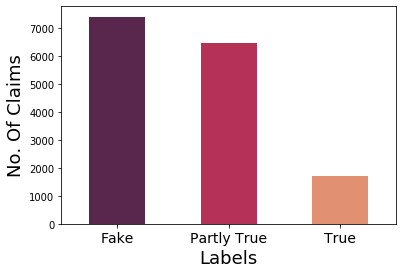

In [0]:
fig, ax = plt.subplots()

labels=df_meta.label.value_counts().tolist()
x=["Fake","Partly True","True"]
y=labels

sns.barplot(x,y,ax=ax,palette="rocket")



change_width(ax, .50)
plt.xticks(fontsize=14)
plt.xlabel("Labels",size=18)
plt.ylabel("No. Of Claims",size=18)
plt.show()


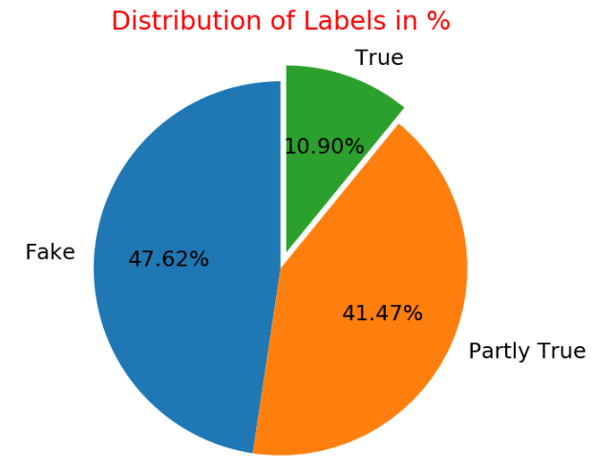

In [0]:
from IPython.display import display, Image
display(Image("Picture1.png"))

There is a class imbalance for the target class. Therefore we can either run some oversampling, undersampling or ensembling techniques to resolve this issue or use models that don't predict or depend too much on the majority value of the target class.

## Analysis of Claimant Label Wise

There are samples with no claimant. Let's analyze the data on the basis of claimant

In [0]:
# top 25 claimants
df_meta['claimant'].value_counts()[:25]

NA                  4962
Donald Trump        1233
Bloggers            372 
Barack Obama        234 
Hillary Clinton     220 
Viral image         127 
Facebook posts      108 
Ted Cruz            106 
Various websites    106 
Bernie Sanders      101 
Marco Rubio         97  
Scott Walker        90  
John McCain         88  
Rick Perry          77  
Rick Scott          73  
Chain email         71  
Facebook user       71  
multiple sources    70  
Mike Pence          60  
Jeb Bush            58  
Paul Ryan           51  
Multiple sources    50  
Vladimir Putin      44  
Charlie Crist       43  
Greg Abbott         43  
Name: claimant, dtype: int64

**No. of Null/None Values in total are pretty huge approx 5000**

###  Count of Claimants for Fake news

Total number of claimants that exist for Top 10 Fake news are =  7408
Total number of claimants actually present are =  4374


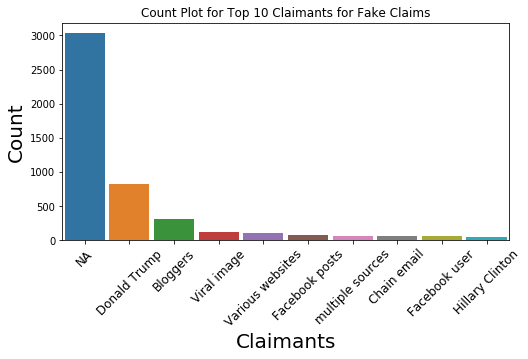

In [0]:
fig, ax = plt.subplots(figsize=(8,4))

claimants_fake=df_meta[["claimant","label"]][df_meta[["claimant","label"]]["label"]==0]["claimant"].value_counts()
fake_dict=dict(claimants_fake)
list(fake_dict.keys())
list(fake_dict.values())
print("Total number of claimants that exist for Top 10 Fake news are = ",sum(list(fake_dict.values())))
print ("Total number of claimants actually present are =  4374")
#plt.figure(figsize=(8,6.5))
sb.barplot(list(fake_dict.keys())[:10],list(fake_dict.values())[:10])


change_width(ax, .90)
plt.xticks(size = 12, rotation = 45)
#plt.yticks()
plt.title("Count Plot for Top 10 Claimants for Fake Claims")
#plt.legend()
plt.ylabel("Count",size=20)
plt.xlabel("Claimants",size=20)
plt.show()

Most false claims are made by unnamed claimants like Bloggers, Various websites, multiple sources etc.
Majority of false claims have no claimants (i.e. NA). 
Lets compare claimants present versus total claimants in the dataset:

Text(0.5, 1.0, 'Samples with actual claimants')

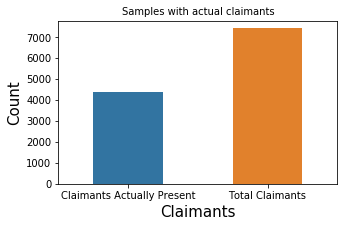

In [0]:
fig, ax = plt.subplots(figsize = (5,3))
sb.barplot(["Claimants Actually Present", "Total Claimants"],[4374,7408])
change_width(ax, .50)
plt.ylabel("Count",size=15)
plt.xlabel("Claimants",size=15)
plt.title("Samples with actual claimants", size = 10)

###  Count of Claimants for Partly True news

Total number of claimants that exist for Partly True news are =  6451
Total number of claimants actually present are =  5164


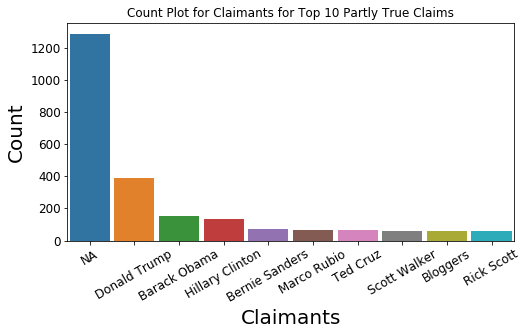

In [0]:
fig, ax = plt.subplots(figsize = (8,4))

claimants_partly_true=df_meta[["claimant","label"]][df_meta[["claimant","label"]]["label"]==1]["claimant"].value_counts()
partly_true_dict=dict(claimants_partly_true)
list(partly_true_dict.keys())
list(partly_true_dict.values())

print("Total number of claimants that exist for Partly True news are = ",sum(list(partly_true_dict.values())))
print ("Total number of claimants actually present are =  5164")

sb.barplot(list(partly_true_dict.keys())[:10],list(partly_true_dict.values())[:10] )

change_width(ax, 0.90)
plt.title("Count Plot for Claimants for Top 10 Partly True Claims")
plt.xticks(size=12, rotation = 30)
plt.yticks(size=12)
#plt.legend()
plt.ylabel("Count",size=20)
plt.xlabel("Claimants",size=20)
plt.show()

There are more claimants with names. Lets compare the claimants presence in this category:

Text(0.5, 1.0, 'Samples with actual claimants')

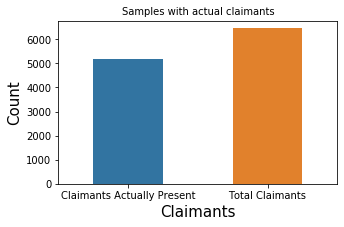

In [0]:
fig, ax = plt.subplots(figsize = (5,3))

sb.barplot(["Claimants Actually Present", "Total Claimants"],[5164,6451])
change_width(ax, .50)
plt.ylabel("Count",size=15)
plt.xlabel("Claimants",size=15)
plt.title("Samples with actual claimants", size = 10)

Total number of claimants that exist for Fake news are =  1696
Total number of claimants actually present are =  1055


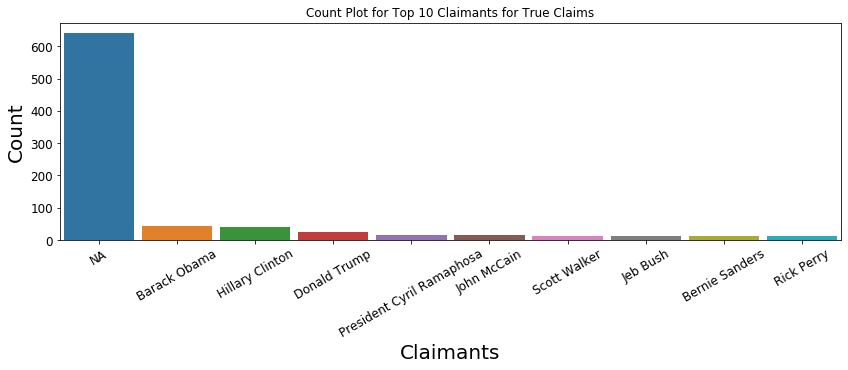

In [0]:
fig, ax = plt.subplots(figsize = (14,4))

claimants_true=df_meta[["claimant","label"]][df_meta[["claimant","label"]]["label"]==2]["claimant"].value_counts()
true_dict=dict(claimants_true)
list(true_dict.keys())
list(true_dict.values())

print("Total number of claimants that exist for Fake news are = ",sum(list(true_dict.values())))
print ("Total number of claimants actually present are =  1055")


sb.barplot(list(true_dict.keys())[:10],list(true_dict.values())[:10])

change_width(ax, 0.90)
plt.xticks(size=12, rotation = 30)
plt.yticks(size=12)
plt.title("Count Plot for Top 10 Claimants for True Claims")
#plt.legend()
plt.ylabel("Count",size=20)
plt.xlabel("Claimants",size=20)
plt.show()

We notice no unnamed claimants in the top 10 of true claims. 

Text(0.5, 1.0, 'Samples with actual claimants')

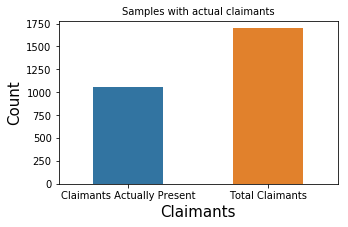

In [0]:
fig, ax = plt.subplots(figsize = (5,3))

sb.barplot(["Claimants Actually Present", "Total Claimants"],[1055,1696])
change_width(ax, .50)
plt.ylabel("Count",size=15)
plt.xlabel("Claimants",size=15)
plt.title("Samples with actual claimants", size = 10)

### Analysis of Related Articles

#### Number of Related articles per claim

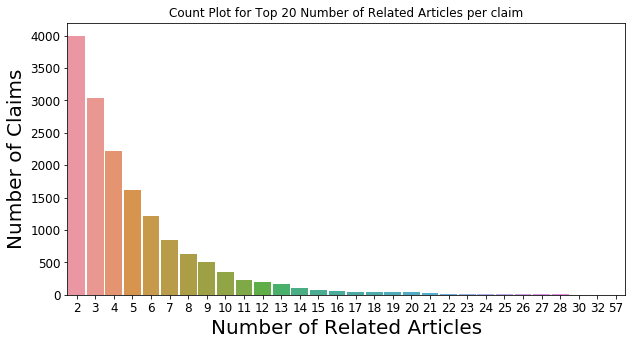

In [0]:
articles_length = df_meta['related_articles'].apply(lambda x: len(x)).value_counts()
fig, ax = plt.subplots(figsize = (10,5))

articles_length_dict=dict(articles_length)
list(articles_length_dict.keys())
list(articles_length_dict.values())


sb.barplot(list(articles_length_dict.keys())[:30],list(articles_length_dict.values())[:30] )

change_width(ax, 0.90)
plt.title("Count Plot for Top 20 Number of Related Articles per claim")
plt.xticks(size=12, rotation = 0)
plt.yticks(size=12)
#plt.legend()
plt.ylabel("Number of Claims",size=20)
plt.xlabel("Number of Related Articles",size=20)
plt.show()

We observe there are some claims that have related articles that can go as high as 57.

## Preprocessing of data

Before diving deeper into the claims and articles text, lets preprocess it by removing stop words, punctuation etc


In [0]:
df = df_meta

In [0]:
def remove_punctuation(input_text):
    input_text = input_text.lower()
    translation_table = dict.fromkeys(map(ord, st.punctuation), ' ')
    output_text = input_text.translate(translation_table)
    output_text = re.sub('([^\w^\s]+)','',output_text)
    return output_text

def lemmatize_sent(input_text):
    lemmatizer=WordNetLemmatizer()
    sent_split = input_text.split()
    #print(sent_split)
    output_text = ' '.join(lemmatizer.lemmatize(word) for word in sent_split)
    #print(output_text)
    return output_text

def remove_stopwords(input_text):
    pattern = re.compile(r'\b(' + r'|'.join(stopwords.words('english')) + r')\b\s*')
    output_text = pattern.sub('', input_text)
    return output_text

def preprocess_claims(input_text):
    sentence = lemmatize_sent(input_text)
    output_text = remove_stopwords(remove_punctuation(input_text))
    return output_text



def preprocess_articles(articles_list):
    all_sentences_list = []
    for article in articles_list:
        article_text = ""
        with open(os.path.join(ARTICLES_FILEPATH, '%d.txt' % article), encoding="utf8") as f:
            article_text = f.read()
        sentences_list = tokenize.sent_tokenize(article_text)
        sentences_list = list(map(lambda x:re.sub('([\n]+)',' ',x),sentences_list))
        sentences_list = list(map(lambda x: preprocess_claims(x),sentences_list))
        all_sentences_list = all_sentences_list + sentences_list
    return str(" ".join(all_sentences_list))
#    return all_sentences_list


def load_articles(articles_list):
    #print(articles_list)
    all_sentences_list = []
    for article in articles_list:
        sencentces_list = []
        sencentces_list.append(df_pre.preprocessed_articles['%d.txt' % article])
        all_sentences_list = all_sentences_list + sencentces_list
    #print(all_sentences_list)
    return str(" ".join(all_sentences_list))



In [0]:
if enablePreprocessing:
    df.loc[:,"preprocessed_claims"] = df["claim"].apply(lambda x:preprocess_claims(x)).copy()
    df.loc[:,"preprocessed_articles"] = df["related_articles"].apply(lambda x:preprocess_articles(x)).copy()
else:
    #df_pre = pd.read_csv(PREPROCESSED_ARTICLES, index_col='article_id')
    #df.loc[:,"preprocessed_articles"] = df["related_articles"].apply(lambda x:load_articles(x)).copy()
    df = pd.read_csv(ALL_PREPROCESSED)

## Word Cloud

In [0]:
def split_sentences(input_text):
    wordslist=[]
    for text in input_text:
        wordslist.append(text.split())
    new_list=[]
    for list in wordslist:
        new_list=new_list+list
    output_text=" ".join(new_list)
    return output_text 

**Fake News Word Analysis**

In [0]:
fake=df[df["label"]== 0]
fake_articles=fake["preprocessed_articles"].tolist()
fake_claims=fake["claim"].tolist()


In [0]:
stopwords=pd.read_csv("stop_words.txt", names = ['words'])['words'].to_list()

### Frequent Words in  Claims and Articles Associated with Fake Labels (0)

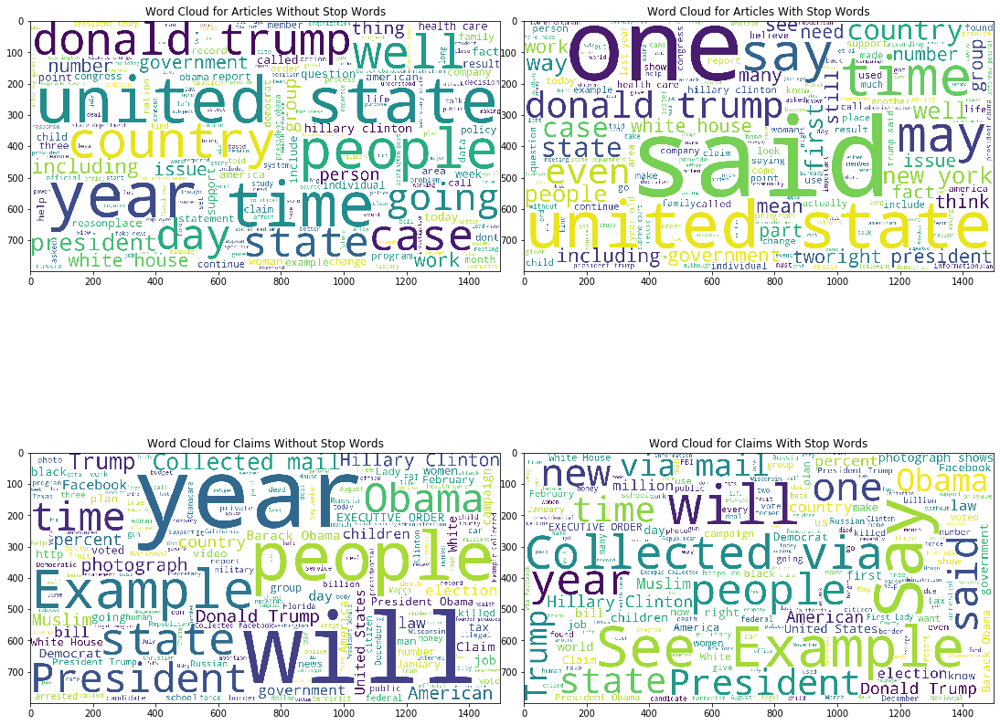

In [0]:
if enableWordCloudGeneration:
    fig, ax = plt.subplots(nrows=2, ncols=2, figsize = (15,15))

    #plt.figure(figsize=(30,10))
    wordcloud = WordCloud(width = 1500, height = 800, 
                    background_color ='white',  
                    min_font_size = 5,stopwords=stopwords).generate(split_sentences(fake_articles[:1500]))


    #plt.subplot(2,2,1)
    ax[0,0].imshow(wordcloud)
    ax[0,0].set_title('Word Cloud for Articles Without Stop Words')
    #ax[0,0].set_xlabel("Without Stop Words")
    #ax[0,0].axis("off")
    #ax[0,0].tight_layout(pad = 0) 
    #plt.show()

    #plt.figure(figsize=(20,10))
    wordcloud = WordCloud(width = 1500, height = 800, 
                    background_color ='white',  
                    min_font_size = 5,).generate(split_sentences(fake_articles[:1500]))



    ax[0,1].imshow(wordcloud)
    ax[0,1].set_title('Word Cloud for Articles With Stop Words')
    #ax[0,1].xlabel("With Stop Words")
    #ax[0,1].axis("off")
    #ax[0,1].tight_layout(pad = 0) 
    #plt.show()


    #plt.figure(figsize=(20,10))
    wordcloud = WordCloud(width = 1500, height = 800, 
                    background_color ='white',  
                    min_font_size = 5,stopwords=stopwords).generate(split_sentences(fake_claims[:1500]))


    #plt.subplot(2,2,3)
    ax[1,0].imshow(wordcloud)
    ax[1,0].set_title('Word Cloud for Claims Without Stop Words')
    #ax[1,0].xlabel("With Stop Words")
    #ax[1,0].axis("off")
    #ax[1,0].tight_layout(pad = 0) 
    #ax[1,0].show()


    #plt.figure(figsize=(20,10))
    wordcloud = WordCloud(width = 1500, height = 800, 
                    background_color ='white',  
                    min_font_size = 5,).generate(split_sentences(fake_claims[:1500]))


    #plt.subplot(2,2,4)
    ax[1,1].imshow(wordcloud)
    ax[1,1].set_title('Word Cloud for Claims With Stop Words')
    #ax[1,1].xlabel("With Stop Words")
    #ax[1,1].axis("off")
    #ax[1,1].tight_layout(pad = 0) 
    #plt.show()
    plt.tight_layout(pad = 0) 
else:
    from IPython.display import display, Image
    display(Image("images/wc_0.png"))

### Frequent Words in  Claims and Articles Associated with Partly True Labels (1)

In [0]:
partly_true=df[df["label"]== 1]
partly_true_articles=partly_true["preprocessed_articles"].tolist()
partly_true_claims=partly_true["claim"].tolist()


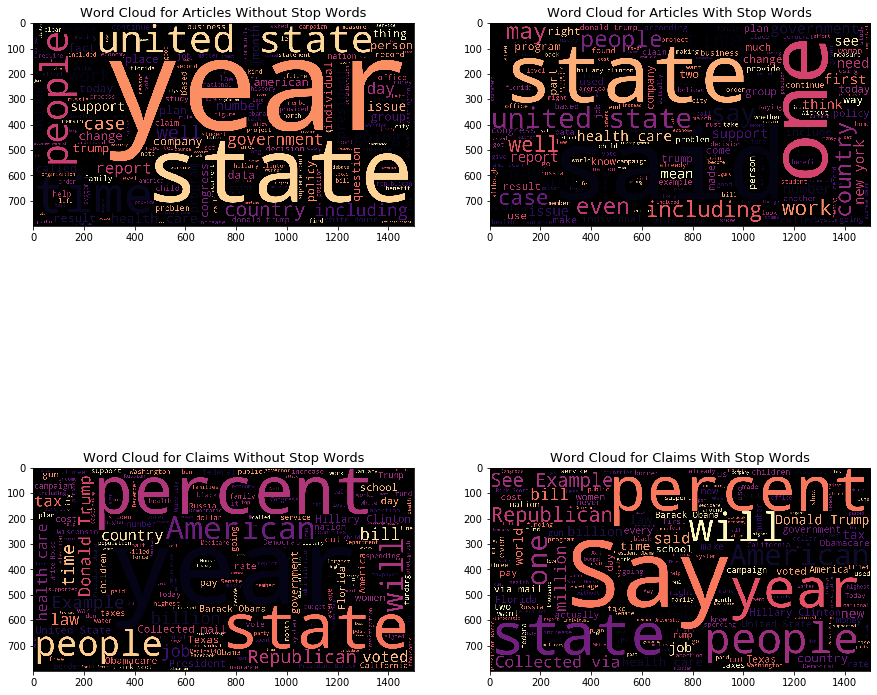

In [0]:
if enableWordCloudGeneration:
    fig, ax = plt.subplots(nrows=2, ncols=2, figsize = (15,15))

    #plt.figure(figsize=(30,10))
    wordcloud = WordCloud(width = 1500, height = 800, 
                    colormap='magma',  
                    min_font_size = 5,stopwords=stopwords).generate(split_sentences(partly_true_articles[:1500]))


    #plt.subplot(2,2,1)
    ax[0,0].imshow(wordcloud)
    ax[0,0].set_title('Word Cloud for Articles Without Stop Words',size=13)
    #ax[0,0].set_xlabel("Without Stop Words")
    #ax[0,0].axis("off")

    #plt.show()

    #plt.figure(figsize=(20,10))
    wordcloud = WordCloud(width = 1500, height = 800, 
                    colormap='magma',  
                    min_font_size = 5,).generate(split_sentences(partly_true_articles[:1500]))


    #ax[0,1].subplot(2,2,2)
    ax[0,1].imshow(wordcloud)
    ax[0,1].set_title('Word Cloud for Articles With Stop Words',size=13)
    #ax[0,1].xlabel("With Stop Words")
    #ax[0,1].axis("off")

    #plt.show()


    #plt.figure(figsize=(20,10))
    wordcloud = WordCloud(width = 1500, height = 800, 
                    colormap='magma', 
                    min_font_size = 5,stopwords=stopwords).generate(split_sentences(partly_true_claims[:1500]))


    #plt.subplot(2,2,3)
    ax[1,0].imshow(wordcloud)
    ax[1,0].set_title('Word Cloud for Claims Without Stop Words',size=13)
    #ax[1,0].xlabel("With Stop Words")
    #ax[1,0].axis("off")

    #ax[1,0].show()


    #plt.figure(figsize=(20,10))
    wordcloud = WordCloud(width = 1500, height = 800, 
                   colormap='magma', 
                    min_font_size = 5,).generate(split_sentences(partly_true_claims[:1500]))


    #plt.subplot(2,2,4)
    ax[1,1].imshow(wordcloud)
    ax[1,1].set_title('Word Cloud for Claims With Stop Words',size=13)
    #ax[1,1].xlabel("With Stop Words")
    #ax[1,1].axis("off")

    #plt.show()
    #plt.tight_layout(pad = 0) 
else:
    from IPython.display import display, Image
    display(Image("images/wc_1.png"))

### Frequent Words in  Claims and Articles Associated with True Labels (2)

In [0]:
true=df[df["label"]==2]
true_articles=true["preprocessed_articles"].tolist()
true_claims=true["claim"].tolist()

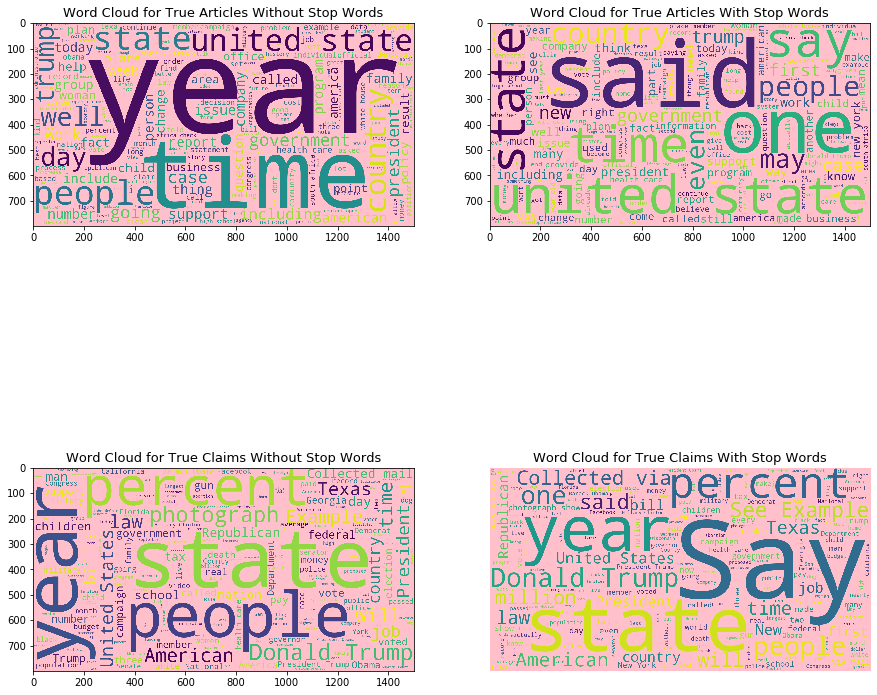

In [0]:
if enableWordCloudGeneration:
    fig, ax = plt.subplots(nrows=2, ncols=2, figsize = (15,15))

    #plt.figure(figsize=(30,10))
    wordcloud = WordCloud(width = 1500, height = 800, 
                    background_color ='pink',  
                    min_font_size = 5,stopwords=stopwords).generate(split_sentences(true_articles[:1500]))


    #plt.subplot(2,2,1)
    ax[0,0].imshow(wordcloud)
    ax[0,0].set_title('Word Cloud for True Articles Without Stop Words',size=13)
    #ax[0,0].set_xlabel("Without Stop Words")
    #ax[0,0].axis("off")

    #plt.show()

    #plt.figure(figsize=(20,10))
    wordcloud = WordCloud(width = 1500, height = 800, 
                    background_color ='pink',  
                    min_font_size = 5,).generate(split_sentences(true_articles[:1500]))


    #ax[0,1].subplot(2,2,2)
    ax[0,1].imshow(wordcloud)
    ax[0,1].set_title('Word Cloud for True Articles With Stop Words',size=13)
    #ax[0,1].xlabel("With Stop Words")
    #ax[0,1].axis("off")

    #plt.show()


    #plt.figure(figsize=(20,10))
    wordcloud = WordCloud(width = 1500, height = 800, 
                    background_color ='pink',  
                    min_font_size = 5,stopwords=stopwords).generate(split_sentences(true_claims[:1500]))


    #plt.subplot(2,2,3)
    ax[1,0].imshow(wordcloud)
    ax[1,0].set_title('Word Cloud for True Claims Without Stop Words',size=13)
    #ax[1,0].xlabel("With Stop Words")
    #ax[1,0].axis("off")

    #ax[1,0].show()


    #plt.figure(figsize=(20,10))
    wordcloud = WordCloud(width = 1500, height = 800, 
                    background_color ='pink',  
                    min_font_size = 5,).generate(split_sentences(true_claims[:1500]))


    #plt.subplot(2,2,4)
    ax[1,1].imshow(wordcloud)
    ax[1,1].set_title('Word Cloud for True Claims With Stop Words',size=13)
    #ax[1,1].xlabel("With Stop Words")
    #ax[1,1].axis("off")

    #plt.show()
    #plt.tight_layout(pad = 0) 
    plt.axis("off")
else:
    from IPython.display import display, Image
    display(Image("images/wc_2.png"))

In [0]:
def remove_punctuation(input_text):
    input_text = input_text.lower()
    translation_table = dict.fromkeys(map(ord, st.punctuation), ' ')
    output_text = input_text.translate(translation_table)
    output_text = re.sub('([^\w^\s]+)','',output_text)
    return output_text

def remove_stopwords(input_text):
    pattern = re.compile(r'\b(' + r'|'.join(stopwords.words('english')) + r')\b\s*')
    output_text = pattern.sub('', input_text)
    return output_text

def preprocess_claims(input_text):
    return remove_stopwords(remove_punctuation(input_text))

def get_ngrams(input_text,n):
    ngrams_list = []
    for ngram in ngrams(input_text.split(),n):
        ngrams_list.append(ngram)
    return ngrams_list

def load_articles(articles_list):
    #print(articles_list)
    all_sentences_list = []
    for article in articles_list:
        sencentces_list = []
        sencentces_list.append(df_pre.preprocessed_articles['%d.txt' % article])
        all_sentences_list = all_sentences_list + sencentces_list
    #print(all_sentences_list)
    return str(" ".join(all_sentences_list))
#    return all_sentences_list

def get_bigrams_count(c_bigram,a_bigram):
    count = 0
    for t in c_bigram:
        if t in a_bigram:
            count = count + 1
    return count

def get_word_count(str_articles, str_claim):
    if len([str_claim.strip()]) < 1:
        return [0]
    vectorizer = CountVectorizer()
    corpus = [str_claim]
    # learn the vocabulary and store CountVectorizer sparse matrix in X
    X = vectorizer.fit_transform(corpus)
    # columns of X correspond to the result of this method
    #vectorizer.get_feature_names() 
    # retrieving the matrix in the numpy form
    np_word_count = vectorizer.transform([str_articles]).toarray()
    #print(str_claim)
    #print(np_word_count)
    #ordered_word_count = []
    #for word in str_claim.split():
    #    if len(word)==1:
   #         continue
   #     index = vectorizer.vocabulary_.get(word)
    #    ordered_word_count.append(np_word_count[0][index])
        #print(word)
    #print(ordered_word_count)
    return np_word_count[0].tolist()

def get_missing_word_count(claim_len,bow_article):
    missing = 0
    #print("-----------------------------------------")
    #print(bow_article)
    #print(claim_len)
    for bow in bow_article:
        if bow==0:
            missing = missing + 1
    
    return round(missing/claim_len,3)

def get_bigram_present_count(bigram_article):
    present = 0
    for bigram in bigram_article:
        if bigram!=0:
            present = present + 1
    
    return round(present/len(bigram_article),3)

def get_trigram_present_count(trigram_article):
    present = 0
    for trigram in trigram_article:
        if trigram!=0:
            present = present + 1
    return round(present/len(trigram_article),3)

def get_lemmatized_str(words_str):
    #print(words_str)
    lemmatizer=WordNetLemmatizer()
    lemmatized_words_str = ' '.join([lemmatizer.lemmatize(w) for w in words_str.split()])
    #print(lemmatized_words_str)
    return lemmatized_words_str

def get_bigram_count(str_articles, str_claim):
    if len([str_claim.strip()]) < 2:
        return [0]
    vectorizer = CountVectorizer(ngram_range=(2,2))
    corpus = [str_claim]
    # learn the vocabulary and store CountVectorizer sparse matrix in X
    X = vectorizer.fit_transform(corpus)
    # columns of X correspond to the result of this method
    #vectorizer.get_feature_names() 
    # retrieving the matrix in the numpy form
    #print(vectorizer.get_feature_names())
    np_bigram_count = vectorizer.transform([str_articles]).toarray()
    return np_bigram_count[0].tolist()

def get_trigram_count(str_articles, str_claim):
    if len([str_claim.strip()]) < 2:
        return [0]
    vectorizer = CountVectorizer(ngram_range=(3,3))
    corpus = [str_claim]
    # learn the vocabulary and store CountVectorizer sparse matrix in X
    X = vectorizer.fit_transform(corpus)
    # columns of X correspond to the result of this method
    #vectorizer.get_feature_names() 
    # retrieving the matrix in the numpy form
    #print(vectorizer.get_feature_names())
    np_trigram_count = vectorizer.transform([str_articles]).toarray()
    return np_trigram_count[0].tolist()

def tfidf_word_count(str_articles, str_claim):
    #print(str_claim)
    corpus = [str_claim]
    vect = TfidfVectorizer()
    #print(corpus)
    X = vect.fit(corpus)
    weighted_word_count = X.transform([str_articles,str_claim])
    #print(X)
    #df_ = pd.DataFrame(weighted_word_count, 
                 # columns= vectorizer.get_feature_names(), 
                 # index=['str_articles', 'str_claim'])
    #print(df_)
    return weighted_word_count

def cosine_sim(str_articles, str_claim):
    a = tfidf_word_count(str_articles, str_claim)
    #print(a.shape)
    #print(type(a))
    #print((a.T).shape)
    #print(np.linalg.norm(a))
    #similarity_array = np.dot(a.T,a)/(np.linalg.norm(a))**2
    similarity_array = cosine_similarity(a[0,:],a[1,:])
    #similarity_array = cosine_similarity(str_articles,str_claim)
    return similarity_array

In [0]:
if enablePreprocessing:
    df.loc[:,"articles_len"] = df['related_articles'].apply(lambda x: len(x))
    df.loc[:,"articles_bow"] = df.apply(lambda x: get_word_count(x['preprocessed_articles'], x['preprocessed_claims']), axis=1).copy()
    df.loc[:,"articles_bigram_bow"] = df.apply(lambda x: get_bigram_count(x['preprocessed_articles'], x['preprocessed_claims']), axis=1).copy()
    df.loc[:,"articles_trigram_bow"] = df.apply(lambda x: get_trigram_count(x['preprocessed_articles'], x['preprocessed_claims']), axis=1).copy()
    df["claim_plus_articles"] = df["claim"] + df["preprocessed_articles"]
    df.loc[:,"f_unnamed_claimant"] = df["claimant"].apply(lambda x: 1 if (x=="Bloggers" or x=="Viral image" 
                                                          or x=="Various websites" or x=="Facebook posts"
                                                          or x=="multiple sources" or x=="Multiple sources"
                                                            or x=="NA" or x=="Viral meme" or x=="AFP Fact Check"
                                                        or x=="Social media posts")
                                                          else 0)
    df.loc[:,"f_bow_sum"] = df["articles_bow"].apply(sum)
    df.loc[:,"f_bow_avg"] = df["articles_bow"].apply(np.mean)
    df.loc[:,"f_bigram_bow_sum"] = df["articles_bigram_bow"].apply(sum)
    df.loc[:,"f_bigram_bow_avg"] = df["articles_bigram_bow"].apply(np.mean)
    df.loc[:,"f_trigram_bow_sum"] = df["articles_trigram_bow"].apply(sum)
    df.loc[:,"f_trigram_bow_avg"] = df["articles_trigram_bow"].apply(np.mean)
    df.loc[:,"f_c_percent_bigram_present"] = df.apply(lambda x: get_bigram_present_count(x['articles_bigram_bow']), axis=1)
    df.loc[:,"f_c_percent_trigram_present"] = df.apply(lambda x: get_trigram_present_count(x['articles_trigram_bow']), axis=1)
    df.loc[:,"f_c_wc"] = df["preprocessed_claims"].apply(lambda x: len([w for w in x.split()]))
    df.loc[:,"f_c_percent_missing"] = df.apply(lambda x: get_missing_word_count(x['f_c_wc'], x['articles_bow']), axis=1)
    df.loc[:,"f_a_len"] = df['related_articles'].apply(len)
    df.loc[:,"f_claimant_exists"] = df["claimant"].apply(lambda x: 0 if x=="NA" else 1)
    #df.loc[:,"f_cosine_similarity"] = df.apply(lambda x: cosine_sim(x['preprocessed_articles'], x['preprocessed_claims']), axis=1)

    df.loc[:,"f_cosine_similarity"] = df.apply(lambda x: cosine_sim(x['preprocessed_articles'], x['claim']), axis=1)
    df["f_cosine_similarity"]=df["f_cosine_similarity"].apply(lambda x:np.asscalar(x) )
    df["f_cosine_similarity"]=df["f_cosine_similarity"].apply(lambda x:round(x,1) )
    df[["f_cosine_similarity"]].fillna(0, inplace=True)

In [0]:
df.loc[:,'claim_plus_articles'] = df.claim + df.preprocessed_articles

In [0]:
columns_of_interest = ["claim","preprocessed_claims","label","articles_bow",
                       "f_bow_sum",# Sum of BOW of preprocessed claim tokens in all articles
                        "f_bigram_bow_sum",
            "f_bigram_bow_avg",
            "f_trigram_bow_sum",
            "f_trigram_bow_avg",
            "f_c_percent_bigram_present",
            "f_c_percent_trigram_present",
                       "f_bow_avg",# Average of BOW of preprocessed claim tokens in all articles
                       "f_c_wc",  # Count of preprocessed claim tokens
                       "f_a_len", # Count of related articles
                       "f_c_percent_missing", # Percent of tokens in preprocessed claim missing in all articles
                       "f_claimant_exists",
                       "f_cosine_similarity",
                       "f_unnamed_claimant"
                      ]
features = ["f_bow_sum",# Sum of BOW of preprocessed claim tokens in all articles
            "f_bow_avg",# Average of BOW of preprocessed claim tokens in all articles
            "f_bigram_bow_sum",
            "f_bigram_bow_avg",
            "f_trigram_bow_sum",
            "f_trigram_bow_avg",
            "f_c_percent_bigram_present",
            "f_c_percent_trigram_present",
            "f_claimant_exists",
            "f_cosine_similarity",
            "f_unnamed_claimant",
            "f_c_wc", # Count of preprocessed claim tokens
            "f_a_len", # Count of related articles
            "f_c_percent_missing", # Percent of tokens in preprocessed claim missing in all articles
            "f_claimant_exists" # 1 if Claimant exists else 0
           ]


## Models Preparation

In [0]:
df_staged = pd.DataFrame()
df_staged['Text'] = df["claim_plus_articles"]
df_staged['Label'] = df["label"]

X_train, X_test, y_train, y_test = train_test_split(df_staged['Text'], df_staged['Label'], test_size=0.2, random_state=7)

In [0]:
if enableTraining:
    tfidf_vectorizer = TfidfVectorizer(stop_words="english",ngram_range=(1, 3),lowercase=True,max_features=2000,max_df=0.7,min_df=0.1) 

    # Fit and transform the training data 
    tfidf1_train = tfidf_vectorizer.fit_transform(X_train)

    tfidf1_test = tfidf_vectorizer.transform(X_test)
else:
    tfidf1_test = scipy.sparse.load_npz('tfidf1_test.npz')
    tfidf1_train = scipy.sparse.load_npz('tfidf1_train.npz')


In [0]:
#scipy.sparse.save_npz('tfidf1_train.npz', tfidf1_train)
#scipy.sparse.save_npz('tfidf1_test.npz', tfidf1_test)


## Model Implementation

### Passive Aggressive

In [0]:
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

if enableTraining:
    pac=PassiveAggressiveClassifier(max_iter=100,C=0.1)
    pac.fit(tfidf1_train,y_train)
    #joblib.dump(pac, './pac.pkl') 
else:
    pac = joblib.load('./pac.pkl') 


['./pac.pkl']

In [0]:
pac = joblib.load('./pac.pkl') 
predictions = pac.predict(tfidf1_test)
from sklearn.metrics import classification_report
print(classification_report(predictions,y_test))

              precision    recall  f1-score   support

           0       0.66      0.64      0.65      1521
           1       0.66      0.54      0.60      1557
           2       0.03      0.36      0.06        33

    accuracy                           0.59      3111
   macro avg       0.45      0.51      0.43      3111
weighted avg       0.65      0.59      0.62      3111



### 3 Feature Extraction  +  Model Implementation

### Passive Agressive Algorithm

### Features are Extracted using different techniques  and each set of technique is applied on Passive Agressive Model

Dropping all the claimants with nan values. Since claims with nan values cant be replaced by anything because there is nothing we can find out about that what could be the claimants be. and withot having claimants how can we justify the fact that they are fake or real. once way can be if they do not have claimants they can be classified as fake ones.

### Feature 1 - Claimant Features + Tfidf

In [0]:
df=pd.read_csv("Fully Preprocessed articles.csv")

In [0]:
df=df.dropna(subset=['claimant'])

In [0]:
df.claimant.isnull().value_counts()

False    10593
Name: claimant, dtype: int64

In [0]:
df.claimant.unique()[:100]

array(['Hillary Clinton', 'Leonidas Raptakis', 'Jim Webb', 'Robin Vos',
       'Nick Schroer', 'Western Journal', 'Jonathan Saenz', 'Bloggers',
       'Mike Parson', 'Justin Amash', 'Multiple websites', 'Greg Casar',
       'Kay  Hagan', 'Jason Conger', 'Elizabeth Warren', 'Pat McCrory',
       'Kimberley Strassel', 'Vitaly Churkin', 'Donald Trump',
       'Will Weatherford', 'National Republican Congressional Committee',
       'Allen West', 'Ron Johnson', 'Ted Cruz', 'Glenn Beck',
       'Peter Barca', 'Vladimir Putin', 'Ron Meyer', 'Dave Hansen',
       'PuppetStringNews.com', 'Various websites', 'Cory Booker',
       'Andrew Cuomo', 'AmericanNews.com', 'African National Congress',
       'Texas State Employees Union', 'USA In Front', 'Mick Mulvaney',
       'Facebook user', 'Senate Leadership Fund', 'Club for Growth',
       'Mark Shields', 'Rob Cornilles', 'Jeb Bush', "Mark  O'Mara",
       'Positive Med', 'Snapple', 'Barack Obama', 'Chris Christie',
       'President Cyril Ramaph

In [0]:
df1=pd.get_dummies(df,columns=["claimant"])

Feature EXtracted based upon claimants

### Train Test Split

In [0]:
X=df1
y = df1.label
#y = y.astype('str')
X_train, X_test, Y_train, Y_test = train_test_split(X,y, test_size=0.2)
X_train.head()


,Unnamed: 0,claim,date,id,label,related_articles,articles_len,preprocessed_articles,all_preprocessed_articles,claim_plus_articles,...,claimant_religionmind.com,claimant_states-news.com,claimant_teaparty.org,claimant_therightwingportal.com,claimant_tmzbreaking,claimant_truthcommand.com,claimant_usaviralnews.info,claimant_whitehouse.gov,claimant_worldnewsdailyreport.com,claimant_Мikhail Aleksandrov
3751,3751,"""We have the highest murder rate in this count...",2016-10-28,4130,0,"[55872, 72063, 94787, 25989]",4,murders 10 8 biggest percentage increase sinc...,murders 10 8 biggest percentage increase sinc...,"""We have the highest murder rate in this count...",...,0,0,0,0,0,0,0,0,0,0
8287,8287,"The growth in health care costs ""has been rein...",2013-09-12,9143,1,"[9718, 3931, 3944, 3932, 3929, 7783, 7850, 704...",11,moran statement 1 2 billion premium savings ob...,moran statement 1 2 billion premium savings ob...,"The growth in health care costs ""has been rein...",...,0,0,0,0,0,0,0,0,0,0
12010,12010,"Claimed Sidney Blumenthal, a longtime adviser...",2016-10-12,13227,0,"[9620, 27314, 90, 60011, 27309, 85663, 85717, ...",12,truth hillary clinton wall street speeches two...,truth hillary clinton wall street speeches two...,"Claimed Sidney Blumenthal, a longtime adviser...",...,0,0,0,0,0,0,0,0,0,0
13857,13857,Says Filipino news organizations are part of a...,2019-04-22,15267,0,"[43277, 53187, 53186, 43278, 20648, 52957, 359...",21,oust duterte plot bared plot discredit preside...,oust duterte plot bared plot discredit preside...,Says Filipino news organizations are part of a...,...,0,0,0,0,0,0,0,0,0,0
11987,11987,Beer drinking is not allowed in any Illinois s...,2015-03-03,13200,0,"[96220, 5944, 81151, 4634]",4,event detail 03 04 15 joint committee financ...,event detail 03 04 15 joint committee financ...,Beer drinking is not allowed in any Illinois s...,...,0,0,0,0,0,0,0,0,0,0


In [0]:
tfidf_vectorizer = TfidfVectorizer(stop_words="english",ngram_range=(1, 1),lowercase=True,max_features=1000) 

# Fit and transform the training data 
tfidf1_train = tfidf_vectorizer.fit_transform(X_train["claim_plus_articles"]) 

# Transform the test set 
tfidf1_test = tfidf_vectorizer.transform(X_test["claim_plus_articles"])

In [0]:
features_train=np.concatenate((tfidf1_train.toarray(),X_train.iloc[:,1:].to_numpy()),axis=1)
features_test=np.concatenate((tfidf1_test.toarray(),X_test.iloc[:,1:].to_numpy()),axis=1)

In [0]:
features_train=pd.DataFrame(features_train)
features_test=pd.DataFrame(features_test)

In [0]:
features_train=features_train.fillna(0,axis=1)
features_test=features_test.fillna(0,axis=1)

In [0]:
features_train

,0,1,2,3,4,5,6,7,8,9,...,4103,4104,4105,4106,4107,4108,4109,4110,4111,4112
0,0.000000,0.039531,0.038575,0.016240,0.000000,0.007336,0.024855,0.016404,0.014831,0.000000,...,0,0,0,0,0,0,0,0,0,0
1,0.000000,0.000000,0.006677,0.001405,0.005149,0.003809,0.001434,0.001420,0.001283,0.001432,...,0,0,0,0,0,0,0,0,0,0
2,0.006557,0.027369,0.035369,0.013674,0.031730,0.008236,0.019534,0.016575,0.019981,0.010217,...,0,0,0,0,0,0,0,0,0,0
3,0.007408,0.020056,0.013047,0.000000,0.000000,0.007444,0.000000,0.012484,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
4,0.000000,0.007252,0.014153,0.000000,0.000000,0.016149,0.009119,0.009028,0.024486,0.000000,...,0,0,0,0,0,0,0,0,0,0
5,0.000000,0.035855,0.000000,0.000000,0.040474,0.000000,0.000000,0.022317,0.010089,0.011255,...,0,0,0,0,0,0,0,0,0,0
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
7,0.000000,0.049362,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
8,0.005671,0.056292,0.032459,0.063070,0.020219,0.031339,0.032176,0.031853,0.074877,0.038554,...,0,0,0,0,0,0,0,0,0,0
9,0.000000,0.031613,0.000000,0.019481,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0


In [0]:
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report



pac=PassiveAggressiveClassifier(max_iter=100,C=0.1)

pac.fit(features_train,Y_train)


y_pred=pac.predict(features_test)

y_predtrain=pac.predict(features_train)


print(classification_report(Y_test,y_pred))
print(classification_report(Y_train,y_predtrain))

print("train accuracy=",accuracy_score(Y_train,y_predtrain))
print("test accuracy=",accuracy_score(Y_test,y_pred))

This give score of 43 i have runned it once it worked but this need to be worked upon further this can help

### Feature 2 - Tfidf of Concatenation of claims and articles with N-gram(1,3)

In [0]:
df=pd.read_csv("Fully Preprocessed articles.csv")

In [0]:
df["claim_plus_articles"] = df["claim"] + df["all_preprocessed_articles"]

In [0]:
X=df[["claim_plus_articles"]]
y = df.label
#y = y.astype('str')
X_train, X_test, Y_train, Y_test = train_test_split(X,y, test_size=0.05)
X_train.head()



,claim_plus_articles
9352,"In Florida, ""the number of voters who now regi..."
12740,Says state’s mandated tests come from an Engli...
12142,Children have been fined for operating lemonad...
13748,"The IRS is going to be ""in charge"" of ""a huge ..."
9250,Sen. Robert Menendez is “on trial for corrupt...


In [0]:
tfidf_vectorizer = TfidfVectorizer(stop_words="english",ngram_range=(1, 3),lowercase=True,max_features=2000) 

# Fit and transform the training data 
tfidf1_train = tfidf_vectorizer.fit_transform(X_train["claim_plus_articles"]) 

# Transform the test set 
tfidf1_test = tfidf_vectorizer.transform(X_test["claim_plus_articles"])

In [0]:
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score


pac=PassiveAggressiveClassifier(max_iter=600,C=0.1)

pac.fit(tfidf1_train,Y_train)


y_pred=pac.predict(tfidf1_test)

y_predtrain=pac.predict(tfidf1_train)


print(classification_report(Y_test,y_pred))
print(classification_report(Y_train,y_predtrain))

print("train accuracy=",accuracy_score(Y_train,y_predtrain))
print("test accuracy=",accuracy_score(Y_test,y_pred))
print("F1 Score=",f1_score(Y_test,y_pred, average='macro'))

              precision    recall  f1-score   support

           0       0.66      0.69      0.68       379
           1       0.57      0.62      0.59       313
           2       0.21      0.10      0.14        86

   micro avg       0.60      0.60      0.60       778
   macro avg       0.48      0.47      0.47       778
weighted avg       0.58      0.60      0.58       778

              precision    recall  f1-score   support

           0       0.75      0.78      0.77      7029
           1       0.69      0.77      0.73      6138
           2       0.75      0.30      0.43      1610

   micro avg       0.72      0.72      0.72     14777
   macro avg       0.73      0.62      0.64     14777
weighted avg       0.73      0.72      0.71     14777

train accuracy= 0.7237598971374434
test accuracy= 0.5976863753213367
F1 Score= 0.4702284836116792


### Feature 2- Tfidf with N-gram(1,2)

In [0]:
tfidf_vectorizer = TfidfVectorizer(stop_words="english",ngram_range=(1, 2),lowercase=True,max_features=2000) 

# Fit and transform the training data 
tfidf1_train = tfidf_vectorizer.fit_transform(X_train["claim_plus_articles"]) 

# Transform the test set 
tfidf1_test = tfidf_vectorizer.transform(X_test["claim_plus_articles"])

In [0]:
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score


pac=PassiveAggressiveClassifier(max_iter=500,C=0.1)

pac.fit(tfidf1_train,Y_train)


y_pred=pac.predict(tfidf1_test)

y_predtrain=pac.predict(tfidf1_train)


print(classification_report(Y_test,y_pred))
print(classification_report(Y_train,y_predtrain))

print("train accuracy=",accuracy_score(Y_train,y_predtrain))
print("test accuracy=",accuracy_score(Y_test,y_pred))
print("F1 Score=",f1_score(Y_test,y_pred, average='macro'))

              precision    recall  f1-score   support

           0       0.63      0.61      0.62       228
           1       0.58      0.61      0.60       250
           2       0.15      0.13      0.14        52

   micro avg       0.56      0.56      0.56       530
   macro avg       0.45      0.45      0.45       530
weighted avg       0.56      0.56      0.56       530

              precision    recall  f1-score   support

           0       0.78      0.76      0.77      4146
           1       0.76      0.84      0.80      4914
           2       0.84      0.49      0.62      1003

   micro avg       0.77      0.77      0.77     10063
   macro avg       0.79      0.70      0.73     10063
weighted avg       0.78      0.77      0.77     10063

train accuracy= 0.7744211467753155
test accuracy= 0.5641509433962264
F1 Score= 0.4529078654808227


### Feature 3 -Tfidf with N-gram(1,1)

In [0]:
tfidf_vectorizer = TfidfVectorizer(stop_words="english",ngram_range=(1, 1),lowercase=True,max_features=2000) 

# Fit and transform the training data 
tfidf1_train = tfidf_vectorizer.fit_transform(X_train["claim_plus_articles"]) 

# Transform the test set 
tfidf1_test = tfidf_vectorizer.transform(X_test["claim_plus_articles"])

In [0]:
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score


pac=PassiveAggressiveClassifier(max_iter=500,C=0.1)

pac.fit(tfidf1_train,Y_train)


y_pred=pac.predict(tfidf1_test)

y_predtrain=pac.predict(tfidf1_train)


print(classification_report(Y_test,y_pred))
print(classification_report(Y_train,y_predtrain))

print("train accuracy=",accuracy_score(Y_train,y_predtrain))
print("test accuracy=",accuracy_score(Y_test,y_pred))
print("F1 Score=",f1_score(Y_test,y_pred, average='macro'))

              precision    recall  f1-score   support

           0       0.59      0.58      0.59       228
           1       0.57      0.61      0.59       250
           2       0.21      0.15      0.18        52

   micro avg       0.55      0.55      0.55       530
   macro avg       0.46      0.45      0.45       530
weighted avg       0.54      0.55      0.55       530

              precision    recall  f1-score   support

           0       0.78      0.76      0.77      4146
           1       0.76      0.84      0.80      4914
           2       0.81      0.50      0.62      1003

   micro avg       0.77      0.77      0.77     10063
   macro avg       0.78      0.70      0.73     10063
weighted avg       0.78      0.77      0.77     10063

train accuracy= 0.7731292855013415
test accuracy= 0.5528301886792453
F1 Score= 0.45096866096866095


### Feature 5 -Tfidf with N-gram(2,3)

In [0]:
tfidf_vectorizer = TfidfVectorizer(stop_words="english",ngram_range=(2, 3),lowercase=True,max_features=2000) 

# Fit and transform the training data 
tfidf1_train = tfidf_vectorizer.fit_transform(X_train["claim_plus_articles"]) 

# Transform the test set 
tfidf1_test = tfidf_vectorizer.transform(X_test["claim_plus_articles"])

In [0]:
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score


pac=PassiveAggressiveClassifier(max_iter=500,C=0.1)

pac.fit(tfidf1_train,Y_train)


y_pred=pac.predict(tfidf1_test)

y_predtrain=pac.predict(tfidf1_train)


print(classification_report(Y_test,y_pred))
print(classification_report(Y_train,y_predtrain))

print("train accuracy=",accuracy_score(Y_train,y_predtrain))
print("test accuracy=",accuracy_score(Y_test,y_pred))
print("F1 Score=",f1_score(Y_test,y_pred, average='macro'))

              precision    recall  f1-score   support

           0       0.63      0.59      0.61       228
           1       0.57      0.65      0.61       250
           2       0.09      0.06      0.07        52

   micro avg       0.57      0.57      0.57       530
   macro avg       0.43      0.43      0.43       530
weighted avg       0.55      0.57      0.56       530

              precision    recall  f1-score   support

           0       0.78      0.71      0.74      4146
           1       0.73      0.84      0.78      4914
           2       0.79      0.44      0.56      1003

   micro avg       0.75      0.75      0.75     10063
   macro avg       0.76      0.66      0.69     10063
weighted avg       0.75      0.75      0.74     10063

train accuracy= 0.7484845473516843
test accuracy= 0.5660377358490566
F1 Score= 0.42969720144205953


### Feature 4- Sentence based extraction  using Cosine Similarity + TFIDF

In [0]:
similarity=pd.read_csv("features_similarity_data.csv")

In [0]:
similarity=similarity.dropna(subset=["extracted_sentences"])

In [0]:
X=similarity[["extracted_sentences"]]
y = similarity.label
#y = y.astype('str')
X_train, X_test, Y_train, Y_test = train_test_split(X,y, test_size=0.05)
X_train.head()


,extracted_sentences
1563,development aid rises 2016 flows poorest count...
8795,jerusalem post newspaper online news israel\...
9610,murderer russian mp voronenkov identified vid...
12182,smoking kill great old op eds mike pence\n\...
2456,still increase rate gang deportations el salv...


In [0]:
tfidf_vectorizer = TfidfVectorizer(stop_words="english",ngram_range=(1, 2),lowercase=True,max_features=2000) 

# Fit and transform the training data 
tfidf1_train = tfidf_vectorizer.fit_transform(X_train["extracted_sentences"]) 

# Transform the test set 
tfidf1_test = tfidf_vectorizer.transform(X_test["extracted_sentences"])

In [0]:
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score


pac=PassiveAggressiveClassifier(max_iter=500,C=0.1)

pac.fit(tfidf1_train,Y_train)


y_pred=pac.predict(tfidf1_test)

y_predtrain=pac.predict(tfidf1_train)


print(classification_report(Y_test,y_pred))
print(classification_report(Y_train,y_predtrain))

print("train accuracy=",accuracy_score(Y_train,y_predtrain))
print("test accuracy=",accuracy_score(Y_test,y_pred))
print("F1 Score=",f1_score(Y_test,y_pred, average='macro'))

              precision    recall  f1-score   support

           0       0.55      0.63      0.58       355
           1       0.54      0.55      0.54       343
           2       0.06      0.01      0.02        74

   micro avg       0.53      0.53      0.53       772
   macro avg       0.38      0.40      0.38       772
weighted avg       0.50      0.53      0.51       772

              precision    recall  f1-score   support

           0       0.70      0.77      0.73      6980
           1       0.66      0.72      0.69      6065
           2       0.77      0.16      0.26      1604

   micro avg       0.68      0.68      0.68     14649
   macro avg       0.71      0.55      0.56     14649
weighted avg       0.69      0.68      0.66     14649

train accuracy= 0.682845245409243
test accuracy= 0.533678756476684
F1 Score= 0.3836319608780741


### Feature 5- Count Vectorizer - Tokens from concartenation of claims + articles

In [0]:
X=df[["claim_plus_articles"]]
y = df.label
#y = y.astype('str')
X_train, X_test, Y_train, Y_test = train_test_split(X,y, test_size=0.05)
X_train.shape


(14777, 1)

In [0]:
from sklearn.feature_extraction.text import CountVectorizer
cv_vectorizer = CountVectorizer(stop_words="english",ngram_range=(1, 1),lowercase=True,max_features=2000) 

# Fit and transform the training data 
cv_train = cv_vectorizer.fit_transform(X_train["claim_plus_articles"]) 

# Transform the test set 
cv_test = cv_vectorizer.transform(X_test["claim_plus_articles"])

In [0]:
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score


pac=PassiveAggressiveClassifier(max_iter=500,C=0.1)

pac.fit(cv_train,Y_train)


y_pred=pac.predict(cv_test)

y_predtrain=pac.predict(cv_train)


print(classification_report(Y_test,y_pred))
print(classification_report(Y_train,y_predtrain))

print("train accuracy=",accuracy_score(Y_train,y_predtrain))
print("test accuracy=",accuracy_score(Y_test,y_pred))
print("F1 Score=",f1_score(Y_test,y_pred, average='macro'))

              precision    recall  f1-score   support

           0       0.61      0.60      0.60       385
           1       0.52      0.55      0.54       300
           2       0.18      0.15      0.16        93

   micro avg       0.53      0.53      0.53       778
   macro avg       0.44      0.43      0.43       778
weighted avg       0.52      0.53      0.52       778

              precision    recall  f1-score   support

           0       0.67      0.68      0.67      7023
           1       0.61      0.62      0.62      6151
           2       0.39      0.31      0.34      1603

   micro avg       0.62      0.62      0.62     14777
   macro avg       0.55      0.54      0.54     14777
weighted avg       0.61      0.62      0.61     14777

train accuracy= 0.6179197401366989
test accuracy= 0.5282776349614395
F1 Score= 0.43438270988455746


### LSTM

In [0]:
from keras import backend as K

def recall_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

def precision_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

max_len = 150
max_words = 1000
tok = Tokenizer(num_words = max_words)

In [0]:
if enableTraining:
    tok.fit_on_texts(x_train)
    sequences = tok.texts_to_sequences(x_train)
    sequences_matrix = sequence.pad_sequences(sequences,maxlen = max_len)
    def fake_news_detector():
        inputs = Input(name = 'inputs', shape = [max_len])
        layer = Embedding(max_words, 50, input_length = max_len)(inputs)
        layer = LSTM(64)(layer)
        layer = Dense(256, name = 'FC1')(layer)
        layer = Activation('relu')(layer)
        layer = Dropout(0.5)(layer)
        layer = Dense(1, name = 'out_layer')(layer)
        layer = Activation('sigmoid')(layer)
        model = Model(inputs = inputs, outputs=layer)
        return model

    model = fake_news_detector()
    model.summary()
    model.compile(loss = 'binary_crossentropy',
                 optimizer = RMSprop(),
                 metrics=['acc',f1_m,precision_m, recall_m])
    model.fit(sequences_matrix,y_train,batch_size=128,epochs=10,
         validation_split=0.2,
         callbacks=[EarlyStopping(monitor='val_loss',
                                  min_delta=0.0001)])
    #model.save("lstm.model")

Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inputs (InputLayer)          (None, 150)               0         
_________________________________________________________________
embedding_6 (Embedding)      (None, 150, 50)           50000     
_________________________________________________________________
lstm_6 (LSTM)                (None, 64)                29440     
_________________________________________________________________
FC1 (Dense)                  (None, 256)               16640     
_________________________________________________________________
activation_11 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 256)               0         
_________________________________________________________________
out_layer (Dense)            (None, 1)                 257 

/Users/fahadk/GithubProjects/MIE1624-G12/project/venv/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Train on 9955 samples, validate on 2489 samples
Epoch 1/10
9955/9955 [==============================] - 14s 1ms/step - loss: 0.6400 - acc: 0.4679 - f1_m: 0.7044 - precision_m: 0.5697 - recall_m: 0.9443 - val_loss: 0.5884 - val_acc: 0.5360 - val_f1_m: 0.7376 - val_precision_m: 0.6365 - val_recall_m: 0.8812
Epoch 2/10
9955/9955 [==============================] - 13s 1ms/step - loss: 0.5788 - acc: 0.5566 - f1_m: 0.7361 - precision_m: 0.6476 - recall_m: 0.8623 - val_loss: 0.5930 - val_acc: 0.5175 - val_f1_m: 0.7285 - val_precision_m: 0.6072 - val_recall_m: 0.9138


In [0]:
if not enableTraining:
    lstm_model =  load_model('lstm.model',custom_objects={"f1_m": f1_m,"precision_m": precision_m, "recall_m": recall_m})

/Users/fahadk/GithubProjects/MIE1624-G12/project/venv/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


In [0]:
test_sequences = tok.texts_to_sequences(X_test)
test_sequences_matrix = sequence.pad_sequences(test_sequences,
                                              maxlen = max_len)

In [0]:
metrics = lstm_model.evaluate(test_sequences_matrix, y_test)

3111/3111 [==============================] - 1s 436us/step


In [0]:
print("Test set \n Loss : {:0.3f} \n Accuracy: {:0.3f} \n F1-Score: {:0.3f}". format(metrics[0],metrics[1],metrics[2]))

Test set 
 Loss : 0.630 
 Accuracy: 0.549 
 F1-Score: 0.707


### BERT

Extracting features for BERT

In [0]:
from numpy import *

In [0]:
def tfidf_word_count(str_articles, str_claim):
    #print(str_claim)
    corpus = [str_claim]
    vectorizer = TfidfVectorizer()
    #print(corpus)
    X = vectorizer.fit(corpus)
    weighted_word_count = X.transform([str_articles, str_claim])
    #print(X)
    #df_ = pd.DataFrame(weighted_word_count, 
                 # columns= vectorizer.get_feature_names(), 
                 # index=['str_articles', 'str_claim'])
    #print(df_)
    return weighted_word_count

def cosine_sim(str_articles, str_claim):
    a = tfidf_word_count(str_articles, str_claim)
    #print(a)
    #print((a.T).shape)
    #print(np.linalg.norm(a))
    #similarity_array = np.dot(a.T,a)/(np.linalg.norm(a))**2
    similarity_array = cs(a[1,:],a[0,:])
    similarity_array = pd.DataFrame(similarity_array)
    similarity_array.fillna(0, inplace = True)
    #print(type(similarity_array))
    cs_value = similarity_array[0][0]
    #print(cs_value)
    return cs_value.astype(float)

def extract_sent(row, input_list):
    similarity_values = []
    for i in input_list:
        similarity_values.append(cosine_sim(i, df.preprocessed_claims[row]))
    extract_sent = []
    for i,val in enumerate(similarity_values):
        if val != 0:
            index = similarity_values.index(val)
            extract_sent.append(input_list[index])
            similarity_values[i] = 0
    return extract_sent

In [0]:
if runBERT:
    sentences = []
    for row in range(df.shape[0]):
        b = ''
        a = extract_sent(row, df.preprocessed_articles[row])
        b = ' '.join(a)
        sentences.append(b)

In [0]:
if runBERT:
    df.loc[:,"extracted_sentences"] = sentences

In [0]:
if runBERT:
    df.to_csv('features_similarity_data.csv')

Using claims and articles together as a feature, which is further tokenized for processing in BERT

In [0]:
if runBERT:
    import datetime
    import json
    import os
    import pprint
    import random
    import string
    import sys
    import tensorflow as tf

    assert 'COLAB_TPU_ADDR' in os.environ, 'ERROR: Not connected to a TPU runtime; please see the first cell in this notebook for instructions!'
    TPU_ADDRESS = 'grpc://' + os.environ['COLAB_TPU_ADDR']
    print('TPU address is', TPU_ADDRESS)

    from google.colab import auth
    auth.authenticate_user()
    with tf.Session(TPU_ADDRESS) as session:
      print('TPU devices:')
      pprint.pprint(session.list_devices())

      # Upload credentials to TPU.
      with open('/content/adc.json', 'r') as f:
        auth_info = json.load(f)
      tf.contrib.cloud.configure_gcs(session, credentials=auth_info)
      # Now credentials are set for all future sessions on this TPU.

TPU address is grpc://10.125.92.34:8470
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

TPU devices:
[_DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:CPU:0, CPU, -1, 11452374956634768717),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 17179869184, 14767876405177737440),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:0, TPU, 17179869184, 2880003840165534059),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:1, TPU, 17179869184, 1222391867461389270),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:2, TPU, 17179869184, 16512559011697361686),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0

In [0]:
if runBERT:
    import sys

    !test -d bert_repo || git clone https://github.com/google-research/bert bert_repo
    if not 'bert_repo' in sys.path:
      sys.path += ['bert_repo']

    # import python modules defined by BERT
    import modeling
    import optimization
    import run_classifier
    import run_classifier_with_tfhub
    import tokenization
    import pandas as pd
    from sklearn.model_selection import train_test_split

    # import tfhub 
    import tensorflow_hub as hub


Cloning into 'bert_repo'...
remote: Enumerating objects: 336, done.
remote: Total 336 (delta 0), reused 0 (delta 0), pack-reused 336
Receiving objects: 100% (336/336), 283.40 KiB | 3.83 MiB/s, done.
Resolving deltas: 100% (185/185), done.



In [0]:
if runBERT:
    #using file from drive
    !pip install -U -q PyDrive
    from pydrive.auth import GoogleAuth
    from pydrive.drive import GoogleDrive
    from google.colab import auth
    from oauth2client.client import GoogleCredentials
    # Authenticate and create the PyDrive client.
    auth.authenticate_user()
    gauth = GoogleAuth()
    gauth.credentials = GoogleCredentials.get_application_default()
    drive = GoogleDrive(gauth)
    link = 'https://drive.google.com/open?id=1toB0cpmnLwhOZg1IPrZ0p1IsEgpP--sg' # The shareable link
    fluff, id = link.split('=')
    df['extracted_sentences'].fillna('0', inplace= True)
    df['text'] =  df.preprocessed_articles + df.preprocessed_claims

In [0]:
#downloaded = drive.CreateFile({'id':id}) 
#downloaded.GetContentFile('features_similarity_data.csv')  
#df = pd.read_csv('features_similarity_data.csv')

In [0]:
#dict(df[['label', 'extracted_sentences']].head(5))

In [0]:

df.head()

,Unnamed: 0,claim,claimant,date,id,label,related_articles,preprocessed_claims,preprocessed_articles,extracted_sentences,text
10530,10530,"""Major signs of voter fraud uncovered in Ohio.""",Various websites,2018-08-15,11606,0,"[27056, 27055, 53297]",major sign voter fraud uncovered ohio,['fraud left plans steal next election\ninves...,fraud left plans steal next election\ninvesti...,['fraud left plans steal next election\ninves...
13740,13740,"Says Jeb Bush ""once held $1 million in family ...",EMILY's List,2015-05-14,15141,1,"[20232, 91745, 91735, 95675, 10265, 93039, 720...",says jeb bush held 1 million family planning...,['affordable care act aca abstinence educati...,affordable care act aca abstinence education...,['affordable care act aca abstinence educati...
6528,6528,A photograph shows the heart of a child who co...,NaN,2019-03-27,7175,0,"[144396, 100173, 100658]",photograph show heart child contracted fatal c...,['heartworms humans causes symptoms diagnos...,heartworm larvae grow adult worms dogblood blo...,['heartworms humans causes symptoms diagnos...
5104,5104,"“Over the history of planet Earth, far and aw...",Rep. Mo Brooks,2018-05-25,5614,0,"[22334, 38085, 28044, 21177, 95339, 38011, 698...",history planet earth far away 1 cause sea lev...,['evidence found planet cooling asteroid\nron ...,evidence found planet cooling asteroid\nron bl...,['evidence found planet cooling asteroid\nron ...
12138,12138,"""Big rooftop solar's plan forces Nevada famili...",Solar Energy Fairness,2016-04-13,13370,1,"[76407, 90056, 90356, 8140, 90000, 8136, 8135,...",big rooftop solar plan force nevada family do...,['solarcity opens las vegas headquarters town ...,solarcity san mateo calif based solar compa...,['solarcity opens las vegas headquarters town ...


In [0]:
if runBERT:
    TASK = 'MRPC' #@param {type:"string"}
    assert TASK in ('MRPC', 'CoLA'), 'Only (MRPC, CoLA) are demonstrated here.'

    # Download glue data.
    #! test -d download_glue_repo || git clone https://gist.github.com/60c2bdb54d156a41194446737ce03e2e.git download_glue_repo
    #!python download_glue_repo/download_glue_data.py --data_dir='glue_data' --tasks=$TASK

    #TASK_DATA_DIR = 'Files/' + TASK
    #print('***** Task data directory: {} *****'.format(TASK_DATA_DIR))
    #!ls $TASK_DATA_DIR

    BUCKET = '__' #@param {type:"string"}
    assert BUCKET, 'Must specify an existing GCS bucket name'
    OUTPUT_DIR = 'gs://{}/bert-tfhub/models/{}'.format(BUCKET, TASK)
    tf.gfile.MakeDirs(OUTPUT_DIR)
    print('***** Model output directory: {} *****'.format(OUTPUT_DIR))

    # Available pretrained model checkpoints:
    #   uncased_L-12_H-768_A-12: uncased BERT base model
    #   uncased_L-24_H-1024_A-16: uncased BERT large model
    #   cased_L-12_H-768_A-12: cased BERT large model
    BERT_MODEL = 'uncased_L-12_H-768_A-12' #@param {type:"string"}
    BERT_MODEL_HUB = 'https://tfhub.dev/google/bert_' + BERT_MODEL + '/1'

***** Model output directory: gs://fake_fact/bert-tfhub/models/MRPC *****


In [0]:
if runBERT:
    tokenizer = run_classifier_with_tfhub.create_tokenizer_from_hub_module(BERT_MODEL_HUB)
    tokenizer.tokenize("This here's an example of using the BERT tokenizer")

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


['this',
 'here',
 "'",
 's',
 'an',
 'example',
 'of',
 'using',
 'the',
 'bert',
 'token',
 '##izer']

In [0]:
if runBERT:
    df = df.sample(frac = 1)
    X_train, X_test, y_train, y_test = train_test_split(df["text"], df["label"], test_size=0.3, random_state=42)

In [0]:
X_test.shape

(4667,)

In [0]:
def create_examples(lines, set_type, labels=None):
#Generate data for the BERT model
    guid = f'{set_type}'
    examples = []
    if guid == 'train':
        for line, label in zip(lines, labels):
            text_a = line
            label = str(label)
            examples.append(
              run_classifier.InputExample(guid=guid, text_a=text_a, text_b=None, label=label))
    else:
        for line in lines:
            text_a = line
            label = '0'
            examples.append(
              run_classifier.InputExample(guid=guid, text_a=text_a, text_b=None, label=label))
    return examples

In [0]:
if runBERT:
    TRAIN_BATCH_SIZE = 32
    EVAL_BATCH_SIZE = 8
    PREDICT_BATCH_SIZE = 8
    LEARNING_RATE = 2e-5
    NUM_TRAIN_EPOCHS = 50
    MAX_SEQ_LENGTH = 200
    # Warmup is a period of time where hte learning rate 
    # is small and gradually increases--usually helps training.
    WARMUP_PROPORTION = 0.1
    # Model configs
    SAVE_CHECKPOINTS_STEPS = 1000
    SAVE_SUMMARY_STEPS = 500

    #processors = {
    #  "cola": run_classifier.ColaProcessor,
    #  "mnli": run_classifier.MnliProcessor,
    #  "mrpc": run_classifier.MrpcProcessor,
    #}
    #processor = processors[TASK.lower()]()
    label_list = [str(num) for num in range(3)]

    # Compute number of train and warmup steps from batch size
    #train_examples = processor.get_train_examples(X_train)
    train_examples = create_examples(X_train, 'train', labels=y_train)
    num_train_steps = int(len(train_examples) / TRAIN_BATCH_SIZE * NUM_TRAIN_EPOCHS)
    num_warmup_steps = int(num_train_steps * WARMUP_PROPORTION)

    # Setup TPU related config
    tpu_cluster_resolver = tf.contrib.cluster_resolver.TPUClusterResolver(TPU_ADDRESS)
    NUM_TPU_CORES = 8
    ITERATIONS_PER_LOOP = 1000

    def get_run_config(output_dir):
      return tf.contrib.tpu.RunConfig(
        cluster=tpu_cluster_resolver,
        model_dir=output_dir,
        save_checkpoints_steps=SAVE_CHECKPOINTS_STEPS,
        tpu_config=tf.contrib.tpu.TPUConfig(
            iterations_per_loop=ITERATIONS_PER_LOOP,
            num_shards=NUM_TPU_CORES,
            per_host_input_for_training=tf.contrib.tpu.InputPipelineConfig.PER_HOST_V2))


In [0]:
if runBERT:
    # Force TF Hub writes to the GS bucket we provide.
    os.environ['TFHUB_CACHE_DIR'] = OUTPUT_DIR

    model_fn = run_classifier_with_tfhub.model_fn_builder(
      num_labels=len(label_list),
      learning_rate=LEARNING_RATE,
      num_train_steps=num_train_steps,
      num_warmup_steps=num_warmup_steps,
      use_tpu=True,
      bert_hub_module_handle=BERT_MODEL_HUB
    )

    estimator_from_tfhub = tf.contrib.tpu.TPUEstimator(
      use_tpu=True,
      model_fn=model_fn,
      config=get_run_config(OUTPUT_DIR),
      train_batch_size=TRAIN_BATCH_SIZE,
      eval_batch_size=EVAL_BATCH_SIZE,
      predict_batch_size=PREDICT_BATCH_SIZE,
    )

    estimator = tf.contrib.tpu.TPUEstimator(
     use_tpu=True,
      model_fn=model_fn,
      config=get_run_config(OUTPUT_DIR),
      train_batch_size=TRAIN_BATCH_SIZE,
      eval_batch_size=EVAL_BATCH_SIZE,
      predict_batch_size=PREDICT_BATCH_SIZE,
      )


INFO:tensorflow:Using config: {'_model_dir': 'gs://fake_fact/bert-tfhub/models/MRPC', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': 1000, '_save_checkpoints_secs': None, '_session_config': allow_soft_placement: true
cluster_def {
  job {
    name: "worker"
    tasks {
      key: 0
      value: "10.125.92.34:8470"
    }
  }
}
isolate_session_state: true
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': None, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f49bdd2d3c8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': 'grpc://10.125.92.34:8470', '_evaluation_master': 'grpc://10.125.92.34:8470', '_is_chief': True, '_num_ps_re

INFO:tensorflow:Using config: {'_model_dir': 'gs://fake_fact/bert-tfhub/models/MRPC', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': 1000, '_save_checkpoints_secs': None, '_session_config': allow_soft_placement: true
cluster_def {
  job {
    name: "worker"
    tasks {
      key: 0
      value: "10.125.92.34:8470"
    }
  }
}
isolate_session_state: true
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': None, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f49bdd2d3c8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': 'grpc://10.125.92.34:8470', '_evaluation_master': 'grpc://10.125.92.34:8470', '_is_chief': True, '_num_ps_re

INFO:tensorflow:_TPUContext: eval_on_tpu True


INFO:tensorflow:_TPUContext: eval_on_tpu True


INFO:tensorflow:Using config: {'_model_dir': 'gs://fake_fact/bert-tfhub/models/MRPC', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': 1000, '_save_checkpoints_secs': None, '_session_config': allow_soft_placement: true
cluster_def {
  job {
    name: "worker"
    tasks {
      key: 0
      value: "10.125.92.34:8470"
    }
  }
}
isolate_session_state: true
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': None, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f49bcaba710>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': 'grpc://10.125.92.34:8470', '_evaluation_master': 'grpc://10.125.92.34:8470', '_is_chief': True, '_num_ps_re

INFO:tensorflow:Using config: {'_model_dir': 'gs://fake_fact/bert-tfhub/models/MRPC', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': 1000, '_save_checkpoints_secs': None, '_session_config': allow_soft_placement: true
cluster_def {
  job {
    name: "worker"
    tasks {
      key: 0
      value: "10.125.92.34:8470"
    }
  }
}
isolate_session_state: true
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': None, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f49bcaba710>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': 'grpc://10.125.92.34:8470', '_evaluation_master': 'grpc://10.125.92.34:8470', '_is_chief': True, '_num_ps_re

INFO:tensorflow:_TPUContext: eval_on_tpu True


INFO:tensorflow:_TPUContext: eval_on_tpu True


In [0]:
# Train the model
def model_train(estimator):
  print('MRPC/CoLA on BERT base model normally takes about 2-3 minutes. Please wait...')
  # We'll set sequences to be at most 128 tokens long.
  train_features = run_classifier.convert_examples_to_features(
      train_examples, label_list, MAX_SEQ_LENGTH, tokenizer)
  print('***** Started training at {} *****'.format(datetime.datetime.now()))
  print('  Num examples = {}'.format(len(train_examples)))
  print('  Batch size = {}'.format(TRAIN_BATCH_SIZE))
  tf.logging.info("  Num steps = %d", num_train_steps)
  train_input_fn = run_classifier.input_fn_builder(
      features=train_features,
      seq_length=MAX_SEQ_LENGTH,
      is_training=True,
      drop_remainder=True)
  estimator.train(input_fn=train_input_fn, max_steps=num_train_steps)
  print('***** Finished training at {} *****'.format(datetime.datetime.now()))



In [0]:
if runBERT:
    model_train(estimator_from_tfhub)

MRPC/CoLA on BERT base model normally takes about 2-3 minutes. Please wait...



INFO:tensorflow:Writing example 0 of 10888


INFO:tensorflow:Writing example 0 of 10888


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] [ ' thomas library congress \ n ##bill summary status \ n \ n ##11 ##1 ##th congress 2009 2010 \ n \ nh r 35 ##90 \ n \ n link http hd ##l lo ##c gov lo ##c usc ##ong ##ress legislation 111 ##hr ##35 ##90 title thomas bill summary status h r 35 ##90 \ n \ np ##ati ##ent protection affordable care act rep range ##l charles b ' , ' ny 15 introduced 9 17 2009 co ##sp ##ons ##ors 40 became public law 111 148 gp ##o text h r 48 ##7 ##2 makes number health related financing revenue changes bill ' , ' read together bill health care related provisions h r 48 ##7 ##2 commonly referred affordable care act ac ##a ' ] fail buy health insurance obama ##care face threat jail time [SEP]


INFO:tensorflow:tokens: [CLS] [ ' thomas library congress \ n ##bill summary status \ n \ n ##11 ##1 ##th congress 2009 2010 \ n \ nh r 35 ##90 \ n \ n link http hd ##l lo ##c gov lo ##c usc ##ong ##ress legislation 111 ##hr ##35 ##90 title thomas bill summary status h r 35 ##90 \ n \ np ##ati ##ent protection affordable care act rep range ##l charles b ' , ' ny 15 introduced 9 17 2009 co ##sp ##ons ##ors 40 became public law 111 148 gp ##o text h r 48 ##7 ##2 makes number health related financing revenue changes bill ' , ' read together bill health care related provisions h r 48 ##7 ##2 commonly referred affordable care act ac ##a ' ] fail buy health insurance obama ##care face threat jail time [SEP]


INFO:tensorflow:input_ids: 101 1031 1005 2726 3075 3519 1032 1050 24457 12654 3570 1032 1050 1032 1050 14526 2487 2705 3519 2268 2230 1032 1050 1032 18699 1054 3486 21057 1032 1050 1032 1050 4957 8299 10751 2140 8840 2278 18079 8840 2278 15529 5063 8303 6094 11118 8093 19481 21057 2516 2726 3021 12654 3570 1044 1054 3486 21057 1032 1050 1032 27937 10450 4765 3860 15184 2729 2552 16360 2846 2140 2798 1038 1005 1010 1005 6396 2321 3107 1023 2459 2268 2522 13102 5644 5668 2871 2150 2270 2375 11118 16459 14246 2080 3793 1044 1054 4466 2581 2475 3084 2193 2740 3141 12135 6599 3431 3021 1005 1010 1005 3191 2362 3021 2740 2729 3141 8910 1044 1054 4466 2581 2475 4141 3615 15184 2729 2552 9353 2050 1005 1033 8246 4965 2740 5427 8112 16302 2227 5081 7173 2051 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1031 1005 2726 3075 3519 1032 1050 24457 12654 3570 1032 1050 1032 1050 14526 2487 2705 3519 2268 2230 1032 1050 1032 18699 1054 3486 21057 1032 1050 1032 1050 4957 8299 10751 2140 8840 2278 18079 8840 2278 15529 5063 8303 6094 11118 8093 19481 21057 2516 2726 3021 12654 3570 1044 1054 3486 21057 1032 1050 1032 27937 10450 4765 3860 15184 2729 2552 16360 2846 2140 2798 1038 1005 1010 1005 6396 2321 3107 1023 2459 2268 2522 13102 5644 5668 2871 2150 2270 2375 11118 16459 14246 2080 3793 1044 1054 4466 2581 2475 3084 2193 2740 3141 12135 6599 3431 3021 1005 1010 1005 3191 2362 3021 2740 2729 3141 8910 1044 1054 4466 2581 2475 4141 3615 15184 2729 2552 9353 2050 1005 1033 8246 4965 2740 5427 8112 16302 2227 5081 7173 2051 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] [ ' paul ryan plan change medicare looks lot like obama ##care \ n \ ne ##nl ##ar ##ge image to ##ggle capt ##ion mark wilson get ##ty images mark wilson get ##ty images \ n \ npr ##es ##ide ##nt elect donald trump house speaker paul ryan agree repeal ##ing affordable care act replacing health insurance system top priority ' , ' disagree whether overhaul ##ing medicare part plan ' , ' medicare government run health system people age 65 older disabled ' , ' trump said little medicare campaign promise cut ' , ' ryan hand medicare sights ' , ' obama ##care medicare going broke ryan said interview fox news nov 10 ' , ' deal issues going repeal replace obama ##care ' , ' fact opposite appears true obama ##care may actually extended life medicare ' , ' year medicare trustees report says program would able pay bills 202 ##8 full 11 years longer 2009 forecast improvement medicare trustees attribute part changes medicare called affordable care act economic factors 

INFO:tensorflow:tokens: [CLS] [ ' paul ryan plan change medicare looks lot like obama ##care \ n \ ne ##nl ##ar ##ge image to ##ggle capt ##ion mark wilson get ##ty images mark wilson get ##ty images \ n \ npr ##es ##ide ##nt elect donald trump house speaker paul ryan agree repeal ##ing affordable care act replacing health insurance system top priority ' , ' disagree whether overhaul ##ing medicare part plan ' , ' medicare government run health system people age 65 older disabled ' , ' trump said little medicare campaign promise cut ' , ' ryan hand medicare sights ' , ' obama ##care medicare going broke ryan said interview fox news nov 10 ' , ' deal issues going repeal replace obama ##care ' , ' fact opposite appears true obama ##care may actually extended life medicare ' , ' year medicare trustees report says program would able pay bills 202 ##8 full 11 years longer 2009 forecast improvement medicare trustees attribute part changes medicare called affordable care act economic factors 

INFO:tensorflow:input_ids: 101 1031 1005 2703 4575 2933 2689 27615 3504 2843 2066 8112 16302 1032 1050 1032 11265 20554 2906 3351 3746 2000 24679 14408 3258 2928 4267 2131 3723 4871 2928 4267 2131 3723 4871 1032 1050 1032 21411 2229 5178 3372 11322 6221 8398 2160 5882 2703 4575 5993 21825 2075 15184 2729 2552 6419 2740 5427 2291 2327 9470 1005 1010 1005 21090 3251 18181 2075 27615 2112 2933 1005 1010 1005 27615 2231 2448 2740 2291 2111 2287 3515 3080 9776 1005 1010 1005 8398 2056 2210 27615 3049 4872 3013 1005 1010 1005 4575 2192 27615 15925 1005 1010 1005 8112 16302 27615 2183 3631 4575 2056 4357 4419 2739 13292 2184 1005 1010 1005 3066 3314 2183 21825 5672 8112 16302 1005 1010 1005 2755 4500 3544 2995 8112 16302 2089 2941 3668 2166 27615 1005 1010 1005 2095 27615 9360 3189 2758 2565 2052 2583 3477 8236 16798 2620 2440 2340 2086 2936 2268 19939 7620 27615 9360 17961 2112 3431 27615 2170 15184 2729 2552 3171 5876 1005 1010 1005 19728 4575 27615 2933 2360 2740 3343 18288 2052 2735 2231 

INFO:tensorflow:input_ids: 101 1031 1005 2703 4575 2933 2689 27615 3504 2843 2066 8112 16302 1032 1050 1032 11265 20554 2906 3351 3746 2000 24679 14408 3258 2928 4267 2131 3723 4871 2928 4267 2131 3723 4871 1032 1050 1032 21411 2229 5178 3372 11322 6221 8398 2160 5882 2703 4575 5993 21825 2075 15184 2729 2552 6419 2740 5427 2291 2327 9470 1005 1010 1005 21090 3251 18181 2075 27615 2112 2933 1005 1010 1005 27615 2231 2448 2740 2291 2111 2287 3515 3080 9776 1005 1010 1005 8398 2056 2210 27615 3049 4872 3013 1005 1010 1005 4575 2192 27615 15925 1005 1010 1005 8112 16302 27615 2183 3631 4575 2056 4357 4419 2739 13292 2184 1005 1010 1005 3066 3314 2183 21825 5672 8112 16302 1005 1010 1005 2755 4500 3544 2995 8112 16302 2089 2941 3668 2166 27615 1005 1010 1005 2095 27615 9360 3189 2758 2565 2052 2583 3477 8236 16798 2620 2440 2340 2086 2936 2268 19939 7620 27615 9360 17961 2112 3431 27615 2170 15184 2729 2552 3171 5876 1005 1010 1005 19728 4575 27615 2933 2360 2740 3343 18288 2052 2735 2231 

INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 2 (id = 2)


INFO:tensorflow:label: 2 (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] [ ' 81 dame ju ##di den ##ch gets first tattoo \ n practical joke ju ##di den ##ch fake tattoo harvey wei ##nstein ##name applied der ##rier ##e ' , ' spun ##ky english actress credited studio head rev ##iving career u via wei ##nstein titles like cho ##cola ##t iris mrs henderson presents notes scandal ##ear ##ned oscar nominations ##sha ##kes ##pe ##are love den ##ch supporting actress oscar 1999 ' , ' committed performance den ##ch unveiled faux ink four seasons lunch wei ##nstein charlie rose ' , ' recalled actress never seen man embarrassed age 81 den ##ch gone ahead gotten tattoo real ' , ' get wei ##nstein ##name immortal ##ly etched arm though ' , ' instead got words carp ##e die ##m inscribed wrist gift daughter fin ##ty williams ' , ' interview surrey life den ##ch explained ink motto seize day ' , ' fin ##ty gave 81 ##st birthday ##won ##der ##ful surprises \ n \ n ##den ##ch previously told good house ##keeping toy ##ing idea getting actual tat

INFO:tensorflow:tokens: [CLS] [ ' 81 dame ju ##di den ##ch gets first tattoo \ n practical joke ju ##di den ##ch fake tattoo harvey wei ##nstein ##name applied der ##rier ##e ' , ' spun ##ky english actress credited studio head rev ##iving career u via wei ##nstein titles like cho ##cola ##t iris mrs henderson presents notes scandal ##ear ##ned oscar nominations ##sha ##kes ##pe ##are love den ##ch supporting actress oscar 1999 ' , ' committed performance den ##ch unveiled faux ink four seasons lunch wei ##nstein charlie rose ' , ' recalled actress never seen man embarrassed age 81 den ##ch gone ahead gotten tattoo real ' , ' get wei ##nstein ##name immortal ##ly etched arm though ' , ' instead got words carp ##e die ##m inscribed wrist gift daughter fin ##ty williams ' , ' interview surrey life den ##ch explained ink motto seize day ' , ' fin ##ty gave 81 ##st birthday ##won ##der ##ful surprises \ n \ n ##den ##ch previously told good house ##keeping toy ##ing idea getting actual tat

INFO:tensorflow:input_ids: 101 1031 1005 6282 8214 18414 4305 7939 2818 4152 2034 11660 1032 1050 6742 8257 18414 4305 7939 2818 8275 11660 7702 11417 15493 18442 4162 4315 16252 2063 1005 1010 1005 7455 4801 2394 3883 5827 2996 2132 7065 14966 2476 1057 3081 11417 15493 4486 2066 16480 26289 2102 11173 3680 9481 7534 3964 9446 14644 7228 7436 9930 7377 9681 5051 12069 2293 7939 2818 4637 3883 7436 2639 1005 1010 1005 5462 2836 7939 2818 11521 29276 10710 2176 3692 6265 11417 15493 4918 3123 1005 1010 1005 7383 3883 2196 2464 2158 10339 2287 6282 7939 2818 2908 3805 5407 11660 2613 1005 1010 1005 2131 11417 15493 18442 12147 2135 20286 2849 2295 1005 1010 1005 2612 2288 2616 29267 2063 3280 2213 14551 7223 5592 2684 10346 3723 3766 1005 1010 1005 4357 9948 2166 7939 2818 4541 10710 12652 15126 2154 1005 1010 1005 10346 3723 2435 6282 3367 5798 19291 4063 3993 20096 1032 1050 1032 1050 4181 2818 3130 2409 2204 2160 18321 9121 2075 2801 2893 5025 11660 2028 13431 1005 1010 1005 2796 6454

INFO:tensorflow:input_ids: 101 1031 1005 6282 8214 18414 4305 7939 2818 4152 2034 11660 1032 1050 6742 8257 18414 4305 7939 2818 8275 11660 7702 11417 15493 18442 4162 4315 16252 2063 1005 1010 1005 7455 4801 2394 3883 5827 2996 2132 7065 14966 2476 1057 3081 11417 15493 4486 2066 16480 26289 2102 11173 3680 9481 7534 3964 9446 14644 7228 7436 9930 7377 9681 5051 12069 2293 7939 2818 4637 3883 7436 2639 1005 1010 1005 5462 2836 7939 2818 11521 29276 10710 2176 3692 6265 11417 15493 4918 3123 1005 1010 1005 7383 3883 2196 2464 2158 10339 2287 6282 7939 2818 2908 3805 5407 11660 2613 1005 1010 1005 2131 11417 15493 18442 12147 2135 20286 2849 2295 1005 1010 1005 2612 2288 2616 29267 2063 3280 2213 14551 7223 5592 2684 10346 3723 3766 1005 1010 1005 4357 9948 2166 7939 2818 4541 10710 12652 15126 2154 1005 1010 1005 10346 3723 2435 6282 3367 5798 19291 4063 3993 20096 1032 1050 1032 1050 4181 2818 3130 2409 2204 2160 18321 9121 2075 2801 2893 5025 11660 2028 13431 1005 1010 1005 2796 6454

INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] [ ' photos ben carson ve ##rmin supreme file president deadline day \ nr ##ep ##ub ##lica ##n ben carson filed paperwork paid 1 000 fee named listed first nation primary ballot friday final day filing period ' , ' carson preceded ve ##rmin supreme bizarre candidate wears boot head argues pony based economy supreme paid fee using cash 50 bill stamped say used br ##ib ##ing politicians registered democrat ' ] candidate named ve ##rmin supreme running president 2016 platform free pony everyone see example hello saw picture facebook gray haired bearded man yellow suit wearing two ties boot head capt ##ion read new hampshire man calling ve ##rmin supreme filed presidential primary said administration every american receive pony also plan defeat isis going back time seems legitimate thought added list collected via e mail january 2016 [SEP]


INFO:tensorflow:tokens: [CLS] [ ' photos ben carson ve ##rmin supreme file president deadline day \ nr ##ep ##ub ##lica ##n ben carson filed paperwork paid 1 000 fee named listed first nation primary ballot friday final day filing period ' , ' carson preceded ve ##rmin supreme bizarre candidate wears boot head argues pony based economy supreme paid fee using cash 50 bill stamped say used br ##ib ##ing politicians registered democrat ' ] candidate named ve ##rmin supreme running president 2016 platform free pony everyone see example hello saw picture facebook gray haired bearded man yellow suit wearing two ties boot head capt ##ion read new hampshire man calling ve ##rmin supreme filed presidential primary said administration every american receive pony also plan defeat isis going back time seems legitimate thought added list collected via e mail january 2016 [SEP]


INFO:tensorflow:input_ids: 101 1031 1005 7760 3841 9806 2310 27512 4259 5371 2343 15117 2154 1032 17212 13699 12083 19341 2078 3841 9806 6406 17397 3825 1015 2199 7408 2315 3205 2034 3842 3078 10428 5958 2345 2154 15242 2558 1005 1010 1005 9806 11677 2310 27512 4259 13576 4018 11651 9573 2132 9251 15606 2241 4610 4259 3825 7408 2478 5356 2753 3021 20834 2360 2109 7987 12322 2075 8801 5068 7672 1005 1033 4018 2315 2310 27512 4259 2770 2343 2355 4132 2489 15606 3071 2156 2742 7592 2387 3861 9130 3897 10681 23905 2158 3756 4848 4147 2048 7208 9573 2132 14408 3258 3191 2047 7035 2158 4214 2310 27512 4259 6406 4883 3078 2056 3447 2296 2137 4374 15606 2036 2933 4154 18301 2183 2067 2051 3849 11476 2245 2794 2862 5067 3081 1041 5653 2254 2355 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1031 1005 7760 3841 9806 2310 27512 4259 5371 2343 15117 2154 1032 17212 13699 12083 19341 2078 3841 9806 6406 17397 3825 1015 2199 7408 2315 3205 2034 3842 3078 10428 5958 2345 2154 15242 2558 1005 1010 1005 9806 11677 2310 27512 4259 13576 4018 11651 9573 2132 9251 15606 2241 4610 4259 3825 7408 2478 5356 2753 3021 20834 2360 2109 7987 12322 2075 8801 5068 7672 1005 1033 4018 2315 2310 27512 4259 2770 2343 2355 4132 2489 15606 3071 2156 2742 7592 2387 3861 9130 3897 10681 23905 2158 3756 4848 4147 2048 7208 9573 2132 14408 3258 3191 2047 7035 2158 4214 2310 27512 4259 6406 4883 3078 2056 3447 2296 2137 4374 15606 2036 2933 4154 18301 2183 2067 2051 3849 11476 2245 2794 2862 5067 3081 1041 5653 2254 2355 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 1 (id = 1)


INFO:tensorflow:label: 1 (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] [ ' global database elections democracy \ n ##va ##p turn ##table shows data field va ##p turnout part database voter turnout ' , ' countries shown limited region field value ' , ' data verified possible ' , ' click country view data country button right entry see data last reviewed ' , ' also help us make database better suggesting updates corrections ' , ' field select voter turnout total vote registration va ##p turnout voting age population population invalid votes freedom house freedom house political rights freedom house civil liberties compulsory voting voter turnout total vote registration va ##p turnout voting age population population invalid votes freedom house freedom house political rights freedom house civil liberties compulsory voting voter turnout total vote registration va ##p turnout voting age population population invalid votes freedom house freedom house political rights freedom house civil liberties compulsory voting parliament type q

INFO:tensorflow:tokens: [CLS] [ ' global database elections democracy \ n ##va ##p turn ##table shows data field va ##p turnout part database voter turnout ' , ' countries shown limited region field value ' , ' data verified possible ' , ' click country view data country button right entry see data last reviewed ' , ' also help us make database better suggesting updates corrections ' , ' field select voter turnout total vote registration va ##p turnout voting age population population invalid votes freedom house freedom house political rights freedom house civil liberties compulsory voting voter turnout total vote registration va ##p turnout voting age population population invalid votes freedom house freedom house political rights freedom house civil liberties compulsory voting voter turnout total vote registration va ##p turnout voting age population population invalid votes freedom house freedom house political rights freedom house civil liberties compulsory voting parliament type q

INFO:tensorflow:input_ids: 101 1031 1005 3795 7809 3864 7072 1032 1050 3567 2361 2735 10880 3065 2951 2492 12436 2361 15512 2112 7809 14303 15512 1005 1010 1005 3032 3491 3132 2555 2492 3643 1005 1010 1005 2951 20119 2825 1005 1010 1005 11562 2406 3193 2951 2406 6462 2157 4443 2156 2951 2197 8182 1005 1010 1005 2036 2393 2149 2191 7809 2488 9104 14409 20983 1005 1010 1005 2492 7276 14303 15512 2561 3789 8819 12436 2361 15512 6830 2287 2313 2313 19528 4494 4071 2160 4071 2160 2576 2916 4071 2160 2942 18271 14770 6830 14303 15512 2561 3789 8819 12436 2361 15512 6830 2287 2313 2313 19528 4494 4071 2160 4071 2160 2576 2916 4071 2160 2942 18271 14770 6830 14303 15512 2561 3789 8819 12436 2361 15512 6830 2287 2313 2313 19528 4494 4071 2160 4071 2160 2576 2916 4071 2160 2942 18271 14770 6830 3323 2828 20563 2828 2896 2160 2561 4272 2896 2160 4272 2218 2308 2896 2160 4272 2218 2273 2896 2160 6543 20563 4751 2896 2160 6092 2375 20563 4751 2896 2160 2576 4804 6094 20563 4751 2896 2160 3423 17147

INFO:tensorflow:input_ids: 101 1031 1005 3795 7809 3864 7072 1032 1050 3567 2361 2735 10880 3065 2951 2492 12436 2361 15512 2112 7809 14303 15512 1005 1010 1005 3032 3491 3132 2555 2492 3643 1005 1010 1005 2951 20119 2825 1005 1010 1005 11562 2406 3193 2951 2406 6462 2157 4443 2156 2951 2197 8182 1005 1010 1005 2036 2393 2149 2191 7809 2488 9104 14409 20983 1005 1010 1005 2492 7276 14303 15512 2561 3789 8819 12436 2361 15512 6830 2287 2313 2313 19528 4494 4071 2160 4071 2160 2576 2916 4071 2160 2942 18271 14770 6830 14303 15512 2561 3789 8819 12436 2361 15512 6830 2287 2313 2313 19528 4494 4071 2160 4071 2160 2576 2916 4071 2160 2942 18271 14770 6830 14303 15512 2561 3789 8819 12436 2361 15512 6830 2287 2313 2313 19528 4494 4071 2160 4071 2160 2576 2916 4071 2160 2942 18271 14770 6830 3323 2828 20563 2828 2896 2160 2561 4272 2896 2160 4272 2218 2308 2896 2160 4272 2218 2273 2896 2160 6543 20563 4751 2896 2160 6092 2375 20563 4751 2896 2160 2576 4804 6094 20563 4751 2896 2160 3423 17147

INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 1 (id = 1)


INFO:tensorflow:label: 1 (id = 1)


INFO:tensorflow:Writing example 10000 of 10888


INFO:tensorflow:Writing example 10000 of 10888


***** Started training at 2019-11-28 20:17:10.386534 *****
  Num examples = 10888
  Batch size = 32
INFO:tensorflow:  Num steps = 17012


INFO:tensorflow:  Num steps = 17012


INFO:tensorflow:Skipping training since max_steps has already saved.


INFO:tensorflow:Skipping training since max_steps has already saved.


INFO:tensorflow:training_loop marked as finished


INFO:tensorflow:training_loop marked as finished


***** Finished training at 2019-11-28 20:17:11.537804 *****


In [0]:
def model_predict(estimator):
  # Make predictions on a subset of eval examples
  prediction_examples = create_examples(X_test, 'test')
  input_features = run_classifier.convert_examples_to_features(prediction_examples, label_list, MAX_SEQ_LENGTH, tokenizer)
  predict_input_fn = run_classifier.input_fn_builder(features=input_features, seq_length=MAX_SEQ_LENGTH, is_training=False, drop_remainder=True)
  predictions = estimator.predict(predict_input_fn)

  for example, prediction in zip(prediction_examples, predictions):
    print('text_a: %s\ntext_b: %s\nlabel:%s\nprediction:%s\n' % (example.text_a, example.text_b, str(example.label), prediction['probabilities']))


In [0]:
if runBERT:
    model_predict(estimator_from_tfhub) 

INFO:tensorflow:Writing example 0 of 4667


INFO:tensorflow:Writing example 0 of 4667


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] [ ' current population survey cp ##s \ nc ##urrent population survey cp ##s monthly survey households conducted bureau census bureau labor statistics ' , ' provides comprehensive body data labor force employment unemployment persons labor force hours work earnings demographic labor force characteristics ' , ' new data electronically mediated employment \ n \ nun ##em ##pl ##oy ##ment rate veterans served active duty u armed forces time since september 2001 group referred gulf war era ii veterans declined 3 8 percent 2018 ' , ' \ n \ nm ##ay 2017 3 8 percent workers held contingent jobs ' , ' survey also identified alternative employment arrangements independent contractors 6 9 percent call workers 1 7 percent temporary help agency workers 0 9 percent workers provided contract firms 0 6 percent ' , ' \ n \ nt ##ota ##l non ##far ##m payroll employment increased 263 000 april unemployment rate declined 3 6 percent ' , ' notable job gains occurred professiona

INFO:tensorflow:tokens: [CLS] [ ' current population survey cp ##s \ nc ##urrent population survey cp ##s monthly survey households conducted bureau census bureau labor statistics ' , ' provides comprehensive body data labor force employment unemployment persons labor force hours work earnings demographic labor force characteristics ' , ' new data electronically mediated employment \ n \ nun ##em ##pl ##oy ##ment rate veterans served active duty u armed forces time since september 2001 group referred gulf war era ii veterans declined 3 8 percent 2018 ' , ' \ n \ nm ##ay 2017 3 8 percent workers held contingent jobs ' , ' survey also identified alternative employment arrangements independent contractors 6 9 percent call workers 1 7 percent temporary help agency workers 0 9 percent workers provided contract firms 0 6 percent ' , ' \ n \ nt ##ota ##l non ##far ##m payroll employment increased 263 000 april unemployment rate declined 3 6 percent ' , ' notable job gains occurred professiona

INFO:tensorflow:input_ids: 101 1031 1005 2783 2313 5002 18133 2015 1032 13316 29264 2313 5002 18133 2015 7058 5002 3911 4146 4879 2883 4879 4450 6747 1005 1010 1005 3640 7721 2303 2951 4450 2486 6107 12163 5381 4450 2486 2847 2147 16565 15982 4450 2486 6459 1005 1010 1005 2047 2951 28926 19872 6107 1032 1050 1032 16634 6633 24759 6977 3672 3446 8244 2366 3161 4611 1057 4273 2749 2051 2144 2244 2541 2177 3615 6084 2162 3690 2462 8244 6430 1017 1022 3867 2760 1005 1010 1005 1032 1050 1032 13221 4710 2418 1017 1022 3867 3667 2218 15445 5841 1005 1010 1005 5002 2036 4453 4522 6107 7565 2981 16728 1020 1023 3867 2655 3667 1015 1021 3867 5741 2393 4034 3667 1014 1023 3867 3667 3024 3206 9786 1014 1020 3867 1005 1010 1005 1032 1050 1032 23961 17287 2140 2512 14971 2213 26854 6107 3445 25246 2199 2258 12163 3446 6430 1017 1020 3867 1005 1010 1005 3862 3105 12154 4158 2658 2449 2578 2810 2740 2729 2591 5375 1005 1010 1005 1032 1050 1032 13316 12162 18908 2783 2313 5002 18133 2015 1032 1050 1032

INFO:tensorflow:input_ids: 101 1031 1005 2783 2313 5002 18133 2015 1032 13316 29264 2313 5002 18133 2015 7058 5002 3911 4146 4879 2883 4879 4450 6747 1005 1010 1005 3640 7721 2303 2951 4450 2486 6107 12163 5381 4450 2486 2847 2147 16565 15982 4450 2486 6459 1005 1010 1005 2047 2951 28926 19872 6107 1032 1050 1032 16634 6633 24759 6977 3672 3446 8244 2366 3161 4611 1057 4273 2749 2051 2144 2244 2541 2177 3615 6084 2162 3690 2462 8244 6430 1017 1022 3867 2760 1005 1010 1005 1032 1050 1032 13221 4710 2418 1017 1022 3867 3667 2218 15445 5841 1005 1010 1005 5002 2036 4453 4522 6107 7565 2981 16728 1020 1023 3867 2655 3667 1015 1021 3867 5741 2393 4034 3667 1014 1023 3867 3667 3024 3206 9786 1014 1020 3867 1005 1010 1005 1032 1050 1032 23961 17287 2140 2512 14971 2213 26854 6107 3445 25246 2199 2258 12163 3446 6430 1017 1020 3867 1005 1010 1005 3862 3105 12154 4158 2658 2449 2578 2810 2740 2729 2591 5375 1005 1010 1005 1032 1050 1032 13316 12162 18908 2783 2313 5002 18133 2015 1032 1050 1032

INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] [ ' obama nothing personal \ na ##bc news rick klein reports sen barack obama defended recent comment wife interpreted dig sen hillary rod ##ham clinton saying michelle obama comments aimed emphasizing importance family nothing clinton ##s ' , ' last week michelle obama said campaign event run house run white house ' , ' chicago sun times columnist jennifer hunter saw comments wrote today elaborate could interpreted sw ##ipe clinton ##s ' , ' asked respond conference call reporters sen obama said making reference ' , ' anybody listening michelle stump senator obama explained conference call reporters talked importance family need family sure thinking kids process campaign ' , ' repeated every stump speech ref ##rence ##s behind point administration talks family values doesn ##af ##oll ##ow ' , ' part challenge us campaign making sure talking talk also walking walk ' , ' referring obama said ' , ' obama campaign also distributed complete transcript michelle

INFO:tensorflow:tokens: [CLS] [ ' obama nothing personal \ na ##bc news rick klein reports sen barack obama defended recent comment wife interpreted dig sen hillary rod ##ham clinton saying michelle obama comments aimed emphasizing importance family nothing clinton ##s ' , ' last week michelle obama said campaign event run house run white house ' , ' chicago sun times columnist jennifer hunter saw comments wrote today elaborate could interpreted sw ##ipe clinton ##s ' , ' asked respond conference call reporters sen obama said making reference ' , ' anybody listening michelle stump senator obama explained conference call reporters talked importance family need family sure thinking kids process campaign ' , ' repeated every stump speech ref ##rence ##s behind point administration talks family values doesn ##af ##oll ##ow ' , ' part challenge us campaign making sure talking talk also walking walk ' , ' referring obama said ' , ' obama campaign also distributed complete transcript michelle

INFO:tensorflow:input_ids: 101 1031 1005 8112 2498 3167 1032 6583 9818 2739 6174 12555 4311 12411 13857 8112 8047 3522 7615 2564 10009 10667 12411 18520 8473 3511 7207 3038 9393 8112 7928 6461 22671 5197 2155 2498 7207 2015 1005 1010 1005 2197 2733 9393 8112 2056 3049 2724 2448 2160 2448 2317 2160 1005 1010 1005 3190 3103 2335 13317 7673 4477 2387 7928 2626 2651 9603 2071 10009 25430 15457 7207 2015 1005 1010 1005 2356 6869 3034 2655 12060 12411 8112 2056 2437 4431 1005 1010 1005 10334 5962 9393 22475 5205 8112 4541 3034 2655 12060 5720 5197 2155 2342 2155 2469 3241 4268 2832 3049 1005 1010 1005 5567 2296 22475 4613 25416 24413 2015 2369 2391 3447 7566 2155 5300 2987 10354 14511 5004 1005 1010 1005 2112 4119 2149 3049 2437 2469 3331 2831 2036 3788 3328 1005 1010 1005 7727 8112 2056 1005 1010 1005 8112 3049 2036 5500 3143 24051 9393 8112 4613 10457 5205 4070 1005 1010 1005 2440 2544 1032 1050 1032 1050 3193 2448 2160 5121 2448 2317 2160 1005 1010 1005 10426 20283 2191 2469 3057 2034 711

INFO:tensorflow:input_ids: 101 1031 1005 8112 2498 3167 1032 6583 9818 2739 6174 12555 4311 12411 13857 8112 8047 3522 7615 2564 10009 10667 12411 18520 8473 3511 7207 3038 9393 8112 7928 6461 22671 5197 2155 2498 7207 2015 1005 1010 1005 2197 2733 9393 8112 2056 3049 2724 2448 2160 2448 2317 2160 1005 1010 1005 3190 3103 2335 13317 7673 4477 2387 7928 2626 2651 9603 2071 10009 25430 15457 7207 2015 1005 1010 1005 2356 6869 3034 2655 12060 12411 8112 2056 2437 4431 1005 1010 1005 10334 5962 9393 22475 5205 8112 4541 3034 2655 12060 5720 5197 2155 2342 2155 2469 3241 4268 2832 3049 1005 1010 1005 5567 2296 22475 4613 25416 24413 2015 2369 2391 3447 7566 2155 5300 2987 10354 14511 5004 1005 1010 1005 2112 4119 2149 3049 2437 2469 3331 2831 2036 3788 3328 1005 1010 1005 7727 8112 2056 1005 1010 1005 8112 3049 2036 5500 3143 24051 9393 8112 4613 10457 5205 4070 1005 1010 1005 2440 2544 1032 1050 1032 1050 3193 2448 2160 5121 2448 2317 2160 1005 1010 1005 10426 20283 2191 2469 3057 2034 711

INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] [ ' religion founding fathers america \ nr ##eli ##gio ##us affiliation founding fathers \ n \ nun ##ited states america \ n \ ne ##nn ##ume ##rating founding fathers \ n \ n ##56 sign ##ers declaration independence ' , ' 48 sign ##ers articles confederation ' , ' 55 delegates participated constitutional convention 1787 regarded founding fathers fact often regarded founding fathers group actually debated drafted signed u constitution basis country political legal system ' , ' 39 delegates actually signed document however meaning 16 non signing delegates individuals constitutional convention delegates sign ##ers constitution ' , ' 95 senators representatives first federal congress ' , ' one combines total number signatures declaration articles confederation constitution non signing constitutional convention delegates adds sum number congress ##men first federal congress one obtain ##s total 238 slots positions groups one classify founding fathers united sta

INFO:tensorflow:tokens: [CLS] [ ' religion founding fathers america \ nr ##eli ##gio ##us affiliation founding fathers \ n \ nun ##ited states america \ n \ ne ##nn ##ume ##rating founding fathers \ n \ n ##56 sign ##ers declaration independence ' , ' 48 sign ##ers articles confederation ' , ' 55 delegates participated constitutional convention 1787 regarded founding fathers fact often regarded founding fathers group actually debated drafted signed u constitution basis country political legal system ' , ' 39 delegates actually signed document however meaning 16 non signing delegates individuals constitutional convention delegates sign ##ers constitution ' , ' 95 senators representatives first federal congress ' , ' one combines total number signatures declaration articles confederation constitution non signing constitutional convention delegates adds sum number congress ##men first federal congress one obtain ##s total 238 slots positions groups one classify founding fathers united sta

INFO:tensorflow:input_ids: 101 1031 1005 4676 4889 11397 2637 1032 17212 20806 11411 2271 12912 4889 11397 1032 1050 1032 16634 17572 2163 2637 1032 1050 1032 11265 10695 17897 15172 4889 11397 1032 1050 1032 1050 26976 3696 2545 8170 4336 1005 1010 1005 4466 3696 2545 4790 11078 1005 1010 1005 4583 10284 4194 6543 4680 16057 5240 4889 11397 2755 2411 5240 4889 11397 2177 2941 15268 7462 2772 1057 4552 3978 2406 2576 3423 2291 1005 1010 1005 4464 10284 2941 2772 6254 2174 3574 2385 2512 6608 10284 3633 6543 4680 10284 3696 2545 4552 1005 1010 1005 5345 10153 4505 2034 2976 3519 1005 1010 1005 2028 13585 2561 2193 16442 8170 4790 11078 4552 2512 6608 6543 4680 10284 9909 7680 2193 3519 3549 2034 2976 3519 2028 6855 2015 2561 22030 19832 4460 2967 2028 26268 4889 11397 2142 2163 1005 1010 1005 2871 3633 3674 4395 2772 3674 5491 2036 2366 2034 2976 3519 19627 4310 3633 2177 4889 11397 1005 1010 1005 2111 2028 2206 1032 1050 1032 1050 1032 1050 1032 1050 2772 8170 4336 1032 1050 1032 1050 

INFO:tensorflow:input_ids: 101 1031 1005 4676 4889 11397 2637 1032 17212 20806 11411 2271 12912 4889 11397 1032 1050 1032 16634 17572 2163 2637 1032 1050 1032 11265 10695 17897 15172 4889 11397 1032 1050 1032 1050 26976 3696 2545 8170 4336 1005 1010 1005 4466 3696 2545 4790 11078 1005 1010 1005 4583 10284 4194 6543 4680 16057 5240 4889 11397 2755 2411 5240 4889 11397 2177 2941 15268 7462 2772 1057 4552 3978 2406 2576 3423 2291 1005 1010 1005 4464 10284 2941 2772 6254 2174 3574 2385 2512 6608 10284 3633 6543 4680 10284 3696 2545 4552 1005 1010 1005 5345 10153 4505 2034 2976 3519 1005 1010 1005 2028 13585 2561 2193 16442 8170 4790 11078 4552 2512 6608 6543 4680 10284 9909 7680 2193 3519 3549 2034 2976 3519 2028 6855 2015 2561 22030 19832 4460 2967 2028 26268 4889 11397 2142 2163 1005 1010 1005 2871 3633 3674 4395 2772 3674 5491 2036 2366 2034 2976 3519 19627 4310 3633 2177 4889 11397 1005 1010 1005 2111 2028 2206 1032 1050 1032 1050 1032 1050 1032 1050 2772 8170 4336 1032 1050 1032 1050 

INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] [ ' doubts surface key witness uranium one probe clinton \ n ##fed ##eral officials serious questions credibility key witness congressional investigations hillary clinton ##rol ##e sale uranium mining company russian interests two sources knowledge ##able case tell yahoo news ' , ' witness florida businessman former fbi informant named william douglas campbell considered unreliable prosecutors dropped witness unrelated case involving russian uranium sales according sources ' , ' investigations two house subcommittee ##s apparently spurred t ##wee ##t president trump last month focus allegations clinton ##rol ##e app ##roving controversial sale uranium one company owned american uranium mines rosa ##tom russian atomic energy company 2010 ' , ' campbell suggested prove approval sale qui ##d pro quo donations russian connected parties clinton foundation ' , ' mounting questions campbell ##cre ##di ##bility light track record informant separate fbi investigati

INFO:tensorflow:tokens: [CLS] [ ' doubts surface key witness uranium one probe clinton \ n ##fed ##eral officials serious questions credibility key witness congressional investigations hillary clinton ##rol ##e sale uranium mining company russian interests two sources knowledge ##able case tell yahoo news ' , ' witness florida businessman former fbi informant named william douglas campbell considered unreliable prosecutors dropped witness unrelated case involving russian uranium sales according sources ' , ' investigations two house subcommittee ##s apparently spurred t ##wee ##t president trump last month focus allegations clinton ##rol ##e app ##roving controversial sale uranium one company owned american uranium mines rosa ##tom russian atomic energy company 2010 ' , ' campbell suggested prove approval sale qui ##d pro quo donations russian connected parties clinton foundation ' , ' mounting questions campbell ##cre ##di ##bility light track record informant separate fbi investigati

INFO:tensorflow:input_ids: 101 1031 1005 13579 3302 3145 7409 14247 2028 15113 7207 1032 1050 25031 21673 4584 3809 3980 21553 3145 7409 7740 9751 18520 7207 13153 2063 5096 14247 5471 2194 2845 5426 2048 4216 3716 3085 2553 2425 20643 2739 1005 1010 1005 7409 3516 6883 2280 8495 28694 2315 2520 5203 6063 2641 23579 19608 3333 7409 15142 2553 5994 2845 14247 4341 2429 4216 1005 1010 1005 9751 2048 2160 18052 2015 4593 22464 1056 28394 2102 2343 8398 2197 3204 3579 9989 7207 13153 2063 10439 22046 6801 5096 14247 2028 2194 3079 2137 14247 7134 9508 20389 2845 9593 2943 2194 2230 1005 1010 1005 6063 4081 6011 6226 5096 21864 2094 4013 22035 11440 2845 4198 4243 7207 3192 1005 1010 1005 15986 3980 6063 16748 4305 8553 2422 2650 2501 28694 3584 8495 4812 2845 6883 2315 12436 22172 3505 6657 3715 1057 3136 2702 10288 3584 3131 9508 20389 2920 14247 2028 5309 1005 1010 1005 2457 2636 7636 4216 5220 2553 5769 6063 3024 3145 2592 8495 5679 23339 3505 6657 8145 5926 12221 2137 3316 2449 2702 10

INFO:tensorflow:input_ids: 101 1031 1005 13579 3302 3145 7409 14247 2028 15113 7207 1032 1050 25031 21673 4584 3809 3980 21553 3145 7409 7740 9751 18520 7207 13153 2063 5096 14247 5471 2194 2845 5426 2048 4216 3716 3085 2553 2425 20643 2739 1005 1010 1005 7409 3516 6883 2280 8495 28694 2315 2520 5203 6063 2641 23579 19608 3333 7409 15142 2553 5994 2845 14247 4341 2429 4216 1005 1010 1005 9751 2048 2160 18052 2015 4593 22464 1056 28394 2102 2343 8398 2197 3204 3579 9989 7207 13153 2063 10439 22046 6801 5096 14247 2028 2194 3079 2137 14247 7134 9508 20389 2845 9593 2943 2194 2230 1005 1010 1005 6063 4081 6011 6226 5096 21864 2094 4013 22035 11440 2845 4198 4243 7207 3192 1005 1010 1005 15986 3980 6063 16748 4305 8553 2422 2650 2501 28694 3584 8495 4812 2845 6883 2315 12436 22172 3505 6657 3715 1057 3136 2702 10288 3584 3131 9508 20389 2920 14247 2028 5309 1005 1010 1005 2457 2636 7636 4216 5220 2553 5769 6063 3024 3145 2592 8495 5679 23339 3505 6657 8145 5926 12221 2137 3316 2449 2702 10

INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] [ ' ni ##dal hasan sentenced death fort hood shooting rampage \ nm ##aj ni ##dal malik hasan sentenced death wednesday killing 13 people wounding 32 others 2009 shooting rampage fort hood tex worst mass murder military installation u history ' , ' dressed army fatigue ##s hasan turns 43 next month listened imp ##ass ##ively death sentence handed panel 13 senior military officers unanimous decision less two hours del ##ibe ##rations ' , ' even single panel member objected hasan would instead sentenced life prison ' , ' also stripped pay financial benefits continued receive custody ' , ' active duty service member executed since 1961 legal experts said probably many years ever sentence carried ' , ' hasan flown shortly fort leave ##n ##worth kan join five inmates military death row officials said ' , ' military cases several mandatory appeal stages military death sentence requires final approval president commander chief ' , ' despite expected delays survivo

INFO:tensorflow:tokens: [CLS] [ ' ni ##dal hasan sentenced death fort hood shooting rampage \ nm ##aj ni ##dal malik hasan sentenced death wednesday killing 13 people wounding 32 others 2009 shooting rampage fort hood tex worst mass murder military installation u history ' , ' dressed army fatigue ##s hasan turns 43 next month listened imp ##ass ##ively death sentence handed panel 13 senior military officers unanimous decision less two hours del ##ibe ##rations ' , ' even single panel member objected hasan would instead sentenced life prison ' , ' also stripped pay financial benefits continued receive custody ' , ' active duty service member executed since 1961 legal experts said probably many years ever sentence carried ' , ' hasan flown shortly fort leave ##n ##worth kan join five inmates military death row officials said ' , ' military cases several mandatory appeal stages military death sentence requires final approval president commander chief ' , ' despite expected delays survivo

INFO:tensorflow:input_ids: 101 1031 1005 9152 9305 17000 7331 2331 3481 7415 5008 29216 1032 13221 13006 9152 9305 14360 17000 7331 2331 9317 4288 2410 2111 27285 3590 2500 2268 5008 29216 3481 7415 16060 5409 3742 4028 2510 8272 1057 2381 1005 1010 1005 5102 2390 16342 2015 17000 4332 4724 2279 3204 7791 17727 12054 14547 2331 6251 4375 5997 2410 3026 2510 3738 13604 3247 2625 2048 2847 3972 20755 28893 1005 1010 1005 2130 2309 5997 2266 15959 17000 2052 2612 7331 2166 3827 1005 1010 1005 2036 10040 3477 3361 6666 2506 4374 9968 1005 1010 1005 3161 4611 2326 2266 6472 2144 3777 3423 8519 2056 2763 2116 2086 2412 6251 3344 1005 1010 1005 17000 10583 3859 3481 2681 2078 5172 22827 3693 2274 13187 2510 2331 5216 4584 2056 1005 1010 1005 2510 3572 2195 10915 5574 5711 2510 2331 6251 5942 2345 6226 2343 3474 2708 1005 1010 1005 2750 3517 14350 8643 5008 10979 14392 1005 1010 1005 2429 2739 4311 14986 18858 3490 2390 24501 2121 11365 2102 2056 3953 2540 10107 2444 1005 1010 1005 2113 2146 3

INFO:tensorflow:input_ids: 101 1031 1005 9152 9305 17000 7331 2331 3481 7415 5008 29216 1032 13221 13006 9152 9305 14360 17000 7331 2331 9317 4288 2410 2111 27285 3590 2500 2268 5008 29216 3481 7415 16060 5409 3742 4028 2510 8272 1057 2381 1005 1010 1005 5102 2390 16342 2015 17000 4332 4724 2279 3204 7791 17727 12054 14547 2331 6251 4375 5997 2410 3026 2510 3738 13604 3247 2625 2048 2847 3972 20755 28893 1005 1010 1005 2130 2309 5997 2266 15959 17000 2052 2612 7331 2166 3827 1005 1010 1005 2036 10040 3477 3361 6666 2506 4374 9968 1005 1010 1005 3161 4611 2326 2266 6472 2144 3777 3423 8519 2056 2763 2116 2086 2412 6251 3344 1005 1010 1005 17000 10583 3859 3481 2681 2078 5172 22827 3693 2274 13187 2510 2331 5216 4584 2056 1005 1010 1005 2510 3572 2195 10915 5574 5711 2510 2331 6251 5942 2345 6226 2343 3474 2708 1005 1010 1005 2750 3517 14350 8643 5008 10979 14392 1005 1010 1005 2429 2739 4311 14986 18858 3490 2390 24501 2121 11365 2102 2056 3953 2540 10107 2444 1005 1010 1005 2113 2146 3

INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Instructions for updating:
If using Keras pass *_constraint arguments to layers.


INFO:tensorflow:Querying Tensorflow master (grpc://10.125.92.34:8470) for TPU system metadata.


INFO:tensorflow:Querying Tensorflow master (grpc://10.125.92.34:8470) for TPU system metadata.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, -1, 11452374956634768717)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, -1, 11452374956634768717)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 17179869184, 2880003840165534059)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 17179869184, 2880003840165534059)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 17179869184, 1222391867461389270)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 17179869184, 1222391867461389270)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 17179869184, 16512559011697361686)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 17179869184, 16512559011697361686)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 17179869184, 6006543447717251164)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 17179869184, 6006543447717251164)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 17179869184, 10335815719456459056)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 17179869184, 10335815719456459056)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 17179869184, 13677872123297957627)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 17179869184, 13677872123297957627)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 17179869184, 16864911916516840048)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 17179869184, 16864911916516840048)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 17179869184, 16305001110618479574)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 17179869184, 16305001110618479574)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 8589934592, 15644513560516659950)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 8589934592, 15644513560516659950)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 17179869184, 14767876405177737440)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 17179869184, 14767876405177737440)


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:*** Features ***


INFO:tensorflow:*** Features ***


INFO:tensorflow:  name = input_ids, shape = (1, 200)


INFO:tensorflow:  name = input_ids, shape = (1, 200)


INFO:tensorflow:  name = input_mask, shape = (1, 200)


INFO:tensorflow:  name = input_mask, shape = (1, 200)


INFO:tensorflow:  name = label_ids, shape = (1,)


INFO:tensorflow:  name = label_ids, shape = (1,)


INFO:tensorflow:  name = segment_ids, shape = (1, 200)


INFO:tensorflow:  name = segment_ids, shape = (1, 200)
ERROR:absl:Operation of type Placeholder (module_apply_tokens/input_ids) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/input_mask) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/segment_ids) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/mlm_positions) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/bert/embeddings/word_embeddings) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/bert/embeddings/token_type_embeddings) is not supported on the TPU. Execut

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:TPU job name worker


INFO:tensorflow:TPU job name worker


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from gs://fake_fact/bert-tfhub/models/MRPC/model.ckpt-17012


INFO:tensorflow:Restoring parameters from gs://fake_fact/bert-tfhub/models/MRPC/model.ckpt-17012


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


Instructions for updating:
Prefer Variable.assign which has equivalent behavior in 2.X.


Instructions for updating:
Prefer Variable.assign which has equivalent behavior in 2.X.


INFO:tensorflow:Init TPU system


INFO:tensorflow:Init TPU system


INFO:tensorflow:Initialized TPU in 7 seconds


INFO:tensorflow:Initialized TPU in 7 seconds


INFO:tensorflow:Starting infeed thread controller.


INFO:tensorflow:Starting infeed thread controller.


INFO:tensorflow:Starting outfeed thread controller.


INFO:tensorflow:Starting outfeed thread controller.


INFO:tensorflow:Initialized dataset iterators in 0 seconds


INFO:tensorflow:Initialized dataset iterators in 0 seconds


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Outfeed finished for iteration (0, 0)


INFO:tensorflow:Outfeed finished for iteration (0, 0)


text_a: ['current population survey  cps \ncurrent population survey  cps  monthly survey households conducted bureau census bureau labor statistics ', 'provides comprehensive body data labor force  employment  unemployment  persons labor force  hours work  earnings  demographic labor force characteristics ', 'new data electronically mediated employment\n\nunemployment rate veterans served active duty u   armed forces time since september 2001  group referred gulf war era ii veterans  declined 3 8 percent 2018 ', '   \n\nmay 2017  3 8 percent workers held contingent jobs ', 'survey also identified alternative employment arrangements  independent contractors  6 9 percent    call workers  1 7 percent   temporary help agency workers  0 9 percent   workers provided contract firms  0 6 percent  ', '   \n\ntotal nonfarm payroll employment increased 263 000 april  unemployment rate declined 3 6 percent ', 'notable job gains occurred professional business services  construction  health care  s

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['executive officers\nr  steve kinsey  58  named chief financial officer chief administrative officer may 2017 ', 'previously  mr  kinsey served executive vice president chief financial officer 2008 2017  senior vice president chief financial officer 2007 2008 ', 'prior appointments  mr  kinsey served vice president corporate controller 2003 2007  controller 2002 2003 ', 'served director tax 1998 2002 flowers foods flowers industries ', 'flowers industries  mr  kinsey also served tax manager 1994 1998  tax associate 1989 1994 ', 'joined company 1989 ']ceo wonder bread ha cut company tie nra conservative companies 
text_b: None
label:0
prediction:[1.7022401e-01 8.2963967e-01 1.3630409e-04]

text_a: ['u   trade  ', 'due lapse federal funding website updated ', 'learn foreign trade\n\ncontact international trade macro analysis branch  email us ', 'use feedback form ', 'available free microsoft ', ' excel  letters  xls  indicate document microsoft excel spreadsheet format  xls  ', 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['county clerks react gop plans special spring election supreme court seat\nmichael leischner\n\nmadison  wi  wsau     nearly 30 wisconsin 72 county clerks come 2proposal hold separate primary elections 2020 presidental congressional races seat state supreme court ', 'statement released week  clerks said   election software easily able handle programming partisan nonpartisan combination ', 'voter standpoint  ballot dedicated instructions section ', 'importantly  consolidated ballot also condenses many costs complicated procedures administering election creation ballot canvassing last ward  ', 'republicans say  like keep supreme court election separate presidential primary feel  appropriate tie charged partisan election ', 'statement went add  elections require weeks intense work levels government ', 'municipal clerks charged hiring training poll workers  would need available work  yet  another election   administering absentee balloting  including increasingly popular  person a

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['newark mayor cory booker says crime past 3 years\nnewark    despite uptick number killings newark last year   mayor cory booker today pointed steady drop overall crime since taking office three years ago proof public safety initiatives working ', 'hourlong press briefing newark police fire communications center took place day booker filed papers seek second term ', ' last three years significant categories violent crime  seen precipitous reductions   booker told reporters ', 'flanked newark police director garry mccarthy local elected officials stood next table covered rifles semiautomatic weapons recovered last monthgun buyback program ', 'easels held boards displayed facts figures highlighting crime reductions police community initiatives  including prisoner reentry program city created last year former prison convicts ', 'overall crime newark 21 percent 2006  year booker succeeded sharpe james ', 'decrease occurred despite city hobbled police force  police departmentantiqu

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['exclusive  deutsche bank says privacy laws prevent trump financial disclosures\nnew york washington  reuters    deutsche bank ag allowed share information may president donald trumpfinances possible ties russia despite request u   lawmakers  german lender told congress thursday ', 'file photo  headquarters germany deutsche bank seen early evening frankfurt  germany january 31  2017 ', 'reuters kai pfaffenbach file photo\n\nletter five house democrats  germanylargest bank said barred sharing information trumpfinances due u   privacy laws ', 'hope understand deutsche bankneed respect boundaries congress courts set effort protect confidential information  lawyers bank akin gump strauss hauer   feld wrote letter ', 'deutschecorrespondence follows may 23 request maxine waters  ranking democrat house representatives financial services committee  four peers  requesting information republican president ', 'waters office immediately respond request comment ', 'may  lawmakers asked deu

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['constitution islamic republic iran\narticle 1\n\nform government iran islamic republic  endorsed people iran basis longstanding belief sovereignty truth qur anic justice  referendum farvardin 9 10 year 1358 solar islamic calendar  corresponding jamadi al  awwal 1 2 year 1399 lunar islamic calendar  march 29 30  1979   affirmative vote majority 98 2  eligible voters  held victorious islamic revolution led eminent marji  al taqlid  ayatullah al uzma imam khumayni ', 'article 2\n\nislamic republic system based belief  \n\n1  one god  stated phrase  god except allah    exclusive sovereignty right legislate  necessity submission commands \n\n2 ', 'divine revelation fundamental role setting forth laws \n\n3  return god hereafter  constructive role belief course man ascent towards god \n\n4  justice god creation legislation \n\n5  continuous leadership  imamah  perpetual guidance  fundamental role ensuring uninterrupted process revolution islam \n\n6  exalted dignity value man  free

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['climate change\nclimate change wisconsingreat lakes\n\nearthclimate changing ', 'human activities increase heattrapping   green house   gases main cause ', 'earthaverage temperature increased 1 4 f since 1850 eight warmest years record occurred since 1998 ', 'increasing temperatures led changes rainfall patterns snow ice cover ', 'changes could severe effects great lakes plants  wildlife people depend  ', 'one predict exactly climate change mean great lakes  scientists agree following changes likely climate change patterns continue ', 'increased summer winter temperatures cause increased evaporation  lower lake water levels warmer water  resulting reduced habitat cold water species loss critical wetland areas ', 'decreased winter ice cover also contribute increased evaporation lower lake water levels could severe economic consequences valuable shipping industry  lakeshore recreation  coastal businesses ', 'changes rain snowfall patterns  including frequent severe storms  coul

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['scott budget boosts schools  hits hospitals\ntallahassee  gov ', 'rick scott wednesday put forth state budget next year boosts public school spending  1 billion  partly sharply cutting florida pays hospitals treat patients highly expensive medicaid program ', ' sign budget significantly increase state funding education   scott said news conference capitol  clear veto threat directed fellow republicans legislature ', '  got really focus education  ', ' 66 4 billion budget says makes  tough choices   scott proposes cut 4 500 state jobs  raise monthly medical premiums highly paid state employees legislators  increase bonus money high performing schools  continue privatization prison system  despite legal obstacles  close six state prisons work camps shrinking inmate population ', 'scott recommendations require legislative approval ', 'starting point negotiations lawmakers interest groups election year state faces projected budget shortfall  1 7 billion ', 'scott emphasis educati

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['state jobs picture\nupdated march 2019\n\nunemployment rate change number jobs important indicators state labor market health ', 'unemployment rate share statelabor force currently employed actively looking work ', 'healthy job growth growth provides regular employment individuals wanting job ', 'map shows current unemployment rate state  percent change number jobs state preceding 12 months ', 'clicking state also show change stateunemployment rate change number jobs last 3 months  12 months  since december 2007peak previous business cycle ', 'february current state unemployment rate percent change total number jobs last 12 months state current unemployment rate change unemployment rate last 3 months change unemployment rate last 12 months change unemployment rate since dec  2007 state unemployment rate ranking lowest highest percent change number jobs last 12 months change number jobs last 12 months percent change number jobs last 3 months change number jobs last 3 months pe

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['ayotte faces backlash gun vote\ngun show background checks pretty universally popular new hampshire   kelly ayotte facing serious backlash voters state voting last week ', 'ayotte negative approval rating 44  voters giving good marks 46  disapproving ', ' net 15 points last time polled   october  48  approval 35  disapproving ', '75  new hampshire voters  including 95  democrats  74  independents  56  republicans  say support background checks ', '50  voters state say ayotte    vote make less likely support future election  compared 23  consider positive ', 'ayotte seat 2010 23 points ', 'early hypothetical match new democratic governor maggie hassan  trails 46 44 margin ', 'issue really giving trouble ', 'speaking hassan   good start first term governor ', '50  voters approve 31  disapprove  including 47 29 spread independents ', 'holds leads ranging 14 20 points five potential republican foes reelection tested  ', 'former congressman jeb bradley best still trails 14 points 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['citizenship military members\nmembers certain veterans u   armed forces may eligible naturalization military service section 328 329 immigration nationality act  ina  ', 'additionally  ina provides posthumous naturalization section 329a ', 'information citizenship spouses children military members  see links left ', 'general requirements   exceptions\n\nqualifying military service generally u   army  navy  air force  marine corps  coast guard  certain components national guard selected reserve ready reserve ', 'general requirements naturalization may diminished waived qualifying service member ', 'naturalization one year qualifying service peacetime\n\ngenerally  person served honorably u   armed forces time may eligible apply naturalization section 328 ina ', 'military community sometimes refers peacetime naturalization \n\ngeneral  applicant naturalization section 328 ina must \n\nage 18 older\n\nserved honorably u   armed forces least 1 year   separated u   armed forces  s

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['nafta trade deals gutted american manufacturing  period\npolitically speaking  debate united states international trade agreements 2016  politicians seeking win national election  even create party spanning political coalition  agree trade agreements bad things ', 'left  democratic presidential primary runner bernie sanders  remarkably close runner  slamming trade ', ' think wrong quite correct call right  least americans hitherto understood right  somewhere   president donald trump ', 'listen   rhetoric  ', 'goes like   jobs america wants  good jobs  manufacturing jobs  gone ', 'first came nafta  1993 ', 'chinaentry world trade organization  granted china normal country freedom export countries  obligations accept imports countries ', 'finally   yet implemented    week  officially dead  trans pacific partnership  tpp  ', 'agreements leave  left   millions workers nothing poverty heartache  trump    lost  us   manufacturing jobs  trump   created catastrophe  trump  ', 'agreem

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['federal government notifies 21 states election hacking\nfile   oct  14  2016 file photo shows democratic presidential candidate hillary clinton republican presidential candidate donald trump names printed ballot voting machine used upcoming election  philadelphia ', 'federal government friday  sept  22  2017  told election officials 21 states hackers targeted systems last year presidential election ', 'notification came roughly year u   department homeland security officials first said states targeted hacking efforts possibly connected russia ', ' ap photo matt rourke  file \n\nfederal government friday told election officials 21 states hackers targeted systems last yearpresidential election ', 'notification came roughly year u   department homeland security officials first said states targeted hacking efforts possibly connected russia ', 'states told associated press targeted included key political battlegrounds  florida  ohio  pennsylvania  virginia wisconsin ', 'ap contact

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['poop eating vampire squids  actually squids squid live relatively short lives release massive number eggs die ', 'vampire squid different strategy  danna staaf reports kqed science ', 'researchers recently surprised find female vampire squid go cycles spawn rest ', 'one long lived female apparently experienced least 38 possibly many 100 separate spawning events rest periods least month   research team  led henk jan hoving  report current biology ', 'staaf writes \n\n27 adult females  hoving colleagues found 20 resting ovaries without ripe developing eggs inside ', 'however  proof previous spawning ', 'humans  developing eggs surrounded group cells called follicle ', 'mature egg released  follicle slowly resorbed ovary ', 'resorption process vampire squid slow  fact  scientists could read animalreproductive history ovaries ', 'cycles continue three eight years  researchers concluded ', 'finding thing surprising vampire squid ', 'deep red inky black  milky eyed apparition deep 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['icann whois\nnotice  disclaimers terms use \n\nresults shown captured registries  registrars framed real time ', 'icann generate  collect  retain store results shown transitory duration necessary show results response real time queries ', '  results shown sole purpose assisting obtaining information domain name registration records purpose ', 'agree use data lawful purposes agree use data    allow  enable  otherwise support transmission email  telephone  facsimile mass unsolicited  commercial advertising   ii  enable high volume  automated  electronic processes collect compile data purpose  including without limitation mining data personal commercial purposes ', 'icann reserves right restrict terminate access data fail abide terms use ', 'icann reserves right modify terms time ', 'submitting query  agree abide terms ', '  one exception  icann acts registry operator  int tld  capacity collect  generate  retain store information regarding registrations  int tld ']group demand p

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['central texas man raped 38 day old daughter sentenced 244 years\nwaco man admitted fellow jail inmate sexually assaulted 38 day old daughter methamphetamine induced haze sentenced thursday total 244 years prison ', 'patricio medina ', ' jail photo \n\njurors late wednesday afternoon convicted patricio medina  27  one count aggravated sexual assault child younger 6  two counts injury child two counts endangering child ', 'thursday decided 80 year sentence  10 000 fine aggravated sexual assault child count  two 80 year sentences  10 000 fines injury child counts two 4 year sentences child endangerment count ', 'must serve full 80 years sentence aggravated sexual assault child ', 'charges stem march 2014 sexual assault infant  suffered 45 broken bones injuries  doctor discovered girlfive week checkup ', 'jailhouse informant testified medina admitted sexually assaulted baby high methamphetamine ', 'babymother  lisa montoya  also testified ', 'pleaded guilty earlier two counts end

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['friday mailbag  patriots photo lets trump score point\nlast friday  times ran story dismissals two georgia police officers two days assaulted man  punching face kicking head  traffic stop ', 'top story featured professional photographs police officers ', 'booking photo victim  demetrius bryan hollins  included near end ', 'several readers wrote protest photo choices article ', 'news story uses professional  smiling photos two perpetrators mug shot  african american  victim ', 'perpetuates stereotype african americans violent criminals  even victims crimes ', 'sure times would able find appropriate photo mr  hollins use story ', 'beth davidson  washington   c \n\nbrought concern beth flynn  deputy photo editor  response ', 'photos readily available piece handouts police officers booking mug mr  hollins ', 'said  think missed opportunities  ', 'one   civilian  videos showing horrific behavior police officers arrest accessible online  made effort track usage rights add one top p

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['u   utilities face german style solar burn\nreuters breakingviews\n\nu   utilities face german style solar burn\n\nfri  jan 03 19 18 pm gmt\n\nchristopher swann robert cyran authors reuters breakingviews columnists ', 'opinions expressed  ', 'americautilities face german style solar burn ', 'far  solar power accounts 1 percent u   electricity demand  10 percent germany ', 'generators stateside already feeling heat pushing levies solar panels ', 'keen avoid scorched profit seen traditional teutonic utilities like e  ', 'germanyenthusiasm solar energy set apart ', 'years generous subsidies  end 2012 boasted around 30 gigawatts photovoltaic generation capacity  third total world  according renewable energy policy network 21st century ', 'four times united states  16 times much per head population ', 'may delighted environmentally conscious electricity users ', 'painful german utilities ', 'millions customers installed rooftop solar panels need buy less electricity e rwe ', 'form

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['everything brett kavanaugh  senate vote fallout\nupdated oct  6\n\ndivisive fight senate president trumpsupreme court nominee  judge brett   kavanaugh  reached end saturday afternoon  senators voting 50 48 elevate judge nationhighest court despite allegations sexual assault misconduct  ', 'judge kavanaugh sworn private ceremony saturday evening ', 'confirmation dominated headlines weeks  mirroring country gripped partisan distrust  inspiring fervent protests among liberals  eliciting angry pushback conservatives encouraging women share personal stories rape  assault harassment ', 'guide coverage confirmation new york times ', 'senate vote\n\nvote  interrupted repeatedly protesters  broke almost entirely along party lines ', 'senator lisa murkowski alaska  republican opposed judge kavanaughconfirmation  voted present instead accommodate colleague could attend would voted yes ', 'senator joe manchin iii west virginia democrat vote confirm ', ' see senator voted vote tally  ', '

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['national archives records related judge brett   kavanaugh\n\n  page updated may 21  2019\n\nmission national archives records administration  nara  provide access permanent records federal government  include presidential records narapresidential libraries ', 'president donald trump nominated judge brett   kavanaugh u   supreme court july 9  2018 ', 'nara permanent records related judge kavanaugh served white house counsel office white house office staff secretary administration president george w  bush  also served associate independent counsel office independent counsel kenneth w  starr administration president william j  clinton ', 'nara working expedited basis release prioritized records related judge kavanaugh  accordance presidential records act  federal records act  freedom information act  done previous supreme court nominees ', 'nara holds several million pages records related judge kavanaugh  significantly prior supreme court nominees worked white houseexample  nara

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: [' hardball chris matthews  wednesday  march 3  2010\nman could make happen house  u  ', 'congressman bart\n\nthink presidentright push health care reform  ', 'finally    let finish commentary  tell results sideshow \n\nsarah palin leno versus mitt romney letterman ', ' ', 'check\n\nreturns last nightrepublican comedy primary \n\nwould like ', 'question tonight ', 'security medicare know  ', 'plan change   also  republican congressman paul ryan wants get rid social\n\nnovember  voters throw bums go democrats ', 'news incumbents everywhere  least primaries ', 'hutchison texas yesterday good news tea party types bad\n\nplus  incumbents beware ', 'rick perry wipeout kay bailey\n\ncongressman could help  bart stupak michigan ', 'yesses keep yesses becoming noes ', 'tonight  got one\n\nvotes point ', 'best turn democratic noes winning argument middle ', 'never win republican\n\nreach republicans win war health care ', 'means\n\ndie ', ' ', 'president obama making last best attempt s

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['megyn kelly   kelly file\nseptember 19  2014 dem rep  40 american isis fighters already returned united states rep  tim bishop   n    warned recent speech 40 radicalized u   citizens fought alongside islamic state iraq levant  isil isis  already returned united states  could pose terrorist threat ', 'september 18  2014 al qaeda cell syria poses isis level threat  intel chief says group al qaeda fighters syria emerging rival terror threat islamic state ', 'september 17  2014 ny man accused trying recruit  aid isis militants upstate new york man indicted allegedly trying recruit fighters islamic state  paying travel even buying guns  according federal prosecutors ', 'september 16  2014 joint chiefs chairman opens door us boots groun din isis fight top u   military leader opened door tuesday u   troops ground fight islamic state  testifying congress could recommend  u   military ground forces  international coalition formed proves ineffective terror group ']fox news host megyn k

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['less  killed female ', 'girls killed last 50 years  precisely girls  men killed wars 20th century ', 'powerful shocking statement book called half sky  written nicholas kristof sheryl wudunn ', 'quoted articles  un agencies tv highlight fatal consequences discrimination women based sex ', 'true ', 'less looks evidence ', 'know woman killed precisely woman ', 'know many men killed war '] life lost violence women  sex selective abortion  female infanticide  suicide  egregious maternal mortality  sex linked cause lost war civil strife 20th century  
text_b: None
label:0
prediction:[0.00298098 0.99510455 0.0019145 ]

text_a: ['release journalist grigory pasko\none pasko lawyers  jon gauslaa  norwegian ecology organisation bellona   said ussuriysk prosecutor administrators prison camp held freeing good conduct ', 'local prosecutor office 30 january appeal release  spokesman moscow prosecutor said reason contest  ', 'pasko expected go moscow next week continue fight legally clear n

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['nuclear stockpile modernization  issues background\npresident barack obama committed united states series major nuclear disarmament nonproliferation measures  including negotiation ratification new strategic arms reduction treaty russia  ratification comprehensive nuclear test ban treaty  ctbt   nuclear posture  reduce   role nuclear weapons national security strategy   ultimate goal  world without nuclear weapons ', '  1  united states considers shrinking nuclear weapons stockpile committing ban nuclear testing  government officials want ensure remaining weapons provide credible deterrent potential adversaries ', 'speech outlining disarmament goals prague april 5  2009  obama also affirmed long nuclear weapons exist united states maintain  safe  secure effective arsenal ', '  2  dual commitment  reducing nuclear weapons maintaining reliable nuclear deterrent triggered debate degree  modernization  remaining u   weapons undergo ensure confidence weapons would work used ', 'ju

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['donald trump hair  defended explained words\nget stuff love subscribe newsletter ', 'subscribe\n\naug  11  2015  9 37 pm utc   source  today emily sher\n\ndonald trump stealing headlines presidential run   one question none debates asked   hair ', 'particular color  cut combing technique raised questions since real estate tycoon first spotlight  inspiring  trumpyourcat hashtags even today halloween costumes ', 'donald  shy sharing hair care secrets ', 'katie couric dressed like donald trump today annual halloween segment oct  29  2004 ', 'richard drew   ap\n\nrelated  felines show donald trump worthy  dos\n\n  see hair raising things  say strand style ', 'donald trump 2008 ', 'ap\n\n1 ', 'everybody knows  haters losers refuse acknowledge  wear wig  hair may perfect  mine   twitter \n\ndonald trump 1994 ', 'ap\n\n2 ', ' would probably comb hair back   trump said might change hair elected president ', '  ', 'thing hard comb ', ' time  white house   working ass   ', ' des moines

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['moody downgrades chicago debt  junk  negative outlook\nmoody cuts chicago credit rating  junk  11 25 et wed  13 may 2015   00 28\n\nmoody downgraded chicago credit rating junk level  ba1   baa2  ', 'announcement  ratings agency released tuesday afternoon  cited recent illinois court ruling voiding state pension reforms ', 'moody said saw negative outlook city credit ', 'following may court decision  moody said believes  city options curbing growth unfunded pension liabilities narrowed considerably  ', 'read moremunicipal money matters  chicago next detroit\n\n\n\n whether current statutes govern chicago pension plans stand  expect costs servicing chicago unfunded liabilities grow  placing significant strain city financial operations absent commensurate growth revenue  reductions expenditures   agency said release ', 'downgrade affected  8 9 billion general obligation  sales  motor fuel tax debt  according moody  ', 'firm said downgrades could trigger  2 2 billion accelerated 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['ypo global pulse\nypo global pulse focuses gathering insights chief executives around world topics influence businesses drive leadership decisions ', 'ypo independent organization inherent bias issue advocacy agenda ', 'global pulse survey statistically relevant across globe focused single country  industry type business ', 'focus largest companies  survey chief executives provides perspectives across wider portion global economy ', '2019 ypo global pulse focuses minds chief executives around world asked innovation impacts business '] consumer confidence  business confidence  manufacturing confidence highest many decades  
text_b: None
label:0
prediction:[7.4288447e-04 9.9922526e-01 3.1770545e-05]

text_a: ['arrests illegal border crossings hit 46 year low\n\nenlarge image toggle caption frederic j  brown afp getty images frederic j  brown afp getty images\n\narrests people trying cross illegally u   mexico plunged lowest level since 1971  fewer people attempted trek  departm

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['graham goes far kavanaughdefense\nsen  lindsey graham went beyond publicly known accusation supreme court nominee brett kavanaugh involved sexual assault teenager  saying everybody named regard said happen \n\ntrue four people christine blasey ford identified house night says assaulted said recall incident  even  ', 'said happen ', 'kavanaugh says happen ', 'mark judge  ford says room assault  says  never saw brett act manner dr  ford describes \n\ntwo identified ford house night  said witnessed alleged assault  also said recollection gathering ', 'go far say  happen  fact  one   leland ingham keyser  close friend ford  told washington post believes fordallegation ', 'asked fordallegations fox news sunday sept  23  graham  member senate judiciary committee said  following  listen dr  ford  compare everything record make decision ', 'accusation 36 years old ', 'know happened  know happened people named say happen \n\nfox news chris wallace later asked graham anything dr  ford 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['menendez livid obama teampush shelve iran sanctions amendment\nobama administration first urged senate leaders compromise new legislation would sanction central bank iran  cbi     came today compromise  angering alienating key democratic senate ally ', 'two senior administration officials testified thursday morning current bipartisan amendment impose new sanctions cbi bank business bad idea could alienate foreign countries  make difficult pressure iran  raise oil prices  could actually help iranian economy ', 'administration strategy working behind scenes change  become kirk menendez iran sanctions amendment  publicly oppose today  angered several senators  including robert menendez  ', 'new jersey democrat took seven minutes senate foreign relations committee hearing chastise undersecretary state wendy sherman treasury undersecretary david cohen thursday senate foreign relations committee meeting asking negotiate behalf  criticizing compromise struck sen  mark kirk  r il  ',

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['end lion   people com\nokay  title may usurped summer ', 'filmgoer age 5 knows  real lion king cat named leo  decades let resonant roar beginning every mgm film ', 'despite appearing movies liz taylor  leo never received star hollywood walk fame much else way tribute industry made career ', 'today  56 years death 1938 age 23  leo rests relative obscurity near massive pine tree 13 acre farm rural gillette  n j   former home late owner  movie animal trainer volney phifer   20 years phifer death age 76  leo slumber danger disturbed ', 'property buried  owned phifer 78 year old sister  law alma mccutcheon  sale ', 'locals fear developers could buy plow leo grave build subdivision ', ' leo lion one famous animals ever lived   argues local chamber commerce president joe dupont  45  boy visited phifer animal farm  also home tarzan chimp cheetah  buried next leo ', '  part american history could disappear nothing done ', ' become mission dupontneighborssee something done ', 'specific

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['gay rights nyc rite aid\nrite aid simply right ', 'reader sent image one pharmacynew york city locations  sixth avenue west 13th street    see  welcoming message ', 'first time rite aid found queer controversy ', 'dc based manager came fire last year booting overly affectionate gay couple ', 'best part sign  think  mention anything would make customers uncomfortable prohibited store  suppose manager tom marquez consider gay customers one  huh ', 'someone else must   sign  appeared around 7am sunday  soon removed\n\n  reference  rite aidcorporate numbers number mr  marquezlocation  212 727 3720 ', '\n\nupdate  rite aid insists alleged manager work sign making ', 'update  ', 'original reader wrote said four signs rite aid question  offers queer detail  called yesterday complain woman rite aid told tom marquez store manager manager whole area ', 'think phony namethink definitely real person ', 'audio link store employee say know tom   says work store ', 'probably regional manage

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['bureau labor statistics data\nseries id  lns13327709\n\nseasonally adjusted\n\nseries title   seas  total unemployed  plus marginally attached workers plus total employed part time economic reasons  percent civilian labor force plus marginally attached workers\n\nlabor force status  aggregated totals unemployed\n\ntype data  percent rate\n\nage  16 years percent rates  unemployed mrg attached pt econ reas percent labor force plus marg attached\n\n\n\ndownload '] 20 percent americans age 25 54 job  higher wa case 19 year ago  
text_b: None
label:0
prediction:[9.9991453e-01 8.3480350e-05 1.9970425e-06]

text_a: ['russia  u   controlling  international terrorist alliance \nmoscow    russian officials accused u   thursday siding terrorists syria  sign escalating tensions moscow washington amid battle northern syrian city aleppo ', 'u   state department spokesman john kirbywarning collapse u   russian cooperation syria could lead rise extremism potential attacks russia drew moscow

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['rand paul rallies houston real national security  project power bankruptcy court\nhouston  texas  sen  rand paul  r ky   2016 gop presidential candidate  decided break norm rest field weekend ', 'candidates iowa family leadership summit  paul attended rally hundreds conservatives hour outside hometown lake jackson  texas ', 'grew texas  went brazoswood high school hour went baylor wacoactually one interviews radio way guy part young conservatives texas   group steve munisteri  former texas gop chairman working paulcampaign   founded break young americans freedom back 1970s  paul said exclusive interview breitbart news right took stage ', 'good reconnect people also spend lot time family well ', 'texas greatlot republicans   red state800 people rally pretty good considering texans race well \n\npaul  u  ', 'senator kentucky  grew texas one many texans 2016 gop presidential primary ', 'former texas gov ', 'rick perry also running sen  ted cruz  r tx  former florida gov ', 'jeb 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact check  donald trump remove terms  lgbt   climate change  white house web site ', 'donald trump sworn 45th president united states 20 january 2017  many people noticed considerable changes official white house web site whitehouse gov web site  seeming removal terms lgbt climate change \n\ntrue searching terms immediately inauguration returned related results \n\nhowever  inaccurate say terms specifically scrubbed site donald trump ', '17 january 2017  whitehouse gov issued announcement explaining digital transition would take place inauguration day ', 'instance  messages posted barack obama  potus handle twitter transferred new  potus44 account  giving donald trump opportunity take previous presidential twitter account  potus ', 'way  content related obama administration whitehouse gov migrated new web site  obamawhitehouse archives gov \n\naccess archival obama white house content january 20  2017  materials continue accessible platforms created  allowing public continue

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['lahore\neditor \n\none pleasures foreign service able serve cities like lahore  would welcome influx americans might inspired come barbara crossette piece    lahore  survivor bittersweet history    travel section  june 14  ', 'please caution  ', 'tourists obtain free  30 day  non extendable visa pakistan wagah border crossing  rail route new delhi lahore   tourists cannot make reverse journey pakistan india crossing unless already indian visa ', 'indians offer service  far know  tourists debarking airports ', 'number americans stranded lahore know   tend discouraged enjoy city ', 'john   brims  united states consul general  lahore  pakistan']obama went pakistan 1981  could traveling u citizen 
text_b: None
label:0
prediction:[9.9999046e-01 7.3056544e-06 2.2267468e-06]

text_a: ['texans rick perry releases new ad  tough decisions\nscript sourcing information latest ad texans rick perry  tough decisions \n\ntough decisions script\n\ngovernor made tough decisions \n\nvetoed thre

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['ten facts know federal estate tax\nfederal estate tax tax property  cash  real estate  stock  assets  transferred deceased persons heirs ', 'wealthiest estates pay tax levied portion estatevalue exceeds specified exemption level   5 49 million per person  effectively  10 98 million per married couple  2017 ', ' 2 estate tax limits large tax breaks extremely wealthy households get wealth grows  otherwise go untaxed ', 'estate tax thus limits  modest degree  large tax breaks extremely wealthy households get wealth grows  otherwise go untaxed ', 'estate tax important source federal revenue century  yet number misconceptions continue surround  ', 'report briefly describes ten facts federal estate tax ', ' paper focuses federal estate tax  taxes inherited wealth also traditional common revenue source states ', ' 3  \n\n1 ', 'roughly 2 every 1 000 estates face estate tax\n\ntoday  99 8 percent estates owe estate tax   according joint committee taxation ', ' 4  estates wealthiest 0 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['nationality law\n\nnationality law  law  147 1950  amended law  268 1952  law  45 1984  law  89 1993 law  147 2004 law  88 2008 \n\n purpose law  article 1 ', 'conditions necessary japanese national shall determined provisions law ', ' acquisition nationality birth  article 2 ', 'child shall  following cases  japanese national \n\n 1    time birth  father mother japanese national \n\n 2  father died prior birth child japanese national time death \n\n 3  parents unknown nationality case child born japan ', ' acquisition nationality acknowledged child  article 3 ', 'child  excluding child japanese national  twenty years age whose father mother acknowledged paternity maternity respectively   may acquire japanese nationality notification minister justice  father mother made acknowledgement japanese national time child birth  father mother presently japanese national japanese national time death ', '2 ', 'child makes notification accordance preceding paragraph shall acquire japane

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['rev  realistic funny new comedy bbc two\nstarted christening ', 'tom hollander sitting near font  watching friendchildren blessed ', 'sat  began consider curious proximity schools good ofsted reports churches make even improbable events possible ', 'suddenly remembered   many years ago  friend come back holiday chortling proven non existence god mother  says actor  last seen tv thick finale  playing foul mouthed political enforcer cal richard ', '  20 years later  christening children ', 'thought  changed  nothing changed ', 'realised sensible wife solving education problem  words  getting children local church school currying favour vicar ', 'monday  able see results hollandermusings  adroitly observed  six part comedy modern day vicarhood ', 'rev  co created actor writer friend james wood  sees hollander donning dog collar first ever leading role tv ', 'something surprise considering hollandermercurial talent impressive cv  ranges bravura stage roles ian charleson award ear

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['historical tables\ndownload historical tables pdf  click  347 pages  3 0 mb \n\ndownload historical tables introductory text section notes pdf  click  23 pages  826 kb \n\nspreadsheets\n\ndownload historical tables xls format single zip file  click  928 kb \n\ntable 1 1summary receipts  outlays  surpluses deficits      17892024\n\ntable 1 2summary receipts  outlays  surpluses deficits     percentages gdp  19302024\n\ntable 1 3summary receipts  outlays  surpluses deficits     current dollars  constant  fy 2012  dollars  percentages gdp  19402024\n\ntable 1 4receipts  outlays  surpluses deficits     fund group  19342024\n\ntable 2 1receipts source  19342024\n\ntable 2 2percentage composition receipts source  19342024\n\ntable 2 3receipts source percentages gdp  19342024\n\ntable 2 4composition social insurance retirement receipts excise taxes  19402024\n\ntable 2 5composition receipts  19402024\n\ntable 3 1outlays superfunction function  19402024\n\ntable 3 2outlays function su

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['silent era   progressive silent film list\ngrowing source silent era film information ', 'listing progressive silent film list carl bennett ', 'copyright  1999 2019 carl bennett silent era company ', 'rights reserved ', 'listing\n\nreport omissions errors listing\n\nroscoe arbuckle  left  buster keaton ', 'frame enlargement  silent era image collection ', 'butcher boy\n\ncast  roscoe fatty arbuckle  roscoe arbuckle   fatty  butcher boy   al st  john  alum  head clerk   josephine stevens  sweet almondine   buster keaton  molasses customer   arthur earle  agnes neilson  joe bordeau  joe bordeaux   luke dog\n\ncomique film corporation production  distributed paramount pictures corporation ', '  produced joseph   schenck ', 'scenario roscoe arbuckle  screen story joe roach ', 'scenario editor  herbert warren ', 'cinematography frank   williams ', '   12 april 1917 comique film corporation  lp10592  ', 'released 23 april 1917 ', 'paramount arbuckle comedy number  3101 ', '  standa

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['rubio  close place produces terrorists\ngop presidential candidate sen  marco rubio marco antonio rubiocolbert  students taking action gun violence  give hope  lawmakers feel pressure guns florida lawmaker aide fired claiming shooting survivors  actors   r fla   said u   close place radicalizes terrorists  contrasting donald trump donald john trumpaccuser says trump afraid truth woman behind pro trump facebook page denies influenced russians shulkin says white house approval root  subversion  va calls shut mosques ', 'closing mosques  rubio said fox newskelly file thursday ', 'closing place  whether café  diner  internet site  place radicals inspired \n\nadvertisement\n\nwhatever facility used  mosque  facility used radicalize inspire attacks united states  place look   added ', 'rubio said leaker edward snowden crippled u  ability track terrorist plots ', 'bigger problem inability find places   crippled intelligence programs  unauthorized disclosures traitor  edward snowden 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['florida legislative committee intergovernmental relations  lcir \nattention florida legislative committee intergovernmental relations  lcir  funded fy 2010 11 general appropriations act  committee ceased operations june 30  2010 ', 'several lcir annual reports   e   local government financial information handbook  salaries elected county constitutional officers school district officials  review federal funding florida  utilization local option taxes florida counties  continued future legislature office economic demographic research  edr  ', 'legislative committee intergovernmental relations  lcir  public entity facilitates development intergovernmental policies practices ', 'housed legislative branch state government  lcir statutorily authorized following  serve forum discussion study intergovernmental problems ', 'evaluate interrelationships among local  regional  state  interstate  federal agencies provision public services prepare studies recommendations improve organizati

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['u   constitution online\nu   constitution   article 1 section 6\n\n\n\narticle 1   legislative branch\n\nsection 6   compensation\n\n  back   table contents   next  \n\n senators representatives shall receive compensation services  ascertained law  paid treasury united states  ', ' preceding words parentheses modified 27th amendment  ', 'shall cases  except treason  felony breach peace  privileged arrest attendance session respective houses  going returning   speech debate either house  shall questioned place ', 'senator representative shall  time elected  appointed civil office authority united states shall created  emoluments whereof shall increased time  person holding office united states  shall member either house continuance office ', 'notes section \n\n27th amendment\n\n  back   table contents   next  \n\nurl    www usconstitution net xconst a1sec6 html']members congress continue get paid military personnel u government shutdown 
text_b: None
label:0
prediction:[1.0403

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['claim american households  15 000 regulatory burden\n regulatory  burden adds  15 000 per american household  nearly thirty percent average household income 2013 \n\nrep ', 'bob goodlatte  r va    introducing regulatory accountability act  jan  7  2015\n\nrecent study suggests every family burden close  15 000 every year due regulation ', 'total cost economy exceeds  1 8 trillion due regulation \n\nrep ', 'lynn jenkins  r kan    news conference  jan  13  2015\n\ntalking point starts echoing halls congress  fact checkerantenna goes  ', 'usually think tank produced report   conveniently  comes sound bite grease wheels publicity particular legislative initiative ', ' 15 000 statistic come  ', 'facts\n\nfactoid comes annual report  ten thousand commandments  put competitive enterprise institute  free market group founded 1984 combat considered excessive government regulation ', 'already take analysis large grain salt ', 'indeed  report billed annual snapshot federal regulatory st

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['introductory statement board governors\nmadam chairperson \n\nbegin congratulating guyana becoming 163rd member state iaea ', 'nuclear safety security\n\nmadam chairperson \n\nprogress continues made implementation iaea action plan nuclear safety ', 'pleased note iaea operational safety review  osart  missions observed significant improvements number member states enhancing ability nuclear power plants withstand severe accidents ', 'eighth series post fukushima international experts  meetings took place last month ', 'iem focussed strengthening research development effectiveness light accident fukushima daiichi nuclear power plant ', 'ninth iem  assessment prognosis response nuclear radiological emergency  held april 20 24 ', 'agency continues provide significant assistance member states strengthen radiation safety infrastructure ', 'includes ensuring radiation safety specialists take part impact missions carried programme action cancer therapy assess cancer control services 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['oy vey ', 'scott walker ends menorah letter    thank     molotov \ngov ', 'scott walker probably meant  mazel tov  ', ' big time milwaukee lawyer franklyn gimbel guessing ', 'walker  milwaukee county executive  actually ended undated letter gimbel  thank molotov  ', 'oy vey ', ' kinda missed boat    gimbel said wednesday ', '  molotov  far cry  mazel tov   ', 'big difference  mark twain said   lightning lightning bug  ', 'walker  however  downplayed mistake wednesday ', 'said letter probably dated back decade said remember went form ', 'guess typo  walker said ', 'figured nationally thumb healed bald spot boring   going talk things like  \n\ngovernor made remarks giving children boys girls club tour governormansion  pointing menorah lit part holiday celebrations  ', 'later mentioned one displayed milwaukee county courthouse ', 'capital times first reported letter  discovered liberal nonprofit one wisconsin august release documents part first john doe investigation ', 'probe f

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: [' captain calamity  rescued 8th time setting sail  floating wardrobe \nget daily updates directly inbox   subscribe thank subscribing ', 'could subscribe  try later invalid email\n\nsailor branded captain calamity mishaps sea rescued   going  floating wardrobe  ', 'stuart hill plucked safety boat  made plywood ', 'fed rescuers last night slammed hapless hill menace putting lives risk ', 'hill  65  bane coastguards around uk years ', 'eighth time  rescued ', 'happened late sunday hill trying get back tiny shetland island  living ', 'hill declared 2 5 acre island forewick holm independent state forvik ', 'ramshackle boat swamped waves tried return mainland drifted towards atlantic ', 'hill managed raise alarm mobile phone shetland coastguard helicopter found searchlight lifeboat picked  ', 'rescuer hylton henry hit hill insisted fortunate alive ', 'cox aith lifeboat said   lucky ', '  lifejacket vhf radio ', 'flare  use time got   mobile phone battery flat ', ' difficult find bo

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['ioc confirms 3  3 basketball trialled 2016 rio olympics  betoota advocate\n14 january  2015 ', '15 00\n\nimran gashkori   sports journalist   contact\n\ndecades pressure debate  well official application submitted international basketball federation  ioc week confirmed three men  side basketball variant included part official event program 2016 olympics rio de janeiro ', 'final decision made quietly annual committee meeting late last month ', 'nearly decade exploring different options  international olympic committeeexecutive board confirmed go ahead proposal despite fact request would result higher number athletes increased number medals  thereby adding cost complexity games \n\ninclusion resulted ioc declining another proposal put forward fiba requested increase number 5 man basketball teams olympics 12 16 ', 'ioc president  thomas bach  fronted press conference yesterday morning effort confirm dismiss rumours surrounding historic 3  3 proposal ', 'spent many months weighin

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['american gulag  descending madness supermax\n  jack powers\n\ninstead giving powers medicine  proper mental health therapy  officials transferred yet   time another federal prison new jersey ', '  powers informed officials would removed witness protection program transferred back prison general population ', 'fearing life  powers escaped ', 'recaptured two days later sent adx florence  part sprawling prison complex near florence  colorado often referred  adx  supermax   america famous secure federal prison ', '  things got worse ', 'supermax complex  made different secure prison units facilities  laden members brotherhood powers safer anywhere else ', 'threatened colorado prison ', 'injured mutilated response ', 'transferred federal government special mental health prison facility missouri  diagnosed ptsd  given medication ', 'medication taken away came back supermax ', 'sits today supermax  powers amputated fingers  testicle  scrotum earlobes  cut achilles tendon  tried seve

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['trump offer end government shutdown  build wall faces senate vote\nproposal unlikely get seven democratic votes needed pass senate ', 'party leaders opposed trump offer even outlined saturday  calling insufficient worse version previous immigration deal crumbled ', 'democrats offered support deal weekend  even centrist senators represent pro trump states ', 'clear path ending shutdown emerged  even already cash strapped federal employees face second lost paychecks starting friday ', 'impasse drags   sap economic growth could disrupt government services food assistance courts data reports ', 'senate majority leader mitch mcconnell cast offer tuesday  proposal     currently us could signed president immediately reopen government  ', 'americans increasingly blamed trump closure damage widens ', 'december  president said would  proud shut government border security   take mantle  funding lapsed ', 'tuesday  pledged back wall demand democrats flatly refuse pass funding project ', 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['apologies club growth\nsince gopdrubbing ballot box last month  partyinstitutions  elected republican leaders  advocacy groups  campaign committees  engaged level soul searching earth went wrong ', 'club growth ', 'text size  \n\n \n\nreset politico ebook authors end line\n\nconservative outside group amassed decidedly mixed record 2012  spending millions support hardline candidates primaries general elections ', 'blamed republican establishment foisting unelectable candidates gop  inept indiana senate nominee richard mourdock  one  club utterly unapologetic slash  burn approach intra party politics ', ' also politico  hill gop cool obama overtures \n\norganizationmodus operandi vivid display week  clubleadership called defeat house speaker john boehnerplan b proposal resolve fiscal cliff  calling unacceptable combination tax increases phony spending cuts ', 'meant staking ground right even americans tax reform leader  high profile activist grover norquist  gave republicans f

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['ap gfk poll  americans favor higher minimum wage\nwashington  ap   americans support increasing minimum wage  well requiring employers provide paid sick leave parental leave  according new associated press gfk poll ', 'three proposed president barack obama recent state union address ways increase protections american workers ', 'poll also found americans approve job obama helping middle class ', 'five things know public opinion obamaworkplace proposals \n\n   \n\npaid sick leave higher wages get strong support\n\nproposals increase federal minimum wage  well require employers give paid leave employees  find objections among americans whole ', 'six 10 americans favor raising minimum wage  including nearly half strongly favor  ap gfk poll shows  2 10 opposed ', 'six 10 also favor requiring employers give paid time employees sick  two thirds favor requiring employers give time employees birth child ', 'among republicans  half support requiring employers give paid sick leave 55 p

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['district attorney implements new program\nsay could give image preferential treatment\n\nfernando del valle\n\nvalley morning star\n\ndecember 27  2005 new program gives district attorney armando villalobos discretion select cases helps defendants keep offenses records ', 'office launched pretrial diversion program give eligible defendants chance avoid criminal records could ruin careers  villalobos said ', 'far  high profile cases included attorney alberto pullen  charged firing pistol edge golf course  former rio hondo constable josaphat hoss lozano  faced charges official oppression ', 'case reviewed individual basis  villalobos said ', 'program modeled many texas counties offered legislature enacted law 1989 ', 'cookie cutter program  villalobos said ', 'judges warned pretrial diversion programs could give district attorneys discretion could lead appearance preferential treatment ', 'raises questions publics mind basically prosecutor things unfettered  said state district

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['white house confirms  trump talked murdoch disney deal\ndisney  52 4 billion deal acquire significant portion 21st century fox earned blessing president trump  though reportedly first needed assured fox news  change hands ', 'white house press secretary sarah sanders said thursday trump spoken rupert murdoch  billionaire patriarch fox empire  congratulate sale ', ' know president spoke rupert murdoch earlier today  congratulated deal ', ' thinks    use one president favorite words  could great thing jobs  certainly looks forward hoping see lot created  ', 'deal disney potentially transformational move world media  serves decisive turn long career murdoch ', 'also produced another compelling chapter murdoch topsy turvy relationship trump ', 'related  trump antitrust team working overtime disney fox deal\n\ntrump assessment might right ', 'announcing deal  companies said would save least  2 billion making businesses efficient ', ' specify plan saving money  mergers competitors 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['gov ', 'scott walker mary burke affordable care act\npolitics blog milwaukee  madison beyond  daily dose political news glimpses behind scenes share\n\nmadison    milwaukee journal sentinel taking closer look positions taken republican gov ', 'scott walker democrat mary burke  former trek bicycle executive state commerce secretary ', 'week  newspaper putting questions key issues burke walker running answers politics blog  regular stories larger packages run closer november election ', 'next question set answers  time affordable care act \n\nwisconsin make right decision declining create online health insurance marketplace obamacare declining accept additional federal money expand statebadgercare plus medicaid coverage ', 'walker  wisconsin absolutely made right decision  build exchange  ', 'looking options  majority governors  democrat republican  chose  ', 'state exchange would state run name dictates coming federal government ', 'wisconsin taxpayers would hook ', 'plenty ex

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact check  hillary clinton meets osama bin laden ', 'photograph hillary clinton shaking hands terrorist mastermind osama bin laden circulated online  divorced original context  ever since created photoshop contest held back 2007 web site freakingnews com  entrants instructed follows \n\nsenator hillary clinton officially declared bid presidency 2008 ', 'making announcement hillary said   phrase rarely heard bill bedroom ', 'contest asked photoshop anything connected senator hillary clinton running president united states ', 'examples may photoshopping magazine covers  campaign photos  future presidency achievements ', 'image first created captioned going terrorist vote  since   however  photograph passed around internet accompanied several different background stories  including one claiming usama bin laden donated money hillary clintonpresidential campaign another maintained picture proof hillary would friendly terrorists elected president ', ' quite obvious viewers hillary

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact check  muslim federal judge  mahal al alallaha smith  rule two items sharia law legal ', '24 july 2017  fake news site asamericanasapplepie org published story reporting muslim federal judge named mahal al alallaha smith imposed two items sharia law  religious codes governing conduct within muslim communities  united states ', 'article seems crafted exploit conspiracy theory among fear practitioners islam sharia law creeping u   court systems  soon forced upon american citizens new law land ', 'however  article made entirely falsehoods  including digitally manipulated image actual los angeles superior court judge fake name superimposed actual name   course  fabricated quote attributed  \n\njudge mahal al alallaha smith 22nd district federal court appeals ruled morning two critical issues muslims sharia law abided united states court system systematic infusion clause 14th amendment guarantees rights guaranteed states ', ' items judge alallaha smith refers    man finds god

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['mastercard  george soros explore private sector solutions\nsocial enterprise explore sustainable  scalable commercial solutions humanitarian development community\n\ntweet news  copy paste http   mstr cd 2jzp7g6 twitter handle\n\ndavos  january 19  2017  mastercard george soros announced plans explore creating social enterprise apply commercial strategies deliver positive impact society ', 'called humanity ventures  enterprise could catalyze accelerate economic social development vulnerable communities around world  especially refugees migrants ', 'pervasive joblessness  lack access healthcare  inadequate education  financial exclusion afflict people developed emerging economies ', 'despite billions dollars humanitarian development assistance every year  millions people remain marginalized ', 'mastercard george soros believe private sector capabilities coupled strategic  long term investments spur development transform life underserved ', 'last september  george soros announc

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['nobel peace prize 1994\n\nyasser arafat  shimon peres  yitzhak rabin share  \n\nnobel peace prize 1994 yasser arafat prize share  1 3 shimon peres prize share  1 3 yitzhak rabin prize share  1 3\n\nnobel peace prize 1994 awarded jointly yasser arafat  shimon peres yitzhak rabin  efforts create peace middle east  ', 'photos  copyright  nobel foundation\n\nshare  \n\ncite page\n\nmla style   nobel peace prize 1994  ', 'nobelprize org ', 'nobel media ab 2014 ', 'web ', '11 jul 2018 ', ' http   www nobelprize org nobel prizes peace laureates 1994  \n\nrecommended ']photograph show clintons posing palestinian leader yasser arafat  see example collected via facebook  august 2016
text_b: None
label:0
prediction:[9.999908e-01 4.157495e-06 5.056141e-06]

text_a: ['text    816   115th congress  2017 2018   able financial planning act\nsenate committee committee agriculture  nutrition  forestry  70th 116th  armed services  79th 116th  banking  housing  urban affairs  70th 116th  budget 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['real change  new plan canadaenvironment economy\nshare\n\n\n\ncheck delivery\n\nthank  ', 'great introduction ', 'wade staunch environmentalist entire life ', 'spent decades protecting natural environment b c ', 'across canada ', 'thrilled support ', 'great  ', 'actually  great back  ', 'used come kid  grandma used bring spot  sailing lessons ', 'age kids today ', 'get home  tell grandfather  jimmy sinclair  day ', 'used say  justin  natural  later realized never said natural   exactly ', 'thinking way family  relationship outdoors  canadanatural beauty ', 'dad taught us trudeau boys paddle canoe almost soon could walk ', 'like many canadians  spent many summer nights stars  beside campfire  getting eaten alive ', 'dad never fan bug spray ', 'always believed comes environment  canadians get  ', 'appreciate beauty  understand dangers know value ', 'canadians get wealth comes land water  treat respect ', 'disappointed harper conservatives ', 'last decade  every country world mo

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['amnesty majority eligible ignored  ', 'suppose u   government offered temporary legal status highly publicized  low cost way  majority illegal aliens eligible age range ignored  ', 'would tell value systems people involved ', 'would say enforcement immigration law ', 'majority eligibles think highly enough community live want get right law ', 'apparently  ', 'well united states offer deal group illegal aliens teens mid thirties  52 percent age eligible ignored offer  preferring  apparently  remain united states illegal status ', 'risks deported without heavy criminal record   course  minimal  52 percent must know  ', 'one fact free statements hear sometimes campaign trail  based report serious scholars solidly funded  migration friendly migration policy institute  dc based think tank ', '  however  offer new interpretation numbers ', 'program  launched without congressional authorization  four year old deferred action childhood arrivals  daca   provides temporary legal status

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['anti sanders attack ad quite seems republicans made secret fact prefer run bernie sanders general election ', 'whether assumptions correct separate question  gop officials  convinced senator would easy defeat  gone way help sanders democratic race ', 'made new york times report stand noteworthy ', 'super pac founded former td ameritrade executive joe ricketts spending  600 000 television ad iowa lashing senator bernie sanders vermont liberal final days close race hillary clinton statecaucuses ', '   spot expected backed  600 000 spending television ads  additional expenditures radio digital advertising ', 'first blush  move may seem encouraging sanders supporters ', '  republicans gone defending sanders attacking   maybe means gop insiders getting scared vermont independent ', 'nice idea  going  ', 'fact  far attack ad  commercial  backed prominent republican mega donor  latest evidence gop trying help sanders  hurt  ', 'indeed  case  hardly even subtle ', 'commercial touts s

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['repeal individual health insurance mandate\naffordable care act  aca  includes provision  generally called individual mandate  requires u   citizens noncitizens lawfully reside country health insurance meets specified standards ', 'people health insurance  exempt mandate  must pay penalty collected internal revenue service greater two amounts  either fixed charge every uninsured adult household plus half amount child  income based assessment set 2 5 percent householdincome filing threshold income tax filing status ', 'dollar amount penalty  695 per uninsured adult 2016 set rise annually rate general inflation ', 'penalties subject caps prorated people uninsured part year ', 'current law  individual mandate associated penalties increase federal deficits encouraging people obtain subsidized coveragemedicaid  health insurance marketplaces established aca  employment based plans  receive indirect subsidies extent premiums coverage excluded taxable compensation  ', 'penalty paymen

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact check  31 year old british woman died cannabis poisoning ', '30 january 2014  british tabloid daily mail published article following liberally capitalized attention grabbing headline  devout christian mother  three  31  becomes first woman britain die cannabis poisoning smoking joint bed help sleep ', 'based testimony pathologist performed autopsy 31 year old woman named gemma moss  found dead next half smoked marijuana joint  mail concluded died directly cannabis poisoning \n\nyoung mother three died poisoned cannabis smoked help get sleep ', 'gemma moss  31  killed level drug blood  inquest heard ', 'regular churchgoer  found dead bedroom  thought first woman britain known died directly cannabis poisoning ', 'death caused cannabis toxicity  coroner recorded verdict death cannabis abuse inquest told miss moss smoked half joint night help sleep ', 'reports local newspaper town moss lived confirm death  occurred 28 october 2013  well suggested link demise half smoked join

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['guyfi booth brings relief overworked nyc men\nstaggering 80 per cent americans saying suffer workplace stress  award winning sex toy brand hot octopuss launched worldfirst guyfi male stress relief booth manhattan ', 'according time   remarkable 39  new yorkers self soothe workplace alleviate stress ', 'hot octopuss created guyfi booth take habit office suitable environment designed give busy manhattan man privacy  high speed internet connection  deserves ', 'hot octopuss  maker worldfirst guybrator  working hard reduce stigma around male sex toys well advocating health benefits masturbation ', 'company invites office workers desperate need downtime visit guyfi booth find little break make big difference wellbeing productivity ', 'scientists say male alone time reduces depression stress  well increasing self esteem  undeniably beneficial staying healthy todayfast paced stressful work environment ', 'break little 15 minutes seriously enhance productivity work place ', 'adam lew

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['service dog program veterans mysteriously evicted military bases\nprogram helped connect wounded warriors specially trained dogs unexpectedly kicked offices two military bases ', 'rick yount  executive director warrior canine connection  told oct  27 group vacate three offices fort belvoir walter reed national military medical center  according newsweek ', 'decision unexpected  yount said could find sound reason  whether involving program possible problems arising performance dogs  explain eviction ', ' methodology target veterans like going hospital ', 'helps get around stigma seeking treatment training dogs   yount told newsweek ', ' still know going  ', 'hoping get resolved ', 'worried patients pulled away   ', 'warrior canine connection performs two services  addition providing service dogs veterans suffer disabilities  also arranges dogs trained warriors suffer ptsd ', 'way parts process ultimately help men women risk lives protecting america ']president trump abruptly c

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['world  039 amazing places  fly geyser\n img class  styles a54tp4f3  noscript  12c l  src  https   dsx weather com  util image w 83bade68 d1c5 49d7 adc1 8208367ef1b8 jpg v  w 485 h 273 api 7db9fe61 7414 47b5 9871 e17d87b8b6a0  srcset  https   dsx weather com  util image w 83bade68 d1c5 49d7 adc1 8208367ef1b8 jpg v  w 485 h 273 api 7db9fe61 7414 47b5 9871 e17d87b8b6a0 400w  https   dsx weather com  util image w 83bade68 d1c5 49d7 adc1 8208367ef1b8 jpg v ap w 980 h 551 api 7db9fe61 7414 47b5 9871 e17d87b8b6a0 800w    1 15 fly geyser near gerlach  nevada  photographed warren willis ', ' courtesy warren willis \n\n20 miles northeast tiny town gerlach  nev   lies one planet rarest oddities  man made geyser ', 'handful ever  discovered   like oregon old perpetual geyser park soda springs  idaho  makes getting chance photograph one opportunity  come along every day ', ' attracted warren willis  68 year old retired navy officer  small business owner amateur photographer lives las vega

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['simpsons loses voice ned flanders  mr  burns  principal skinner harry shearer quits\nharry shearer  voice ned flanders  mr  burns  principal skinner  otto  smithers  many simpsons  apparently left show ', 'shearer used twitter indicate  returning upcoming seasons long  long running cartoon  suggesting desire work projects reason decision ', 'actor quoted simpsons writer producer james l  brooks  lawyer  reportedly said  show go   harry part   ', 'seasons 27 28 simpsons due enter production soon  earlier week  reported shearer delaying process holding signing contract ', ' yet clear exactly show parted ways actor  shearer says wanted  freedom work   simpsons voices always appeared shows  movies  projects ', 'tmz claims move may something merchandising payments  one thing sure  departure  simpsons loses voice behind biggest  best  memorable characters ', '26 year run  stripped one greatest voices  maybe  time put poor thing  ', 'read next  12 iconic characters harry shearer voi

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: [' covered entity  hipaa ', 'term  covered entity  hipaa privacy rule refers three specific groups  including health plans  health care clearinghouses  health care providers transmit health information electronically ', 'covered entities hipaa privacy rule must comply rule requirements safeguarding privacy protected health information ', 'detailed list fall covered entity category hipaa ', 'health care providers\n\n\n\nincludes health care providers  regardless practice size  provided transmit health information electronically ', 'specific electronic transactions subject rule covered hipaa transactions rule ', 'providers subject privacy rule include \n\ndoctors \n\nclinics \n\npsychologists \n\ndentists \n\nchiropractors \n\nnursing homes   \n\npharmacies ', 'health plans\n\nmedical  dental  vision plans\n\nhmos\n\nmedicare medicaid\n\nmedicare choice medicare supplement insurers\n\nlong term care insurers  excluding nursing home fixed indemnity policies \n\nveterans health pla

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['colombia says russian bombers violated airspace\ncolombian president juan manuel santos speaks kennedy school government harvard university cambridge  massachusetts september 25  2013 ', 'reuters brian snyder\n\nbogota  reuters    colombia preparing letter protest russia two russian bomber planes twice entered andean nationairspace without authorization flying venezuela nicaragua last week  president juan manuel santos said tuesday ', 'santos said two planes crossed colombian airspace friday flying venezuela nicaragua ', ' entered colombian territory return journey flew zone intercepted two colombiakfir military planes ', 'military government planes  needed request permission  ', 'simply requested foreign ministry make respective notification russian government  santos told reporters government meeting security issues ', 'military sources told reuters planes russian made tupolev tu 160 bombers flying venezuelan coastal city maiquetia nicaraguacapital  managua ', 'sources said

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['former ap photographer max desfor dies 104\nworld war ii  desfor photographed crew enola gay b 29 landed saipan mission drop atomic bomb hiroshima august 1945 ', 'first wave marines tokyo bay shortly japansurrender month photographed official surrender ceremony aboard uss missouri sept  2  1945 ', 'desfor worked ap philippines india  photographed mahatma gandhi later covered assassinated leaderfuneral 1948 ', 'also worked aprome bureau set return u   war broke korea ', 'war desfor served supervising editor wide world photos  apphoto service  returned asia 1968 photo chief region ', 'retired ap 1978  joined u   news   world report photo director ', 'desfor wife  clara  raised son  barry  wauconda  illinois ', 'died 2004 ', 'january 2012  98  desfor longtime companion  shirley belasco  surprised guests party celebrating 90th birthday marrying front guests ', 'friends since 1980s desfors ms  belasco lived silver spring apartment building became couple years wifedeath ', 'ms  bel

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['rep  bill kramer sentenced 5 months jail groping incident\nstate rep  bill kramer  r waukesha  sentenced tuesday five months jail ', 'photo  leaving waukesha county intake court shortly charged sexual assault ', 'credit  scott ash\n\nshare\n\nstate rep  bill kramer  r town waukesha  sentenced tuesday five months jail  pleading contest last month reduced charges two misdemeanor counts fourth degree sexual assault ', 'jail term condition three year probation sentence ', 'begin serving jail time  work release privileges  dec  4 ', 'reserve judge neal nettesheim also imposed several conditions kramer  must get sex offender alcohol assessment complete required treatment ', 'may contact victim ', 'must maintain absolute sobriety avoid entering bars establishments whose primary business serving alcohol ', 'must pay  216 restitution ', 'register sex offender ', 'ultimately convicted misdemeanor  felony  kramer serve remainder term assembly ', 'seek  election  replaced scott allen  re

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['alexandria ocasio cortezrocky rollout green new deal  explained\nrep  alexandria ocasio cortez   ny  barely got take victory lap green new deal resolution last week fight broke accompanying set talking points ', 'conflict rooted looks like mistake part ocasio cortezoffice  released fact sheet inconsistent actual legislative text green new deal resolution ', 'areas green new deal purposefully vague attract broader base democratic support  renewable energy sources  ocasio cortezfact sheet offered specific prescriptive priorities ', 'one talking points included language promising economic security even unwilling work  something caught ears conservatives claim entitlement programs stifle work productivity  much evidence effect  ', 'actual text states broadly green new deal would create millions good  high wage jobs ensure prosperity economic security people united states  without mentioning anyonejob status ', 'confusion opened green new deal attacks prominent conservative lawmak

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['faa close 149 air traffic control towers beginning april 7\nfederal aviation administration said friday made final decision eliminate 149 air traffic control towers operated private contractors  including towers timmerman field milwaukee  waukesha county airport airfields kenosha  oshkosh  mosinee  la crosse  janesville eau claire ', 'towers close beginning april 7 ', 'early march  faa proposed close 189 contract air traffic control towers part plan meet  637 million cuts required federally mandated budget cuts known  sequestration  ', 'agency announced time would consider keeping open towers would national interest ', 'reconsidered restored towers  none wisconsin towers list spared ', 'agency still considering eliminating overnight shifts 72 air traffic facilities  including major airports like chicago midway international mitchell international airport milwaukee ', 'word friday decision come ', 'mitchell airport spokesman harold mester said friday  heard updates ', 'closure

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['hated man america 1968  loved  rev ', 'bernice king fatherlegacy\nrev ', 'bernice king talks tom joyner morning show legacy father dr  martin luther king  jr  importance honoring mother celebrating dr  kinglife ', 'rumor dr  king republican \n\nnever ', '1960 good percentage african americans republicans ', 'really john kennedy change ', 'part father jailed middle night ', 'protesting atlanta ', 'kind way senator kennedy intervened brother bobby released ', 'grandfather time endorsed eisenhower \n\nkeeping fatherstory alive media \n\nlot movement veterans started stories  thought regards mother ', 'key person terms even celebrate father icon ', 'think celebrating like  \n\nclick link hear entire interview ', 'also black america web ']martin luther king jr   republican  
text_b: None
label:0
prediction:[1.4689940e-03 9.9852031e-01 1.0730187e-05]

text_a: ['brett kavanaugh signal supports going birth control ', 'kavanaugh chooses words carefully  dog whistle going birth control

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['scooter report\nwashington  sr    since emergence seemingly nowhere years ago  barack hussein obama electrified world  short time presidency forever dramatically changed united states america ', 'man represents america spirit sharing greatness arab world  scooter report pleased announce establishment barack obama fan club   middle east chapter tm  ', ' \n\nbarack obama fan club   middle east chapter celebrates president obama reaches muslim fans abroad tools information need connect popular leader  well close political allies speaker house nancy pelosi  senate majority leader harry reid  house financial services chairman barney frank  others ', ' \n\nbarack obama fan club   middle east chapter provides educational materials maps  photos  diagrams white house capitol buildings  updated presidential itineraries  classes obama fun facts coupled recreational advanced firearms explosives training ', 'exclusive travel consultants mexico  assist getting fan club members united state

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['neosho mayor baker responds uproar raffle  newstalk kzrg\npublished report neosho youth baseball team plans raffle ar 15 rifle raised eyebrowsraised ire ', 'expressed outrage raffle would continue following last weekschool shooting florida ', 'neosho mayor ben baker  friend baseball teamcoach  levi patterson  tells news talk kzrg reaction extreme ', 'way turned   unfortunate ', 'really troubles  people  attack good man family point literally feel unsafe public ', 'left  operate name compassion  perfectly fine dragging good man mud trying destroy reputation community \n\nbaker went say pattersons trying good deed raising funds baseball team  raffles guns take place often southwest missouri ']baseball team third graders neosho  missouri raffling ar 15 rifle even wa used commit mass shooting parkland  florida 
text_b: None
label:0
prediction:[5.4150877e-07 6.1549567e-06 9.9999332e-01]

text_a: ['gay marriage\n\n57  6 8 2015\n\ndate oppose  sex marriage favor  sex marriage 1996 6

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['total fall enrollment degree granting postsecondary institutions  control level institution  1970 2012\navailable ', '1 large increases due addition schools accredited accrediting commission career schools colleges technology ', '2 imputation techniques  data consistent figures years ', 'note  data 1995 institutions higher education  later data degree granting institutions ', 'degree granting institutions grant associatehigher degrees participate title iv federal financial aid programs ', 'degree granting classification similar earlier higher education classification  includes 2 year colleges excludes higher education institutions grant degrees '] reason even college point politician said  know start colleges   
text_b: None
label:0
prediction:[9.9994290e-01 5.4046046e-05 3.0563617e-06]

text_a: ['springfield  aluminum tab collection recycling project\naluminum tab collection\n\nrecycling project aluminum tabs  tabs  pop tops benefits program ', 'money received recycling tabs

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['  california  banning kids drinking soda restaurants\n  california verge becoming land milk water children eating restaurants despite news media outlets suggesting otherwise ', 'showing easily false information spread social media fox   friends  hill drudge report incorrectly summarized legislation successfully moving state legislature would require restaurants offer water  sparkling water  flavored water unflavored milk nondairy milk alternative default beverage \n\ndefault beverage  defined bill  refers beverage automatically included offered part childrenmeal unless costumer asks alternative ', 'options outright banned  says right text legislation ', 'bill would prohibit restaurantability sell  customerability purchase  alternative beverage purchaser requests one  says ', 'yet several news media outlets tweeted  wrote said television state california either offering milk water outright blocking banning options ', 'bill proposed state california give children two options re

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['better life   fact checking anc2019 election manifesto\nsouth africaruling political party  african national congress  launched 2019 election manifesto last month ', 'taglined peopleplan better life   manifesto contains number claims progress country ', 'report fact checks five claims school attendance  housing delivery  minimum wage  spending infrastructure student aid ', 'claim school attendance increased 51  1994 99  today verdict incorrect\n\npercentage south african children attend school ', 'answer depends largely age groups included calculation ', 'manifesto  anc claims school attendance increased 51  99  since 1994 ', 'party told africa check city press information sourced statistics south africa stats sa  general household survey basic education department ', 'children young five years admitted grade 1  school attendance compulsory age seven 15  according department ', 'fact check  therefore  focuses age range ', 'latest available data school attendance stats sa2017 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['whois nbcnews6 com\nraw whois data\n\ndomain name  nbcnews6 com registry domain id  2336888713 domain com vrsn registrar whois server  whois namecheap com registrar url  http   www namecheap com updated date  2018 11 26t09 45 38 00z creation date  2018 11 26t09 45 38 00z registrar registration expiration date  2019 11 26t09 45 38 00z registrar  namecheap inc registrar iana id  1068 registrar abuse contact email   namecheap com registrar abuse contact phone   1 6613102107 reseller  namecheap inc domain status  clienttransferprohibited https   icann org epp clienttransferprohibited registry registrant id  registrant name  whoisguard protected registrant organization  whoisguard  inc  registrant street  p  ', 'box 0823 03411 registrant city  panama registrant state province  panama registrant postal code  registrant country  pa registrant phone   507 8365503 registrant phone ext  registrant fax   51 17057182 registrant fax ext  registrant email   whoisguard com registry admin id

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['rural health information hub\nview rural health clinics  rhcs \n\nrural health clinic  rhc  program intended increase access primary care services patients rural communities ', 'rhcs public  nonprofit   profit healthcare facilities ', 'receive certification  must located rural  underserved areas ', 'required use team approach physicians working non physician providers nurse practitioners  np   physician assistants  pa   certified nurse midwives  cnm  provide services ', 'clinic must staffed least 50  time np  pa  cnm ', 'rhcs required provide outpatient primary care services basic laboratory services ', 'main advantage rhc status enhanced reimbursement rates providing medicare medicaid services ', 'mln fact sheet  rural health clinic  describes rhcs reimbursed  inclusive rate  air  medically necessary primary health services qualified preventive health services furnished rhc practitioner ', 'medicaid  2016 cms letter state health officials details medicaid visits reimbursed p

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['rauner  horrified   ugly  nasty  weird  rhetoric presidential race\ngov ', 'bruce rauner spent months trying navigate murky political waters created republican presidential campaign  refusing take sides saying  support party eventual nominee ', 'first term republican governor  habit revealing candid side encounters friendly audience  offered thoughts race monday talked schoolchildren north suburban middle school ', 'asked student young people get involved politics  rauner riffed briefly presidential race  saying  horrified  rhetoric campaign ', ' democracy hard  know  presidential election  oh goodness   appalled rhetoric   appalling   rauner said ', '  ugly  nasty  weird  statements get made      horrified  ', 'comment  made question  answer session students library wilmette junior high school  insight rauner publicly offered views presidential campaign ', 'minutes later  departed assemblage schoolchildren took lectern glare tv news cameras  rauner clammed  ', 'asked explain

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['facts brownanti choice record\n\nshaheen campaign spokesman harrell kirstein released following statement afternoon scott brownanti choice record \n\npro choice means letting women make reproductive healthcare decisions  scott brown believes government womenemployers able interfere private decisions ', 'twice backed legislation would force women look pictures fetuses terminated pregnancy  cosponsored voted blunt amendment would let employers deny women coverage range healthcare services  including mammograms contraception ', 'summer also supported supreme court hobby lobby decision allows certain employers deny women contraception coverage \n\nfacts undisputable ', 'new hampshire women need senator count protect healthcare rights  jeanne shaheen  scott brown \n\nfacts \n\nfact  scott brown twice backed legislation would forced women view color photographs fetuses ending pregnancy ', 'womenright know act introduced 2005  state senator brown ', 'senate  ', '979 mr  knapik  peti

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['inside rebel held ukraine palaces propaganda\nofficial hung lisnyak continued morning work  distributing humanitarian aid villagers ', 'came another call fresh warning ', 'second man claimed lisnyak name come meeting headquarters mgb  acronym rebels  security service  stalin secret police ', ' told go away   said   nobody could possibly predict would happen   ', 'threat stark  delivery amateurish ', 'chilling note ended exchange  lisnyak could disregarded anonymous call absurd hopeless attempt playing tough ', ' firstly  asked number displayed screen   recalled larisa lisnyak  pro ukraine reporter covered local politics donetsk 10 years separatists claimed stronghold  forcing go underground ', ' said     ', 'asked donetsk ', 'confirmed  ', 'asked understood authorities calling  ', 'course guessed right away ', 'questions stopped direct order issued  pack bags get city  ', '  however  minor hitch ', 'mystery apparatchik end line sure actually succeeded hiding number ', 'cold m

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['screnockentire email nra  leftal caponevault\nmonday brought disappointment wisconsin liberals expecting proof wisconsin supreme court candidate judge michael screnock sold judicial soul nra get endorsement april contest ', 'email voters february 20 primary  nra said screnock  vowed protect firearm freedom  liberals argued wording suggested screnock made promises nra would rule gun issues ', 'screnockapril general election opponent  judge rebecca dallet  used nra endorsement fundraising fodder  suggesting screnock would gun lobby groupbidding ', 'monday  screnock released email sent nra earned endorsement ', 'media outlets quoted  ', 'entirety \n\nrunning care deeply wisconsin rule law ', 'born raised   went school   raised family   dedicated professional life serving people state ', 'judge  served attorney  know firsthand importance upholding rule law  protecting public safety  respecting constitution separation powers ', 'also know dangers legislating bench ', 'judges legis

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['dinosaur mummy emerges oil sands alberta\nanimal probably died lived  defying predators heavy armor size  110 million years  face remains frozen ferocious reptilian glare ', 'animal  land dwelling  plant eating nodosaur  died known  somehow body ended bottom ancient sea ', 'minerals kept remains remarkably intact  gradually turning body fossil ', 'unearthed 2011  scientists quickly realized best preserved specimen kind ', 'basically dinosaur mummy  really exceptional  said brinkman  director preservation research royal tyrrell museum drumheller  alberta ', 'dinosaur  fossilized skin gut contents intact  came millennium mine six years ago oil sands northern alberta  seabed ', 'sea full life  teeming giant reptiles grew long 60 feet  shores traversed massive dinosaurs millions years ', 'area coughing fossils since beginning recorded time ']photographs show mummified  dinosaur fossil discovered alberta  canada 
text_b: None
label:0
prediction:[1.6877808e-04 1.2396080e-06 9.99830

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['chicago recorded murders far year nyc la combined  data shows\nchicago recorded homicides year new york city los angeles combined  data shows ', 'according chicago police statistics  466 murders far year ', 'comparison  new york city  three times population chicago  recorded 222 homicides  according nypd crime statistics posted aug  21 ', 'los angeles reported 176 homicides  according data posted aug  20 ', 'chicago also reported 2 300 shooting incidents year ', 'chicago tribune  long recording analyzing city shootings violence  said shooting incidents involved 2 800 people shot ', 'number also far surpasses los angeles new york city  saw 729 people shot 760 shooting victims  respectively ', 'last month alone  chicago saw 400 people shot least 78 people killed  tribune reports  making violent month city almost 20 years ', 'yet ', 'last time city saw month deadly october 1997  79 homicides ', 'police blamed access illegal guns  repeat offenders enough penalties gun offenses ci

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['parole denied vanessa coleman copyright wate   rights reserved vanessa coleman         video\n\nstephanie beecken  wate 6 side reporter   knoxville  wate    parole denied wednesday one suspects convicted connection 2007 murder carjacking young knoxville couple ', 'vanessa coleman found guilty facilitating rape  kidnapping murder channon christian chris newsom ', 'sentenced 35 years prison ', 'copyright wate   rights reserved vanessa coleman\n\ncopyright wate   rights reserved vanessa coleman\n\nparole board nashville voted deny parole wednesday afternoon ', 'parole hearing  many people emotional tearing victims  families detailed happened channon chris ', 'one board member asked journal entry coleman wrote murders loved fun adventures tennessee ', 'copyright wate   rights reserved gary deena christian\n\ncopyright wate   rights reserved gary deena christian\n\n statement nothing case  sir   say   said coleman ', 'several people spoke asking deny parole  including state sen  r

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['federal government lost  9 26b auto rescue\nreport  u   treasury department said recovered  70 43 billion  79 69 billion gave general motors corp   chrysler llc auto lending arms ally financial inc  chrysler financial ', 'government repaid combination stock sales  partial loan repayments  dividends interest payments ', ' photo  paul j  richards   afp getty images \n\nwashington  u   government lost  9 26 billion auto industry rescue  according final accounting released late monday ', 'report  u   treasury department said recovered  70 43 billion  79 69 billion gave general motors corp   chrysler llc auto lending arms ally financial inc  chrysler financial ', 'government repaid combination stock sales  partial loan repayments  dividends interest payments ', 'books closed program treasury  dec  19  sold final 11 4 percent stake ally  detroit based auto lender bank holding company formerly known gmac ', 'bailouts began december 2008 president george w  bush  25 billion aid gm  c

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['051208\nrelease  may 12  2008\n\ncontact  j  tucker martin david clementson\n\nemail  tucker martin oag state va us dclementson oag state va us\n\nphone  804 786 2071\n\nvirginia medicaid fraud control unit receives national award\n\nawarded department health human services  office inspector general2008 state medicaid fraud control award\n\nunit achieved highest amount recoveries history state mfcu   unit recovered  650 million fiscal year 2007   \n\nwashington   c  virginia office attorney generalmedicaid fraud control unit recognized today department health human services ', 'unit awarded department health human services  office inspector generalstate fraud award ', 'award given state medicaid fraud control unit effectively demonstrated ability combat fraud abuse committed statemedicaid program ', 'award presented attorney general bob mcdonnell honorable daniel r  levinson  inspector general department health human services  ceremony washington  c  attended number unitstaff

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['boyfriend  mob wives  star    sues nightclub stabbing    ', 'boozed attacker\n mob wives  star sues nightclub stabbing boozed attacker\n\nexclusive\n\n  star    bf    killing two birds one stone     filing civil lawsuit guy allegedly stabbed club claims let happen according lawsuit filed thursday brooklyn  rene says output club fueled vicious attack serving alleged attacker  alcohol even visibly drunk     clear violation new york law suit  rene also blames club  owners  terribly lax security team     says allowed incident occur far alleged attacker goes     rene suing lopez assault battery says suffered terrible injuries    mental physical rene seeking unspecified damages ', 'reached output club comment     far  word back ']drivers lookout face slashing car thief posing individual seeking directions  see example seen post facebook immediately seemed untrue  ha already shared lot friends  post    according info received traffic police friend  already six car owner made police 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['nutrition choices    mcdonalds com\nnutrition choices\n\n\n\nchanging ', 'together ', 'told us  trying harder nutrition minded family ', 'listened ', ' accelerating efforts serve food feel better eating help make informed nutrition choices ', ' beginning ', 'believe continuous improvement journey  destination ', '55 years   evolved menu meet changing needs customers ', ' committed giving delicious choices feel good months years come ', 'goal  making sure food family love something feel good  ']mcdonalds stop serving overweight customer beginning 1 january 2015 
text_b: None
label:0
prediction:[9.9997842e-01 1.7948283e-05 3.5337277e-06]

text_a: ['code conduct united states judges\nrecent changes\n\nintroduction\n\ncanon 1  judge uphold integrity independence judiciary\n\ncanon 2  judge avoid impropriety appearance impropriety activities\n\ncanon 3  judge perform duties office fairly  impartially diligently\n\ncanon 4  judge may engage extrajudicial activities consistent oblig

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['islamic state afghanistan spokesman killed us airstrike\nunited states reporting progress efforts eradicate islamic state terror group branch afghanistan  confirming death spokesman u   airstrike ', 'u   military official said thursday sultan aziz azam killed sunday  dec  23  afghanistan nangarhar province ', 'second member also killed strike ', 'civilian casualties reported result strike  first made public afghan officials ', 'spokesman afghanistan interior ministry earlier told voa azam killed along three guards ', 'spokesman said azam responsible recruiting fighters carry high profile attacks civilians ', 'u   report claims progress\n\nnews strike follows release quarterly report pentagon u   lawmakers  hailed progress u   afghan forces terror group  also known  khorasan isis k \n\n isis k faced significant territorial  leadership  personnel losses nangarhar   according report  covered period june end november ', 'pentagon report also warned despite progress nangarhar prov

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['killing agency  ugly power struggle paralyzes trumpplan fix veterans care\nveterans affairs secretary david shulkin managing governmentsecond largest bureaucracy fortified bunker atop agencywashington headquarters ', 'canceled morning meetings attended several president trumppolitical appointees  members senior management team  gathering instead aides trusts miscast remarks ', 'access shulkin10th floor executive suite recently revoked several people accused lobbying white house oust  ', 'public affairs chief spoken weeks ', 'sign deeply secretarytrust senior staff eroded  armed guard stands outside office ', 'shulkin  favorite trumpaccounts tallied multiple wins first year serving crucial constituency president  fighting regain standing amid mutiny ', 'although want gone say focus fulfilling presidentpriorities  become clear one side  whether shulkin  obama administration holdover trumpcabinet  estranged management team  unlikely survive standoff ', 'tragedy shulkin putting p

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['could non citizens decide november election ', 'note  post occasioned three rebuttals        well response authors ', 'subsequently  another peer reviewed article argued findings reported post  affiliated article  biased authors data provide evidence non citizen voting u   elections ', 'could control senate 2014 decided illegal votes cast non citizens ', 'argue incidents voting non citizens rare inconsequential  efforts block fraud screen agenda prevent poor minority voters exercising franchise  others define incidents threat democracy  ', 'sides depend heavily anecdotes data ', 'forthcoming article journal electoral studies  bring real data big social science survey datasets bear question whether  extent  non citizens vote u   elections ', 'non citizens register  let alone vote ', 'enough participation change outcome close races ', 'data comes cooperative congressional election study  cces  ', 'large number observations  32 800 2008 55 400 2010  provide sufficient samples no

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['0317 cppppftexas\n\nemails  oliver bernstein  communications director  center public policy priorities  march 22 23  2017\n\n4 57 p  ', 'supplemental budget needs arose interim laid lbb  january 2017  ', 'included  tea decision state pay local option homestead exemption  wealthy homeowners wealthy districts  see http   bettertexasblog org 2017 02 texas education chief gave 100 million rich homeowners    ', 'supplemental changes made hb 2 senate version ', '  lbb spells  2 billion gr supplemental changes    ', 'medicaid gr draws additional federal match    1 7 billion ', '8 09 p  \n\nmedicaid spending rising  legislative cuts parts budget  especially education spending  would make medicaid percent total go  ', 'related discussion came topic senate finance hearing morning ', 'lots senators dismayed hhs could overtake education budget  funds  ', 'none acknowledging state funding foundation school program flat  school taxes rise   cuts made higher ed ', 'hhs heavily reliant feder

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['contributor grantor information\nclinton foundation impact would possible without generous support donors grantors ', 'contributions grants made difference lives tens millions across world ', 'part foundation commitment transparency  publicly disclose support efforts quarterly basis ', 'list comprised made contributions grants advance work part clinton foundation  well membership  sponsorship  conference fees clinton global initiative ', 'list indicates cumulative lifetime giving september 2017 ', 'generosity makes work possible thank  ']says hillary clinton  filibustered legislation reform  fannie mae freddie mac 
text_b: None
label:0
prediction:[0.02063029 0.9538824  0.02548737]

text_a: ['courtney coile\nscholarly work economics aging health  particularly retirement disability policy ', 'co director national bureau economic research  nber international social security project  working researchers dozen countries explore workers u   developing countries retiring later much 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['rodeada la sede de las damas de blanco en lawton\nen la mañana de este viernes  la policía política ha rodeado la sede de las damas de blanco en el habanero municipio de lawton  impidiendo que varias activistas llegaran al lugar para reunirse en el tradicional té literario que celebran cada viernes  según confirmó 14ymedio juan ángel moya  exprisionero de la primavera negra esposo de la líder del movimiento  berta soler ', 'el opositor también reportó que desde el miércoles pasado fueron colocados en las cercanías del inmueble varios kioscos para la venta de comida bebida la población ', 'la seguridad del estado en cuba utiliza frecuentemente esta práctica para cerrar el acceso las viviendas de los activistas ', 'pesar de los arrestos el cerco policial  varias decenas de mujeres han logrado llegar la sede de la organización en la que  como parte del encuentro  se ha proyectado la película la casa vacía  del director cubano lilo vilaplana ', 'la opositora martha beatriz roque 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['putin claims russia forced defend ukraine separatists\nrussian president vladimir putin announced government forced defend russian speakers eastern ukraine  despite previously denying moscow plays formal role conflict donbas regions ', 'putin spoke business forum moscow  answering questions economic situation russia  issue ukraine conflict raised ', 'separatists eastern ukrainedonbas regions fighting government kiev two years  since wave pro eu protests capital toppled pro russian president viktor yanukovych ', 'kiev western partners repeatedly accused russian backing fighters reinforcements arms  russia persistently denied claim  saying soldiers may volunteered fight donbas personal reasons ', 'however  putin painted different picture asked ukraine russiarelationship u   wednesday  according kremlin transcript ', 'led government coup ukraine  putin said  accusing u   funding orchestrating kiev protests ', 'forced  want underline   forced defend russian speaking population do

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['wikileaks faces u   probes 2016 election role cia leaks  sources\nwashington  reuters    wikileaks founder  julian assange  facing multiple investigations u   authorities  including three congressional probes federal criminal inquiry  sources familiar investigations said ', 'supporters hillary clinton react election night rally manhattan  new york ', 'reuters lucy nicholson\n\nsenate house representatives intelligence committees leaders senate judiciary committee probing websiterole 2016 u   presidential election campaign  according sources  requested anonymity  public documents ', 'wikileaks published emails hacked democratic party personal email account john podesta  hillary clinton2016 presidential campaign chairman ', 'report issued january  cia  national security agency  federal bureau investigation said russian intelligence hacking  gru  russiamilitary intelligence agency  sent hacked data wikileaks via intermediaries ', 'senate intelligence committee investigating gave

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['key abortion plaintiff denies raped\nwashington  sept  8 woman whose challenge state law virtually prohibiting abortion led supreme court landmark roe v  wade decision says lied declared upon bringing suit rape caused pregnancy ', 'assertion rape factor supreme court ruling  established woman constitutional right abortion  decision stirred emotional debate ever since handed 14 years ago ', 'disclosure norma mccorvey    jane roe   roe v  wade  came interview syndicated newspaper columnist carl   rowan ', 'interview  conducted june dallas  ms  mccorvey hometown  part television documentary broadcast sunday station wusa   issued transcript today ', 'ms  mccorvey told mr  rowan fabricated account raped three men woman 1969 hoped circumvent 100 year old texas law banned abortions except woman life danger ', ' thought love \n\nms  mccorvey said actually become pregnant   thought love   decided challenge state law doctor told could legally abortion texas ', '1970  lawyers filed fede

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['judge  north carolina counties must restore voters removed  insane  process\nfederal judge ordered three north carolina counties restore thousands voter registrations canceled close election day naacp sued removals ', 'u   district judge loretta biggs issued preliminary injunction friday emergency hearing earlier week naacp allegations counties  possibly others  purged voter rolls process disproportionately targeting blacks ', 'biggs said three counties must restore voter registrations canceled 90 days preceding election federal law prohibiting blanket removals close election day ', 'concluded cumberland  beaufort moore counties gone  systematically purging 3 500 4 000 voters registration rolls  since august ', 'early voting ends saturday critical swing state  naacp previously sued voter access issues ', 'voters  names removed challenges filed activists  naacp said illegal proximity election ', 'challengers moore cumberland counties include volunteers voter integrity project 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['city chicago    mayor emanuel announces groundbreaking agreement laborers 1001 union projected save taxpayers  30 million next six years\nchicago   mayor emanuel announced today city chicago reached agreement laborers local 1001 create new position type  projected save  30 million taxpayer savings next six years ', 'new position  utilizes work rule change  hybrid position trained work manner jobs citydepartment streets sanitation  dss   including tree trimming  graffiti removal  sanitation removal  hand labor work ', 'dss able move employees freely work types  based workload ', 'perfect example city labor working together craft innovative solution protects jobs  saves taxpayer money  allows us provide services efficiently  said mayor emanuel ', 'employees ready success new position training  pleased crafted deal win involved \n\nhourly rate new employees  20  less two thirds current entry rate  33 per hour ', 'additionally  going forward employees receive rate increases based

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['bring home boys ', ' launches national waistcoat day big game sweden\nsaturday  7th july   launching national waistcoat day celebration england playing quarter finals 2018 world cup nationongoing love waistcoat ', 'saying waistcoat sending team good luck   asking nation get behind team show support posting celebratory pictures twitter  instagram facebook  luckywaistcoat ', 'show boys worldstylish manager support bringing home ', '  official tailor england team  proud see gareth southgate sporting  waistcoat sidelines four england games ', 'term many coined southgate effect   waistcoats flying shelves  stores online baskets   com ', 'sales  waistcoats gone 35  ', '57 waistcoats available    starting 19 50  waistcoat everyone show support saturday ', 'david binns  head menswear buying  said  england reached quarter finals  frankly  could excited ', 'saying waistcoat bringing team extra luck thought better mark big game launching national waistcoat day ', 'best luck team  hope b

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['0814 robbpftexas\n\nemails  alicia robb  ph    principal  marin economic consulting  aug  15 16  2014\n\n2 42 p  \n\naug  15  2014\n\nthink bit misleading number businesses increasing faster rate  reflection lower base ', 'look growth sales  employment  payroll  women owned businesses actually growing slowly based recent census data ', '                                        \n\nalicia robb  ph  ', 'principal  marin economic consulting\n\nwww marineconomicconsulting com\n\naug 15  2014  2 41 pm  selby  gardner  cmg austin   wgselby statesman com  wrote \n\nchecking claim greg abbott  texas gubernatorial nominee  growth rate women owned businesses texas nearly doubled nation since president obama taken office \n\nparticular  interested thoughts methodology presented amex open commissioned reports  ', 'editors wondered    growth male owned businesses described time periods ', 'research point talking  ', 'g \n\n2 58 p  \n\naug  16  2014\n\nwell  comes page 5  really find number

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['bernie sanders\nmillions americans working totally inadequate wages ', 'must ensure full time worker lives poverty ', 'current federal minimum wage starvation pay must become living wage ', 'must increase  15 hour next several years ', 'must also establish equal pay women ', 'unconscionable women earn less men performing work ', 'millions american employees working 50 60 hours week receiving overtime pay ', 'bernie encouraged obama administration ensure workers receive overtime pay protection ', 'rule extending protection everyone making less  947 week step right direction ', 'win economy workers ', 'lastly  must support strengthen labor movement ensure workers say economic futures ', 'bernie strong supporter employee free choice act  would make easier workers organize bargain collectively ', 'key actions\n\nproposed national  15 per hour minimum wage ', 'led effort increase minimum wage federal contract workers  10 10 hour ', 'introduced workplace democracy act strengthen ro

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['  spontaneous   elevation church admits  spontaneous  baptisms well organized events results genuine\nenduring months withering criticism 2011 manual get  spontaneous  baptisms  elevation church  advertised baptism thousands people spontaneous miracle  admitted baptisms  spontaneous  ', 'chunks corbett  cfo 10 campus north carolina megachurch boasts 15 000 weekly attendance  explained christian post interview last friday  however  reason   spontaneous  nothing attempts deceive  suggested media reports ', 'highly critical report wcnc last tuesday used manual  spontaneous baptism  guide  basis challenge marketing language used describe elevation church eventful baptism thousands people short periods  spontaneous  miraculous ', 'one critic report pointed directive church volunteers manual first ones respond call baptism deceptive tactic get people step forward baptism ', 'yes  want breaking christian news submit\n\n people crowd stand never intended baptized   said james duncan 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['facebook user trolls doritos rainbows critics\nnews  doritos troll mike melgaard posed customer service representative respond critics lgbt friendly doritos rainbows ', 'august 2015  man named mike melgaard made news trolling critics target newly announced gender neutral merchandise labeling policy ', 'following month  frito lay announced doritos rainbows partnership lgbt youth advocacy group gets better project  melgaard returned banter angry social media users manner ', 'using facebook display name doritos forhelp  melgaard responded number complaints levied frito lay doritos rainbows ', 'instances  engaged multi message exchanges users believed corresponding legitimate frito lay representative \n\n18 september 2015  melgaard published facebook status update expressing view doritos rainbows controversy straightforward way defending gets better project  advocacy group founded prevent suicide lgbt youth  \n\nactually upset frito lay offering public purchase rainbow colored do

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['google maps shows  dump tower  search nyc trump tower\ntrump tower  new york home president elect donald trump headquarters campaign transition team  showing  dump tower  google maps ', 'high rise along new york 5th avenue hot spot tourists campaign become sort fortress trump election  secret service moving secure area future 45th president ', 'building still susceptible online ', 'virtual vandalism caught people social media saturday afternoon  generating wide net reactions supporters opponents online ']prankster changed name trump tower dump tower google maps briefly 26 november 2016 
text_b: None
label:0
prediction:[9.9998355e-01 1.4864387e-05 1.5085087e-06]

text_a: ['transcript february 5\nmiss meet press ', 'msnbc tv rebroadcast week show   sunday night 10 p  ', 'et 1   ', 'et\n\nrep  boehner  tim  american people know governmentbig spends much  expect congress something  ', 'never asked one projects 15 years congress ', 'told constituents 1990  running congress    thin

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['rep  alexandria ocasio cortez releases green new deal outline\n\nenlarge image toggle caption amr alfiky npr amr alfiky npr\n\nupdated 4 30 p  ', 'whether  deadly cold snap hole antarctic glacier terrifying new report  seem constant reminders dangers climate change poses humanity ', 'politics ocasio cortez talks ambitious plan combat climate change ocasio cortez unveil ambitious plan combat climate change listen  8 53 8 53\n\nrep  alexandria ocasio cortez   n    sen  ed markey   mass   think start solution ', 'thursday introducing framework defining call  green new deal   foresee massive policy package would remake u   economy   hope  eliminate u   carbon emissions ', ' really big  potentially impossibly big  undertaking ', ' even solutions considered big bold nowhere near scale actual problem climate change presents us   ocasio cortez told npr steve inskeep interview aired thursday morning edition ', 'added   could part larger solution  one actually scoped larger solution wo

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['dhsresponsespftexas\n0418192012 dhsresponsespftexas\n\nemail responses politifact texas  matthew chandler  press secretary ', 'u   department homeland security  april 2012\n\n410 pm  april 18  2012\n\n5 year department wide contract awarded federal cartridge  wholly owned subsidiary atk ', 'contract allows department wide purchase 450 million rounds ammunition  quantity projected used next five years ', 'contract one number department wide contracts duty ammunition  primary vehicle  40 cal ', ' w 180 grain ammo ', 'contract intended used components  except uscg  uses dod ammo contracts ', 'contract part departmentstrategic sourcing efforts combine multiple previous contracts order leverage purchasing power entire department  including federal law enforcement training center trains nearly federal law enforcement personnel  efficiently procure equipment supplies ', ' matt\n\n536 pm  april 18  2012\n\n5 year department wide contract awarded federal cartridge  wholly owned subsid

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: [' gather armies \n\n  latest performance art tv ad alabama    although previous stars memorable ads   dale peterson tim james  lost primaries ', 'congressional candidate rick barber  tea partyer held gop preferred candidate martha roby 50 percent first round primary  imagines strategy meeting   sam adams  benjamin franklin george washington ', 'worth digging substance  ', 'well  okay ', 'first  ad begins mid conversation  barber saying   would impeach   ', 'tea parties aside   seen many candidates openly mulling impeachment president obama ', 'second   sure barber argument makes sense ', 'pitch founders jeremiad irs  call progressive income tax   although else could call tax income hits high wage earners harder low wage earners mystery  ', 'appeals washington owner distillery  knows tough run small business without tyrannical government back  ', 'president washington presided   approved  first tax levied federal government    1791 whiskey tax ', 'tax met resistance  approved a

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['tracking congress age trump\nmember  \n\nparty  \n\nstate  \n\noften member votes line trumpposition trump score   often member votes line trumpposition\n\ntrumpshare vote 2016 election minus clintontrump margin   trumpshare vote 2016 election minus clintonoften member expected support trump based trump2016 margin predicted score   often member expected support trump based trump2016 margin']tim kaine   opposes everything president trump 
text_b: None
label:0
prediction:[0.64077395 0.33074155 0.02848443]

text_a: ['ed gillespie statement northam vote sanctuary cities virginia  ed gillespie\nlongtime conservative leader  2014 u   senate nominee  2017 republican candidate governor ed gillespie released following statement wednesday lieutenant governor ralph northamvote sanctuary cities virginia ', 'northam voted house bill 2000  introduced delegate charles poindexter  would prohibit localities adopting ordinances policies refusing enforce federal immigration laws ', 'lieutenant 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['washington area state relations group\n2005 wasrg symposium date  thursday  october 20 location  hall states  444 n  capitol street  nw  washington  dc featured speaker  fred barnes  executive editor  weekly standard fox news commentator speakers fred barnes\n\njohn   czwartacki\n\njames demers\n\ndanielle fagre\n\nlaura feldman\n\nchantele mack paul miller\n\nned monroe\n\njim mulhern\n\nrobert j  schlecht\n\namy showalter fred barnes\n\nfred barnes executive editor weekly standard ', '1985 1995  served senior editor white house correspondent new republic ', 'covered supreme court white house washington star moving baltimore sun 1979 ', 'served national political correspondent sun wrote presswatch media column american spectator ', 'host  along mort kondracke  beltway boys fox news channel ', 'mr  barnes appears regularly fox special report brit hume ', '1988 1998 regular panelist mclaughlin group ', 'also appeared nightline  meet press  face nation  newshour jim lehrer ', '

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['  wastehistime2016 come  ', '  outoftheloop\n r outoftheloop  ever seen whole bunch news stories reddit posts videos anything else topic idea everyone going  ', 'feel loop ', 'subreddit dedicated helping get speed recent trends news ', 'links view submitting\n\nrules\n\n1 ', 'post title must current  unbiased  coherent question\n\ntitle important aspect creating post ', ' hard users understand asking hard get answer ', 'current   topic post creating must trending event happened recently ', 'unbiased    put twist make come negative positive ', 'try neutral possible ', 'coherent   write complete question clear trying ask ', ' simply put one word question mark ', 'format   include format listed 2 ', 'post must include context resources body text\n\ncontext key trying find proper answer ', 'know asking  better answer information ', 'context   add words post work title ', 'words   saw  saw   often saw  ', 'resources   obviously saw somewhere  link thing made ask ', 'include screen

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['powder  1995 \nsheriff barnum investigates death elderly rural resident  discovers teenage grandson living basement ', 'raised grandparents  experienced world books  never leaving family farm ', 'sent state home boys trouble fitting socially ', 'odd appearance unusual abilities cause small town residents fear ridicule  ', 'however  afraid ', 'begin view potential gifts wonderment ', 'written robert b ', 'young  youngb tastemaker com ']albert einstein said  fear day technology surpass human interaction  world generation idiots  
text_b: None
label:0
prediction:[9.9998915e-01 9.1251704e-06 1.6597024e-06]

text_a: ['tim curtis candidate congress florida 11th congressional district tim\ntim\n\ntim curtis running representative  us house representatives  florida11th congressional district ', 'born uniontown  pa  tim grew temple terrace  fl considered home since child ', '1992 graduate university south florida  b    business administration   20 year honorably retired us marine corp

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['internet extremism bill passes first duma reading\nextra judicial measures taken block websites deemed extremist  according bill passed first reading ', 'bill enabling state prosecutors immediately block websites containing illegal information  including summons unsanctioned protests  extremist  activity  passed first reading state duma despite criticism opposition politicians human rights community ', 'draft bill  prosecutor general deputies could  without judicial approval  order sites blocked inciting readers riot  commit  extremist  terrorist activities  kindle conflict nations religions  participate  mass public events held violation established order  ', 'law would also apply information coming abroad  said bill author  andrei lugovoi pro kremlin liberal democratic party ', ' notification sent english   deputy said  interfax reported ', 'amendments would significantly extend current legislation  authorizes judges order websites blocked found contain pirated content  chi

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['ignore job killing mantra ', 'time expand cpp benefits\nfinance minister jim flaherty thinks expanding canada pension plan benefits might good idea   ', 'canadian federation independent business thinks might never good idea launched national campaign reform ', 'asserted requisite hikes cpp premiums would act like payroll tax retarding economic recovery killing jobs ', 'cfib estimates 700 000 person years employment would lost reformfirst 20 years ', 'contrast  knowledgeable pension experts reached conclusion expanding cpp benefits would important advance social policy ', 'worries impact higher cpp premiums allowed stand way better income security future generations retirees ', 'concerns based misconceptions nature impact cpp premiums ', 'fortunately  misconceptions easily addressed  cpp premiums unlike payroll tax ', 'begin  historical record cpp premium rate hikes initiated 1990s restore financial balance hamper economic expansion ', '1997 2003 cpp premiums hiked 70 per cent

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['poll  biden holds double digit lead field 2020 dem presidential contenders\nformer vice president joe biden joe bidendemocrats vow repeal tax reform  putting taxes focus 2020 america ready woman president  right candidate appears two years trump paris climate move  frustrated democrats eye 2020 double digit lead next closest contender new poll potential 2020 democratic presidential candidates ', 'according latest data harvard caps harris poll  provided exclusively hill  biden 27 percent among democrats ', 'next closest candidate sen  bernie sanders bernie sandersprotester takes mic kamala harris stage event media blockade progressives helping rig democratic primaries america ready woman president  right candidate appears   vt    16 percent  followed 2016 democratic presidential nominee hillary clinton hillary diane rodham clintonhickenlooper booed san francisco denouncing socialism house democratic campaign chief defends efforts keep big tent party mueller seeks quiet retreat

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['070314 scotusblogpftexas\n\nemail  lyle denniston  reporter  scotus blog  july 3  2014\n\n11 42   \n\ntexas ag filed brief cases behalf state 11 others ', ' know  course  ag may mind scope victory claimed office ', 'brief states filed paralleled arguments made business firms  lawyers  written oral arguments  argument    prevail    epa could bootstrap regulation greenhouse gases motor vehicle exhausts broad regime regulating greenhouse gases industrial plants ', 'texas states would able claim complete victory court ruled epa authority regulate greenhouse gases    emissions power plants stationary sources ', 'court go far ', 'instead  ruled epa could regulate greenhouse gases sources already obliged curb air pollution ', '  court said  would allow epa regulate 83 percent greenhouse gas sources  instead 86 percent would come epa regulatory authority epa broadest argument prevailed ', '  one understands texas position epa authority regulate greenhouse gases source auto exhausts  

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['trumpefficient u   family separation system  reunions take far longer\nsimple flier printed spanish english  trump administration provides migrant parents cross united states illegally step  step guide explaining separated children ', 'tell whether get kids back ', 'deepening crisis trump administrationdecision separate migrant families border  immigration lawyers child advocates say one pernicious features haphazard system reuniting families divided ', ' trump defiant crisis grows family separation border \n\nadministration faces growing outrage zero tolerance crackdown border  trump officials say committed helping parents find children avoid deported without  ', 'measures proved far efficient splitting families putting back together  ', 'tuesday  homeland security officials said separated 2 342 children parents along border may 5 june 9  reclassifying unaccompanied alien children placing foster care department health human services  hhs  ', 'trump officials could say many c

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fraud  left plans steal next election\ninvestigative team produced clinton cash  fraud busts open ballot box expose felons  illegal immigrants  even corpses fraudulently foil americachances honest election outcomes ', 'members congress actually lost races ', 'counties registered voters listed 200 years old ', 'america 100 percent areavoters registered vote ', 'exclusive interviews whistleblowers seen fraud first hand backed state art forensic tools elite investigative acumen  fraud analyzes voter rolls name names show  historic detail  numbers add  ', 'comes exposing voter fraud  stakes never higher '] major sign voter fraud uncovered ohio  
text_b: None
label:0
prediction:[9.9999213e-01 5.0466988e-06 2.8323161e-06]

text_a: ['us wasting billions nuclear bombs serve purpose security liability  experts\n\nus spend billions dollars upgrading 150 nuclear bombs positioned europe  although weapons may useless deterrent potentially catastrophic security liability  according new rep

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['dealer seen reflected glasses current favourite   \nget exclusive use image based selected multi use licence bundle ', 'commercial uses creative rm images give exclusive use based   use  ', 'since know licence history  guarantee onealready using way ', 'internal use bundle   buycard standardbundleprices  internal use    \n\ninternal company uses 1 year  including presentations  videos  brochures  newsletters  training materials intranet ', 'digital licence bundle   buycard standardbundleprices  digital    \n\ndigital web uses 1 year  including websites  apps  social media paid ads  excludes uses digital video sites like youtube  ', 'print licence bundle   buycard standardbundleprices  print    \n\ncommercial print uses 1 year  including newspaper magazine ads   store pos  non pos displays  banners  posters  billboards  ', 'digital print licence bundle   buycard standardbundleprices  digital and print    \n\ncommercial print  digital web uses 1 year ', 'digital use includes we

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['abortion policy absence roe\nbackground\n\nchanges makeup u   supreme court 2018 raise possibility roe v  wade could severely underminedeven overturnedessentially leaving legality abortion individual states ', 'reversal roe could establish legal path states pre 1973 abortion bans  well currently unenforced post 1973 bans  take effect ', 'many state lawmakers continue consider enact abortion bans fly face constitutional standards roeprecedent anticipation eventual lawsuit ban coming supreme court hostile abortion rights ', 'bans prohibit abortion nearly circumstances  tactic widely viewed attempt provoke legal challenge roe ', 'several type ban passed states blocked court orders would require court action enforced ', 'bans enacted roe designed triggered take effect automatically swift state action roe overturned ', 'several states even laws declaring stateintent ban abortion whatever extent permitted u   constitution  making desire halt abortion access state clear ', 'meanwhil

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['gov ', 'scott walker making 99 partial vetoes reshape wisconsin budget\ngov ', 'scott walker delivers 2017 state budget address state capitol ', ' photo  john hart  associated press \n\nmadison   gov ', 'scott walker wednesday released 99 partial vetoes  making state budget bill  undoing significant additions bill fellow republicans legislature ', 'among changes  76 billion budget  governor vetoing funding increase state school districts spend least students  provision assembly republicans introduced great fanfare ', ' vetoing section entirely result substantial increase property tax capacity school districts may exercise without voter input   walker wrote veto message ', 'using one powerful veto pens country  walker also nixing provisions create board state prosecutors require milwaukee county board approval land sales county executive chris abele ', 'governor made nearly many vetoes two year budget 2015 twice many 2013 2011 ', 'walker sign budget noon thursday tullar elemen

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['green new deal faq\ngreen new deal ', 'green new deal 10 year plan create greenhouse gas neutral society creates unprecedented levels prosperity wealth ensuring economic environmental justice security ', 'green new deal achieves world war 2 scale mobilization focuses robust creative economic engine united states reversing climate change fully rebuilding crumbling infrastructure  restoring natural ecosystems  dramatically expanding renewable power generation  overhauling entire transportation system  upgrading buildings  jumpstarting us clean manufacturing  transforming us agriculture  putting nation people work best  making impossible possible ', 'large scale transformation society create risk people slipping cracks ', 'green new deal also calls upgrade basic economic securities enjoyed people us ensure everybody benefits newly created wealth ', 'guarantees everyone \n\njob family sustaining wages  family medical leave  vacations  retirement security\n\nhigh quality education

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['kaiser permanenteprominent role american health care reform\nvoices recently joined health care reform debate incorrectly portrayed kaiser permanente history championing health care excellence availability united states ', 'truth kaiser permanente strong steady proponent high quality    profit health care 65 years  misrepresentations kprole must addressed ', 'kaiser permanente co founders henry j  kaiser sidney r  garfield  md  championed prepaid  integrated health care model starting 1930s ', 'effort continues today  kaiser permanente forefront local  state  national debates improve health care america ', 'kpchairman ceo  george c  halvorson  written book focusing overall reform ', 'health care reform   debut aug  17 ', 'book  third series health care reform  calls universal coverage major improvements health care accountability performance ', 'kaiser permanenteportrayal new movie  sicko  must corrected ', 'kaiser permanente always  always  welcome new voices incredibly impo

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['race ag commissioner  dirt takes center stage\nyear  existentialism  quantum mechanics  negligent homicide  failure pay taxes accusations bribery ', 'low profile contest incumbent republican todd staples democratic challenger hank gilbert turned snarling  gouging  roll   dirt rhetorical grudge match ', 'staples fended gilbert challenge 2006 55 percent 42 percent vote ', 'gilbert back brawling ', 'although sides flinging dirt  gilbert campaign driving mud train lately ', 'sleazysleazystaples com  gilbert website republican rival  includes item called   blood hands  ', 'linking staples tainted peanuts killed people parts country ', 'staples  site gilbert  guiltyguiltygilbert com  includes mug shot democratic candidate pleaded guilty class c misdemeanor paid  100 fine bouncing  500 check lowe  ', 'mark jones  chairman political science rice university  said gilbert campaign lacks money television radio advertising hope getting traction race generate enough heat get publicity fre

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['mail bomb suspect cesar sayoc  big muscle head  stripper  says former boss\nman arrested friday suspicion mailing dozen pipe bombs president trump political enemies worked male stripper  former employer told washington examiner ', 'ohio event promoter tony valentine said hired cesar sayoc strip multiple occasions 1990s sayoc  56  traveled country similar appearances ', '   bomb suspect cesar sayoc registered republican 2016 election  long criminal record \n\n really  find niche life  guess found    valentine told washington examiner ', ' back  90s  running around minnesota carolinas florida ', 'like gypsy  ', 'valentine  vouched sayoc 2014 theft case  said sayoc  big muscle head   wanted professional wrestler  dream  ', 'sayoc never discussed politics  known abuse drugs  valentine said ', ' would hire send shows ', 'would go strip show leave ', 'stripper   valentine said ', ' dancing guy oklahoma   ', 'valentine said would employ sayoc  got old  ', '  like 900 years old  ', '

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fbi nominee lauded tenacity\njuly 30 article robert   mueller  bush administration nominee direct fbi  misstated number people died bombing pan flight 103 ', '1988 bombing killed 270 people ', ' published 7 31 01 \n\njan  22  david margolis exhausted ', 'career justice department attorney worked hard chaotic conclusion clinton era  first workday bush administration upon soon ', 'reported work 8 55    find note chair \n\n  ', ' 0700 hours  ', 'note bob mueller  hyper motivated prosecutor former marine recruited run department daily operations president bush installed team ', 'margolis  friend 11 years  one struck mueller pace performance succeeding weeks ', 'louis j  freeh announced may stepping director fbi  mueller bush surprise choice succeed  ', 'turned   fbi job long intrigued mueller ', 'mueller appears today confirmation hearings  members senate judiciary committee likely get glimpse sense mission propelled throughout career lawyer prosecutor never job comparable scale 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['  promoting well academic success college athletes\n senate hearing 113 726   u   government publishing office    hrg ', '113 726 promoting well academic success college athletes                                                                         hearing committee commerce  science  transportation united states senate one hundred thirteenth congress second session            july 9  2014            printed use committee commerce  science  transportation  graphic   available tiff format  u   government publishing office 96 246 pdf washington   2015                                                                         sale superintendent documents  u   government publishing office internet  bookstore gpo gov phone  toll free  866  512 1800  dc area  202  512 1800 fax   202  512 2104 mail  stop idcc  washington  dc 20402 0001 senate committee commerce  science  transportation one hundred thirteenth congress second session john   rockefeller iv  west virginia  chairman barb

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['temporary visitor driver license  tvdl  undocumented  non visa status  individuals\ntemporary visitor driver license  tvdl  undocumented  non visa status  individuals driver services\n\n\n\n\n\nillinois law allows non visa status individuals obtain temporary visitor driver license  tvdl  ', 'tvdl facilities  except chicago north chicago west locations  process tvdls without appointment ', 'tvdl processing available saturdays facility ', 'schedule appointment chicago north driver services facility chicago west driver services facility  please click  ', 'cancel previously scheduled appointment  please call 312 814 4913 ', 'please note  effective july 1  2014    person age 18 20 must present proof successful completion six hour adult driver education training course '] muslims get way  illinois permit wearing burqa driving license photos 
text_b: None
label:0
prediction:[9.9995565e-01 4.1807416e-05 2.5326824e-06]

text_a: ['mlb announces pace play initiatives\nmajor league baseb

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['san juan mayor carmen yulin cruz trump exchange    give  expletive  \nclose president donald trump san juan mayor carmen yulín cruz different views visit hurricane ravaged puerto rico went ', 'video provided newsy newslook\n\nsan juan mayor carmen yulin cruz speaks media arrives temporary government center setup roberto clemente stadium aftermath hurricane maria sept  30  2017 san juan  puerto rico ', ' photo  joe raedle  getty images \n\ngive sh  \n\none first things carmen yulin cruz  mayor san juan  puerto rico  said   referring recent public exchanges president trump ', 'reference tweets calling nasty  went say   politics ', 'going face see giving box food photo op ', 'face person going make sure somebody gets     like last scene gone wind   frankly dear  give damn   ', 'cruz quoting gone wind testifies famously wry sense humor ', 'speaking caimito  neighborhood devastated hurricane maria  worst storm island seen nearly century ', 'houses wiped map ', 'vegetation practica

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact check  ceo nestlé say water human right ', 'according years old meme  ceo nestlé sa  multinational food beverage company boasts worldwide sales  7 7 billion bottled water every year  declared water human right \n\nstatement controversial stands direct contradiction position taken united nations human rights organizations  also nestlé  like giant water bottlers  sources product pennies dollar  often locations water resources scarce challenged ', 'peter brabeck letmathe served nestléceo 1997 2008  also served chairman board time chairman emeritus  ', 'although never uttered exact words water human right  seemed say much 2005 documentary called feed world  characterized view human beings right water extreme \n\nwater   course  important raw material today world ', 'question whether privatize normal water supply population ', 'two different opinions matter ', 'one opinion  think extreme  represented ngos  bang declaring water public right ', 'means human right water ', 'extr

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['state news media 2014 key indicators\naudience\n\ncable\n\n2013  cable news audience  nearly measures  declined ', 'combined median prime time viewership three major news channelscnn  fox news msnbcdropped 11  3 million  smallest since 2007 ', 'nielsen media research data show biggest decline came msnbc  lost nearly quarter  24   prime time audience ', 'cnn  new management  ended fourth year third place  13  decline prime time ', 'fox  6   still drew viewers  1 75 million  two competitors combined  619 500 msnbc 543 000 cnn  ', 'daytime audience cable news stable  holding flat 2 million viewers across three news channels ', 'cnn  12   fox  2   actually experienced growth  ', 'counterbalanced deep loses msnbc  15 5   ', 'local tv\n\nyears decline  local television news showed new signs life 2013 ', 'viewership increased every key time slot ', 'local morning news  5 7    eastern time equivalent  gained 6 3   early evening newscasts followed 3 3  increase late night news program

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['legal dictionary\namnesty\n\nn  blanket abolition offense government  legal result charged convicted charge conviction wiped  ', 'examples    amnesty given confederate officials soldiers civil war  b  president jimmy carter granting amnesty  certain conditions  violated selective service act evading draft vietnam war ', 'basis amnesty generally war conditions made acts criminal longer exist faded importance ', 'amnesty pardon believe  since pardon implies forgiveness  amnesty indicates reason overlook forget offenses ']trump administration ha granted amnesty nearly 100 000  dreamers   
text_b: None
label:0
prediction:[2.5489632e-04 9.9973315e-01 1.1919319e-05]

text_a: ['0518 casarchpftexas\n\nemail  neesha davé  chief staff  office council member greg casar  may 25  2018\n\n4 08 p  \n\nreplying behalf cm casar ', 'shelby pocket moment  passing along  ', 'cm casar traveling hard reach today  offered following responses questions ', 'extremely unlikely would able get anything 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['transcript  pope francisspeech congress\nfollowing prepared text pope francisaddress joint meeting congress  delivered thursday washington ', ' follow liveblog latest \n\nmr ', 'vice president \n\nmr  speaker \n\nhonorable members congress \n\nprivate meeting president obama giving first ever papal address joint session congress  pope francis shy away politics three day stop washington   c   julie percha washington post \n\ndear friends \n\ngrateful invitation address joint session congress land free home brave ', 'would like think reason son great continent  received much toward share common responsibility ', 'son daughter given country mission  personal social responsibility ', 'responsibility members congress enable country  legislative activity  grow nation ', 'face people  representatives ', 'called defend preserve dignity fellow citizens tireless demanding pursuit common good  chief aim politics ', 'political society endures seeks  vocation  satisfy common needs stimula

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['greitens  koster take heat treatment women competing st  louis area rallies\nbuy photo eric greitens  left  chris koster  photo  news leader file photos buy photo\n\ntwo competing political events st  louis county thursday took shots missouri gubernatorial candidates attorney general chris koster eric greitens  accused behavior detrimental women ', 'supporters greitens  republican  navy seal author  gathered brentwood community center chastise koster  democrat  vote bill 2007  state senator ', 'koster one four state senators vote house bill 583  changed laws pertaining domestic violence sexual assault victims ', 'among provisions  bill required state pay sexual assault kits made repeat first degree domestic assault class felony ', 'news release  greitens campaign said  koster failed stand victims sexual abuse  forcing pay rape kits also attacked koster grounds bill voted included provision protect rape victims privacy\n\nkoster campaign spokesman david turner defended candida

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['bill sponsored wisconsin democrats would ease student loan debt\nsaul newton  student university wisconsin waukesha veteran  talked struggles pay student loan debt news conference wednesday matc democratic bill aimed providing relief ', 'credit  rick wood\n\nshare click image enlarge ', 'citing crippling student loan debt prevents young adults buying cars homes  three state democratic lawmakers wednesday pushed creation new state authority refinance student loans bond sales state tax deduction paying student loans ', 'proposed bill called higher ed  lower debt act ', 'would create state student loan refinancing authority allowing student loan borrowers refinance loans  much lower  interest rates  homeowners mortgages  bill authors  rep  cory mason   racine   sen  dave hansen   green bay  sen  chris larson   milwaukee   said news conference ', 'authors said   cases  student loan borrowers charged interest rates 12  ', ' instead sending dollars state wall street pay loans  made

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['earnings gap college high school grads small\ncollege education may worth much think ', 'years  higher education touted safe path professional financial success ', 'easy money  form student loans  flowed help parents students finance degrees  implication long run  bachelor degree good bet ', 'graduates  long argued  would able build solid careers would earn far high school educated counterparts ', 'istock photo gap pay college graduates high school graduates  wide reported ', 'numbers appeared back  ', 'recent years  nonprofit college board touted difference lifetime earnings college grads high school graduates  800 000  widely circulated figure ', 'estimates topped  1 million ', '  tuition continues skyrocket many seeking change careers heading back school  researchers questioning methodology behind high projections ', 'researchers agree college graduates  even rough economies  generally fare better individuals high school diplomas ', 'much better math gets fuzzy ', 'problem

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['republican national lawyers association\n5 30 15  yet absentee ballot fraud ', 'centreville woman faces vote fraud charges accuse improperly marking absentee ballot perjury charges allegedly making false statement ', 'centreville woman faces vote fraud charges belleville news democrat  may 30  2015 ', '5 20 16  absentee ballot fraud ', 'lesa coleman one four people arrested falsely witnessing absentee ballots 2013 municipal election ', '124 absentees cast  commissioner amos newsome received 119 votes district 2 contest ', 'woman sentenced jail part vote fraud case got commissioner  elected dothan  al wtvy wrgx  may 20  2015\n\n5 19 16  officials charged vote fraud\n\nnight phillyprimary  four local election officials accused casting extra votes order balance numbers ', 'sandra lee  60  alexia harding  22  james collins  69  gregory thomas  60  charged voter fraud ', 'warrants arrests issued monday ', 'four suspects election officials philly18th ward  1st division ', 'philly e

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['amazon com  man without face  9780064470285   isabelle holland  books\ncharles  know much life     met man without face\n\n  never friend  friend   never really  except shadowy memory  father  father ', ' never known adult could communicate trust  communicated time  whether actually talking  ', 'trusted       \n\nfourteen year old charles desperately wants two things  father way  ', 'little love come way summer befriends mysterious scarred man named justin mcleod  nicknamed   man without face  ', 'charles enlists mcleod help tutor st  matthew school entrance exams  ticket away unpleasant restrictions home life ', 'important anything could get book  summer charles learns mcleod stirring life lesson many faces love ', 'much affection come charlesway summer fourteen  met mcleod  man whose face deeply scarred  learned love many facets  bl ', 'highly moral book  powerfully sensitively written  book never loses sight human  ', 'h ']mel gibson wa inspiration film  man without face  

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



text_a: [' 10 ', 'unemployment rates age  sex  marital status  seasonally adjusted\nhousehold data\n\nseasonally adjusted\n\n 10 ', 'unemployment rates age  sex  marital status  seasonally adjusted  percent  age  sex  marital status 2018 2019 apr ', 'may june july aug  sept  oct  nov  dec  jan  feb  mar ', 'apr ', 'age sex total  16 years 3 9 3 8 4 0 3 9 3 8 3 7 3 8 3 7 3 9 4 0 3 8 3 8 3 6 16 19 years 13 0 12 7 12 6 13 1 12 7 12 6 12 0 12 0 12 5 12 9 13 4 12 8 13 0 16 17 years 13 9 14 6 14 2 13 4 13 3 13 8 10 6 13 2 13 8 14 4 16 0 12 6 13 7 18 19 years 12 5 11 9 11 5 12 6 12 0 12 1 12 9 11 5 12 1 12 2 12 2 12 7 12 4 20 years 3 6 3 5 3 7 3 5 3 5 3 4 3 4 3 4 3 5 3 7 3 5 3 5 3 2 20 24 years 6 7 7 1 7 4 6 9 6 8 6 9 6 8 6 6 7 2 7 6 7 2 7 2 6 5 25 years 3 3 3 1 3 3 3 1 3 2 3 0 3 1 3 0 3 1 3 3 3 1 3 1 2 9 25 54 years 3 4 3 1 3 3 3 2 3 2 3 1 3 1 3 1 3 2 3 3 3 2 3 2 3 0 25 34 years 4 4 3 8 3 9 3 5 4 1 3 5 3 7 3 7 3 9 3 9 4 0 4 0 3 9 35 44 years 3 0 2 8 3 1 3 1 2 9 2 9 3 0 2 9 2 8 2 9 2 6 2 8 2 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['wisconsin legislature  9 10 2   \n9 10 1   1  right recall  petition signatures ', '9 10 1       qualified electors state  county  city  village  town  congressional  legislative  judicial  town sanitary  school district  prosecutorial unit may petition recall incumbent elective official filing petition official agency nomination papers declarations candidacy office filed demanding recall officeholder ', 'qualified electors state  county  city  village  town  congressional  legislative  judicial  town sanitary  school district  prosecutorial unit may petition recall incumbent elective official filing petition official agency nomination papers declarations candidacy office filed demanding recall officeholder ', '9 10 1  b   b  except provided par ', 'except provided par ', ' c    petition recall officer shall signed electors equal least 25 percent vote cast office governor last election within district territory officeholder recalled ', '9 10 1  c   c  statistics available cal

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['rick perry prosecutor called ethical  fair\nspecial prosecutor michael mccrum announces friday texas governor rick perry indicted grand jury austin ', 'special prosecutor michael mccrum leaves blackwell thurman criminal justice center following announcement gov ', 'rick perry indicted grand jury austin ', 'andrea ball\n\namerican statesman staff\n\naccounts  michael mccrum man contradictions ', 'prosecutor defense attorney ', 'backed republicans democrats office ', 'criminal defense attorney defend earlier year ', 'supporters say man seek spotlight always seems find  ', 'special prosecutor behind gov ', 'rick perryindictment center one biggest criminal cases texas political history ', 'last week  mccrum announced travis county grand jury handed two count felony indictment longest serving texas governor  accusing perry abuse official capacity coercion public servant ', 'perry denies anything wrong gone offensive ', 'launched campaign discredit allegations  calling prosecution 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['swaziland  child marriage still grey area\nrelief felt health officials activists several months ago apparent outlawing child marriages appears premature  swazilandtraditional leadership recently declaring unions acceptable customary law ', 'received instructions  kwendzisa   custom man marrying underage girl  abolished  velebantfu mtetwa  countrytop traditional leader  told swazi press ', 'governor ludzidzini royal village  traditional seat government located  mtetwa known swazilandtraditional prime minister ', 'little attention paid countrytraditional leadership last year powerful royal counsellors king mswati iii said would review child protection welfare act 2012   need   raise objections ', 'instead  attention focused deputy prime minister themba masukudeclaration man found contravene act marrying girl age 18 faced arrest prosecution ', 'marriages would annulled former husband could fined r10 000  us 1 100  ', 'man guilty raping girl faces r20 000  us 2 200  fine prison 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['ice union endorses trump\nunion representing immigration customs enforcement officers staff endorsed donald trump  first presidential endorsement history ', '  getty ice union endorses trump\n\nunion representing nationimmigration customs enforcement officers staff throwing support behind gop nominee donald trump ', 'first time ever national immigration customs enforcement council endorsed candidate president  according statement posted trumpcampaign web site monday ', 'story continued donald trump reached us meeting  sat discuss goals enforcement  pledged support ice officers  nationlaws members ', 'immigration policy  outlined core policies needed restore immigration security    including support increased interior enforcement border security  end sanctuary cities  end catch  release  mandatory detainers  canceling executive amnesty non enforcement directives  statement says ', 'contrast  union says democratic nominee hillary clinton supports furthering amnesty pushing radi

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['donald trump claim obamacare premiums doubling wisconsin leaves important details\nsecond visit wisconsin since entering oval office  president donald trump stepped air force one june 13  2017  tore obamacare ', 'joined two wisconsin families described victims affordable care act  trump said milwaukee \n\n sad familiar stories wisconsin  obamacare premiums doubled ', 'obamacare one greatest catastrophes country signed law  ', 'stating time frame claim  president left audience determine alarmed   premiums doubling one year  course  much different span years ', 'premium increases considered isolation ', '  letsort  ', 'obamacare vs  gop plan\n\nthree days trumptrip  vice president mike pence visited milwaukee  saying republican replacement obamacare everyone preexisting medical conditions  access coverage care need    exceptions  ', 'found pledge misleading ', 'based gop plan passed house representatives  people preexisting conditions could potentially face huge increases premi

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['orange county department education discuss sex education\ndate  wednesday april 11  2018\n\ntime  10 00 place  board room 200 kalmus drive  costa mesa ca\n\nagenda item  information item ab329 ca healthy youth act\n\npublic comment starts 10 00\n\nactual presentation lunch break   time specific ', 'speak beginning meeting oral communications leave rather stay day ', 'http   www ocde us board documents 2018 20agendas agenda 2004 11 2018 pdf\n\nsee page 4\n\nsupporting documentation currently available \n\nlegal memo ronald   wenkart general counsel   parent opt  ']parents california allowed pull child sexual education classes 
text_b: None
label:0
prediction:[4.8584021e-05 9.9988043e-01 7.0869515e-05]

text_a: ['heels tragic plane crash  fox rewrites reagan legacy effort jab obama july 18  2014 3 13 pm edt  blog  olivia kittel\n\nwake malaysia airlines jetliner crash  fox news rushed conveniently rewrite history disparage president obama drawing false comparisons former presid

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['trump says proof middle easterners joined migrant caravan  although could well \npresident trump tuesday acknowledged proof people middle eastern descent joined large migrant caravan moving toward u   mexico border  tempering claim made recent days ', 'proof anything ', 'could well   trump said remarks oval office tuesday afternoon ', 'remarks came several administration officials  including vice president pence  sought back president face skepticism claim week ', 'president maintained good information border patrol officials ', 'say happens time middle east  trump said ', 'trump faced criticism suggesting problematic people middle east might part group migrants would therefore terrorists ', 'asked oval office  trump said border patrol officials told intercepted sorts people middle eastern descent trying enter united states years ', 'intercepted good ones bad ones ', 'intercepted wonderful people middle east  intercepted bad ones  said ', 'trump first claimed tweet monday cri

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: [' shallows  director blake lively shark face creating man eating beast\n photo  columbia pictures \n\nequation keep mind peruse moviegoing options weekend  blake lively   hungry shark   totally enjoyable summer thrill ride ', 'floating summer movie season dominated underwhelming sequels   pixarrecent record setting hit finding dory excepted   shallows precisely kind well made  one genre picture studios used crank back   say  summer 86 ', 'lively plays nancy  medical student surfer forsaken career path pursue another dream  finding secret mexican beach mother  recently lost battle cancer  used shred waves ', 'idyllic setting  filmexteriors filmed east coast australia  dangers  rough undertow stinging sea corals one great white shark happy turn attention whale carcass feasting comely blonde surfer ', 'nancy manages survive sharkinitial attack  seeks refuge rock mere 200 yards shore ', 'rising tide  constantly circling shark mental physical exhaustion make survival seem less less

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['opinion   missing obama millions\nsecond  preferences obama  nonvoters almost always closer preferences obama  clinton voters obama  trump voters ', 'example  nearly three quarters obama  trump voters supported repeal  c    less half obama  nonvoters  ', 'extremely high degree support repeal  c  ', 'among obama  trump voters clearly played role 2016 election negative reaction mr  obama among group voters broadly ', 'however  considering strongly obama  clinton voters particular favor  c    hard imagine democrats could incorporate anti  c  ', 'voters future democratic coalitions ', 'obama  nonvoters similar obama  clinton voters minimum wage  though proposal draws strong majority support obama  trump voters well ', 'obama  trump voters line democratic coalition issues relating race gender ', 'less supportive path citizenship  supermajority  64 percent  obama  trump voters support deporting undocumented immigrants ', '72 percent  obama  nonvoters also far favor abortion rights 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['dhs  fact sheet  southwest border next steps\nfact sheet  southwest border next steps\n\nrelease date  june 23  2010\n\nimmediate release\n\noffice press secretary\n\ncontact  202 282 8010\n\nwashington   c past year half  department homeland security  dhs   working federal  state  local  tribal mexican partners  made significant progress cracking border related crime smuggling facilitating legitimate travel commerce ', 'administration committed building successes addressing current challenges partners order keep communities safe threats border related violence crime ', 'end  department implementing following initiatives strengthen expand upon existing  successful efforts ', 'initiatives come addition president obama request  500 million supplemental funds enhanced border security law enforcement activities  deployment additional 1 200 national guard troops assist ongoing efforts secure border combat cartel violence ', 'new measures enhance security america border communities

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['founding fathers  trashing immigrants\njohn adams  gouverneur morris  alexander hamilton thomas jefferson around table ', ' augustus tholey \n\ncolumn friday noted despite heritage nation immigrants  united states long ugly history hostility toward immigrants dates way back pre revolutionary times ', 'favorite examples ', 'first benjamin franklin  1751  referring swedes  french europeans insufficiently white  expressing growing annoyance german immigration boom \n\n w hy palatine boors suffered swarm settlements   herding together  establish language manners  exclusion  ', 'pennsylvania  founded english  become colony aliens  shortly numerous germanize us instead anglifying   never adopt language customs acquire complexion ', 'leads add one remark  number purely white people world proportionably small ', 'africa black tawny  asia chiefly tawny  america  exclusive new comers  wholly  ', 'europe  spaniards  italians  french  russians  swedes  generally call swarthy complexion  

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['  murder rate women south africa spiked 117 \ntraced claim statistics south africa report compared two different sets data ', 'report since revised ', 'tv programme gender based violence claimed 117  rise killing women south africa since 2015  according un estimates ', 'explainer  117  data withdrawn stats sa\n\nun estimates 117  rise killing women south africa since 2015\n\ncrowds women took streets south africa early august protest violence suffered women  children gender non conforming people country ', 'al jazeera media networkinside story hosted panel  thetotalshutdown protests could done stop gender based violence across world ', 'programme  text shown screen  un estimates    117  rise killing women south africa since 2015  reader emailed africa check asking us verify figure ', 'looked latest data get picture risk south african women face ', 'femicide rate statistics south africa\n\n117  figure came number sources  mohammed elaichi  programme editor al jazeera  told afr

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['new york artist creates  art  invisible collectors paying millions\nlisten\n\n  see anything   mean  put hours work creating particular piece  lana newstrom  artist\n\n27 year old artist lana newstrom says first artist world create invisible  art  ', 'documentary traveled empty studio learn lana unusual artistic process ', ' art imagination work demands people interacting  ', 'imagine painting sculpture front    says newstrom paul rooney  lana agent  believes might greatest artist alive working today   describes  see  begin realize one invisible works fetch upwards million dollars  ', 'said rooney listen learn lana newstrom invisible art ']artist lana newstrom creating invisible art selling million dollars 
text_b: None
label:0
prediction:[9.9999177e-01 5.9434274e-06 2.2894751e-06]

text_a: ['pamela almoustine magee bradford answer image tornado sucking rainbow real ', '  possible ', 'nothing logical   quite right theory ', 'original image   fact  photoshopped ', 'tornado ver

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['trump blamed loretta lynch letting russian lawyer us ', ' actually got  ', 'statement contradicts remarks made president donald trump earlier thursday  suggesting russian lawyer somehow allowed us former attorney general loretta lynch ', ' ms  veselnitskaya subsequently paroled u   several times 2015 2016  ending february 2016 ', 'june 2016  issued b1 b2 nonimmigrant visa u   department state   said ', ' sept  2015  dhs paroled natalia veselnitskaya u   concurrence u   attorney office  southern district new york  allowing participate clientlegal proceedings   department homeland security said statement buzzfeed news thursday night ', 'days june 2016 meeting donald trump  jr  top trump campaign aides  russian lawyer natalia veselnitskaya granted visa us state department enter country ', 'trump says russian attorney met son us ag lynch  feeding conspiracy theory p https    co ycgfyiuoi6\n\nsomebody said visa passport come country approved attorney general lynch  trump said pres

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['beyonce jay z tour attendance\nstill loading   \n\nb c e f g h j k l n p q r u v w x 1 artist venue location date ticket sales attendence shows sellouts prices promoters 2 source  https   web archive org web   http   www billboard com biz current boxscore 3 beyonce  dj khaled marlins park miami  fla  april 27  2016  5 252 615 36 656 1   1  305   45 live nation 4 beyonce  dj khaled raymond james stadium tampa  fla  april 29  2016  4 803 295 40 818 1   1  280   45 live nation 5 beyonce  dj khaled georgia dome atlanta  ga  may 1  2016  5 801 725 46 321 1   1  280   45 live nation 6 beyonce  dj khaled carter finley stadium raleigh  n c  may 3  2016  4 810 620 38 292 1   1  280   45 live nation 7 beyonce  dj khaled nrg stadium houston  texas may 7  2016  6 412 280 43 871 1   1  280   45 live nation 8 beyonce  dj khaled  stadium arlington  texas may 9  2016  5 954 775 42 235 1   1  280   45 live nation 9 beyonce  dj khaled qualcomm stadium san diego  calif  may 12  2016  6 028 115 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['virginia tax\naddition deductions   virginia law allows several subtractions income may reduce tax liability ', 'review completing return ', 'standard deduction\n\nclaimed standard deduction federal income tax return  must also claim standard deduction virginia return ', 'virginia standard deduction amounts  \n\nfiling status description standard deduction 1 returns   single  3 000 2 returns   married  filing jointly  6 000 3 form 760  resident    married  filing separate returns  3 000 3 form 760py  part year resident    married  filing separate returns  3 000  3 form 763  nonresident    married  spouse income source  3 000 4 form 760  resident  n 4 form 760 py  part year resident    married  filing separately combined return  6 000  4 form 763  nonresident    married  filing separate returns  3 000\n\n\n\n  part year residents must prorate standard deduction based period residency ', 'details  see instructions form 760 py ', 'virginia itemized deductions\n\nclaim itemized d

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['need know president trump cutting foreign freeloading\nforeign governments extort unreasonably low prices u   drug makers  americans pay subsidize enormous cost research development ', ' ', ' ', ' ', 'unfair ridiculous  going happen longer   president donald j  trump\n\npresident proposing new medicare model  international pricing index  ipi  model  fulfills promise bring drug prices cut foreign freeriding ', 'average  medicare currently pays 180 percent wealthy countries pay costly physician administered drugs ', 'current system lets countries reap benefits american pharmaceutical investment innovation  costs fall american patients taxpayers ', 'ipi model ensure american patients get fair deal discounts drug companies voluntarily give countries  saving patients medicare program billions ', 'model work  todaysystem   medicare sets payments physician administered drugs average sales price u   marketplus price based add fee ', 'new model   medicare sets payment drugs target pri

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact check  malia obama fired internship spanish embassy ', '29 june 2017  unreliable web site freedomcrossroads us posted report stating former president obamaelder daughter  malia  fired cushy internship united states embassy spain using drugs \n\n18 year old girl fresh high school caught smoking pot bush twins caught drinking land job intern us embassy spain ', 'privilege ', 'obama pals liked call white privilege  really case   ', 'case daughter president moved front line ', 'last long  however  like home  malia issues staying trouble ', 'caught  embassy security  aka us marines  roof building burning doobie playing ambassadorcarrier pigeons ', 'ambassador bedard avid hobbyist ', 'malia terminated immediately  room cleared escorted private areas embassy common area could wait change dates travel visa could return home ', 'although widely reposted shared social media factual  report entirely fictitious ', 'happens  malia obama work intern united states embassy spain previou

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['development aid rises 2016 flows poorest countries dip\n11 04 2017   development aid reached new peak usd 142 6 billion 2016  increase 8 9  2015 adjusting exchange rates inflation ', 'rise aid spent refugees donor countries boosted total  even stripping refugee costs aid rose 7 1   according official data collected oecd development assistance committee  dac  ', 'despite progress  2016 data show bilateral  country country  aid least developed countries fell 3 9  real terms 2015 aid africa fell 0 5   dac members backtracked commitment reverse past declines flows poorest countries ', 'official development assistance  oda  29 dac member countries averaged 0 32  gross national income  gni   0 30  2015  aid volumes rose donor countries ', 'measured real terms  correcting inflation currency fluctuations  oda doubled  102   since 2000 ', 'oda spent hosting refugees inside donor countries jumped 27 5  real terms 2015 reach usd 15 4 billion ', 'equates 10 8  total net oda  9 2  2015 4 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['autism spectrum disorder  asd \nautism spectrum disorder  asd  developmental disability cause significant social  communication behavioral challenges ', 'cdc committed continuing provide essential data asd  search factors put children risk asd possible causes  develop resources help identify children asd early possible ']children watch least 30 minute peppa pig per day 56 percent higher probability developing autism 
text_b: None
label:0
prediction:[9.9998808e-01 9.4101742e-06 2.5301567e-06]

text_a: ['minutemen  anti immigrant militia groups stake arizona border\nen español\n\ncochise county  ariz     predominantly hispanic towns douglas naco connected aptly named border road  20 mile stretch rocky dirt runs parallel ragged barbed wire fence separating united states mexico ', 'night april 3  armed vigilantes camped along border road series watch posts set minuteman project  month long action revolving casts 150 200 anti immigration militants wearing cheap plastic  undocument

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['donald trump  interview\namerica flamboyant tycoon  likely feature gossip columns business pages ', '  presenter us version apprentice  become household name ', 'wants build extravagant golf course scotland ', 'first things first    hair ', 'oh  wives    \n\n good morning  trump organisation  ', '26th floor egocentric skyscraper new york  man walks foyer trailing large black container behind  ', 'box  fragile  stickers looks though might contain weapon kind ', ' oh   sighs receptionist delight   trumpet  ', 'least  think says   man opens box  peels back layers packaging reveals musical instrument trump head  enormous cartoonish likeness boss ', 'receptionist takes furtive glance around golden semicircle desk says   try   ', ' want know feels like donald  affectionately known  mainly  ', 'believed  multibillionaire ', 'lives widely thought expensive apartment city  three storey penthouse 40 floors office  marble fountain rival trevi living room nine month old son barron floor 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['us  resistance  last line defense\ngroup educated  god fearing christian conservative patriots tired obamatyrannical reign ready see strong republican take white house ', 'sovereign citizens want government keep nose business ', 'believe guns  god constitution go lengths take country back whiny  politically correct liberal masses ', 'join resistance today help us mission last line defense anyone love united states america fight rights afforded us beloved founding fathers ', 'disclaimer  resistance may include information sources may may reliable facts necessarily exist ', 'articles considered satirical quotes attributed actual people complete total baloney ', 'pictures represent actual people considered altered way real ', ' ']ezekiel wilekenmeyer williams  biological father malia sasha obama  ha filed lawsuit barack michelle obama 
text_b: None
label:0
prediction:[9.9999273e-01 4.2483007e-06 2.9412686e-06]

text_a: ['dewine  find devos collect  5 3m owed ohioans  try looking

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['office governor\ngovernor chris christie puts forward fundamental education reform legislative package puts children first protects teachers\n\n governor christie today proposed sent legislature package bills gets root problems new jerseypublic education system reforming tenure system demand results new jerseychildren classroom reward best brightest teachers ', 'governor christieproposals tackle public education engrained problems top reforming system continues fail tens thousands children every year  despite consistently high levels education spending ', 'governorreforms brings end system lacks accountability implements multiple measured evaluation system help differentiate effective teachers ineffective ones ', 'long  failed adequately honestly judge performance new jerseyteachers based outcome actually matters  well children learning ', 'even education spending risen dramatically  many students many schools districts continue failed system  said governor christie ', 'going

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['political 1  1  2012\n2012 election  28 percent disclosed political contributions came 31 385 people ', 'nation 313 85 million  donors represent 1  1   elite class increasingly serves gatekeepers public office united states ', 'quarter nearly  6 billion contributions identifiable sources last campaign cycle came 31 385 individuals  number equal one ten thousandth u   population ', 'first presidential election cycle since supreme court decision citizens united v  fec  candidates got money smaller percentage population year data  new analysis 2012 campaign finance giving sunlight foundation shows ', 'donors contributed 28 1 percent individual contributions 2012 cycle  record high ', 'one sign reach elite 1  1   single member house senate elected last year without financial assistance group ', 'money nation31 385 biggest givers found way coffers every successful congressional candidate ', '84 percent elected 2012 took money 1  1  donors small donors  individuals gave  200 less  

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['timeline iran nuclear activities\nsemira n  nikou\n\n1957\n\nunited states iran signed civil nuclear cooperation agreement part united states atoms peace program ', 'agreement provided u   technical assistance lease enriched uranium iran ', 'also called research cooperation peaceful nuclear energy uses ', '1967\n\nnovember  tehran nuclear research center  supplied united states  opened ', 'equipped 5 megawatt nuclear research reactor called tehran research reactor  trr   fueled highly enriched uranium ', '1968\n\njuly 1  iran signed nuclear non proliferation treaty  npt  ', 'parliament ratified february 1970 ', 'uranium enrichment allowed treaty ', '1974\n\nmay 15  iran signed nptsafeguards agreement international atomic energy agency  iaea  ', 'safeguards allowed inspections purpose verifying nuclear enrichment peaceful nuclear energy diverted nuclear weapons nuclear explosive devices ', 'november  west german company kraftwerk union  subsidiary siemens  agreed construct two

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['homo sapiens\nprehistoric homo sapiens made used stone tools  also specialized made variety smaller  complex  refined specialized tools including composite stone tools  fishhooks harpoons  bows arrows  spear throwers sewing needles ', 'millions years humans  early modern alike  find food ', 'spent large part day gathering plants hunting scavenging animals ', '164 000 years ago modern humans collecting cooking shellfish 90 000 years ago modern humans begun making special fishing tools ', '  within past 12 000 years  species   homo sapiens  made transition producing food changing surroundings ', 'humans found could control growth breeding certain plants animals ', 'discovery led farming herding animals  activities transformed earthnatural landscapesfirst locally  globally ', 'humans invested time producing food  settled  ', 'villages became towns  towns became cities ', 'food available  human population began increase dramatically ', 'species successful inadvertently created tu

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['u   senate  u   senate roll call votes 111th congress\nvote summary\n\nquestion  passage bill    181  \n\nvote number  14\n\nvote date  january 22  2009  06 17 pm\n\nrequired majority  3 5\n\nvote result  bill passed\n\nmeasure number   lilly ledbetter fair pay act 2009     181  lilly ledbetter fair pay act 2009  \n\nmeasure title  bill amend title vii civil rights act 1964 age discrimination employment act 1967  modify operation americans disabilities act 1990 rehabilitation act 1973  clarify discriminatory compensation decision practice unlawful acts occurs time compensation paid pursuant discriminatory compensation decision practice  purposes ']says mitt romney refused say whether sign lilly ledbetter bill 
text_b: None
label:0
prediction:[3.0073915e-03 9.9694192e-01 5.0721810e-05]

text_a: ['america deserve\nbooks google com   essential  bestselling book first defined president donald trump political ideas america deserve essential book anyone wants understand core donald

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact check  atheist professor test god dropping breakable object ', 'preceding 1996 internet debut  story around across several decades  one reader recalls hearing 1968 freshman u c ', 'santa barbara  california  telling 1977 book places event happening 1920s pennsylvania ', 'true story something happened years ago usc ', 'professor philosophy deeply committed atheist ', 'primary goal one required class spend entire semester attempting prove god exist ', 'students always afraid argue impeccable logic ', 'twenty years  taught class one ever courage go  ', 'sure  argued class times  one ever really gone   see mean later  nobody would go reputation ', 'end every semester  last day  would say class 300 students  anyone still believes jesus  stand   twenty years  one ever stood  ', 'knew going next ', 'would say  anyone believe god fool ', 'god existed  could stop piece chalk hitting ground breaking ', 'simple task prove god  yet   every year  would drop chalk onto tile floor clas

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['jason kessler\nwords\n\nheather heyer fat  disgusting communist ', 'communists killed 94 million ', 'looks like payback time \n\n august 19  2017\n\nlike black lives matter   militant islam exists call action violent rage minorities feel towards white majority \n\n jason kesslernovel esteban santiago  siren song jihad immigrants mentally ill  january 7  2017\n\nmake mistake  age innocence whites politically ', 'becoming displaced minority country thanks democrat policies ', 'tax hell middle class families might want children paying welfare queens 5 6 babies  support ', 'provide sanctuary cities illegal immigrants flood south border import islamists dangerous countries earth ', 'time supplication  ', 'need fight back \n\n end identity politics  ensure peace  prepare war  december 23  2016\n\nunderstand trying pretend disproportionate jewish influence conspiracy  enormous wealth using wield power \n\n live jason kessler  unite right  july 17  2017 ', 'alt right threat establish

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['hitching post specializes small  short  intimate  private weddings couples desire traditional christian wedding ceremony ', 'also perform wedding ceremonies faiths well civil weddings ', 'believe every wedding special realize important day walk doors ', 'one point time railway tunnel ran hitching post stands  built 1955 ', 'used wedding ceremonies 50 years ', 'prior time  hitching post wood building general area justice peace officers  elected position  ran hitching post ', 'wwii  couples would line around door waiting chance married ', '1989 current owners purchased hitching post ', 'years later made building uniquely stand coeur alene backdrop adding front western façade ', 'hitching post staff would honored part special day ', 'story like share experience hitching post wedding chapel  please send info hitchingpostweddings com share others ', 'northwest tradition\n\nhitching post wedding chapel part northwest  north idaho coeur  alene experience since 1919 ', 'thousands cou

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['graham  russia  economy size italy \nfighting ukraine stirs memories cold war   little appetite united states get military showdown russia ', '  bipartisan support get europe take stronger stand ', 'sen  lindsey graham  r  c   said cnnstate union sunday president barack obama getting european union nations line ', ' dysfunctional political organization  europe    graham said ', ' without american leadership organizing europe world  see people like  russian president vladimir  putin  economy size italy    playing poker game pair 2s winning  ', 'really ', 'russia worldsecond largest producer natural gas third largest producer oil  economy size italy ', 'turns largely  ', 'numbers\n\nrussia italy close terms nominal gross domestic product  standard unit used measure size countryeconomy ', 'nominal gdp total cost goods services produced sold country within certain time frame ', 'russia2013 nominal gdp  2 1 trillion  italy 2 07 trillion  according world bank  ', 'way measure count

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['affordable coverage   healthcare gov glossary\njob based health plan covering employee costs 9 56  less employeehousehold income ', 'job based plan affordable  meets minimum value standard   eligible premium tax credit buy marketplace insurance plan instead ', 'plan used define affordability lowest priced self  plan employer offers  meaning plan covering employee  dependents ', 'true even enrolled plan costs covers dependents ', 'employee  dependents ', 'true even enrolled plan costs covers dependents ', 'cost amount employee would pay insurance  plantotal premium ', 'insurance  plantotal premium ', 'employeetotal household income used ', 'total household income includes income everybody household required file tax return ', 'example 1\n\nemployeemonthly household income    4 083   49 000 per year \n\nincome    4 083   49 000 per year  9 56  employeemonthly household income    390\n\nmonthly cost employee lowest priced plan employer offers self coverage    300\n\nplan afforda

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['redstate exclusive  review acorn ceo bertha lewisrolodex suggests strong white house ties\nstory nutshell  bertha lewis ceo acorn ', 'review lewiscontacts list  leaked redstate  bertha lewis office  cell phone  home number  private personal email address patrick gaspard ', 'patrick gaspard holds karl roveposition white house obamapolitical director campaign ', 'addition patrick  bertha patrickbrother michael rolodex ', 'lists michael working advance group ', 'advance group acornlobbying organization ', 'words  besides obamapolitical directorcontact info  political directorbrother works acorn via lobbying shop ', 'sunday  barack obama played ignorant situation acorn ', 'obama told abcgeorge stephanopoulos  frankly  really something followed closely ', 'even know acorn getting whole lot federal money  never mind barack obama used work acorn ', 'based information obtained redstate  think barack obama may live regret words ', 'everybody focused acorn days  could dig around see ob

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['mccain makes statement georgia\n\nposted  monday  august 11  2008 10 25 mark murray\n\nfiled      \n\nnbc nj adam aigner treworgy nbc chuck todd\n\nerie  pa    hotel morning  mccain read statement   e   took questions  regarding situation georgia ', '  condemned russia actions harsh language  called us begin sending economic humanitarian aid georgia mitigate effects  russian aggression  ', 'called secretary state travel europe outline  common euro atlantic position  proceed ', ' russian president medvedev prime minister putin must understand severe  long term negative consequences government actions russia relationship u   europe ', 'time moved forward number steps  ', ' united states allies continue efforts bring resolution un security council condemning russian aggression  noting withdrawal georgian troops south ossetia  calling immediate ceasefire withdrawal russian troops georgian territory ', 'move ahead resolution despite russian veto threats  submit russia court world 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['state medicaid expansion approaches\nnotes   coverage medicaid expansion became effective january 1  2014 states adopted expansion unless otherwise noted ', 'maine adopted expansion included count states expanded spas yet submitted spa federal government ', 'number uninsured adults would eligible medicaid coverage non expansion states expand includes individuals currently coverage gap   100  fpl   currently may eligible marketplace coverage  100 138  fpl   currently eligible medicaid enrolled  us total non expansion states  state values may sum national total due rounding ', ' virginia house delegates voted 69 31 february 22  2018 approve budget proposal would state adopt aca medicaid expansion well institute work requirement many medicaid enrollees ', 'virginia senatebudget proposal include medicaid expansion ', 'final budget must get majority vote house  legislative session scheduled end march 10  2018 ', 'spa  state plan amendment ', 'cms  centers medicare medicaid service

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['little girl voice always makes cry\nreddit voat twitter vkontakte pinboard livejournal facebook google  short link long link markdown html code  href  http   archive today wxztd    img style  width 300px height 200px background color white  src  https   archive  wxztd 04d7af1014f9cef490c2f4ea095a5491a54556d0 scr png   br   2  dana   clark   little girl voice always makes cry br  archived 13 mar 2017 18 50 08 utc     wiki code   cite web   title    2  dana   clark   little girl voice always makes cry   url   https   www facebook com dana  clark 3 videos vb 1585791097 10207916563263719  type 2 theater   date   2017 03 13   archiveurl   http   archive today wxztd   archivedate   2017 03 13   ']iowa high school student forced apologize wearing red  white  blue sport game immigrant student opposing team offended  see example valley high school iowa forced apologize student wearing red white blue  seriously color offend leave  bret wolschleger   wolfe407  march 11  2017 collected v

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



text_a: ['c   ', 'moosa  2003 \n anticipated indian movies shows  widget tracks real time popularity relevant pages imdb  displays currently generating highest number pageviews imdb ', 'title ranked according share pageviews among items displayed ', 'pageviews item divided aggregate number pageviews generated items displayed ']video indian college student dressed terrorists 
text_b: None
label:0
prediction:[9.9804217e-01 1.9481397e-03 9.7621178e-06]

text_a: ['fact check  dragon shot dead malaysia ', 'claim  images show dragon fluffy white rabbit fur shot dead malaysia ', 'false\n\nexample   collected via email  march 2015 \n\n\n\nsomebody posted facebook dragon shot dead house west malaysia ', 'sounds unreal  ', 'origins  march 2015  series photographs purportedly showing dead dragon fluffy white rabbit fur inside home malaysia began circulating internet \n\nimages frequently shared along backstory claiming fruit farmer shot dragon dead discovered eating rabbits \n\n\n\ndragon shot de

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['press releases\nraleigh  n c   durham county grand jury monday indicted former durham county elections worker charges related mishandling provisional ballot results march 2016 primary election ', 'grand jury returned indictments richard robert rawling  59  cary  counts obstruction justice  felony  failure discharge duty office  misdemeanor ', 'investigators  n c  state board elections  called bipartisan state board elections   ethics enforcement  found irregularities resulting rawlingactions sufficient number affect contest outcomes ', 'also found evidence rawling altered ballot counts support particular political party candidate ', 'rather  investigation determined rawling ran ordered subordinates run provisional ballots tabulators made manual changes ballot count results provisional canvass would match number approved provisional ballots ', 'done  investigation found  avoid report durham county board elections discrepancy number provisional ballots possession board election

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['charges filed beto rourke accepting illegal  10 million contribution\nweek federal elections commission slammed beto rourke accepting thousands illegal donations  campaign charged accepting illegal  10 million contribution liberal cable news network  cnn ', 'libertarian neal dikeman filed charges beto rourke cnn  10 million  saying networktown hall  supposed air thursday  nothing hour long commercial violates election finance laws ', 'charges filed federal election commission ', 'complaint filed yesterday federal election commission states neither senator cruz mr  dikeman invited participate  rourke sole focus  cnn cannot claim event debate ', 'also  citing several examples  said hour long format rourke typical news coverage given candidates ', 'dikeman said single candidate town hall  kind donation exceeding federal contribution limit  1 000 ', 'dikeman estimates value media swoon fest worth least  10 million aiming force congressman rourke forced pay amount cnn hourlong com

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: [' smallville  actress allison mack arrested alleged role sex trafficking case\n cnn  actress allison mack  best known role clark kent clever confidant chloe cw  smallville   indicted friday charges sex trafficking  sex trafficking conspiracy forced labor conspiracy  according statement released justice department ', 'mack arrest related alleged involvement organization called nxivm  pronounced nex ium   group claimed self help program   reality  pyramid scheme recruits exploited  sexually labor  defendants  benefit   according u attorney richard p  donoghue ', 'nxivm founder  keith raniere  also known within group vanguard  also indicted friday ', ' alleged indictment  allison mack recruited women join purported female mentorship group   fact  created led keith raniere   donoghue stated ', 'representative actress comment arrest ', 'read ']actress allison mack confessed sold child rothschilds clintons 
text_b: None
label:0
prediction:[9.9999106e-01 7.5239022e-06 1.4878819e-06]


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['podesta emails\ntruth   \n\n sidney blumenthal gmail com   undisclosed recipients  bcc  john podesta gmail com date  2015 10 21 19 16 subject  truth   \n\nhttp   www newsweek com benghazi biopsy comprehensive guide one americas worst political outrages 385853 1 ', 'key section ', 'whole article     newsweek benghazi biopsy  comprehensive guide one americaworst political outrages kurt eichenwald  http   www newsweek com authors kurt eichenwald 0  10 21 15 4 18 pm       secrets  lies sidney blumenthal  trey gowdy demanding answers  definition unsolicited ', 'hearing june  benghazi committeequestioning sidney blumenthal  longtime associate hillary clinton  dragged hours ', 'republicans yet ask single question attack anything related   although democrats committee established quickly morning  blumenthal never libya knew nothing assault ', 'fact  eight hours would pass hearing republican asked anything benghazi ', '  however  spend enormous amount time blumenthaloutside work email

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['lifeline program low income consumers\nsince 1985  lifeline program provided discount phone service qualifying low income consumers ensure americans opportunities security phone service brings  including able connect jobs  family emergency services ', 'lifeline part universal service fund ', 'lifeline program available eligible low income consumers every state  territory  commonwealth  tribal lands ', 'lifeline program administered universal service administrative company  usac  ', 'usac responsible data collection maintenance  support calculation  disbursement low income program ', 'usacwebsite provides information regarding administrative aspects low income program  well program requirements ', 'march 31  2016  commission adopted comprehensive reform modernization lifeline program ', '2016 lifeline modernization order  commission included broadband support service lifeline program ', 'commission also set minimum service standards lifeline supported services ensure maximum v

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['nigeria security tracker\nnigeria security tracker  nst   project council foreign relations  africa program  documents maps violence nigeria motivated political  economic  social grievances ', 'different groups nigeria resort violence ', 'militant islamist movement boko haram active northern nigeria ', 'violence among ethnic groups  farmers  herdsmen sometimes acquires religious overtones ', 'new generation niger delta militants threatens war state ', 'government soldiers kill civilians indiscriminately ', 'police notorious extrajudicial murder ', 'methodology\n\nnigeria security tracker  nst  tracks violence causal symptomatic nigeriapolitical instability citizen alienation ', 'data based weekly surveys nigerian international media ', 'data start may 29  2011  date goodluck jonathaninauguration president ', 'event highlighted increasing bifurcation country regional religious lines ', 'nst updated weekly ', 'relying press reports violence presents methodological limitations '

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['san bernardino shooting  know attackers\ndetails emerging husband wife committed mass murder san bernardino  california  wednesday ', 'syed rizwan farook  28  tashfeen malik  27  stormed christmas lunch social services centre semi automatic weapons later killed gunfight police ', 'couple killed 14 people injured 21 others wednesday worst mass shooting us years ', 'farook born us worked environmental health specialist san bernardino county five years  according usa today ', 'colleagues among killed ', 'online dating profile  farook described  religious modern  said liked vintage cars  reading target practice younger sister friends ', 'pair met online malik  born pakistan living saudi arabia  entered country last year fiancée visa  according fbi ', 'police discovered bomb making equipment  large arsenal weapons thousands rounds ammunition apartment san bernardino ', 'couple six month old daughter dropped one mothers  claiming going doctor appointment  nbc news reports ', 'faroo

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['reid  connection mammogram recommendations dems health reforms\nstatement released sunday afternoon  senate majority leader harry reid   nev   became latest democrat try divorce partyhealth reform bills u   preventive services task force  issued controversial new guidelines last week breast cancer screening ', 'letclear  task forcerecommendation absolutely impact bills senate write  debate vote  ', ' hhs secretary kathleen sebelius  also assured nothing medicare medicaid change result recommendation  way  ', 'yet senate bill says explicitly   part newly proposed minimum benefits requirements  every insurer shall provide coverage  evidence based items services effect rating  b current recommendations united states preventive services task force  house bill contains nearly identical provision ', 'task force guideline recommending women ages 50 74 receive biennial routine mammograms  instead annual checkups  received b rating ', 'way means women access annual mammograms ', '  es

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['costs dying rabies\nmichael dempster\n\nsept  22  collided bat riding bike near montauk  n   little 7 p   talking winged mammal  specify often ', 'hooliganism rise   ', 'passed left hand slapped bare skin  tank topneckline  whipped around  likely stunned  pinned wind falling pavement ', 'far  cost incident totals  16 600 ', 'bills still coming  ', 'spooked stop ', 'last miles annual bike ride friends  ', 'group gradually separated  leaving alone middle  many geared miles ahead  single geared miles behind ', 'final  rolling stretch old montauk highway eerily quiet dusk  far shoreline white noise ', 'heard tires  breath  maybe 30 yards later  another batwings inches right ear ', 'truncated celebration welcome montauk sign  stripped front lamp lido motel  booked four rooms night examined  ', 'apparent bites scratches  area red  girlfriend called animal control east hampton  closed  scrubbed nipples raw shower ', 'beer ', 'let google best  horrify ', 'learned \n\n1 ', 'bat contac

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['031114 uhaulpftexas\n\nemail  ashleigh wagner  senior media   public relations specialist  u haul international  inc   march 11  2014\n\n3 50 p  ', 'based upon actual size equipment requested  dates requested destination requested ', 'many factors establish rate ', 'area low 10 foot trucks another area lots 10 foot trucks   rate going area lots trucks area needs trucks  could result considerably lower rate always specific reason rates established ', '  dates determine rate instance spring break  holiday weekends  natural disaster end month could result higher rates versus moving sun   thursday ', 'thank  \n\nsincerely \n\nashleigh wagner\n\nsenior media   public relations specialist\n\nu haul international  inc \n\n selby  gardner  cmg austin    wgselby statesman com  tuesday  march 11  2014 12 19 pm  0700 wrote \n\nrate different routes checking enough trucks rent sf '] rent u haul move company  cost twice much go san francisco austin way around  cant find enough truck flee 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['texas man got worldfirst skull transplant\n55 year old american man become first recipient skull scalp transplant  unintentional hair transplant time  announced thursday ', 'james boysen  software engineer austin  texas  15 hour procedure performed repair open wound top head radiation therapy cancer ', 'lifetime  boysen developed numerous health problems required many surgical procedures ', 'surgery  performed may 22  far intricate ', 'dozen doctors team 40 medical experts performed microsurgery houston methodist hospital ', 'working powerful microscope  doctors connected blood vessels together sutures half diameter human hair  dr  michael klebuc  one team leaders  told associated press ', 'doctors said  ordinarily performed surgery  considering boysen also going receive new pancreas kidney time  medication would take prevent body rejecting organs would also help protect scalp skull issue ', ' patient  means new lease life   said reconstructive plastic surgeon jesse selber  c

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['islamic militants buy plumber old truck  use syria\nclose photo posted islamic militant group twitter feed shows texas plumbing company old truck turned anti aircraft firing weapon front lines syria civil war ', 'company wants make clear  aiding terrorists ', 'nov  1  2014 photo  fighter coalition islamic state group seen hole cut wall create shortcuts battlefield kobani  syria ', ' photo  jake simkin  ap \n\ntexas city  texas  plumber traded truck landed syria  man friends home think  aiding terrorists ', ' photo posted islamic militant group twitter feed ', 'shows one mark 1 plumbing old work trucks logo side  turned anti aircraft firing weapon front lines syria civil war ', ' intentions idea would even happen   said jeff oberholtzer  son mark 1 owner ', 'traded truck november 2013 autonation ford dealership 20 miles away houston ', 'truck immediately went auction likely traded owners apparently winding hands chechen group named jaish al muhajireen wal ansar  dealership spo

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['medicare part prescription drug benefit\nmedicare part voluntary outpatient prescription drug benefit people medicare went effect 2006 ', '59 million people medicare  including ages 65 older age 65 permanent disabilities  access part drug benefit private plans approved federal government  2017  42 million medicare beneficiaries enrolled medicare part plans ', 'medicare part open enrollment period  runs october 15 december 7 year  beneficiaries choose enroll either stand alone prescription drug plans  pdps  supplement traditional medicare medicare advantage prescription drug   pd  plans  mainly hmos ppos  cover medicare benefits including drugs ', 'beneficiaries low incomes modest assets eligible assistance part plan premiums cost sharing ', 'fact sheet provides overview medicare part program information 2018 plan offerings  based data centers medicare   medicaid services  cms  sources ', 'medicare prescription drug plan availability 2018\n\n2018  782 pdps offered across 34 pd

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['stacey abrams wins georgia democratic primary governor  making history\nms  abramsrace gender may make bid difficult enough  georgia never elected female governor  atlanta elected procession african american mayors  found success running statewide office ', 'many democrats believe waging progressive campaign aimed mobilizing liberals  rather running toward center win suburban moderates  folly state elected democratic governor since 1998 ', 'still red state  even though getting purple every year  said kerwin swint  chairman political science department kennesaw state university ', 'yet ms  abramscandidacy comes volatile moment georgia  demographic changes creating fresh uncertainty republicans dominance  left leaning voters highly energized ', 'president trump carried georgia five percentage points 2016  narrower margin enjoyed traditional battleground states like ohio iowa ', 'booming communities black  hispanic asian american voters atlanta area put georgia track become majo

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['macao ', 'located continent asia  macao covers 28 square kilometers land  making 240th largest nation terms land area ', 'macao dependant territory china ', 'population macao 578 025  2012  nation density 20644 people per square kilometer ', 'currency macao pataca  mop  ', 'well  people macao refered chinese ', 'dialing code country 853 top level internet domain chinese sites  mo ', 'macao shares land borders one country  china ', 'learn   visit detailed macao section ', 'quick facts\n\npopulation 578 025 density 20 643 8   km2   53 467 1   mi2   languages portuguese  chinese capital macau  macao  currency pataca gdp 55 501 532 528  2014 data  gdp per capita 96 019  2014 data  land area 28 km2  11 mi2  minimum longitude 113 528 maximum longitude 113 599 mininum latitude 22 109 maximum latitude 22 217\n\ncapital macao ', 'location macau map ', 'macau capital city macao ', 'population 520 400  located latitue 22 2 longitude 113 55 ', 'quick facts macau  capital macao\n\ncity ma

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['national alliance end homelessness  veterans\n2009  obama administration committed ending veteran homelessness u   end 2015 ', 'according data collected 2014 point  time count  49 933 veterans experienced homelessness single night january 2014 ', 'estimate represents 14 percent decline compared department housing urban development 2013 estimate  33 percent decline compared 2009 estimate ', 'veteran homelessness population made veterans served several different conflicts  ranging world war ii recent conflicts ', 'though research indicates veterans served late vietnam post vietnam era greatest risk homelessness  veterans returning recent conflicts afghanistan iraq often severe disabilities  including traumatic brain injuries  tbis  post traumatic stress disorder  ptsd  known correlated homelessness ', 'military evolves  challenges ', 'homeless women veterans  instance  far common time past ', '2009   va secretary eric shinseki set bold goal ending veteran homelessness end 2015 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['nyc gov mission statement\nsearch nyc gov advanced search\n\nmission nyc gov   official new york city web site   provide public quick easy access information new york city agencies  programs services ', 'nyc gov also provides  links external sites  information cultural  educational  recreational activities new york city ']says new york ha bureaucrats telling whether even drink big gulp 
text_b: None
label:0
prediction:[1.2411102e-05 9.9997509e-01 1.2567340e-05]

text_a: ['digging numbers informal mining nigeria\nminerals nigeria produces mined large companies  small scale miners ', 'accurate   date data number small scale miners nigeria  many people support ', 'minister abubakar bwari said 2 million nigerians got livelihood artisanal small scale miners  produced 90  countrymineral output ', 'millions people nigeria survive artisanal small scale mining  countryminister mines steel  abubakar bwari  reportedly said recently ', 'renewed interest mining brought current administrat

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['andromeda would look like night brighter\nfeeble eyes  andromeda appears dim smudge light night sky ', 'decent binoculars  elliptical form sharpens view ', 'light see peering andromeda comes hundreds billions stars compose galaxy spiral arms ', 'stars shine brighter  image would like us earthbeautiful galactic whorl see ', 'image created tom buckley houston  superimposed andromeda galaxy picture night sky moon comparison ', 'galex image andromeda ultraviolet  extent image close size optical image andromeda everyone familiar   says astronomer alan mcconnachie national research council herzberg victoria  canada ', 'moon 0 5 degrees diameter  andromeda galaxy  measured longest axis  approximately 2 3 degrees long \n\nthus  possible andromeda luminous  would appear roughly six times larger moon ', '2 5 million light years earth  galaxy easily seen crescent sky238 900 miles  384 400 kilometers  earth ', 'side note  worth noting  size  andromeda galaxy really corresponds part andro

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['podesta emails\ndownload raw source\n\ndelivered   john podesta gmail com received  10 25 88 78 smtp id m75csp2065033lfb  sun  13 mar 2016 12 06 44  0700  pdt  x received  10 107 8 30 smtp id 30mr21189601ioi 60 1457896004125  sun  13 mar 2016 12 06 44  0700  pdt  return path   bi globalculturalstrategies com  received  p3plsmtpa06 04 prod phx3 secureserver net  p3plsmtpa06 04 prod phx3 secureserver net ', ' 173 201 192 105   mx google com esmtps id eh10si9713809igb 100 2016 03 13 12 06 43  john podesta gmail com   version tls1 2 cipher aes128 sha bits 128 128   sun  13 mar 2016 12 06 44  0700  pdt  received spf  neutral  google com  173 201 192 105 neither permitted denied best guess record domain bi globalculturalstrategies com  client ip 173 201 192 105  authentication results  mx google com  spf neutral  google com  173 201 192 105 neither permitted denied best guess record domain bi globalculturalstrategies com  smtp mailfrom bi globalculturalstrategies com received  guit

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['yes  trump legally pardon family ', '   ', 'president trump reportedly looking using pardon power response expanding special counsel investigation russian influence 2016 election ', 'really pardon aides  family head robert muellerinquiry  move probably would constitutional ultimately self defeating president ', 'using power pardon potential witnesses   trump probably would convert weak criminal investigation full fledged impeachment effort ', '1833  chief justice john marshall upheld presidential pardon andrew jackson saying pardon act grace president ', 'pardon circumstances would viewed act grace  gratuity isolated president ', 'trump clearly possesses authority pardon associates family members article ii  section 2 u   constitution  states president shall power grant reprieves pardons offenses united states  except cases impeachment  although presidents tended wait convictions issuing pardons  trump anticipation federal charges ', 'ex parte garland 1866  supreme court rule

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['status state medicaid expansion decisions  interactive map\nstate summary activity\n\nunited states coverage medicaid expansion became effective january 1  2014 states adopted medicaid expansion except following  michigan  4 1 2014   new hampshire  8 15 2014   pennsylvania  1 1 2015   indiana  2 1 2015   alaska  9 1 2015   montana  1 1 2016   louisiana  7 1 2016   virginia  1 1 2019   maine  1 10 2019 coverage retroactive 7 2 2018   idaho  nebraska  utah  determined  ', 'arizona  arkansas  indiana  iowa  michigan  montana  new hampshire  new mexico  ohio approved section 1115 waivers operate medicaid expansion programs ways otherwise allowed federal law ', 'arkansas continues operate expansion program waiver  however  waiver provisions related work requirement reduction retroactive eligibility set aside court march 27  2019 ', 'idaho idaho voters approved ballot measure november 2018 requires state submit state plan amendment  spa  centers medicare medicaid services  cms  imp

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['florence henderson public grope mancrotch\nbruckheimer  jake gyllenhaal juice prince persia\n\nmusic news  erasure pop  ing 20 hits  plus green day  saturdays  lady gaga  pet shop boys  lily allen\n\nknow florence henderson brady bunch eight enough ', 'afterelton report shenanigans broadway backwards 4  recent benefit new yorklesbian  gay  bisexual  transgender community center ']photograph show hillary clinton grabbing man crotch 
text_b: None
label:0
prediction:[9.9998915e-01 8.2923716e-06 2.5231416e-06]

text_a: ['29 cfr 2590 715 2711   lifetime annual limits ', ' 2590 715 2711 lifetime annual limits ', '  prohibition  \n\n 1 lifetime limits ', 'except provided paragraph  b  section  group health plan  health insurance issuer offering group health insurance coverage  may establish lifetime limit dollar amount essential health benefits individual  whether provided  network   network ', ' 2 annual limits  \n\n  general rule ', 'except provided paragraphs    2  ii   b  sectio

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['new roy moore accuser  beverly young nelson  claims assaulted locked car 16\nalabama woman  beverly young nelson  today accused roy moore groping assaulting 40 years ago 16 ', 'nelson alleges assault happened moore 30 something year old prosecutor etowah county district attorney office ', 'nelson said met moore working waitress old hickory house  restaurant u   431 gadsden ', 'city 50 miles northeast birmingham fewer 40 000 residents ', 'brief appearance small hometown gallant etowah county late monday  moore denied allegations ', ' never said    moore told reporters ', '  even know woman ', ' know anything   ', 'nelson new york attorney gloria allred  speaking today press conference  called senate judiciary committee investigate allegations ahead dec  12 alabama special senate election ', 'moore  republican running democrat doug jones ', 'nelson said waiting boyfriend pick work one night moore offered give ride home ', ' trusted mr  moore district attorney   nelson said ', '

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['princeton university department sociology\n photo olivier blouin \n\n\n\n\n\n\n\nfirst lady michelle robinson obama\n\nformer vice president university chicago hospitals\n\n\n\nmichelle obama grew working class family south side chicago attended whitney young high school ', 'princeton  discovered sociology freshman year  excelling department courses outset ', 'senior thesis  completed questionnaire survey black alumni princeton university life cycle changes orientations toward black community toward white community ', 'course work independent work earned honors major went harvard law school ', 'later  returned chicago successful career practicing law corporate firm sidley austin ', 'uncommon people study sociology social conscience  michelle ultimately decided leave corporate law  bring legal advocacy skills bear community urban problems local neighborhood hyde park ', 'took job university chicago hospital  works community external affairs ', 'raising two children  also becom

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['rush reason monday april 11th  2016 rush reason\nhour 1  tim goodwin   faith based film tv actor ', 'tim great christian witness hollywood always takes time donate skills christian films including several jcfilm feature films ', 'www jcfilms org ', 'big winner saturday co gop assembly us senatorial candidate darryl glenn hour 2  former co gop vice chair mark baisley  national uproar 2016 colorado republican assembly ', 'trump trumped   ', 'really went behind closed doors smoked filled rooms co gop headquarters august steal colorado trump ', 'hour 3  veteran navy seal jimmy graham director lead trainer  active shooter response training center  jimmy graham talking new much needed training facility opening april 15th  www asrtrainingcenter com tim brown  rocket scientist  jimmy graham discuss jimmy new invention  dragonfly rdb  emergency communication device ', 'tim brown final thoughts 2016 colorado gop state assembly ']says republican darryl glenn ha described democrats evil 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['actions   h r 933   113th congress  2013 2014   consolidated continuing appropriations act  2013\nsenate committee committee agriculture  nutrition  forestry  70th 116th  armed services  79th 116th  banking  housing  urban affairs  70th 116th  budget  93rd 116th  commerce  science  transportation  79th 116th  energy natural resources  70th 116th  environment public works  79th 116th  finance  70th 116th  foreign relations  70th 116th  health  education  labor  pensions  70th 116th  homeland security governmental affairs  70th 116th  judiciary  70th 116th  rules administration  79th 116th  small business entrepreneurship  81st 116th  veterans  affairs  91st 116th \n\nstate territory indicated state territory alabama alaska american samoa arizona arkansas california colorado connecticut delaware district columbia florida georgia guam hawaii idaho illinois indiana iowa kansas kentucky louisiana maine maryland massachusetts michigan minnesota mississippi missouri montana nebraska

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['factchecking second presidential debate\nsummary\n\nst  louis  sometimes nasty second presidential debate  several calls candidates fact checkers referee competing statements  happy oblige ', 'even republican donald trump democrat hillary clinton calling facts  found many uncontested claims misleading false ', 'clinton exaggerated said u   energy independent  country imported 11 percent total energy consumed 2015 ', 'trump falsely said never tweeted check sex tape wee hours morning days first presidential debate ', ' ', 'trump told clinton getting subpoena turn documents related benghazi investigation delete 33 000 emails  contractor managing clintonserver deleted emails ', 'evidence clinton knew deleted ', 'trump also said clintonemails acid washed  calling expensive process  neither statement true ', 'emails deleted using free software program involve use chemicals ', 'clinton said evidence anyone hacked server using  true  fbi said possible email system hacked sent receive

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['central bank kenya\ncentral bank kenya responsible formulating monetary policy achieve maintain price stability ', 'central bank also promotes financial stability  effective efficient payment  clearing settlement system  formulates implements foreign exchange policies  holds manages foreign exchange reserves  issuing currency  banker   adviser fiscal agent government ']china owns 70  kenyas external debt 
text_b: None
label:0
prediction:[1.6634340e-05 9.9977726e-01 2.0604277e-04]

text_a: ['despite claims contrary  trump signed major laws 5 months enlarge image toggle caption mandel ngan afp getty images mandel ngan afp getty images\n\nupdated 12 30 p  ', 'et\n\npresident trump kept one campaign promises  signing bill friday make easier secretary veterans affairs fire discipline employees ', 'came response 2014 va scandal employees covered long wait times collecting bonuses ', 'bill  passed earlier month strong bipartisan support  also gives secretary authority revoke bonuses

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['department press briefings\ncountries   areas\n\nsearch country area afghanistan albania algeria andorra angola antigua barbuda argentina armenia australia austria azerbaijan b bahamas bahrain bangladesh barbados belarus belgium belize benin bhutan bolivia bosnia herzegovina botswana brazil brunei bulgaria burkina faso burma burundi c cabo verde cambodia cameroon canada central african republic chad chile china colombia comoros costa rica côte ivoire croatia cuba cyprus czechia democratic republic congo denmark djibouti dominica dominican republic e ecuador egypt el salvador equatorial guinea eritrea estonia eswatini ethiopia f fiji finland france g gabon gambia georgia germany ghana greece grenada guatemala guinea guinea bissau guyana h haiti holy see honduras hungary iceland india indonesia iran iraq ireland israel italy j jamaica japan jordan k kazakhstan kenya kiribati kosovo kuwait kyrgyzstan l laos latvia lebanon lesotho liberia libya liechtenstein lithuania luxembourg 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['ex cia director michael hayden torture report    lie  mislead congress \nshare tweet pin email\n\nformer cia director michael hayden fired back wednesday following release senate intelligence committee report claiming spy agency misled white house public efficacy brutality interrogation program ', ' response  lie  mislead congress    hayden told savannah guthrie asked congressional testimony 2007  cited report ', ' purpose going put arms around political branch try decide way forward ', 'straightforward honest gave information knew agency knew   ', 'hayden \n\n\n\nnature report    know report released yesterday historically accurate    said ', ' reads like prosecutorial screed rather historical document  ', '  know report released yesterday historically accurate    said ', ' reads like prosecutorial screed rather historical document  ', 'report making headlines   disagree fact  claiming news ', 'topics subjects   ', ' disagree fact  claiming news ', 'topics subjects   ', 'cla

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['experts  north korea  step  closer striking continental us\nnorth korea latest missile launch suggests major step forward kim jong un quest develop nuclear tipped intercontinental ballistic missile could strike u   mainland  analysts say ', 'pyongyang claimed monday missile fired weekend  new ground  ground medium long range strategic ballistic rocket  capable carrying  large  heavy nuclear warhead  ', 'missile  dubbed hwasong 12  launched high trajectory sunday  reaching altitude 2 111 5 kilometers traveling 787 kilometers landing sea near russia  north official news agency kcna reported ', ' test fire proved full technical specifications rocket   kcna said ', ' also verified homing feature warhead worst  entry situation accurate performance detonation system  ', 'technical progress ', 'south korea military  however  minimized kim regime claim technical progress  entry technology    successful  allows warhead reach target without burning  entering atmosphere ', 'military sai

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fema statement effects lapse appropriation nfip\nfriday  december 21  2018  congress reauthorized national flood insurance program  nfip  may 31  2019  however  12 01     eastern time   due lapse annual appropriations department homeland security  annual appropriation nfip also lapsed ', 'nfip continuing pay flood insurance claims  however  fema advised write  wyo  companies sale new insurance policies renewal lapsing policies may affected lapse appropriation ', 'wyo entitled fee sale renewal flood insurance policies fee may considered impermissible funding obligation lapse annual appropriations ', 'light requirement  yesterday  nfip sent message industry partners providing guidance suspend sales operations result current lapse ', 'fema aware concerns regarding situation  especially given congress reauthorized nfip last week  actively working external stakeholders assess impact determine options exist enable nfip allow sale renewal flood insurance policies continue ', 'please

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['trumpfalse claim national enquirer story cruzfather denied\nreferring picture reported magazine  think deny  ', 'think anybody denied  \n\n donald trump  interview abcgood morning america  may 4  2016\n\nasked stories appearing place  national enquirer  fact picture taken lee harvey oswald ', 'deny picture \n\n trump  interview nbctoday show  may 4\n\ndonald trump  presumptive republican party presidential nominee  refused apologize citing thinly sourced national enquirer article alleging ted cruzfather  rafael  worked lee harvey oswald  assassin president john f  kennedy ', 'part reason  said  denied ', 'claim based photo image half century ago enquirerassertion found two photo analysts thought man passing pro cuba leaflets oswald looked like cruzfather ', 'man photograph never identified  warren commission said hired oswald 1963 earn dollars passing pro cuba pamphlets ', 'cruzfather time vehemently anti castro  making odd choice taking job ', 'never mind cruz denounced trum

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['allies abandoning u   led air war isis syria\nunited states finding increasingly alone skies syria  vocativ analysis found  despite assertions white house powerful air coalition aimed crushing islamic state still exists ', 'number airstrikes unleashed american allies isis country slowed trickle  even syriacivil war escalates u   scrambles put greater pressure terror group  ', 'u   warplanes drones conducted 95 percent strikes isis syria  assuming outsized role campaign hoped attract steadfast support western local arab partners ', 'stunning indictment  called coalition syria  said chris woods  director airwars  british based monitoring group tracks coalition airstrikes isis  well civilian casualties caused attacks ', 'outset  white house touted allied partners air campaign isis forceful centerpiece u   strategy aimed crippling terror group ', 'president obama described broad coalition partners behind airstrikes began pummeling isis targets syria september 2014 ', 'breadth ara

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['big stomach girl  4  ill finish treatment  father\nmetro\n\nbig stomach girl  4  ill finish treatment  father yang wanli  china daily \n\nupdated  2010 12 08 08 07\n\n4 year old girl traveled beijing shanxi province search cure massively oversized stomach ill finish treatment ', 'hu tianpeng  father hu yunxing  said developed fever several times treatment hospital sent notice dec 3 saying daughter close death ', ' frozen terror  know    said ', ' repeating  dying  dying   think signed name paper ', 'like nightmare  ', 'said daughter temperature started rise doctors began drawing liquid stomach ', 'hu yunxing arrived second artillery general hospital last month diagnosed budd chiari syndrome nov 20 ', 'doctors started draw liquid stomach end last month order carry tests health organs ', ' running fever days since came capital search cure   said ', ' doctor  tell us reason could pray miracle  ', 'according microblog started nov 17  girl started run fever end november temperatur

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['grandfathering rules strike balance consumers  center budget policy priorities\ngrandfathering rules strike balance consumers\n\nnew health reform law includes number insurance reforms aid consumers  several take effect fall ', 'plans existed law enacted march 23  2010  known grandfathered plans  required comply reforms ', 'law created exception avoid disrupting health insurance market generally allow people keep plans  ', 'key question    much grandfathered plan change considered new plan must abide new reforms consumer protections ', 'issue brief explains reforms consumer protections apply grandfathered plans  changes health insurance plan trigger loss grandfathered status  expected impact grandfathering consumers ', 'immediate reforms health reform law apply grandfathered plans ', 'plans  including grandfathered plans  must provide new  standardized coverage information consumers  eliminate limits amount plan pay enrolleelifetime  make coverage available dependents age 26 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['president obama oprah  give solid b   video \nsunday night  oprah christmas white house special aired  one  one conversation president  oprah asked obama grade would give first year office ', ' good solid b plus   obama answered  went explain arrived mark ', ' think inherited biggest set challenges president since franklin delano roosevelt ', 'stabilized economy    way iraq ', 'think  got best possible plan afghanistan ', 'reset image around world  ', '   obama concluded   think  going pass significant piece social legislation since social security   health insurance every america  ', '  oprah pressed  b plus ', ' b plus things undone ', 'health care yet signed  ', 'president smiled   get health care passed tip minus  ']president obama ha  worst rating president end first year  
text_b: None
label:0
prediction:[8.6572873e-06 9.9997985e-01 1.1465746e-05]

text_a: ['illinois general assembly\nbill status hb6627\n\n99th general assembly\n\nshort description \n\nelec cd voter reg

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['mark kirk mixed military service politics warned twice  says pentagon\nspringfield  ill   republican senate candidate mark kirk newest adversary latest controversy military service defense department  ', 'pentagon says kirk  commander navy reserve  improperly got involved politics two different times active duty ', 'kirk  counseled  violation required sign statement acknowledging knew rules  break   according pentagon ', 'kirk campaign seemed dispute pentagon account tuesday ', 'spokeswoman kirsten kukowski said statement violations mentioned kirk performance evaluations ', 'noted pentagon gave kirk  member congress  special permission return afghanistan another stint active duty ', ' issues documented congressman kirk military record  department defense would issued second waiver deployment afghanistan   kukowski said ', 'would comment address whether kirk specifically denies violations took place ', 'kirk  five term member congress chicago northern suburbs  battling democra

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact check  obama remove statue liberty offends muslims\n5 july 2016  web site southern conservative daily published brief post reporting president obama planned remove statue liberty offensive muslims  although headline article stated much  body read follows \n\npresident barack obama warned late monday afternoon house representatives agree continuing resolution fund government midnight curtail implementation obamacare  would therefore agree sign  statue liberty would immediately closed \n\n1 july 2010 clip president obama talking statue liberty attached article  president mention removing landmark describe offensive muslims \n\narticle explain exactly statue liberty might offend muslims  rumor taken face value many social media users despite omission ', 'needless say  news reports suggested president obama designs anything statue liberty  much less plans close remove  ', 'rumor new july 2016  months earlier web site departed co published article verbatim also asserted presi

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['03 06 2015 drought high priority list\n1 pws id county pws name connections  population source tceq drought stage working toward identified improvement\n\n2\n\n3 0100011\n\nbandera bandera county fwsd 1 316  r   \n\n948  r  3 trinity wells stage 2 yes  drill new well  install ground storage tank  scada system ', '4 0690011\n\nedwards barksdale wsc 83  r   \n\n249  r  2 edwards trinity plateau wells stage 2 yes  drill new well install ground storage tank ', '5 1180001\n\nirion barnhart wsc 52  r   \n\n156  r  2 antlers  edwards trinity plateau wells  1 well operational  stage 3 yes  rehabilitated existing well ', 'drilling new well ', 'considering drilling additional well ', '6 0720013\n\nerath barton wsc 290  r   \n\n870  r  swp city gordon  lakes cb long gordon  stage 3 yes  see city gordon ', 'considering regional groundwater project ', '7 0120004 baylor baylor wsc 927  r   \n\n1 758  r \n\n8 seymour wells stage 2 yes  converting 3 irrigation wells ', 'considering drilling 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['rostenkowski  pursuit power end old politics  richard e  cohen  9781566633109  amazon com  books\ndan rostenkowski  chicago ward politician  36 year congressman  former chairman powerful house ways means committee  went pinnacle power federal prison convicted corruption 1994 ', 'downfall makes fascinating political drama  richard e  cohen  veteran congressional reporter national journal author three books washington   c   well placed examine long colorful career chicago bull political life ', 'rostenkowski father city alderman chicago democratic ward boss taught son importance taking care constituents ', 'danny  politics family business ', 'however  book much way congress worked democratic leadership  60s   70s   80s rostenkowski ', 'plenty attention devoted internal democratic power struggles  instance  rostenkowski kickback scandal receives comparatively little space ', 'times  cohen even seems downplay wrongdoings  quoting aides colleagues said rosty   1990s used 1950s  ru

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['child leukaemia  linked power lines \nimage copyright science photo library\n\nchildren live near overhead power lines increased risk developing leukaemia  study said ', 'data 16 500 children developed leukaemia britain 1962 2008 analysed ', 'paper found increased leukaemia risk living near power lines 1980s onwards   higher risk exist 1960s 70s ', 'researchers said findings  reassuring  work done understand historical patterns ', 'leukaemia accounts around third cancers diagnosed children ', 'around 460 new cases leukaemia diagnosed children age 15 year britain ', 'historic risk\n\nresearch  childhood cancer research group university oxford  used cancer information drawn national registry childhood tumours ', 'study  funded children cancer uk  included nearly 16 500 children born britain diagnosed leukaemia 1962 2008 ', 'compared around 20 000 children born area develop cancer ', 'explain caused increased risk earlier decades   rule possibility circumstances could risk kathr

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['false  scientists create kale cannabis hybrid\napril 2016  web site high times published article reporting scientists successfully crossbred marijuana kale \n\nbrooklyn based lab successfully bred worldfirst kale x cannabis hybrid ', 'company  williamsburg wonders  announced today new cross  called kaleabis  would available superfood juice shot oregon dispensaries summer ', 'readers encountered  quoted article either notice publish date  1 april 2016  follow link included bottom article ', 'high times specifically state article april foolday joke web site  link following image \n\ndozens web sites published april foolday joke articles 2016  many readers encounter weeks infamous date  making little harder determine whether articles jokes ']student university miami created hybrid marijuana strawberry plant 
text_b: None
label:0
prediction:[9.9998617e-01 1.2544852e-05 1.3177309e-06]

text_a: ['congressional record\nformatting necessary accurate reading text may shown tags  e g  

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['cfo alex sink licensed ex felons sell insurance bashing agency similar moves\ntallahassee  time alex sink tried ban felons selling mortgages florida  state office licensing ex cons insurance business ', 'florida chief financial officer  sink oversees 527 000 insurance licenses state ', 'office could identify many belonged agents criminal backgrounds ', 'times herald identified least 11 agents convicted felonies grand larceny  fraudulent use credit cards writing bad checks received license sink  democratic nominee governor ', 'twelfth applicant licensed nine years shoplifting conviction  despite rules appear require 15 year waiting period crime ', 'sink office respond question case ', 'state law prohibits sink using criminal history sole reason deny insurance license application long applicant met list requirements ', 'sink use criminal history applicant crime  directly related  insurance business ', 'also broad discretion withhold license crime shows applicant  lack fitness t

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['marijuana embraced michigan  utah missouri  rejected north dakota\nmarijuana initiatives appeared ballots four states midterm elections ', 'michigan north dakota  initiatives gave voters opportunity legalize marijuana recreational use ', 'missouri utah  voters chose whether allow people sick use drug medical reasons ', 'results initiatives ', 'michigan voters legalized sale use marijuana\n\nmichigan became first midwestern state legalize recreational marijuana  10th state  addition district columbia  allow adults possess drug small amounts recreational use ', 'fifty six percent statevoters cast ballots favor measure ', '  voters endorsed proposal 1  michigan regulation taxation marihuana act  permits people 21 older possess grow cannabis related concentrates personal use ', 'also licenses commercial production retail sales marijuana ', ' voters weighed key issues 150 ballot initiatives nationwide  ', 'advocates legalization said measure would curb arrests redirect tax money '

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['new zealand pulls murdochsky news australia air mosque massacre coverage\nrupert murdoch24 hour sky news australia pulled air independently owned sky new zealand ', 'decision made murdochchannel refused stop showing graphic video footage shot man killed 49 people two mosques christchurch  new zealand  friday ', 'despite calls police urging anyone broadcasting disturbing footage stop circulating  ', 'police aware extremely distressing footage relating incident christchurch circulating online  new zealand police said statement ', 'would strongly urge link shared ', 'working footage removed \n\nsaturday  new zealand broadcaster announced decision pull channel air ', 'stand support fellow new zealanders made decision remove sky news australia platform confident distressing footage yesterdayevents shared  said  deleted tweet ', 'soon new tweet  broadcaster changed message saying  stand support fellow new zealanders working colleagues  skynewsaust ensure coverage compromise ongoing

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fulton investigating tb outbreak three atlanta homeless shelters\nmadeleine thompson\n\ndr  patrice harris says county working cdc investigators screen residents\n\npast three years  fulton county recorded fewest cases tuberculosis country  ', 'changed since january reports recent outbreak among three atlanta homeless shelters ', 'according fulton department health wellness officials  16 cases reported among clients central night shelter  atlanta union mission metro atlanta task force homeless  facility located peachtree pine streets ', ' persons active disease relocated shelters undergo treatment supervision health wellness   said dr  patrice harris  department director  press briefing thursday morning ', 'tb bacteria spread air ', 'harris stressed  threat public large   infection requires breathing air enclosed space least six hours ', 'likely found people stressed weakened immune systems  including homeless ', 'harris said department  working center disease control  begun 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['many people walked moon ', 'ask someone know names astronauts walked moon  people would able list neil armstrong  maybe even buzz aldrin ', 'name rest apollo astronauts made lunar surface ', 'many people walked moon ', 'total twelve people walked moon ', 'besides neil armstrong buzz aldrin  first two astronauts leave bootprints moon  also pete conrad  alan bean  alan shepard  edgar mitchell  david scott  james irwin  john young  charles duke  eugene cernan  harrison schmitt ', 'interestingly  dozen people walked moon  one ever  ', 'additional information men walked moon missions \n\n\n\napollo 11  2 people\n\n\n\njuly 21  1969  neil armstrong made history becoming first person set foot moon ', 'soon followed buzz aldrin ', 'nail biting landing  armstrong manually fly lunar module past intended landing spot  could see filled boulders ', 'landed safely tranquility base aldrin keeping eye altitude velocity  along dangerously low fuel tank ', 'total  neil buzz lunar surface  insi

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['definition formalin\nwilliam c  shiel jr   md  facp  facr\n\ndr  shiel received bachelor science degree honors university notre dame ', 'involved research radiation biology received huisking scholarship ', 'graduating st  louis university school medicine  completed internal medicine residency rheumatology fellowship university california  irvine ', 'board certified internal medicine rheumatology ']photographs document crab imported china injected formalin 
text_b: None
label:0
prediction:[9.9998987e-01 8.5602614e-06 1.5219645e-06]

text_a: ['fbi clinton probe expands public corruption track\nexclusive  fbi investigation hillary clintonuse private email secretary state expanded look whether possible intersection clinton foundation work state department business may violated public corruption laws  three intelligence sources authorized speak record told fox news ', 'new investigative track addition focus classified material found clintonpersonal server ', ' agents investigating

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact check  58 scientific papers published 2017 say global warming myth ', '6 june 2017  breitbart news ran article titled global warming myth  say 58 scientific papers 2017 ', 'article  essence merely link post blog goes name tricks zone added musings grant troughing scientists  huxter politicians  scaremongering green activists  brainwashed mainstream media environmental correspondents  claims ragtag collection studies proves long standing scientific consensus climate change nothing myth ', 'blog post breitbart linked list 80 graphs  many graphs  ', 'taken 58 studies ', 'analysis findings presented tricks zone crude  misinformed  riddled errors ', 'basic thesis presented tricks zone graphs  inferred records things like temperature precipitation specific localities time  show climatological changes happening right neither dramatic man made ', 'charts highlight times somewhat recent pre industrial past either warmer dramatically variable   show evidence change attributed clea

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['body found motel bed  police say least 5 years\n0\n\nmount laurel  new jersey \n\nstunning news morning new jersey  reports police discovering body young woman motel bed confirmed ', 'owners motel asked name location omitted news reports protect business ', 'body  yet identified  found person staying room ', 'dropped television remote  went check bed found  ', 'like something scary movie  said aaron silver  man staying room ', 'according initial reports medical examiner  scene  appears though body lay undisturbed room 5 years ', 'normal amount rot decay body suggest moved touched course time ', 'motel made comment issue told police constantly cleaning rooms idea could slipped beneath cracks ', 'clean room every day ', 'noticed smell several times  told manager  said anita rodriguez  housekeeper motel ', 'told use extra febreeze room would go away eventually ', 'always hated cleaning room \n\nmotel representatives say rooms cleaned daily  policy company make housekeepers check

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['senate panel deadlocks thomas  7 7 recommendation made nomination goes full senate ', 'pro thomas forces    even democratic senators committee opposed confirmation president bush nominee    saying committee vote still expected judge confirmed full senate end next week ', 'acknowledged  however  thomas victory sure thing margin victory would narrow ', 'supporters judge thomas obviously uneasy tie vote    never tie vote committee supreme court nomination  nominee ever confirmation full senate without first committee recommendation ', 'washington    senate judiciary committee deadlocked 7 7 yesterday whether recommend senate confirmation judge clarence thomas supreme court justice sent matter full senate without recommendation ', '   document close          frameborder  0  scrolling    width  614  height  160  \n\n think probability approved   said sen  paul simon   ill ', 'added    think anything concrete  ', 'indeed  mr  simon voted even sending issue senate final vote ', 'poi

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['hsr abstract\n  abstract list volume 44   number 4   august 2009\n\nhealth insurance coverage mortality revisited\n\nobjective ', 'improve understanding relationship lack insurance risk subsequent mortality ', 'data sources ', 'adults reported uninsured privately insured national health interview survey 1986 2000 followed prospectively mortality initial interview 2002 ', 'baseline information obtained 672 526 respondents  age 1864 time interview ', 'follow information vital status obtained 643 001  96 percent  respondents  approximately 5 4 million person years follow  ', 'study design ', 'relationships insurance status subsequent mortality examined using cox proportional hazard survival analysis ', 'principal findings ', 'adjusted demographic  health status  health behavior characteristics  risk subsequent mortality different uninsured respondents covered employer sponsored group insurance baseline  hazard ratio 1 03  95 percent confidence interval  ci   0 951 12  ', 'omitti

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['10 people changed minds abortion  changed history\nus start pro life   ', 'converted offer certain kind perspective ', 'saw truth light  became pro life ', 'list incredible journey towards accepting life ', '1  abby johnson  former planned parenthood director\n\nabby johnson  former planned parenthood director  pro life without exception  always ', 'johnson two abortions  even helped assist one ', 'wrote book  unplanned  paved way rejecting abortion  short simple journey ', 'johnson change mind abortion without help  book mentions kindness pro lifers  especially involved 40 days life campaign ', 'johnson gives back women children every day  something always tried    life affirming perspective ', 'johnson reaches abortion clinic workers wish leave industry  informed public dangerous agenda planned parenthood ', '2  sue thayer  former planned parenthood manager\n\nsue thayerbiography mentions   n one pro life world inside planned parenthood longer thayer served 17 years center 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['putin well last round campaign promises\n bloomberg   last presidential run six years ago  vladimir putin made scores pledges voters  promising transform economy boost living standards ', 'kremlin since reported 90 percent goals  set 218 presidential decrees putin vote  met  actual results resounding putin prepares lay plan latest campaign state   nation speech thursday  done significant ones last time around ']january february  significant increase occurred categories  went 200  163 165   nothing surprising 
text_b: None
label:0
prediction:[9.9114174e-01 8.8549554e-03 3.2333835e-06]

text_a: ['despite common core  states still lack common standards   education next\n35 percent u   8th graders identified proficient math 2011 national assessment educational progress  naep  ', 'according recent calculations available  united states stands 32nd rank math among nations industrialized world ', 'reading  u   ranks 17th world  see u   students ready compete  features  fall 2011  ', 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['nfl tv ratings 2017  viewership declined season\nsugarcoating news national football league comes viewership  numbers heading wrong directionquickly ', 'per austin karp sports business daily  viewership nbcsunday night football  espnmonday night football shared thursday night football package  nbc  cbs  nfl network amazon  declined second straight season ', 'nbc averaged 18 2 million viewers set games  package lowest figure since 2008  averaged 16 6 million viewers ', 'mnf trended season couple late season dogs sent series lowest audience ever ', 'tnf averaged 10 9 million viewers  including 13 thursday night games  one sunday morning game  two saturday afternoons  one saturday night christmas day game  monday afternoon  ', 'karp said tnf mark lowest since broadcast networks became partners package 2014 ', 'raw numbers  avg ', 'viewership  \n\nnbcsunday night football\n\n2017  18 175 million\n\n2016  20 323 million\n\n2015  22 522 million\n\nespnmonday night football\n\n2017 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['florida unemployment rate falls 6 2 percent hurdles remain\nflorida closed year economic high note  unemployment rate tumbling december  reaching five   half year low 6 2 percent ', 'tampa bay even better  jobless rate dipping 6 percent  threshold normally indicates return economic vibrancy ', 'normal times ', 'labor force participation remains unusually low  number long term jobless remains abnormally high  wage growth remains stagnant ', '  adding jobs reasonable pace full employment  would one thing ', '    said scott brown  chief economist raymond james financial st  petersburg ', '  really like see much stronger job numbers  ', 'sean snaith  economist university central florida  sees 2013 good year florida  relatively speaking ', 'state added jobs quicker pace months progressed celebrated  crossover year  outperforming national economy laggard throughout great recession ', 'florida started year tied national unemployment rate 7 9 percent ', 'ended full half percentage po

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['trump  art deal\nbooks google com   president elect donald j  trump lays professional personal worldview classic workfirsthand account rise americaforemost deal maker ', 'like thinking big ', 'always  ', 'simple  going thinking anyway  might well think   \n\nhttps   books google com books  trump the art of the deal html id ye6e vxm00kc utm source gb gplus share\n\ntrump  art deal']donald trump wrote art deal  punched second grade music teacher  see example collected via facebook  august 2016
text_b: None
label:0
prediction:[9.9989200e-01 3.3213876e-06 1.0459671e-04]

text_a: ['062113 liemailpftexas\n\nemail  michael li  attorney  dallas  june 21  2013\n\n7 06 pm\n\naware precise universal definition  anchor  ', '  general  district anchor ability control substantially influence outcome elections contains majority substantial plurality district population ', 'occasionally districts two large population centers  tx 28  example  relatively rare ', 'say people usually talk county

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['nhgop files right know request hassan state travel records\nconcord   new hampshire republican state committee today filed following right know request regarding governor maggie hassan   state travel records january 2015 ', 'state committee file similar requests month granite staters track many days absentee governor spending state prepares run united states senate ', 'honorable maggie hassan\n\ngovernor new hampshire\n\nstate house\n\n107 north main street concord  new hampshire 03301\n\ngovernor hassan \n\nrequest new hampshire right know law  rsa 91   ', 'formally request provide records regarding   state travel month january 2015 ', 'request includes  limited   information regarding purpose duration travel  addition costs incurred new hampshire taxpayers trips ', 'despite dishonest denials  clear using corner office political stepping stone actively exploring campaign united states senate 2016 ', 'campaign united states senate require significant   state travel order rais

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['des moines police officer accused racial profiling video\n\ndes moines   officer accused racial profiling two black men traffic stop occurred july 15th ', 'local 5 angelina salcedo took look sides spoke des moines police denying accusations ', 'members iowa citizens community improvement gave local 5 dash cam video asked  ', 'video shows two des moines police officers pulling white rental car driven 23 year old montray little 21 year old jared clinton ', 'iowa cci claims officers never say pulled men accuse men gun drugs ', 'say video shows serious problem within des moines police department needs addressed ', 'son got come home   happy   baiting  ', 'unless really thought gun ', 'could done differently   said mother jared clinton  laurel clinton ', 'clinton says  first time one three sons racially profiled des moines police ', 'saw video said heart broke ', 'kept saying   think gun ', ' making us nervous   ', 'neutral position got body cam ', 'question   supposed act pull   

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['could trump actually drop race ', 'would happen  ', 'republican presidential nominee donald trump told supporters columbus  ohio  aug  1 worries nov  8 election  going rigged  ', ' washington post \n\nestablishment republicans tried everything could think stop donald trump becoming partynominee ', 'poured  100 million jeb bushcampaign ', 'aired ads saying true conservative ', 'penned special issues conservative magazines making case  ', 'created hashtag ', 'nothing worked ', 'august  trump officially republican nominee president  certified uniquely unhelpful convention   somehow idea someone  anyone trump might represent gop november refuses die ', 'unusually bad week even   people asking  possible trump could actually pull race ', 'would happen  ', 'idea seems ludicrous  true ', 'course  also seems ludicrous presidential candidate would get week long fracas family soldier died iraq ', 'lettake seriously  least moment ', 'bad week republican presidential candidate donald trum

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['timeline  russia built two major disinformation campaigns\nsunday 4 march russian ex spy sergei skripal daughter yulia poisoned salisbury military grade nerve agent type developed russia ', 'saturday 7 april  first reports chemical attack douma  syria  appeared ', 'medical ngos found traces chemical agents victims ', 'photographs videos  numerous mutually reinforcing  authenticated ', 'symptoms 500 patients presented day attack health care facilities undoubtedly corresponded gas intoxication ', 'prevent facts reaching international audience  russia launched developed two extensive disinformation campaigns ', 'see timeline click image interactive links debunks original sources ', 'campaigns ongoing ', 'see latest examples disinformation salisbury poisoning douma chemical attack  ']united states  nerve agent novichok type produced  even patented chemical weapons  moreover  search electronic source google patents com using keyword novichok find 140 patent granted united states r

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['liberty ', ' ', 'teacher guide ', 'continental army   washington\nlesson 3  continental army   washington\n\nconsider importance declaration independence   meant time revolution  impact today influenced political thinking last centuries ', 'download teacher guide\n\nneed free acrobat reader ', 'continental army   washington times try men souls ', 'summer soldier sunshine patriot   crisis  shrink service country  stands   deserves love thanks man woman    thomas paine  american crisis overview christmas night 1776  eve famous crossing delaware river  washington troops encamped nine miles trenton banks delaware preparing surprise offensive   washington hoped  would save position general invigorate troops ', 'soldiers beyond weary ', 'tents proper winter clothing  weather turned bitterly cold losing battle battle ', 'washingtonpoor military record sparked open talk congress replacing  ', 'hoping inspire soldiers save job  washington ordered officers read thomas paine  american c

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['government shutdown curtails f   ', 'food inspections\nwashington  food drug administration stopped routine food safety inspections seafood  fruits  vegetables many foods high risk contamination federal governmentshutdown  dr  scott gottlieb  agencycommissioner  said wednesday ', 'f   ', 'inspectors normally examine operations 160 domestic manufacturing food processing plants week ', 'nearly one third considered high risk causing food borne illnesses ', 'food borne diseases united states send 128 000 people hospital year  kill 3 000  according centers disease control prevention ', 'domestic meat poultry still inspected staff agriculture department  going without pay ', 'f   ', 'oversees 80 percent nationfood supply  well overseas imports ', 'series tweets  dr  gottlieb said taking steps restore food safety surveillance inspections cover high risk sites shutdown continued ', 'said hoped bring back 150 inspectors furloughed shutdown  perhaps early next week ']food drug administ

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['website promotes red dots stop junk mail\nvancouver businesswoman launching new campaign help people want cut junk mail ', 'red dot campaign aims draw attention little known canada post policy allows people stop unaddressed junk mail arriving mailbox dropping mail slot ', 'beth ringdahl mainstream marketer gone green ', 'says companies use massive amounts paper flyers many canadians never read ', '  spending  3 500 marketing company money launch red dot website help others stop junk mail ', ' red dot canada post uses officially mark houses opted    ringdahl told cbc news wednesday ', 'takes letter red dot\n\nopting junk mail canada post actually two stage process  according red dot website ', 'first  residents need write letter canada post indicating longer wish receive unaddressed mail home ', 'downloadable version letter available red dot campaign website ', 'canada post place red dot mailbox mail slot  according ringdahl  remind letter carrier opted  ', '  way say  going t

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



text_a: ['fact check  prayer request jimmy coyne grandson walkout related attack ', '18 march 2018  facebook page newly press shared text based image claim grandson man named jimmy coyne assaulted refusing participate walkouts school shootings \n\nplease keep jimmy coyne family prayers ', 'grandson beat school yesterday participating school walkout violence schools ', 'collar bone broke 5 pieces severe facial injuries ', 'went surgery last night ', 'let sink protesters school violence beat kid want join protest   ', 'happened oklahoma yesterday ', 'missing newly press meme  date  names involved  name school purported beating took place  links information supporting claims made ', 'earlier 18 march 2018  facebook user named jimmy coyne shared status update stating grandson hospitalized altercation high school ', 'comments  coyne said incident occurred glenpool high school glenpool  oklahoma \n\ninitial post  coyne mention school walkout state chandler attacked refusal participate one ',

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['3 21 16 cbs nyt gen elect toplines\ncbs news new york times poll frontrunners viewed negatively  clinton bests trump head head match  march 17 20  2016\n\nq1 q7 ', 'released separately q8 ', 'general  opinion republican party favorable favorable ', '   total respondents    total rep dem ind oct15a          \n\nfavorable 28 58 9 25 32 favorable 66 39 88 64 59  know answer 6 3 3 11 9 q9 ', 'general  opinion emocratic party favorable favorable ', 'nov15a favorable 46 9 84 39 45 favorable 48 88 13 52 45  know answer 5 2 3 10 10 q10  q23 ', 'released separately ', 'q24 ', 'opinion donald trump favorable  favorable  undecided   ard enough donald trump yet opinion ', '   registered voters    total rep dem ind oct15a          ']says donald trump  second highest disapproval rating anyone running president  
text_b: None
label:0
prediction:[9.1743207e-01 8.2476191e-02 9.1713810e-05]

text_a: ['indiana choice scholarships program\ninformation contained documents reflect current law may 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['marco rubio vs  jeb bush fight  gop candidates compete floridamarch 15 primary ', '  miami herald\nformer florida governor jeb bush speaks rick scott economic growth summit held disney yacht beach club convention center tuesday orlando  florida ', 'getty images\n\nleave florida host best political soap opera presidential campaign ', 'mega state delivered republican nomination mitt romney 2012 john mccain 2008 likely reprise role many two dozen states weigh florida ', 'march 15 sunshine state primary shaping potentially spectacular theater nonetheless ', 'jeb bush versus marco rubio ', 'two florida favorite sons  longtime friends  mentor protégé  near neighbors miami dade facing americaimportant battleground state ', 'many viewed almost unthinkable months ago  rubio beating bush among florida republicans  longer seems far fetched ', 'unlimited digital access   0 99 first month get full access miami herald content across devices ', 'save leading candidates already pondering whe

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['special report  dod transgender policy\nfollowing study  defense secretary ash carter said three main reasons led decision lift transgender ban  force future  existing force matters principle ', 'story\n\ndefense department updated military equal opportunity program protect service members discrimination sexual orientation  part lasting commitment living values defends  including treating everyone equally  defense secretary ash carter said ', 'story'] got thousand people serving military transgender  
text_b: None
label:0
prediction:[7.9282663e-06 9.9995196e-01 4.0065555e-05]

text_a: ['synthetic cannabinoids\nmid march 2018  idph began receiving reports individuals suffered severe bleeding reported using synthetic cannabinoid products ', 'synthetic cannabinoids part group drugs called new psychoactive substances  nps  ', 'nps unregulated mind altering substances become newly available market intended produce effects illegal drugs ', 'substances may around years reentered mar

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact check   harry potter  show coming netflix ', 'sadly j k  rowling fans  harry potter netflix series works  least january 2018 ', 'rumor series production originated fake advertisement series 2017 april fools day joke ', 'fake advertisement making way around internet since least november 2017 \n\n\n\nofficial advertisement created netflix ', 'one  online streaming service made announcements new harry potter series writing ', 'fake movie poster created digitally altering photograph photojournalist bobby sager shot afghanistan 2001 ', 'comparison doctored image  left  sagerphotograph  right  \n\nfake advertisement likely created jordan edwards  creative director mischief management  originally shared poster along message stating dream project hoped would happen someday ', 'however  rumor series predates poster ', '1 april 2017  web site hypable published story claiming cast stranger things would star harry potter series \n\nstranger things harry potter ', 'combination one re

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['ohio auditor candidate misleads role online school ecot shutting  thanks strong charter school reforms put place senate president  online charter school ecot  caught business  ', 'investigations  shuttered electronic classroom tomorrow  called ecot  roiled statewide elections ohio ', 'columbus public online school launched 2000  founded software executive william lager ', 'end  nearly two decades later  school received  1 billion state  lager  financial problems  became millionaire ', 'politicians sides spinning answers key questions  blame online school bilking state taxpayers ', 'gets credit schooldemise ', 'ohio department education seeking recoup  80 million school  state auditor dave yost referred findings state federal prosecutors potential criminal prosecution ', 'state rep  keith faber  republican candidate state auditor  took credit school shutting  ', ' thanks strong charter school reforms put place senate president diligent work auditor yost staff  ecot caught busi

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact check  u  ', 'veteran influence kaepernick  take knee  protest police brutality ', 'september 2017  many criticized take knee protests national football league players anti military  readers wrote ask veteran played role colin kaepernickdecision kneel national anthem protest police killings african americans ', 'army special forces veteran nate boyer said conversations kaepernick influenced former nfl player kneel  rather sit  anthem ', 'kaepernick began protest sitting bench anthem prior preseason game 14 august 2016 playing san francisco 49ers ', 'uniform time ', 'protest began garnering coverage journalist jennifer lee chan captured sitting  time uniform  photograph prior teamthird preseason game 26 august 2016 ', 'two days later  kaepernick spoke reporters protest ', 'encounter included exchange \n\nreporter  many people see flag symbol military ', 'view say people ', 'kaepernick  great respect men women fought country ', 'family  friends gone fought country ', 'figh

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['clinton pays paula jones  850 000\nwashington  ap    paula jones awaiting arrival  850 000 cheque president clinton  bringing official end four year saga spurred allegations sexual harassment ', 'clinton mailed settlement cheque mrs  jones tuesday  even braced heaviest fallout yet harassment suit   impeachment trial senate ', 'finance settlement  president drew  375 000 hillary rodham clinton personal funds got rest money   475 000  insurance policy  white house official told associated press ', ' ends  ', 'check fed exed  bill mcmillan  one mrs  jones  lawyers  said official  spoke condition anonymity ', 'official said personal funds drawn clintons  blind trust  valued financial disclosure statement  1 million  5 million ', 'none money drawn clinton legal defense fund  raises money private citizens defray legal bills  official said ', 'much money mrs  jones see still issue ', 'settlement reached november  mrs  jones faced outstanding claim joseph cammarata gilbert davis  two

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['charleston gop head falls putin hoax\nlin bennett shit list ', 'right    somewhere litterbugs rabies  like way  way  way  ', 'started bennett  head charleston county gop  got conspiracy sex nuts let twitter followers know obama giving free cell phones promise vote november ', 'make matters worse  bennett doubled claim  repeatedly stating charge well proven heaping mound bullshit ', '   fallen victim another hoax  one involving vladimir putin ', 'bennett link leads godlike productions  makes free republic look like authoritative news source ', 'story bennett wants mainstream media cover  well  goes little something like  \n\nmoscow  sr    russian prime minister vladimir putin warned obama administration adopting socialism  saying russian history clearly proves recipe failure ', 'fourth grade history student knows socialism failed every country  every time history  said putin ', 'president obama fellow democrats either idiots deliberately trying destroy economy  economists say 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fan fears johnny depp appears pale gaunt european tour band\nphotographs johnny depp posing fans russia last week sparked fears among actor  ill  ', 'depp  54  happily posed two photographs female fans setting performance band  hollywood vampires ', 'photographs taken four seasons hotel st  petersburg ', 'band performed city wednesday night playing moscow two nights earlier ', 'women shared excitedly social media afterwards   among comments fans told lucky met idol  concerns depp appearance ', 'johnny depp appears photograph fan taken st petersburg  performed wednesday night\n\nsecond photograph fan four seasons hotel st  petersburg  appears outfit\n\nfans took social media express concern depp drastic appearance st  petersburg photos\n\n think hero looks ill   said one concerned admirer facebook ', ' looks thin   said another ', 'others seem recognize pirates caribbean star  ', ' f    johnny depp  ', 'remarked one twitter user ', 'photographs  depp appears slight smile ', 'w

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['eisenhower national historic site\n\nprint version\n\n\n\n\n\npresidency\n\n\n\noverview\n\n50s often remembered peaceful carefree time american history ', 'elvis gyrated  kids hula hooped  economy boomed  suburbs mushroomed  everybody loved lucy ', 'decade also filled fear disillusionment ', 'school children ducked covered suburbanites dug bomb shelters ', 'mccarthycommunist witch hunt destroyed innocent lives soviet launching sputnik shattered american self esteem ', 'little rock  white mobs barring nine black children attending high school irreparably tarnished americaimage bastion freedom ', '34th president  dwight eisenhower steered america decade  maintaining steady course termed middle way  proven leadership times war  honesty optimism  bolstered americans waning confidence world beleaguered threat communism teetering brink nuclear destruction ', 'career soldier   knowing well horrors war  strived keep country peace ', 'bald head steadfast grin emblematic image era ser

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['tax divide    chicago tribune\nanalysis 40 000 parcels commercial industrial property chicago shows   berrios  two thirds identical first pass values least two consecutive reassessments ', 'given complexity commercial real estate market dynamic nature  experts say inconceivable values remain time ', '2015  market continued climb  berrios office arrived number   13 455 132 ', 'three years later  2012  berrios taken office commercial real estate market come roaring back ', 'yet assessorestimate change   13 455 132 ', 'example  financial crisis cratered real estate market 2009  berrios predecessor estimated value stout brick building bustling commercial area chicagonorthwest side  13 455 132 ', 'state law says assessor must revalue property every three years ', 'yet berrios  using methods hidden public  repeatedly produced initial valuations commercial industrial properties  known first pass values  change ', 'commercial industrial properties group assessed properly  residential

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['republican dino rossi sees long sought victory 8th congressional district race\nrossipath aug  7 primary seems clear ', 'raised  3 million  faces serious gop rivals  favored advance november election face one three democratic candidates ', 'dino rossi cuts unique profile washington politics ', 'among statebest known republican politicians  yet 18 years since election office ', 'since   former state senator real estate investor lost three hard fought statewide races  governor 2004 2008  u   senate 2010 ', 'editornote last series stories leading candidates congress 8th district ', 'ahead 2018 midterms  rossi promoted top recruit national republicans seek retain 8th congressional district seat retiring u   rep  dave reichert  r auburn ', 'race viewed one couple dozen decide control house ', 'rossipath aug  7 primary seems clear ', 'raised  3 million  faces serious gop rivals favored advance november election match one three rookie democratic candidates  pediatrician kim schrier 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['walmart thanksgiving black friday coupon scams\nnovember 2018  scam tempting facebook users walmart black friday thanksgiving promotional coupon offers   50 85    began circulating social media \n\nfake offers another variation long running form scam familiar pattern ', 'first  scammers set look alike websites social media pages mimic legitimate companies order promote scams advertising free gift cards coupons ', 'users respond fake offers required share website link social media post order spread scam widely lure additional victims ', 'users presented survey extracts personal information email addresses  telephone numbers  dates birth  even sometimes credit card numbers ', 'finally  wish claim free gift cards coupons eventually learn must first sign purchase number costly goods  services  subscriptions  negating free aspect offer  ', 'better business bureau offers three tips identify similar gift card coupon scams ']sharpie giving giant set marker facebook user follow short 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['black hills institute geological research\nsite heavy reconstruction ', 'links take ancient site ', 'black hills institute geological research  inc   bhi   leader paleontological excavations preparation since 1974  helping supply museums collectors finest professionally prepared fossils cast replicas ', 'dinosaurs mammals  reptiles pteranodons  ammonites fish  crinoids trilobites    well ']says texas u rep  john culberson  caught using campaign cash collectibles  including civil war memorabilia fossils  
text_b: None
label:0
prediction:[2.2125789e-05 9.9997032e-01 7.4968966e-06]

text_a: ['thousand oaks parents  want prayers ', 'want thoughts ', 'want gun control \nmarc susan orfanos awoke 2    thursday thousand oaks  calif   call relative new york ', 'groggy eyed couple stumbled ritual familiar parents columbine  blacksburg  aurora  newtown  orlando  parkland    week  also quiet outpost los angeles ', 'waited find child  survived deadliest gun massacre modern american histor

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['investing invest projects country needs people build  ', 'interest rates historic lows  current infrastructure aging rapidly  economy stuck neutral ', 'time invest ', 'run modest short term deficits less  10 billion next two fiscal years fund historic investments infrastructure middle class ', 'next two fiscal years  deficit decline investment plan return canada balanced budget 2019 ']weve got lowest interest rate history 
text_b: None
label:0
prediction:[8.647357e-06 9.999218e-01 6.945191e-05]

text_a: ['half u  ', 'adults police facial recognition networks\ncomputer screen displays imagery real time facial recognition software program trade show germany 2008 ', 'john macdougall afp getty images\n\nleast half american adults pictured facial recognition network used law enforcement  according report published tuesday georgetown universitycenter privacy technology  recommends prompt adoption privacy protections ', 'report says minimum 117 million adults entered network license

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['hunting licenses tags\nq  lost california hunter education certificate ', 'get copy ', '  duplicate hunter education certificates issued person completed passed hunter education class 1989 ', 'student took class date  contact nearest cdfw license sales office obtain duplicate ', 'cdfw records prior 1989 ', 'class completed prior 1989  hunter contact original instructor  club  organization course taught obtain duplicate ', 'hunter unable obtain duplicate means  repeat course ', 'q  must show proof hunter education applying california hunting license ', '  california requires hunter education training anyone formerly held california hunting license  hunter education certificate completion  current  valid  hunting license hunting license issued either two previous years state  province  european country south africa ', 'q  find information hunter safety education classes ', '  visit cdfw hunter education page call nearest hunter education district staff ', 'q  old take hunter ed

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['anti trump protesters accidentally leave pamphlet behind  reveals horrifying\nlive time anti white racism normalized ', 'according left  cannot racist white guy ', 'antifa anti trump protester forgot toss garbage trash  ', 'garbage pamphlet revealing terrifying slogan  evil white race must destroyed \n\nphoto via twitter\n\nwell    patriots ', 'sort culture live  ', 'white race apparently evil  must destroyed ', 'wonder would happen shoe foot ', 'terrorist organization swapped white black  think mainstream media would cover story ', 'case  would riots streets ', 'organization claims trump supporters neo nazis  obviously  true ', 'considering term work  resort white nationalist \n\npatriots  tired targeted skin color ', 'know  ', 'left legions beta males dealing white guilt  would ever support movement wants exterminate  ', 'advertisement   story continues    ', 'people brainwashed corrupt education system biased mainstream media ', 'sad watch young minds go waste ', 'fortunat

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['lesson europe  american muslims strive become model citizens\nlesson europe\n\namerican muslims strive become model citizens\n\nmarc hujer daniel steinvorth\n\nattacks sept  11  2001  muslim immigrants seen potential threat united states ', 'since become model citizens    want greater say politics ', 'reuters  wear head scarves ', 'almost 1 p    time noon prayers  abdul malik mujahid  55  office second floor chicago downtown islamic center  preparing sermon ', 'desk koran  pad paper blackberry ', 'telephone rings next room people hurry corridors ', 'soon mujahid takes elevator fourth floor  carrying text sermon arm ', '200 men waiting prayer room dressed jeans suits ', 'slipped away offices lunch  removed shoes staked spots carpet ', 'want hear mujahid friday sermon ', 'nods congregation ', 'mujahid short  elegant man ', 'gray beard carefully trimmed smooth voice ', 'turns toward mecca recites fatiha  opening sura koran ', 'quickly gets point   brothers  contribute reducing e

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['important call yesterday17 victim shooting kansas mass shooting\n\nsmall town central kansas yesterday devastated brutally familiar tragedy  gunman armed assault weapon opened fire indiscriminately coworkers passersby factory worked  well parking lot nearby streets ', 'morning  shooting claimed lives three people left 14 seriously wounded  10 critical condition ', 'attack nearly accounts  plain meaning words  mass shooting \n\nlaw center prevent gun violence founded attorneys wake similar assault weapon massacre provides legal policy expertise support common sense gun laws keep us safer freer violence ', 'uncover information yesterdayshooting  said irresponsibly weak senseless laws allowed domestic abuser extensive criminal history  including crimes involving violence illegal use firearms  acquire carry combat grade weapons civilian streets ', 'speak tragedies  scope nationepidemic gun violence  smart gun laws bring us toward solution  must also clear consistent talking  ', '

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['wisconsin legislature  295 605\n295 60 8  dm   dm  types mitigation ', 'mitigation program par ', '   mitigation program undermay accomplished following types \n\n295 60 8  dm 1 ', '1 ', 'implementation project mitigation applicant person approved department ', 'implementation project mitigation applicant person approved department ', '295 60 8  dm 2 ', '2 ', 'purchase mitigation credits mitigation bank site mitigation bank located anywhere state  subject par ', ' e  purchase mitigation credits mitigation bank site mitigation bank located anywhere state  subject 295 60 8  dm 3 ', '3 ', 'purchase mitigation credits mitigation bank established prior february 1  2002  department determines bank sponsor compliance applicable memorandum understanding bank sponsor department ', 'purchase mitigation credits mitigation bank established prior february 1  2002  department determines bank sponsor compliance applicable memorandum understanding bank sponsor department ', '295 60 8  dm 4 '

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['rep  pocan sets facts straight rep  duffy refuses apologize\nwashington   c   u   rep  mark pocan  wi 02  provided facts rep  sean duffy  wi 07  dismissed madison  wi  communist community fox news  got basic facts recount incorrect refused apologize alarming comments ', 'rep  duffy claimed dane county hand recount  state elections commission says 47 counties conducting hand recounts another 13 partial hand recounts ', 'communism defined economic political theory property businesses publically owned  dane county responsible 73  new jobs created wisconsin last decade ', 'monica moorehead 2016 workers world party presidential candidate received 175 votes 300 000 cast dane county ', 'rep  duffy offered send anyone madison offended comments therapy dog safe place choice ', 'yet provided details office plans facilitate transportation many dogs madison area  specified breed   dog ', 'understand rep  duffy want appear weak apologizing  want make sure least facts next time decides sho

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['congresswoman corrine brown works overturn governor scottís high speed rail funding decision\nimmediate release  february 17th  2011\n\ncontact  david simon  202  225 0123 david simon mail house gov\n\ncongresswoman corrine brown works overturn governor scotthigh speed rail funding decision\n\n\n\n\n\n washington  dc  congresswoman brown made following statement \n\nalong colleagues florida delegation senator bill nelson  working day night keep high speed rail alive state florida ', 'following meeting today u   transportation secretary ray lahood  state granted extra week come viable plan   2 4 billion federal money high speed rail funding directed florida granted states ', 'clearly demonstrated bipartisan letter sent 26 florida state senators governor scott  high speed rail florida support across spectrums state ', 'key stakeholders throughout state florida  private sector local city county councils  state legislature  chambers commerce cities statewide  working years make h

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['sb 239 infectious communicable diseases  hiv aids  criminal penalties ', '1644 5 ', '   except provided subdivision  c      tissues shall transferred body another person means transplantation  unless donor tissues screened found nonreactive laboratory tests evidence infection human immunodeficiency virus  hiv   agents viral hepatitis  hbv hcv   syphilis ', 'tissues rich viable leukocytes  tissue shall tested evidence infection human  lymphotropic virus  htlv  found nonreactive ', 'department may adopt regulations requiring additional screening tests donors tissues   opinion department  action necessary protection public  donors  recipients ', ' b  notwithstanding subdivision     infectious disease screening blood blood products shall carried solely accordance article 2  commencing section 1602 5  chapter 4 ', ' c  donors sperm shall screened found nonreactive required subdivision     except following instances \n\n 1  recipient sperm  sperm donor known recipient  may waive se

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



text_a: ['wall street loves hillary\nodd thing happened last month   stumping midterms  hillary clinton came close proximity woman sometimes described conscience democratic party ', 'speaking park plaza hotel boston part try rescue failing gubernatorial campaign martha coakley massachusetts  clinton paid deference senator elizabeth warren  anti wall street firebrand accused clinton pandering big banks  sitting right listening ', 'love watching elizabeth give deserve   clinton said cheers ', '  awkwardly  appeared try  warren warrenperhaps build bridge far leftuttering words clearly believe  let anyone tell corporations businesses create jobs  clinton said  erroneously echoing meme warren made famous august 2011 speech home andover  massachusetts ', 'know old theory  trickle economics ', 'tried  failed ', 'failed rather spectacularly \n\nright went wild ', 'see ', 'hillary clinton finally shown hand ', 'sat financial crisis economic turmoil followed past six yearsgood reason  since time

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['graduate stony brook university  received bachelordegree  mauer earned master social work university michigan ', 'mauer received helen l  buttenweiser award fortune society  1991   donald cressey award national council crime delinquency contributions criminal justice research  1996   alfred r  lindesmith award drug policy alliance achievement drug policy scholarship  2003   maud booth correctional services award volunteers america  2008   john augustus award national association sentencing advocates  2009   margaret mead award international community corrections association  2009   inside summit award centerforce  2011   randy steidl excellence justice award indiana state university  2018  ', 'mauer began work criminal justice american friends service committee 1975  served organizationnational justice communications coordinator ', 'since joining sentencing project 1987  testified congress state legislatures  frequently appears radio television networks  regularly interviewed

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['florida beer wholesalers association\nflorida regulatory system benefits everyone\n\nflorida  along 31 states  operates known three tier competitive license model ', 'regulatory model  manufacturers may distributors retailers ', 'similarly  distributors may retailers ', 'essential corollary prohibition manufacturers distributors owning retailers floridatied house evil law ', 'law prevents manufacturers distributors assisting  vendors accepting  financial assistance ', 'rationale corollary three tier statute prevent financial assistance falls short ownership  rules critical alcoholic beverage industry fiercely competitive ', 'left unfettered  manufacturers distributors would engage types conduct influence control vendor behavior ', 'competitive model  three tiers  manufacturers  brewers   independent distributors independent retailers  groceries  convenience stores  pubs  restaurants etc  ', ' licensed state  given freedom meet customer demand ', 'customer demand engine drives

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['united states constitution\ntelevision coverage breaking news preempt programs would otherwise airing  valid federal statutes preempt state law would otherwise apply ', 'consequence supremacy clause  makes valid federal statutes part supreme law land says judges every state shall bound thereby  thing constitution laws state contrary notwithstanding  exactly mean say federal statutes supreme state law ', 'circumstances supremacy clause require judges disregard otherwise applicable state law contrary federal law ', 'supremacy clause definitely mean state must base laws policy judgments reflected federal statutes ', 'instance  fact congress chosen establish federal income taxes  mostly refrained establishing federal sales taxes  mean state legislatures make choice matter state law ', 'course  states cannot exempt people pay federal income taxes required federal law ', 'states structure state tax systems model  state lawmakers think sales taxes better income taxes  states fund st

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['federal judge strikes wisconsin voter id law\ned bross brookfield votes brookfield safety building april 1  credit  mike de sisti\n\ndecision could implications nationally wisconsin november elections  federal judge tuesday struck state voter id law  saying violated voting rights act u   constitution ', 'law known act 23 already blocked state judge ', 'law put back place  supporters would overturn state federal decisions  possibility thatcould prove difficult nov  4 election governor ', ' way determine exactly many people act 23 prevent deter voting without considering individual circumstances 300 000 plus citizens lack id   u   district judge lynn adelman wrote 70 page ruling ', ' matter imprecise estimate may   absolutely clear act 23 prevent legitimate votes cast fraudulent votes  ', 'adelman  based milwaukee  found state  appropriate rationale imposing voter id requirement ', ' person voter impersonation  type fraud voter id law prevent  nonexistent virtually nonexistent 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['round rock rumble\nword started circulate high school seniors round rock  texas  would vote whether prayers graduation ceremony  lisa jones first reaction surprise  anger ', 'really shocked  said jones  parent school district ', 'thought prevented kind stuff  school officials said would even said consulted lawyer ', 'really thought lawsuits prevent  ', 'time thought   ', 'illegal \n\njones instincts right  lawsuits prevent  ', 'according supreme court  practice allowing majority impose worship minority vote public school unconstitutional  officials round rock plowed ahead anyway ', 'looks like schools invocation  assistant superintendent rosena malone wrote may 23 memo ', 'went outline districtprocedures including prayers event ', 'malone spoke soon ', 'seniors round rockfour high schools voted whether include prayer event ', 'voted  majority pro prayer three schools  many seniors westwood high ideas ', 'voted prayer ', 'unfazed  school officials scheduled  vote ', 'soon   gr

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['al sharpton criticizes new york times report unpaid taxes\nrev ', 'al sharpton wednesday sharply criticized new york times article explored history unpaid taxes  rent bills  calling report misleading totally context \n\nnews conference headquarters national action network harlem  mr  sharpton sought refute articleassertion  4 5 million state federal tax liens outstanding  profit businesses controls ', 'said liens paid   although declined say much  current taxes obligated pay settlement agreements tax authorities ', 'talking old taxes  said  adding  talking anything new ', '  paying taxes whatever   reads right  true ']al sharpton owes four million dollar unpaid taxes 
text_b: None
label:0
prediction:[7.54557323e-06 9.99977469e-01 1.50276755e-05]

text_a: ['yes  nigeria worldhighest producer hiv infected babies\nuncertainty data hiv infection children ', 'new study may produce accurate number children newly infected hiv nigeria ', 'unaids estimated 2016 nigeria highest number 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['las vegas strip shooter prescribed anti anxiety drug june\nhenderson doctor wrote prescription drug diazepam stephen paddock  64 mesquite filled day reno  according state prescription monitoring program record obtained review journal ', 'stephen paddock  killed least 58 people wounded hundreds las vegas sunday high powered rifles  prescribed anti anxiety drug june lead aggressive behavior ', 'las vegas gunman stephen paddock undated photo ', 'sunday  oct  1  2017  paddock opened fire route 91 harvest festival  killing 58 wounding hundreds ', ' eric paddock via ap \n\nstephen paddock  courtesy \n\nstephen paddock  killed least 58 people wounded hundreds las vegas sunday high powered rifles  prescribed anti anxiety drug june lead aggressive behavior  las vegas review journal learned ', 'records nevada prescription monitoring program obtained tuesday show paddock prescribed 50 10 milligram diazepam tablets henderson physician dr  steven winkler june 21 ', 'woman answered phone w

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['paul ryan says government shutdown  sideline obamacare\ncongressional republicans threatening deny funding government operations unless provision included defund president barack obamahealth care law ', 'defunding obamasignature legislative accomplishment nonstarter democrats  lawmakers openly pondering possibility government shutdown ', 'republicans    including paul ryan  partyformer vice presidential nominee    warning government shutdown bad idea work anyway ', 'point made aug  4  2013  edition cbs face nation ', ' obamacare entitlement like medicare social security   entitlement carries even government shutdown scenario   said ryan  also house budget chairman ', 'first  background ', 'shutdowns occur appropriations bills expire  congress president impasse ', 'shutdown typically prevents federal agencies carrying functions deemed non essential ', 'shutdown last occurred mid 1990s  president bill clinton squared new republican majority house senate ', 'led two shutdowns   

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['trumpfishy suggestion nearly 20 million paying obamacare penalty\ngotten bad nearly 20 million americans chosen pay penalty received exemption rather buy insurance ', 'something nobody ever heard thought could happen  actually rather forced buy insurance \n\n president trump  remarks meeting health insurance executives  feb  27  2017\n\nnumber struck us bit curious president trump launched one standard attacks affordable care act   k  ', 'obamacare  met representatives health insurance industry ', '  20 million americans actually refusing buy health insurance instead pay penalty ', 'letdig math ', 'facts\n\ntrump often speaks without much nuance  notice slipped qualifier received exemption  kind sly maneuver former president barack obama would wanted use fishy number ', ' see example obama earned three pinocchios talking like used car salesman  ', 'according jan  9  2017  letter irs commissioner john koskinen congress  6 5 million taxpayers paid  called shared responsibility 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['chisholm v  georgia  2 u   419  1793 \nu   supreme court\n\nchisholm v  georgia  2 u   2 dall ', '419 419  1793 \n\nchisholm v  georgia\n\n2 u    2 dall  ', '419\n\npage 2 u    429\n\niredell  justice ', 'great cause comes court motion made attorney general order made court following effect \n\n   unless state georgia shall  reasonable notice motion  cause appearance entered behalf said state fourth day next term  show cause contrary  judgment shall entered plaintiff  writ enquiry shall awarded  ', 'order made  proper court satisfied hath cognizance suit    sure  ought enter conditional judgment  would   case fully persuaded authority  ', 'first instance wherein important question involved cause come regularly court ', 'maryland case   attorney general state voluntarily appeared ', 'could therefore  without greatest impropriety  taken question suddenly ', 'case since compromised ', '  proceeded trial  verdict given plaintiff  would duty  previous giving judgment  well\n\npage

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['obama sticks iraq plan\n\nday fourth july weekend  sen  barack obama talked likelihood soon travel iraq means foreign policy ', 'always said pace withdrawal would dictated safety security troops need maintain stability ', 'assessment changed  said ', 'go iraq chance talk commanders ground  sure information continue refine policies \n\nsen  john mccain campaign republican national committee pounced comments  charging obama flip flopping ', ' since announcing campaign 2007  central premise barack obama candidacy commitment begin withdrawing american troops iraq immediately   said brian rogers  mccain spokesman ', ' today  barack obama reversed position proving words matter ', 'adopted john mccain position cannot risk progress made iraq beginning withdraw troops immediately without concern conditions ground  ', ' appears issue barack obama willing reverse sake political expedience   said alex conant  spokesman national republican party ', ' obama iraq problem undermines central 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['right work states  work right work state ', 'right work law secures right employees decide whether join financially support union ', 'however  employees work railway airline industries protected right work law  employees work federal enclave may  ', 'moreover  right work law prohibit limitations dues deduction authorization card revoked ', 'workers carefully read fine print signing card ']says virginia saved  300 million rebidding metrorail construction project exclude guaranteed union contracts 
text_b: None
label:0
prediction:[9.9997985e-01 1.8504436e-05 1.6115998e-06]

text_a: ['washingtonpost com  jones v  clinton resources links\n41 ', 'january  1994  plaintiff visited family friends arkansas ', 'jones arkansas  ms  ballentine telephoned jones arrange meeting lunch ', 'telephone conversation  ballentine read plaintiff paragraph article published january  1994 issue american spectator magazine regarding plaintiff hotel suite encounter clinton ', 'attached hereto  incorpor

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact check  crime sweden  part   sweden  rape capital  europe ', '18 february 2017  u   president donald trump drew international attention comments rally florida argued accepting refugees war torn regions like syria would make united states less safe ', 'make point  president trump claimed night   asylum seekers done something terrible sweden  country taken roughly 193 000 asylum seekers 2015 2016  \n\nbottom line  got keep country safe ', 'look happening ', 'got keep country safe ', ' applause  ', 'look happening germany ', 'look happening last night sweden ', 'sweden ', 'would believe  ', 'sweden ', 'took large numbers ', 'problems like never thought possible ', 'bewildered swedes took social media express confusion trump may meant  sparking ironic twitter hashtag  lastnightinsweden \n\n lastnightinsweden muslim violence ', 'things bad   abba requesting refugee status switzerland ', ' trump paradise   nopenochange  march 7  2017\n\ntrolling predictably prompted trumpsuppor

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact check  human sacrifice captured cern ', 'video concurrently published youtube facebook page stranger fiction news 11 august 2016  titled murder cern  disturbing human sacrifice video surfaces  purportedly depicting human sacrifice carried researchers european organization nuclear research  cern  ', 'video included commentary narrator stated facility secured open individuals proper security clearances  person filming video obfuscated involvement sacrifice order deliberately leak footage  grainy violence end clip appeared authentic \n\nrumor predictably rapidly made way conspiracy peddlers social media groups devoted promulgating similar rumors  evidence presented video relating cern facility led social media users wonder whether chance clip real described ', 'help cern large hadron collider  lhc  largest powerful particle collider world  conspiracy magnets sort  previously prompted falsehoods suggesting scientists working facility caused earthquakes inadvertently opened u

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['school choice  much   making sense devos family philanthropy\nwrite new philanthropy recent years   struck role wealthy family dynasties ', 'sometimes  sprawling walton clan  family members channel grantmaking single powerful foundation ', 'times  buffett  koch  simons families  multiple foundations emerge may may closely coordinate activities ', 'one top families philanthropy watch days conservative devos family ', 'giving extensive  several moving parts worth understanding ', 'devoses  wealth sprouts direct marketing ', 'richard devos sr  cofounded amway 1959 ', 'company drawn widespread criticism years say ponzi scheme sells promise wealth ', 'fair  sales methods  pan everybody attempts  ', 'worked well richard devos  whose present day net worth  5 billion makes one wealthiest people united states ', 'much wealth hand   surprising devoses also heavy contributors charity ', 'richard wife  helen  run richard helen devos foundation home state michigan ', 'giving couple kids t

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['budgetary impact federal governmentresponse disasters\nrecently  congress expressed renewed interest cost federal response major disasters ', 'interest may stem budget control act 2011  allows spending disasters limits discretionary appropriations without triggering sequestration  cancellation funding congress previously provided  ', ' cbo recently estimated allowance disaster related funding  based 10 year average funding excluding highest lowest years   12 1 billion fiscal year 2014  ', 'addition  congressional interest may arise pace cbo generally expects disaster related funding spentpace looks surprisingly slow observers ', 'example  cbo estimated one quarter  51 billion supplemental appropriations hurricane sandy  later reduced  48 billion result sequestration  would disbursed five years enactment bill ', 'estimate imply judgment cbo appropriateness spending  simply reflected historical patterns expenditure disaster relief funds  notably pace spending following gulf coa

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['porfirio díaz   president mexico\nporfirio díaz   born sept  15  1830  oaxaca  mex died july 2  1915  paris  france   soldier president mexico  187780  18841911   established strong centralized state held firm control three decades ', 'mestizo  part indian   díaz humble origin ', 'began training priesthood age 15  upon outbreak war united states  184648  joined army ', 'illustrious military career followed  including service war reform  185760  struggle french 186167  maximilian became emperor ', 'earlier  1849  díaz studied law encouragement liberal benito juárez  first became president 1858 ', 'díaz resigned command went back oaxaca peace restored soon became dissatisfied juárez administration ', 'led unsuccessful protest 1871 reelection juárez  died following year ', 'díaz continued protests unsuccessful revolt pres ', 'sebastían lerdo de tejada 1876  fled united states ', 'six months later  however  returned defeated government forces battle tecoac  november 1876   may 18

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['statement fbi director james b  comey investigation secretary hillary clintonuse personal e mail system  fbi\nremarks prepared delivery press briefing ', 'good morning ', 'give update fbiinvestigation secretary clintonuse personal e mail system time secretary state ', 'tremendous amount work last year  fbi completing investigation referring case department justice prosecutive decision ', 'would like today tell three things    found  recommending department justice ', 'unusual statement least couple ways ', 'first  going include detail process ordinarily would  think american people deserve details case intense public interest ', 'second  coordinated reviewed statement way department justice part government ', 'know say ', 'want start thanking fbi employees remarkable work case ', 'better sense much done  understand grateful proud efforts ', '  first  done \n\ninvestigation began referral intelligence community inspector general connection secretary clintonuse personal e mail 

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['errant e mail creates security breach mnsure\nmnsure employee accidentally sent e mail file apple valley insurance brokeroffice thursday contained social security numbers  names  business addresses identifying information 2 400 insurance agents ', 'official mnsure  statenew online health insurance exchange  acknowledged mishandled private data ', 'mnsure security manager called broker  jim koester  walked assistant process deleting file computer hard drives ', 'koester said willingly complied  unnerved ', 'thought   troubled   ', 'said ', 'fallen wrong hands ', 'scary ', 'happening   clients mnsure confident data safe  ', 'mnsure officials said mistake quickly resolved first security breach  incident highlights concerns hounded state years privacy issues surrounding online based health insurance exchanges ', 'new marketplaces key vehicle implementing federal health law  often called obamacare ', 'small business owners well individuals younger 65 expected begin using health ex

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['congressional performance\n\nsay trump  congress need work together\n\nvoters critical job congress   continue believe legislators work president trump ', 'also still think president  democratic congressional leader nancy pelosi  set agenda ', 'latest rasmussen reports national telephone online survey finds 52  likely u  ', 'voters feel better country congress works trump time ', 'thirty nine percent  39   disagree say better congress opposes president time ', 'findings unchanged january last year  number thought better two work together 56  january 2017 trump took office ', ' see survey question wording  click   ', 'voters see illegal immigration important issue congress tackle little confidence president democratic majority house work together ', 'plurality  47   continues believe trump  pelosi  set direction country next two years ', 'thirty three percent  33   say house speaker charge  15  want neither calling shots ', 'attitudes changed since end last year following demo

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['ryan backed one  forcible rape  abortion bill\nwisconsin republican paul ryan national public identity fiscal hawk culture warrior  ryan long strong opponent abortion rights believes life begins conception ', 'pursued supported legislation backs socially conservative views ', 'todd akin episode invited closer look ryan record abortion social issues ', 'ryan flatly rejected akin reference  legitimate rape   ryan name vote tied instances term  forcible rape  appeared legislation ', 'bills sought place limits access abortion health insurance coverage abortion ', 'three years ago   39 year old congressman co sponsored abortion related amendment called  limitations abortion mandates  ', 'proposed amendment blocked democratic controlled house ways means committee ', 'ryan one co sponsor  rep  sam johnson texas  proposed change health care legislation would required health insurance cover abortion services ', 'ryan johnson failed amendment specify limited exceptions  permitting abor

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['lheeley\nlaicie heeley fellow stimsonbudgeting foreign affairs defense program ', 'areas expertise include u   budget process  defense strategy  nuclear weapons proliferation  iran ', 'prior joining stimson  heeley policy director center arms control non proliferation research focused nuclear proliferation emerging states iran north korea  well budgeting strategy department defense ', 'role  heeley served part independent sustainable defense task force formed response request representative barney frank      working cooperation representative walter b  jones  r nc   representative ron paul  r tx   senator ron wyden      explore possible defense budget contributions deficit reduction efforts ', 'heeley previously held positions physicians social responsibility  counter terrorist finance organization  global green usa research focused nuclear  chemical  biological weapons addition financing structure terrorist organizations ', 'heeley work appeared well known newspapers  journa

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['mary poppins branded racist ridiculous us boffin says blacked  soot face\njulie andrews  famous chimney sweep scene disney mary poppins bizarrely branded racist us academic ', 'professor daniel pollack pelzner accuses much loved movie dame  blacking   face already covered soot dances alongside dick van dyke ', 'rex features 3 academic accused much loved julie andrews  blacking   face already covered soot\n\niconic scene   accompanied tune step time   one best loved moments 1964 oscar winning classic ', 'however  writing new york times headline mary poppins  nannyshameful flirting blackface professor reveals fan ', 'writes   face gets covered soot  instead wiping   gamely powders nose cheeks gets even blacker  ', 'english gender studies professor oregon linfield college also refers passages p l ', 'travers  original books believes clearly racist ', 'singles line housemaid says    touch   black heathen   chimney sweep ', 'argues admiral boom shouts orders fire chimney sweeps ye

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['isopods insects crustaceans ', 'relatives insects however  jointed legs exoskeleton ', 'actually closely related shrimp  crayfish crabs ', 'probably native europe introduced north america several centuries ago ', 'numerous species common throughout u    although isopods aquatic  many terrestrial habit ', 'two groups familiar pillbugs sowbugs ', 'pillbugs sowbugs somewhat flattened dorsoventrally convex ', 'distinctively segmented  seven pair segmented legs pair segmented  antennae like projections head end ', 'range color grayish brown dark slate gray ', 'sowbugs pair tail like projections end abdomen ', 'cannot roll  ball  ', 'pillbugs roll  ball  disturbed ', 'pillbugs tail like appendages find pillbugs sowbugs areas high moisture abundance decaying organic matter ', 'feed mostly decaying organic matter feed living plant tissue ', 'generally feed night hide day avoid light keep drying  ', 'often found huddling together great masses effort reduce evaporation rate ', 'isopods

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['project rescue nigeria  fact checking oby ezekwesilipresidential manifesto\nthree correct  two mostly correct  two incorrect  one unproven ', '16 february 2019  nigerians head polls choose new president ', 'one candidate obiageli ezekwesili  twice served national minister stint world bankafrica division head ', 'ezekwesili also known role bring back girls movement co founder anti corruption watchdog transparency international ', 'running ticket allied congress party nigeria ', 'project rescue nigeria  election manifesto  ezekwesili made number claims ', 'looked closer eight  ', ' note  contacted campaign evidence used claims  yet respond  ', 'claim  singapore got independence five years nigeria    real gdp per capita  57 722  nigeriagdp per capita 2017  1 951  verdict correct\n\nezekwisili drew number comparisons singapore nigeria manifesto ', 'singapore became independent 1965  five years nigeria ', 'according world bankrecent data gross domestic product countries  2017 nige

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['ap fact check  trump says clinton favors border wall\nwashington  claim final presidential debate stacks facts \n\ndonald trump  hillary clinton wanted  border  wall ', 'hillary clinton fought wall 2006 thereabouts ', '  never gets anything done  naturally built \n\nfacts  almost  quite ', 'senator new york  clinton support 2006 secure fence act  authorized construction hundreds miles fencing along u   mexico border ', 'built ', 'nearly 700 miles fencing put place president george w  bushsecond term beginning president barack obamafirst term ', 'fencing placed largely urban areas along nearly 2 000 mile frontier ', 'type solid wall trump pledged construct mexicoexpense ', 'fence miles long gaps gates built allow landowners access property south side fencing ', 'immigrants known go around fence ', '   \n\ncontributed associated press writer alicia   caldwell ', 'editornote   look veracity claims political figures\n\ncopyright 2016 associated press ', 'rights reserved ', 'mater

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact checking donald trumpattack hillary clinton\nrepublican donald trump gave speech june 22 attacking democratic rival hillary clinton  back  back speeches two presumptive presidential nominees aimed undermining credentials ', 'large portion speech criticized clintonrecord secretary state donations given clinton foundation  outlined peter schweizerbook  clinton cash  untold story foreign governments businesses helped make bill hillary rich  one strongest charges trump made clinton ran state department like personal hedge fund  favors oppressive regimes  many others really many  many others exchange cash \n\ntrump offered little evidence back charge  make much sense beyond easy soundbite ', 'ignores fact actions clinton clinton foundation heavily scrutinized years  critics  including schweizer  able prove quid pro quo ', 'fact checked 25 claims trumpspeech  including many previously debunked ', ' see fact check clintonjune 21 speech   ', 'quotes order delivered ', 'custom ro

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['william j  clinton  president radio address\ngood morning ', 'want talk strike terrorism last thursday ', 'two weeks ago  savage attack carried embassies kenya tanzania ', 'almost 300 innocent people killed  thousands injured ', 'bombs aimed us  claimed anyone happened near embassies morning ', 'killed africans americans indiscriminately  cruelty beyond comprehension ', 'moment learned bombings  mission clear  identify responsible  bring justice  protect citizens future attacks ', 'information possession convincing ', 'behind attacks hands killed american pakistani peacekeepers somalia  hands targeted u   airlines  hands plotted assassinations pope president mubarak egypt ', ' referring bin ladin network radical groups  probably dangerous non state terrorist actor world today ', 'also compelling evidence bin ladin network poised strike us   soon ', 'know said americans uniformamericans targets ', 'know wants acquire chemical weapons ', 'information evidence  simply could stan

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['fact check  syrian  white helmets  rescue organization terrorists ', '23 september 2016  conspiratorial site 21stcenturywire com  essentially serves propaganda mouthpiece russian syrian regime disinformation ongoing civil war  reported without evidence volunteer search  rescue organization come known widely white helmets ties terrorism ', 'course bloody seven year war syria  regime bashar al assad allied russia  network western pro assad activists bloggers  two serve editors 21stcenturywire com  helped spread english speaking audiences series conspiracy theories deflect blame atrocities away regime   common theme baseless relentless claim white helmets  known officially syria civil defense  either terrorists staging mass casualty events like chemical weapons attacks ', 'writer 2016 iteration narrative question  vanessa beeley  scheduled speak event u k  may 2018 meant lobby terrorism charges brought journalists covered syrian civil war britainchannel 4 2016 bbc coverage libya

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['nra endorses screnock state supreme court\nfairfax  va national rifle association political victory fund  nra pvf  proud endorse judge michael screnock wisconsin supreme court ', 'judge screnock committed judge interpret constitution way founding fathers intended  said chris w  cox  chairman  nra pvf ', 'screnock one three running current opening wisconsin supreme court ', 'primary held feb  20 top two candidates receive votes april 3 general election ballot ', 'screnock  avid hunter outdoorsman  candidate seeking election return position statement indicating support constitutional rights ', 'opponents refused return candidate position statement ', 'important pro second amendment voters get polls feb  20 elect judge michael screnock state supreme court  cox concluded ', 'established 1871  national rifle association america oldest civil rights sportsmen group ', 'five million members strong  nra continues uphold second amendment advocates enforcement existing laws violent offe

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['man turns water gun shotgun southeast fresno  police say   kmph fox 26   central san joaquin valley news source\nman turns water gun shotgun southeast fresno  police say posted  monday  may 21  2012 9 06 pm edt updated  tuesday  may 22  2012 2 57 edt\n\namong 100 guns confiscated southeast fresno last three months  sergeant mark hudson says one particular certainly stands  ', '  dangerous officers street see something like obviously   hudson said ', 'fresno police say 54 year old randy smith walking area barton nevada saturday night ', ' super soaker  water gun hanging around neck sling ', 'normally  officers might think much  ', 'police say briefed people turning toys shotguns ', 'stopped smith  sure enough  instead water inside gun  real shotgun shell ', ' took super soaker apart  able fashion barrel able make  considered zip gun  fire one round  ', 'case 20 gauge shotgun shell   hudson said ', ' guy made gun  probably got maybe  30 worth parts   bill mayfield  works gilmay

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['blacks holocaust\nfate black people 1933 1945 nazi germany german occupied territories ranged isolation persecution  sterilization  medical experimentation  incarceration  brutality  murder ', 'however  systematic program elimination jews groups ', 'world war   allies stripped germany african colonies ', 'german military stationed africa  schutztruppen   well missionaries  colonial bureaucrats  settlers  returned germany took racist attitudes ', 'separation whites blacks mandated reichstag  german parliament   enacted law mixed marriages african colonies ', 'following world war treaty versailles  1919   victorious allies occupied rhineland western germany ', 'use french colonial troops  black  occupation forces exacerbated anti black racism germany ', 'racist propaganda black soldiers depicted rapists german women carriers venereal diseases ', 'children black soldiers german women called rhineland bastards  nazis  time small political movement  viewed threat purity germanic r

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['academic words become political ammunition\nhead department bioethics clinical center national institutes health  someone devoted life bioethics issues  ezekiel j  emanuel spent much career discussing writing ethically complicated issues health care reform ', '1996  example  emanuel contributed article hastings center report  discussed need public forums deliberate health services considered basic socially guaranteed \n\nemanuel said civic republican deliberative democratic construct  services provided individuals irreversibly prevented becoming participating citizens basic guaranteed ', 'obvious example guaranteeing health services patients dementia ', 'less obvious example guaranteeing neuropsychological services ensure children learning disabilities read learn reason  ', 'hands academics time inclination see writings exercises philosophy  emanuelwritings might par course ', 'emanuel older brother white house chief staff rahm emanuel  serves health policy adviser white hous

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['obama administration denies threat isis crossing southern border\n\nfrances martel 16 sep 2014\n\nwritten statement new york times  department homeland security denied  credible evidence  believe islamic state terrorists could use porous southern border cross united states wage terror attacks ', 'democrats defend sentiment  question security even less protected northern border ', 'new york times notes evidence indicates islamic state mujahideen traveled mexico plans  imminently  launch car bomb attacks ', 'paper adds federal law enforcement appears  heightened state alert   nonetheless  department homeland security many democrats deny threat exists ', 'credible intelligence suggest active plot isil attempt cross southern border  homeland security officials said statement ', 'instead focusing border  homeland security allegedly attempting keep westerners american  uk  australian passports left fight syria united states ', '400 british citizens 100 americans believed fighting s

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['india china track exceed paris climate pledges\ncoal plant cancellations mean worldtwo largest countries cutting emissions faster predicted year ago  outweighing effect us policy rollbacks\n\nkarl mathiesen\n\ndowngraded outlooks coal use  india china set beat pledges paris climate agreement  according updated analysis climate policies ', 'coal plants cancelled two largest emerging economies  us  trump administration started roll back regulations designed constrict emissions ', 'analysis released climate action tracker  cat  sidelines un climate meeting bonn  germany found policies india china would outweigh slower emissions reductions us ', 'growth global emissions stalled recent years  thanks mainly reduced consumption coal china ', 'attributed partially structural changes chinese economy  also continued policy drive reduce coal use combat air pollution climate change  said dr yvonne deng  consultant scientist ecofys  one group organisations contributes cat project ', 'deng

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['clean power plan existing power plants\nbasic information federal register citations  79 fr 34829\n\n79 fr 57492\n\n79 fr 64543\n\n79 fr 65481\n\n79 fr 67406\n\n80 fr 64662\n\n80 fr 64966 effective date\n\nrule summary\n\nfebruary 9  2016  supreme court stayed implementation clean power plan pending judicial review ', 'courtdecision merits rule ', 'epa firmly believes clean power plan upheld merits considered rule rests strong scientific legal foundations ', 'states choose continue work cut carbon pollution power plants seek agencyguidance assistance  epa continue provide tools support ', 'make additional information available necessary ', 'august 3  2015  president obama epa announced clean power plan  historic important step reducing carbon pollution power plants takes real action climate change ', 'shaped years unprecedented outreach public engagement  final clean power plan fair  flexible designed strengthen fast growing trend toward cleaner lower polluting american energ

INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


text_a: ['q   many alligators alligator attacks united states ', 'florida 1 3m alligators\n\nmany alligators united states  live often people attacked  ', 'millions american alligators live 10 southeastern states  florida  north carolina  south carolina  georgia  alabama  mississippi  louisiana  texas  arkansas oklahoma ', 'numbers see strictly estimates ', 'louisiana thought   perhaps many 2 million ', 'florida next 1 3 million  found 67 counties ', 'estimates usually made determining amount suitable habitat applying established average density habitat ', 'basic facts \n\n alligators mature 8 13 years live average 70 years ', 'experts say may live long 100 years ', ' adult males range 10 14 feet weigh 500 pounds ', 'females generally 8 10 feet 200 pounds ', ' 74 80 teeth ', ' alligators generally shy away humans  get defensive aggressive feel threatened ', ' alligators move quickly water lunge short distances quickly  generally slow moving land ', ' alligators eat anything  primary di

INFO:tensorflow:prediction_loop marked as finished


In [0]:
if runBERT:
    prediction_examples = create_examples(X_test, 'test')
    input_features = run_classifier.convert_examples_to_features(prediction_examples, label_list, MAX_SEQ_LENGTH, tokenizer)
    predict_input_fn = run_classifier.input_fn_builder(features=input_features, seq_length=MAX_SEQ_LENGTH, is_training=False, drop_remainder=True)
    predictions = estimator.predict(predict_input_fn)


INFO:tensorflow:Writing example 0 of 4667


INFO:tensorflow:Writing example 0 of 4667


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] [ ' current population survey cp ##s \ nc ##urrent population survey cp ##s monthly survey households conducted bureau census bureau labor statistics ' , ' provides comprehensive body data labor force employment unemployment persons labor force hours work earnings demographic labor force characteristics ' , ' new data electronically mediated employment \ n \ nun ##em ##pl ##oy ##ment rate veterans served active duty u armed forces time since september 2001 group referred gulf war era ii veterans declined 3 8 percent 2018 ' , ' \ n \ nm ##ay 2017 3 8 percent workers held contingent jobs ' , ' survey also identified alternative employment arrangements independent contractors 6 9 percent call workers 1 7 percent temporary help agency workers 0 9 percent workers provided contract firms 0 6 percent ' , ' \ n \ nt ##ota ##l non ##far ##m payroll employment increased 263 000 april unemployment rate declined 3 6 percent ' , ' notable job gains occurred professiona

INFO:tensorflow:tokens: [CLS] [ ' current population survey cp ##s \ nc ##urrent population survey cp ##s monthly survey households conducted bureau census bureau labor statistics ' , ' provides comprehensive body data labor force employment unemployment persons labor force hours work earnings demographic labor force characteristics ' , ' new data electronically mediated employment \ n \ nun ##em ##pl ##oy ##ment rate veterans served active duty u armed forces time since september 2001 group referred gulf war era ii veterans declined 3 8 percent 2018 ' , ' \ n \ nm ##ay 2017 3 8 percent workers held contingent jobs ' , ' survey also identified alternative employment arrangements independent contractors 6 9 percent call workers 1 7 percent temporary help agency workers 0 9 percent workers provided contract firms 0 6 percent ' , ' \ n \ nt ##ota ##l non ##far ##m payroll employment increased 263 000 april unemployment rate declined 3 6 percent ' , ' notable job gains occurred professiona

INFO:tensorflow:input_ids: 101 1031 1005 2783 2313 5002 18133 2015 1032 13316 29264 2313 5002 18133 2015 7058 5002 3911 4146 4879 2883 4879 4450 6747 1005 1010 1005 3640 7721 2303 2951 4450 2486 6107 12163 5381 4450 2486 2847 2147 16565 15982 4450 2486 6459 1005 1010 1005 2047 2951 28926 19872 6107 1032 1050 1032 16634 6633 24759 6977 3672 3446 8244 2366 3161 4611 1057 4273 2749 2051 2144 2244 2541 2177 3615 6084 2162 3690 2462 8244 6430 1017 1022 3867 2760 1005 1010 1005 1032 1050 1032 13221 4710 2418 1017 1022 3867 3667 2218 15445 5841 1005 1010 1005 5002 2036 4453 4522 6107 7565 2981 16728 1020 1023 3867 2655 3667 1015 1021 3867 5741 2393 4034 3667 1014 1023 3867 3667 3024 3206 9786 1014 1020 3867 1005 1010 1005 1032 1050 1032 23961 17287 2140 2512 14971 2213 26854 6107 3445 25246 2199 2258 12163 3446 6430 1017 1020 3867 1005 1010 1005 3862 3105 12154 4158 2658 2449 2578 2810 2740 2729 2591 5375 1005 1010 1005 1032 1050 1032 13316 12162 18908 2783 2313 5002 18133 2015 1032 1050 1032

INFO:tensorflow:input_ids: 101 1031 1005 2783 2313 5002 18133 2015 1032 13316 29264 2313 5002 18133 2015 7058 5002 3911 4146 4879 2883 4879 4450 6747 1005 1010 1005 3640 7721 2303 2951 4450 2486 6107 12163 5381 4450 2486 2847 2147 16565 15982 4450 2486 6459 1005 1010 1005 2047 2951 28926 19872 6107 1032 1050 1032 16634 6633 24759 6977 3672 3446 8244 2366 3161 4611 1057 4273 2749 2051 2144 2244 2541 2177 3615 6084 2162 3690 2462 8244 6430 1017 1022 3867 2760 1005 1010 1005 1032 1050 1032 13221 4710 2418 1017 1022 3867 3667 2218 15445 5841 1005 1010 1005 5002 2036 4453 4522 6107 7565 2981 16728 1020 1023 3867 2655 3667 1015 1021 3867 5741 2393 4034 3667 1014 1023 3867 3667 3024 3206 9786 1014 1020 3867 1005 1010 1005 1032 1050 1032 23961 17287 2140 2512 14971 2213 26854 6107 3445 25246 2199 2258 12163 3446 6430 1017 1020 3867 1005 1010 1005 3862 3105 12154 4158 2658 2449 2578 2810 2740 2729 2591 5375 1005 1010 1005 1032 1050 1032 13316 12162 18908 2783 2313 5002 18133 2015 1032 1050 1032

INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] [ ' obama nothing personal \ na ##bc news rick klein reports sen barack obama defended recent comment wife interpreted dig sen hillary rod ##ham clinton saying michelle obama comments aimed emphasizing importance family nothing clinton ##s ' , ' last week michelle obama said campaign event run house run white house ' , ' chicago sun times columnist jennifer hunter saw comments wrote today elaborate could interpreted sw ##ipe clinton ##s ' , ' asked respond conference call reporters sen obama said making reference ' , ' anybody listening michelle stump senator obama explained conference call reporters talked importance family need family sure thinking kids process campaign ' , ' repeated every stump speech ref ##rence ##s behind point administration talks family values doesn ##af ##oll ##ow ' , ' part challenge us campaign making sure talking talk also walking walk ' , ' referring obama said ' , ' obama campaign also distributed complete transcript michelle

INFO:tensorflow:tokens: [CLS] [ ' obama nothing personal \ na ##bc news rick klein reports sen barack obama defended recent comment wife interpreted dig sen hillary rod ##ham clinton saying michelle obama comments aimed emphasizing importance family nothing clinton ##s ' , ' last week michelle obama said campaign event run house run white house ' , ' chicago sun times columnist jennifer hunter saw comments wrote today elaborate could interpreted sw ##ipe clinton ##s ' , ' asked respond conference call reporters sen obama said making reference ' , ' anybody listening michelle stump senator obama explained conference call reporters talked importance family need family sure thinking kids process campaign ' , ' repeated every stump speech ref ##rence ##s behind point administration talks family values doesn ##af ##oll ##ow ' , ' part challenge us campaign making sure talking talk also walking walk ' , ' referring obama said ' , ' obama campaign also distributed complete transcript michelle

INFO:tensorflow:input_ids: 101 1031 1005 8112 2498 3167 1032 6583 9818 2739 6174 12555 4311 12411 13857 8112 8047 3522 7615 2564 10009 10667 12411 18520 8473 3511 7207 3038 9393 8112 7928 6461 22671 5197 2155 2498 7207 2015 1005 1010 1005 2197 2733 9393 8112 2056 3049 2724 2448 2160 2448 2317 2160 1005 1010 1005 3190 3103 2335 13317 7673 4477 2387 7928 2626 2651 9603 2071 10009 25430 15457 7207 2015 1005 1010 1005 2356 6869 3034 2655 12060 12411 8112 2056 2437 4431 1005 1010 1005 10334 5962 9393 22475 5205 8112 4541 3034 2655 12060 5720 5197 2155 2342 2155 2469 3241 4268 2832 3049 1005 1010 1005 5567 2296 22475 4613 25416 24413 2015 2369 2391 3447 7566 2155 5300 2987 10354 14511 5004 1005 1010 1005 2112 4119 2149 3049 2437 2469 3331 2831 2036 3788 3328 1005 1010 1005 7727 8112 2056 1005 1010 1005 8112 3049 2036 5500 3143 24051 9393 8112 4613 10457 5205 4070 1005 1010 1005 2440 2544 1032 1050 1032 1050 3193 2448 2160 5121 2448 2317 2160 1005 1010 1005 10426 20283 2191 2469 3057 2034 711

INFO:tensorflow:input_ids: 101 1031 1005 8112 2498 3167 1032 6583 9818 2739 6174 12555 4311 12411 13857 8112 8047 3522 7615 2564 10009 10667 12411 18520 8473 3511 7207 3038 9393 8112 7928 6461 22671 5197 2155 2498 7207 2015 1005 1010 1005 2197 2733 9393 8112 2056 3049 2724 2448 2160 2448 2317 2160 1005 1010 1005 3190 3103 2335 13317 7673 4477 2387 7928 2626 2651 9603 2071 10009 25430 15457 7207 2015 1005 1010 1005 2356 6869 3034 2655 12060 12411 8112 2056 2437 4431 1005 1010 1005 10334 5962 9393 22475 5205 8112 4541 3034 2655 12060 5720 5197 2155 2342 2155 2469 3241 4268 2832 3049 1005 1010 1005 5567 2296 22475 4613 25416 24413 2015 2369 2391 3447 7566 2155 5300 2987 10354 14511 5004 1005 1010 1005 2112 4119 2149 3049 2437 2469 3331 2831 2036 3788 3328 1005 1010 1005 7727 8112 2056 1005 1010 1005 8112 3049 2036 5500 3143 24051 9393 8112 4613 10457 5205 4070 1005 1010 1005 2440 2544 1032 1050 1032 1050 3193 2448 2160 5121 2448 2317 2160 1005 1010 1005 10426 20283 2191 2469 3057 2034 711

INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] [ ' religion founding fathers america \ nr ##eli ##gio ##us affiliation founding fathers \ n \ nun ##ited states america \ n \ ne ##nn ##ume ##rating founding fathers \ n \ n ##56 sign ##ers declaration independence ' , ' 48 sign ##ers articles confederation ' , ' 55 delegates participated constitutional convention 1787 regarded founding fathers fact often regarded founding fathers group actually debated drafted signed u constitution basis country political legal system ' , ' 39 delegates actually signed document however meaning 16 non signing delegates individuals constitutional convention delegates sign ##ers constitution ' , ' 95 senators representatives first federal congress ' , ' one combines total number signatures declaration articles confederation constitution non signing constitutional convention delegates adds sum number congress ##men first federal congress one obtain ##s total 238 slots positions groups one classify founding fathers united sta

INFO:tensorflow:tokens: [CLS] [ ' religion founding fathers america \ nr ##eli ##gio ##us affiliation founding fathers \ n \ nun ##ited states america \ n \ ne ##nn ##ume ##rating founding fathers \ n \ n ##56 sign ##ers declaration independence ' , ' 48 sign ##ers articles confederation ' , ' 55 delegates participated constitutional convention 1787 regarded founding fathers fact often regarded founding fathers group actually debated drafted signed u constitution basis country political legal system ' , ' 39 delegates actually signed document however meaning 16 non signing delegates individuals constitutional convention delegates sign ##ers constitution ' , ' 95 senators representatives first federal congress ' , ' one combines total number signatures declaration articles confederation constitution non signing constitutional convention delegates adds sum number congress ##men first federal congress one obtain ##s total 238 slots positions groups one classify founding fathers united sta

INFO:tensorflow:input_ids: 101 1031 1005 4676 4889 11397 2637 1032 17212 20806 11411 2271 12912 4889 11397 1032 1050 1032 16634 17572 2163 2637 1032 1050 1032 11265 10695 17897 15172 4889 11397 1032 1050 1032 1050 26976 3696 2545 8170 4336 1005 1010 1005 4466 3696 2545 4790 11078 1005 1010 1005 4583 10284 4194 6543 4680 16057 5240 4889 11397 2755 2411 5240 4889 11397 2177 2941 15268 7462 2772 1057 4552 3978 2406 2576 3423 2291 1005 1010 1005 4464 10284 2941 2772 6254 2174 3574 2385 2512 6608 10284 3633 6543 4680 10284 3696 2545 4552 1005 1010 1005 5345 10153 4505 2034 2976 3519 1005 1010 1005 2028 13585 2561 2193 16442 8170 4790 11078 4552 2512 6608 6543 4680 10284 9909 7680 2193 3519 3549 2034 2976 3519 2028 6855 2015 2561 22030 19832 4460 2967 2028 26268 4889 11397 2142 2163 1005 1010 1005 2871 3633 3674 4395 2772 3674 5491 2036 2366 2034 2976 3519 19627 4310 3633 2177 4889 11397 1005 1010 1005 2111 2028 2206 1032 1050 1032 1050 1032 1050 1032 1050 2772 8170 4336 1032 1050 1032 1050 

INFO:tensorflow:input_ids: 101 1031 1005 4676 4889 11397 2637 1032 17212 20806 11411 2271 12912 4889 11397 1032 1050 1032 16634 17572 2163 2637 1032 1050 1032 11265 10695 17897 15172 4889 11397 1032 1050 1032 1050 26976 3696 2545 8170 4336 1005 1010 1005 4466 3696 2545 4790 11078 1005 1010 1005 4583 10284 4194 6543 4680 16057 5240 4889 11397 2755 2411 5240 4889 11397 2177 2941 15268 7462 2772 1057 4552 3978 2406 2576 3423 2291 1005 1010 1005 4464 10284 2941 2772 6254 2174 3574 2385 2512 6608 10284 3633 6543 4680 10284 3696 2545 4552 1005 1010 1005 5345 10153 4505 2034 2976 3519 1005 1010 1005 2028 13585 2561 2193 16442 8170 4790 11078 4552 2512 6608 6543 4680 10284 9909 7680 2193 3519 3549 2034 2976 3519 2028 6855 2015 2561 22030 19832 4460 2967 2028 26268 4889 11397 2142 2163 1005 1010 1005 2871 3633 3674 4395 2772 3674 5491 2036 2366 2034 2976 3519 19627 4310 3633 2177 4889 11397 1005 1010 1005 2111 2028 2206 1032 1050 1032 1050 1032 1050 1032 1050 2772 8170 4336 1032 1050 1032 1050 

INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] [ ' doubts surface key witness uranium one probe clinton \ n ##fed ##eral officials serious questions credibility key witness congressional investigations hillary clinton ##rol ##e sale uranium mining company russian interests two sources knowledge ##able case tell yahoo news ' , ' witness florida businessman former fbi informant named william douglas campbell considered unreliable prosecutors dropped witness unrelated case involving russian uranium sales according sources ' , ' investigations two house subcommittee ##s apparently spurred t ##wee ##t president trump last month focus allegations clinton ##rol ##e app ##roving controversial sale uranium one company owned american uranium mines rosa ##tom russian atomic energy company 2010 ' , ' campbell suggested prove approval sale qui ##d pro quo donations russian connected parties clinton foundation ' , ' mounting questions campbell ##cre ##di ##bility light track record informant separate fbi investigati

INFO:tensorflow:tokens: [CLS] [ ' doubts surface key witness uranium one probe clinton \ n ##fed ##eral officials serious questions credibility key witness congressional investigations hillary clinton ##rol ##e sale uranium mining company russian interests two sources knowledge ##able case tell yahoo news ' , ' witness florida businessman former fbi informant named william douglas campbell considered unreliable prosecutors dropped witness unrelated case involving russian uranium sales according sources ' , ' investigations two house subcommittee ##s apparently spurred t ##wee ##t president trump last month focus allegations clinton ##rol ##e app ##roving controversial sale uranium one company owned american uranium mines rosa ##tom russian atomic energy company 2010 ' , ' campbell suggested prove approval sale qui ##d pro quo donations russian connected parties clinton foundation ' , ' mounting questions campbell ##cre ##di ##bility light track record informant separate fbi investigati

INFO:tensorflow:input_ids: 101 1031 1005 13579 3302 3145 7409 14247 2028 15113 7207 1032 1050 25031 21673 4584 3809 3980 21553 3145 7409 7740 9751 18520 7207 13153 2063 5096 14247 5471 2194 2845 5426 2048 4216 3716 3085 2553 2425 20643 2739 1005 1010 1005 7409 3516 6883 2280 8495 28694 2315 2520 5203 6063 2641 23579 19608 3333 7409 15142 2553 5994 2845 14247 4341 2429 4216 1005 1010 1005 9751 2048 2160 18052 2015 4593 22464 1056 28394 2102 2343 8398 2197 3204 3579 9989 7207 13153 2063 10439 22046 6801 5096 14247 2028 2194 3079 2137 14247 7134 9508 20389 2845 9593 2943 2194 2230 1005 1010 1005 6063 4081 6011 6226 5096 21864 2094 4013 22035 11440 2845 4198 4243 7207 3192 1005 1010 1005 15986 3980 6063 16748 4305 8553 2422 2650 2501 28694 3584 8495 4812 2845 6883 2315 12436 22172 3505 6657 3715 1057 3136 2702 10288 3584 3131 9508 20389 2920 14247 2028 5309 1005 1010 1005 2457 2636 7636 4216 5220 2553 5769 6063 3024 3145 2592 8495 5679 23339 3505 6657 8145 5926 12221 2137 3316 2449 2702 10

INFO:tensorflow:input_ids: 101 1031 1005 13579 3302 3145 7409 14247 2028 15113 7207 1032 1050 25031 21673 4584 3809 3980 21553 3145 7409 7740 9751 18520 7207 13153 2063 5096 14247 5471 2194 2845 5426 2048 4216 3716 3085 2553 2425 20643 2739 1005 1010 1005 7409 3516 6883 2280 8495 28694 2315 2520 5203 6063 2641 23579 19608 3333 7409 15142 2553 5994 2845 14247 4341 2429 4216 1005 1010 1005 9751 2048 2160 18052 2015 4593 22464 1056 28394 2102 2343 8398 2197 3204 3579 9989 7207 13153 2063 10439 22046 6801 5096 14247 2028 2194 3079 2137 14247 7134 9508 20389 2845 9593 2943 2194 2230 1005 1010 1005 6063 4081 6011 6226 5096 21864 2094 4013 22035 11440 2845 4198 4243 7207 3192 1005 1010 1005 15986 3980 6063 16748 4305 8553 2422 2650 2501 28694 3584 8495 4812 2845 6883 2315 12436 22172 3505 6657 3715 1057 3136 2702 10288 3584 3131 9508 20389 2920 14247 2028 5309 1005 1010 1005 2457 2636 7636 4216 5220 2553 5769 6063 3024 3145 2592 8495 5679 23339 3505 6657 8145 5926 12221 2137 3316 2449 2702 10

INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] [ ' ni ##dal hasan sentenced death fort hood shooting rampage \ nm ##aj ni ##dal malik hasan sentenced death wednesday killing 13 people wounding 32 others 2009 shooting rampage fort hood tex worst mass murder military installation u history ' , ' dressed army fatigue ##s hasan turns 43 next month listened imp ##ass ##ively death sentence handed panel 13 senior military officers unanimous decision less two hours del ##ibe ##rations ' , ' even single panel member objected hasan would instead sentenced life prison ' , ' also stripped pay financial benefits continued receive custody ' , ' active duty service member executed since 1961 legal experts said probably many years ever sentence carried ' , ' hasan flown shortly fort leave ##n ##worth kan join five inmates military death row officials said ' , ' military cases several mandatory appeal stages military death sentence requires final approval president commander chief ' , ' despite expected delays survivo

INFO:tensorflow:tokens: [CLS] [ ' ni ##dal hasan sentenced death fort hood shooting rampage \ nm ##aj ni ##dal malik hasan sentenced death wednesday killing 13 people wounding 32 others 2009 shooting rampage fort hood tex worst mass murder military installation u history ' , ' dressed army fatigue ##s hasan turns 43 next month listened imp ##ass ##ively death sentence handed panel 13 senior military officers unanimous decision less two hours del ##ibe ##rations ' , ' even single panel member objected hasan would instead sentenced life prison ' , ' also stripped pay financial benefits continued receive custody ' , ' active duty service member executed since 1961 legal experts said probably many years ever sentence carried ' , ' hasan flown shortly fort leave ##n ##worth kan join five inmates military death row officials said ' , ' military cases several mandatory appeal stages military death sentence requires final approval president commander chief ' , ' despite expected delays survivo

INFO:tensorflow:input_ids: 101 1031 1005 9152 9305 17000 7331 2331 3481 7415 5008 29216 1032 13221 13006 9152 9305 14360 17000 7331 2331 9317 4288 2410 2111 27285 3590 2500 2268 5008 29216 3481 7415 16060 5409 3742 4028 2510 8272 1057 2381 1005 1010 1005 5102 2390 16342 2015 17000 4332 4724 2279 3204 7791 17727 12054 14547 2331 6251 4375 5997 2410 3026 2510 3738 13604 3247 2625 2048 2847 3972 20755 28893 1005 1010 1005 2130 2309 5997 2266 15959 17000 2052 2612 7331 2166 3827 1005 1010 1005 2036 10040 3477 3361 6666 2506 4374 9968 1005 1010 1005 3161 4611 2326 2266 6472 2144 3777 3423 8519 2056 2763 2116 2086 2412 6251 3344 1005 1010 1005 17000 10583 3859 3481 2681 2078 5172 22827 3693 2274 13187 2510 2331 5216 4584 2056 1005 1010 1005 2510 3572 2195 10915 5574 5711 2510 2331 6251 5942 2345 6226 2343 3474 2708 1005 1010 1005 2750 3517 14350 8643 5008 10979 14392 1005 1010 1005 2429 2739 4311 14986 18858 3490 2390 24501 2121 11365 2102 2056 3953 2540 10107 2444 1005 1010 1005 2113 2146 3

INFO:tensorflow:input_ids: 101 1031 1005 9152 9305 17000 7331 2331 3481 7415 5008 29216 1032 13221 13006 9152 9305 14360 17000 7331 2331 9317 4288 2410 2111 27285 3590 2500 2268 5008 29216 3481 7415 16060 5409 3742 4028 2510 8272 1057 2381 1005 1010 1005 5102 2390 16342 2015 17000 4332 4724 2279 3204 7791 17727 12054 14547 2331 6251 4375 5997 2410 3026 2510 3738 13604 3247 2625 2048 2847 3972 20755 28893 1005 1010 1005 2130 2309 5997 2266 15959 17000 2052 2612 7331 2166 3827 1005 1010 1005 2036 10040 3477 3361 6666 2506 4374 9968 1005 1010 1005 3161 4611 2326 2266 6472 2144 3777 3423 8519 2056 2763 2116 2086 2412 6251 3344 1005 1010 1005 17000 10583 3859 3481 2681 2078 5172 22827 3693 2274 13187 2510 2331 5216 4584 2056 1005 1010 1005 2510 3572 2195 10915 5574 5711 2510 2331 6251 5942 2345 6226 2343 3474 2708 1005 1010 1005 2750 3517 14350 8643 5008 10979 14392 1005 1010 1005 2429 2739 4311 14986 18858 3490 2390 24501 2121 11365 2102 2056 3953 2540 10107 2444 1005 1010 1005 2113 2146 3

INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


In [0]:
import numpy as np

In [0]:
if runBERT:
    preds = []
    for prediction in predictions:
          preds.append(np.argmax(prediction['probabilities']))

INFO:tensorflow:Querying Tensorflow master (grpc://10.125.92.34:8470) for TPU system metadata.


INFO:tensorflow:Querying Tensorflow master (grpc://10.125.92.34:8470) for TPU system metadata.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, -1, 11452374956634768717)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, -1, 11452374956634768717)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 17179869184, 2880003840165534059)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 17179869184, 2880003840165534059)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 17179869184, 1222391867461389270)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 17179869184, 1222391867461389270)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 17179869184, 16512559011697361686)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 17179869184, 16512559011697361686)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 17179869184, 6006543447717251164)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 17179869184, 6006543447717251164)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 17179869184, 10335815719456459056)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 17179869184, 10335815719456459056)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 17179869184, 13677872123297957627)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 17179869184, 13677872123297957627)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 17179869184, 16864911916516840048)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 17179869184, 16864911916516840048)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 17179869184, 16305001110618479574)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 17179869184, 16305001110618479574)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 8589934592, 15644513560516659950)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 8589934592, 15644513560516659950)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 17179869184, 14767876405177737440)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 17179869184, 14767876405177737440)


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:*** Features ***


INFO:tensorflow:*** Features ***


INFO:tensorflow:  name = input_ids, shape = (1, 200)


INFO:tensorflow:  name = input_ids, shape = (1, 200)


INFO:tensorflow:  name = input_mask, shape = (1, 200)


INFO:tensorflow:  name = input_mask, shape = (1, 200)


INFO:tensorflow:  name = label_ids, shape = (1,)


INFO:tensorflow:  name = label_ids, shape = (1,)


INFO:tensorflow:  name = segment_ids, shape = (1, 200)


INFO:tensorflow:  name = segment_ids, shape = (1, 200)
ERROR:absl:Operation of type Placeholder (module_apply_tokens/input_ids) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/input_mask) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/segment_ids) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/mlm_positions) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/bert/embeddings/word_embeddings) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/bert/embeddings/token_type_embeddings) is not supported on the TPU. Execut

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:TPU job name worker


INFO:tensorflow:TPU job name worker


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from gs://fake_fact/bert-tfhub/models/MRPC/model.ckpt-17012


INFO:tensorflow:Restoring parameters from gs://fake_fact/bert-tfhub/models/MRPC/model.ckpt-17012


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Init TPU system


INFO:tensorflow:Init TPU system


INFO:tensorflow:Initialized TPU in 5 seconds


INFO:tensorflow:Initialized TPU in 5 seconds


INFO:tensorflow:Starting infeed thread controller.


INFO:tensorflow:Starting infeed thread controller.


INFO:tensorflow:Starting outfeed thread controller.


INFO:tensorflow:Starting outfeed thread controller.


INFO:tensorflow:Initialized dataset iterators in 0 seconds


INFO:tensorflow:Initialized dataset iterators in 0 seconds


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Outfeed finished for iteration (0, 0)


INFO:tensorflow:Outfeed finished for iteration (0, 0)


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Stop infeed thread controller


INFO:tensorflow:Stop infeed thread controller


INFO:tensorflow:Shutting down InfeedController thread.


INFO:tensorflow:Shutting down InfeedController thread.


INFO:tensorflow:InfeedController received shutdown signal, stopping.


INFO:tensorflow:InfeedController received shutdown signal, stopping.


INFO:tensorflow:Infeed thread finished, shutting down.


INFO:tensorflow:Infeed thread finished, shutting down.


INFO:tensorflow:infeed marked as finished


INFO:tensorflow:infeed marked as finished


INFO:tensorflow:Stop output thread controller


INFO:tensorflow:Stop output thread controller


INFO:tensorflow:Shutting down OutfeedController thread.


INFO:tensorflow:Shutting down OutfeedController thread.


INFO:tensorflow:OutfeedController received shutdown signal, stopping.


INFO:tensorflow:OutfeedController received shutdown signal, stopping.


INFO:tensorflow:Outfeed thread finished, shutting down.


INFO:tensorflow:Outfeed thread finished, shutting down.


INFO:tensorflow:outfeed marked as finished


INFO:tensorflow:outfeed marked as finished


INFO:tensorflow:Shutdown TPU system.


INFO:tensorflow:Shutdown TPU system.


INFO:tensorflow:prediction_loop marked as finished


INFO:tensorflow:prediction_loop marked as finished


INFO:tensorflow:prediction_loop marked as finished


INFO:tensorflow:prediction_loop marked as finished


In [0]:
from sklearn.metrics import accuracy_score
print("Accuracy of BERT is:",accuracy_score(y_test,preds))

Accuracy of BERT is: 0.7066638097278766


In [0]:
from sklearn.metrics import classification_report
print(classification_report(y_test,preds))

              precision    recall  f1-score   support

           0       0.79      0.67      0.73      2228
           1       0.64      0.84      0.73      1942
           2       0.72      0.33      0.46       497

    accuracy                           0.71      4667
   macro avg       0.72      0.62      0.64      4667
weighted avg       0.72      0.71      0.70      4667



Sentences in articles have been compared with the claim using cosine similarity. Those with similarity value greater than 0 are used as feature for analysis in BERT

In [0]:
if runBERT:
    import datetime
    import json
    import os
    import pprint
    import random
    import string
    import sys
    import tensorflow as tf

    assert 'COLAB_TPU_ADDR' in os.environ, 'ERROR: Not connected to a TPU runtime; please see the first cell in this notebook for instructions!'
    TPU_ADDRESS = 'grpc://' + os.environ['COLAB_TPU_ADDR']
    print('TPU address is', TPU_ADDRESS)

    from google.colab import auth
    auth.authenticate_user()
    with tf.Session(TPU_ADDRESS) as session:
      print('TPU devices:')
      pprint.pprint(session.list_devices())

      # Upload credentials to TPU.
      with open('/content/adc.json', 'r') as f:
        auth_info = json.load(f)
      tf.contrib.cloud.configure_gcs(session, credentials=auth_info)
      # Now credentials are set for all future sessions on this TPU.

TPU address is grpc://10.125.92.34:8470
TPU devices:
[_DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:CPU:0, CPU, -1, 11452374956634768717),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 17179869184, 14767876405177737440),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:0, TPU, 17179869184, 2880003840165534059),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:1, TPU, 17179869184, 1222391867461389270),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:2, TPU, 17179869184, 16512559011697361686),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:3, TPU, 17179869184, 6006543447717251164),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:4, TPU, 17179869184, 10335815719456459056),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:5, TPU, 17179869184, 13677872123297957627),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:6, TPU, 17179869184, 16864911916

In [0]:
if runBERT:
    import sys

    !test -d bert_repo || git clone https://github.com/google-research/bert bert_repo
    if not 'bert_repo' in sys.path:
      sys.path += ['bert_repo']

    # import python modules defined by BERT
    import modeling
    import optimization
    import run_classifier
    import run_classifier_with_tfhub
    import tokenization
    import pandas as pd
    from sklearn.model_selection import train_test_split

    # import tfhub 
    import tensorflow_hub as hub


In [0]:
if runBERT:
    #using file from drive
    !pip install -U -q PyDrive
    from pydrive.auth import GoogleAuth
    from pydrive.drive import GoogleDrive
    from google.colab import auth
    from oauth2client.client import GoogleCredentials
    # Authenticate and create the PyDrive client.
    auth.authenticate_user()
    gauth = GoogleAuth()
    gauth.credentials = GoogleCredentials.get_application_default()
    drive = GoogleDrive(gauth)
    link = 'https://drive.google.com/open?id=1toB0cpmnLwhOZg1IPrZ0p1IsEgpP--sg' # The shareable link
    fluff, id = link.split('=')
    downloaded = drive.CreateFile({'id':id}) 
    downloaded.GetContentFile('features_similarity_data.csv')  
    df = pd.read_csv('features_similarity_data.csv')

In [0]:
#dict(df[['label', 'extracted_sentences']].head(5))

In [0]:
if runBERT:
    df['extracted_sentences'].fillna('0', inplace= True)

In [0]:
df['text'] =  df.extracted_sentences
df.head()

,Unnamed: 0,claim,claimant,date,id,label,related_articles,preprocessed_claims,preprocessed_articles,extracted_sentences,text
0,0,A line from George Orwell's novel 1984 predict...,NaN,2017-07-17,0,0,"[122094, 122580, 130685, 134765]",line george orwell novel 1984 predicts power s...,['1984 george orwell\n1984 dystopian novel eng...,1984 george orwell\n1984 dystopian novel engli...,1984 george orwell\n1984 dystopian novel engli...
1,1,Maine legislature candidate Leslie Gibson insu...,NaN,2018-03-17,1,2,"[106868, 127320, 128060]",maine legislature candidate leslie gibson insu...,['maine candidate apologizes calling parkland ...,maine candidate apologizes calling parkland st...,maine candidate apologizes calling parkland st...
2,2,A 17-year-old girl named Alyssa Carson is bein...,NaN,2018-07-18,4,1,"[132130, 132132, 149722]",17 year old girl named alyssa carson trained n...,['kennedy space center visitor complex\ndelawa...,kennedy space center visitor complex\ndelaware...,kennedy space center visitor complex\ndelaware...
3,3,In 1988 author Roald Dahl penned an open lette...,NaN,2019-02-04,5,2,"[123254, 123418, 127464]",1988 author roald dahl penned open letter urgi...,['roald dahl death daughter\nyear 1960 began c...,roald dahl death daughter\nyear 1960 began cal...,roald dahl death daughter\nyear 1960 began cal...
4,4,"When it comes to fighting terrorism, ""Another ...",Hillary Clinton,2016-03-22,6,2,"[41099, 89899, 72543, 82644, 95344, 88361]",come fighting terrorism another thing know d...,['inaccurate senate report endangers u secur...,taken together implication findings cia poorly...,taken together implication findings cia poorly...


In [0]:
if runBERT:
    TASK = 'MRPC' #@param {type:"string"}
    assert TASK in ('MRPC', 'CoLA'), 'Only (MRPC, CoLA) are demonstrated here.'

    # Download glue data.
    #! test -d download_glue_repo || git clone https://gist.github.com/60c2bdb54d156a41194446737ce03e2e.git download_glue_repo
    #!python download_glue_repo/download_glue_data.py --data_dir='glue_data' --tasks=$TASK

    #TASK_DATA_DIR = 'Files/' + TASK
    #print('***** Task data directory: {} *****'.format(TASK_DATA_DIR))
    #!ls $TASK_DATA_DIR

    BUCKET = 'fake_fact' #@param {type:"string"}
    assert BUCKET, 'Must specify an existing GCS bucket name'
    OUTPUT_DIR = 'gs://{}/bert-tfhub/models/{}'.format(BUCKET, TASK)
    tf.gfile.MakeDirs(OUTPUT_DIR)
    print('***** Model output directory: {} *****'.format(OUTPUT_DIR))

    # Available pretrained model checkpoints:
    #   uncased_L-12_H-768_A-12: uncased BERT base model
    #   uncased_L-24_H-1024_A-16: uncased BERT large model
    #   cased_L-12_H-768_A-12: cased BERT large model
    BERT_MODEL = 'uncased_L-12_H-768_A-12' #@param {type:"string"}
    BERT_MODEL_HUB = 'https://tfhub.dev/google/bert_' + BERT_MODEL + '/1'

***** Model output directory: gs://fake_fact/bert-tfhub/models/MRPC *****


In [0]:
if runBERT:
    tokenizer = run_classifier_with_tfhub.create_tokenizer_from_hub_module(BERT_MODEL_HUB)
    tokenizer.tokenize("This here's an example of using the BERT tokenizer")

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


['this',
 'here',
 "'",
 's',
 'an',
 'example',
 'of',
 'using',
 'the',
 'bert',
 'token',
 '##izer']

In [0]:
if runBERT:
    df = df.sample(frac = 1)
    X_train, X_test, y_train, y_test = train_test_split(df["text"], df["label"], test_size=0.3, random_state=42)

In [0]:
X_test.shape

(4667,)

In [0]:
df['text'].value_counts(dropna = False)

0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [0]:
def create_examples(lines, set_type, labels=None):
#Generate data for the BERT model
    guid = f'{set_type}'
    examples = []
    if guid == 'train':
        for line, label in zip(lines, labels):
            text_a = line
            label = str(label)
            examples.append(
              run_classifier.InputExample(guid=guid, text_a=text_a, text_b=None, label=label))
    else:
        for line in lines:
            text_a = line
            label = '0'
            examples.append(
              run_classifier.InputExample(guid=guid, text_a=text_a, text_b=None, label=label))
    return examples

In [0]:
if runBERT:
    TRAIN_BATCH_SIZE = 32
    EVAL_BATCH_SIZE = 8
    PREDICT_BATCH_SIZE = 8
    LEARNING_RATE = 2e-5
    NUM_TRAIN_EPOCHS = 100
    MAX_SEQ_LENGTH = 60
    # Warmup is a period of time where hte learning rate 
    # is small and gradually increases--usually helps training.
    WARMUP_PROPORTION = 0.1
    # Model configs
    SAVE_CHECKPOINTS_STEPS = 1000
    SAVE_SUMMARY_STEPS = 500

    #processors = {
    #  "cola": run_classifier.ColaProcessor,
    #  "mnli": run_classifier.MnliProcessor,
    #  "mrpc": run_classifier.MrpcProcessor,
    #}
    #processor = processors[TASK.lower()]()
    label_list = [str(num) for num in range(3)]

    # Compute number of train and warmup steps from batch size
    #train_examples = processor.get_train_examples(X_train)
    train_examples = create_examples(X_train, 'train', labels=y_train)
    num_train_steps = int(len(train_examples) / TRAIN_BATCH_SIZE * NUM_TRAIN_EPOCHS)
    num_warmup_steps = int(num_train_steps * WARMUP_PROPORTION)

    # Setup TPU related config
    tpu_cluster_resolver = tf.contrib.cluster_resolver.TPUClusterResolver(TPU_ADDRESS)
    NUM_TPU_CORES = 8
    ITERATIONS_PER_LOOP = 1000

    def get_run_config(output_dir):
      return tf.contrib.tpu.RunConfig(
        cluster=tpu_cluster_resolver,
        model_dir=output_dir,
        save_checkpoints_steps=SAVE_CHECKPOINTS_STEPS,
        tpu_config=tf.contrib.tpu.TPUConfig(
            iterations_per_loop=ITERATIONS_PER_LOOP,
            num_shards=NUM_TPU_CORES,
            per_host_input_for_training=tf.contrib.tpu.InputPipelineConfig.PER_HOST_V2))


In [0]:
if runBERT:
    # Force TF Hub writes to the GS bucket we provide.
    os.environ['TFHUB_CACHE_DIR'] = OUTPUT_DIR

    model_fn = run_classifier_with_tfhub.model_fn_builder(
      num_labels=len(label_list),
      learning_rate=LEARNING_RATE,
      num_train_steps=num_train_steps,
      num_warmup_steps=num_warmup_steps,
      use_tpu=True,
      bert_hub_module_handle=BERT_MODEL_HUB
    )

    estimator_from_tfhub = tf.contrib.tpu.TPUEstimator(
      use_tpu=True,
      model_fn=model_fn,
      config=get_run_config(OUTPUT_DIR),
      train_batch_size=TRAIN_BATCH_SIZE,
      eval_batch_size=EVAL_BATCH_SIZE,
      predict_batch_size=PREDICT_BATCH_SIZE,
    )

    estimator = tf.contrib.tpu.TPUEstimator(
     use_tpu=True,
      model_fn=model_fn,
      config=get_run_config(OUTPUT_DIR),
      train_batch_size=TRAIN_BATCH_SIZE,
      eval_batch_size=EVAL_BATCH_SIZE,
      predict_batch_size=PREDICT_BATCH_SIZE,
      )


INFO:tensorflow:Using config: {'_model_dir': 'gs://fake_fact/bert-tfhub/models/MRPC', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': 1000, '_save_checkpoints_secs': None, '_session_config': allow_soft_placement: true
cluster_def {
  job {
    name: "worker"
    tasks {
      key: 0
      value: "10.125.92.34:8470"
    }
  }
}
isolate_session_state: true
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': None, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f49b7b43c88>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': 'grpc://10.125.92.34:8470', '_evaluation_master': 'grpc://10.125.92.34:8470', '_is_chief': True, '_num_ps_re

INFO:tensorflow:Using config: {'_model_dir': 'gs://fake_fact/bert-tfhub/models/MRPC', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': 1000, '_save_checkpoints_secs': None, '_session_config': allow_soft_placement: true
cluster_def {
  job {
    name: "worker"
    tasks {
      key: 0
      value: "10.125.92.34:8470"
    }
  }
}
isolate_session_state: true
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': None, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f49b7b43c88>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': 'grpc://10.125.92.34:8470', '_evaluation_master': 'grpc://10.125.92.34:8470', '_is_chief': True, '_num_ps_re

INFO:tensorflow:_TPUContext: eval_on_tpu True


INFO:tensorflow:_TPUContext: eval_on_tpu True


INFO:tensorflow:Using config: {'_model_dir': 'gs://fake_fact/bert-tfhub/models/MRPC', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': 1000, '_save_checkpoints_secs': None, '_session_config': allow_soft_placement: true
cluster_def {
  job {
    name: "worker"
    tasks {
      key: 0
      value: "10.125.92.34:8470"
    }
  }
}
isolate_session_state: true
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': None, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f49b7b43d30>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': 'grpc://10.125.92.34:8470', '_evaluation_master': 'grpc://10.125.92.34:8470', '_is_chief': True, '_num_ps_re

INFO:tensorflow:Using config: {'_model_dir': 'gs://fake_fact/bert-tfhub/models/MRPC', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': 1000, '_save_checkpoints_secs': None, '_session_config': allow_soft_placement: true
cluster_def {
  job {
    name: "worker"
    tasks {
      key: 0
      value: "10.125.92.34:8470"
    }
  }
}
isolate_session_state: true
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': None, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f49b7b43d30>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': 'grpc://10.125.92.34:8470', '_evaluation_master': 'grpc://10.125.92.34:8470', '_is_chief': True, '_num_ps_re

INFO:tensorflow:_TPUContext: eval_on_tpu True


INFO:tensorflow:_TPUContext: eval_on_tpu True


In [0]:
# Train the model
def model_train(estimator):
  print('MRPC/CoLA on BERT base model normally takes about 2-3 minutes. Please wait...')
  # We'll set sequences to be at most 128 tokens long.
  train_features = run_classifier.convert_examples_to_features(
      train_examples, label_list, MAX_SEQ_LENGTH, tokenizer)
  print('***** Started training at {} *****'.format(datetime.datetime.now()))
  print('  Num examples = {}'.format(len(train_examples)))
  print('  Batch size = {}'.format(TRAIN_BATCH_SIZE))
  tf.logging.info("  Num steps = %d", num_train_steps)
  train_input_fn = run_classifier.input_fn_builder(
      features=train_features,
      seq_length=MAX_SEQ_LENGTH,
      is_training=True,
      drop_remainder=True)
  estimator.train(input_fn=train_input_fn, max_steps=num_train_steps)
  print('***** Finished training at {} *****'.format(datetime.datetime.now()))



In [0]:
if runBERT:
    model_train(estimator_from_tfhub)

MRPC/CoLA on BERT base model normally takes about 2-3 minutes. Please wait...
INFO:tensorflow:Writing example 0 of 10888


INFO:tensorflow:Writing example 0 of 10888


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] 2 august 2015 facebook page tough cookie parenting shared seeming movie poster image post reporting sequel popular 1993 disney comedy horror film hoc ##us po ##cus works social media response hoc ##us po ##cus 2 rumor unusually strong image shared several hundred thousands times 24 hours tend ##o na ##gen ##da jessica virtue executive producing disney rumor maintained [SEP]


INFO:tensorflow:tokens: [CLS] 2 august 2015 facebook page tough cookie parenting shared seeming movie poster image post reporting sequel popular 1993 disney comedy horror film hoc ##us po ##cus works social media response hoc ##us po ##cus 2 rumor unusually strong image shared several hundred thousands times 24 hours tend ##o na ##gen ##da jessica virtue executive producing disney rumor maintained [SEP]


INFO:tensorflow:input_ids: 101 1016 2257 2325 9130 3931 7823 17387 28586 4207 16064 3185 13082 3746 2695 7316 8297 2759 2857 6373 4038 5469 2143 21929 2271 13433 7874 2573 2591 2865 3433 21929 2271 13433 7874 1016 19075 12890 2844 3746 4207 2195 3634 5190 2335 2484 2847 7166 2080 6583 6914 2850 8201 11870 3237 5155 6373 19075 5224 102


INFO:tensorflow:input_ids: 101 1016 2257 2325 9130 3931 7823 17387 28586 4207 16064 3185 13082 3746 2695 7316 8297 2759 2857 6373 4038 5469 2143 21929 2271 13433 7874 2573 2591 2865 3433 21929 2271 13433 7874 1016 19075 12890 2844 3746 4207 2195 3634 5190 2335 2484 2847 7166 2080 6583 6914 2850 8201 11870 3237 5155 6373 19075 5224 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] goo ##ls ##bee says millionaire ##s tax cuts average 100 000 tax cuts passed bush administration place close ten years ex ##pire end 2010 congress take action add weak economy big government deficit ##s upcoming election got one pressing policy issues year president barack obama administration wants see tax cuts made permanent individuals make less 200 000 year [SEP]


INFO:tensorflow:tokens: [CLS] goo ##ls ##bee says millionaire ##s tax cuts average 100 000 tax cuts passed bush administration place close ten years ex ##pire end 2010 congress take action add weak economy big government deficit ##s upcoming election got one pressing policy issues year president barack obama administration wants see tax cuts made permanent individuals make less 200 000 year [SEP]


INFO:tensorflow:input_ids: 101 27571 4877 11306 2758 19965 2015 4171 7659 2779 2531 2199 4171 7659 2979 5747 3447 2173 2485 2702 2086 4654 20781 2203 2230 3519 2202 2895 5587 5410 4610 2502 2231 15074 2015 9046 2602 2288 2028 7827 3343 3314 2095 2343 13857 8112 3447 4122 2156 4171 7659 2081 4568 3633 2191 2625 3263 2199 2095 102


INFO:tensorflow:input_ids: 101 27571 4877 11306 2758 19965 2015 4171 7659 2779 2531 2199 4171 7659 2979 5747 3447 2173 2485 2702 2086 4654 20781 2203 2230 3519 2202 2895 5587 5410 4610 2502 2231 15074 2015 9046 2602 2288 2028 7827 3343 3314 2095 2343 13857 8112 3447 4122 2156 4171 7659 2081 4568 3633 2191 2625 3263 2199 2095 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 1 (id = 1)


INFO:tensorflow:label: 1 (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] 13 states dc allow driver licenses people country illegally sample nevada driver authorization card immigrants country illegally card distinguished driver licenses legal residents words valid identification blue bar id cards cannot used driver licenses california bill ab 60 law chapter 52 ##4 statutes 2013 date signed oct 3 2013 law description law requires d ##m ##v issue california [SEP]


INFO:tensorflow:tokens: [CLS] 13 states dc allow driver licenses people country illegally sample nevada driver authorization card immigrants country illegally card distinguished driver licenses legal residents words valid identification blue bar id cards cannot used driver licenses california bill ab 60 law chapter 52 ##4 statutes 2013 date signed oct 3 2013 law description law requires d ##m ##v issue california [SEP]


INFO:tensorflow:input_ids: 101 2410 2163 5887 3499 4062 15943 2111 2406 17800 7099 7756 4062 20104 4003 7489 2406 17800 4003 5182 4062 15943 3423 3901 2616 9398 8720 2630 3347 8909 5329 3685 2109 4062 15943 2662 3021 11113 3438 2375 3127 4720 2549 18574 2286 3058 2772 13323 1017 2286 2375 6412 2375 5942 1040 2213 2615 3277 2662 102


INFO:tensorflow:input_ids: 101 2410 2163 5887 3499 4062 15943 2111 2406 17800 7099 7756 4062 20104 4003 7489 2406 17800 4003 5182 4062 15943 3423 3901 2616 9398 8720 2630 3347 8909 5329 3685 2109 4062 15943 2662 3021 11113 3438 2375 3127 4720 2549 18574 2286 3058 2772 13323 1017 2286 2375 6412 2375 5942 1040 2213 2615 3277 2662 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 1 (id = 1)


INFO:tensorflow:label: 1 (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] facts behind caravan ##s immigrants 9 april 2017 four months donald trump ##pres ##ide ##ncy group men women children mainly honduras began march mexico united states border requested asylum 25 march 2018 organizers group began similar march group pueblo sin front ##eras staged dozens caravan ##s meaning context caravan vehicles sign ##ify numbers solidarity since founding 2010 according [SEP]


INFO:tensorflow:tokens: [CLS] facts behind caravan ##s immigrants 9 april 2017 four months donald trump ##pres ##ide ##ncy group men women children mainly honduras began march mexico united states border requested asylum 25 march 2018 organizers group began similar march group pueblo sin front ##eras staged dozens caravan ##s meaning context caravan vehicles sign ##ify numbers solidarity since founding 2010 according [SEP]


INFO:tensorflow:input_ids: 101 8866 2369 17184 2015 7489 1023 2258 2418 2176 2706 6221 8398 28994 5178 9407 2177 2273 2308 2336 3701 14373 2211 2233 3290 2142 2163 3675 7303 11386 2423 2233 2760 18829 2177 2211 2714 2233 2177 18273 8254 2392 24140 9813 9877 17184 2015 3574 6123 17184 4683 3696 8757 3616 14657 2144 4889 2230 2429 102


INFO:tensorflow:input_ids: 101 8866 2369 17184 2015 7489 1023 2258 2418 2176 2706 6221 8398 28994 5178 9407 2177 2273 2308 2336 3701 14373 2211 2233 3290 2142 2163 3675 7303 11386 2423 2233 2760 18829 2177 2211 2714 2233 2177 18273 8254 2392 24140 9813 9877 17184 2015 3574 6123 17184 4683 3696 8757 3616 14657 2144 4889 2230 2429 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] africa ##growth set reach 5 2 percent 2014 strong investment growth household spending washington april 7 2014 ##economic growth sub saharan africa ss ##a continues rise 4 7 percent 2013 forecast ##ed 5 2 percent 2014 performance boosted rising investment natural resources infrastructure strong household spending according world bank ##ne ##w africa ##pu ##ls ##e twice yearly analysis [SEP]


INFO:tensorflow:tokens: [CLS] africa ##growth set reach 5 2 percent 2014 strong investment growth household spending washington april 7 2014 ##economic growth sub saharan africa ss ##a continues rise 4 7 percent 2013 forecast ##ed 5 2 percent 2014 performance boosted rising investment natural resources infrastructure strong household spending according world bank ##ne ##w africa ##pu ##ls ##e twice yearly analysis [SEP]


INFO:tensorflow:input_ids: 101 3088 26982 2275 3362 1019 1016 3867 2297 2844 5211 3930 4398 5938 2899 2258 1021 2297 23035 3930 4942 24505 3088 7020 2050 4247 4125 1018 1021 3867 2286 19939 2098 1019 1016 3867 2297 2836 28043 4803 5211 3019 4219 6502 2844 4398 5938 2429 2088 2924 2638 2860 3088 14289 4877 2063 3807 12142 4106 102


INFO:tensorflow:input_ids: 101 3088 26982 2275 3362 1019 1016 3867 2297 2844 5211 3930 4398 5938 2899 2258 1021 2297 23035 3930 4942 24505 3088 7020 2050 4247 4125 1018 1021 3867 2286 19939 2098 1019 1016 3867 2297 2836 28043 4803 5211 3019 4219 6502 2844 4398 5938 2429 2088 2924 2638 2860 3088 14289 4877 2063 3807 12142 4106 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:Writing example 10000 of 10888


INFO:tensorflow:Writing example 10000 of 10888


***** Started training at 2019-11-29 00:01:06.357385 *****
  Num examples = 10888
  Batch size = 32
INFO:tensorflow:  Num steps = 34025


INFO:tensorflow:  Num steps = 34025


INFO:tensorflow:Skipping training since max_steps has already saved.


INFO:tensorflow:Skipping training since max_steps has already saved.


INFO:tensorflow:training_loop marked as finished


INFO:tensorflow:training_loop marked as finished


***** Finished training at 2019-11-29 00:01:07.136400 *****


In [0]:
if runBERT:
    prediction_examples = create_examples(X_test, 'test')
    input_features = run_classifier.convert_examples_to_features(prediction_examples, label_list, MAX_SEQ_LENGTH, tokenizer)
    predict_input_fn = run_classifier.input_fn_builder(features=input_features, seq_length=MAX_SEQ_LENGTH, is_training=False, drop_remainder=True)
    predictions = estimator.predict(predict_input_fn)


INFO:tensorflow:Writing example 0 of 4667


INFO:tensorflow:Writing example 0 of 4667


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] one doctor serve 16 000 kenyan ##s available records show two children 5 drowned pit la ##tri ##nes school properties recent years michael ko ##ma ##pe 2014 lu ##m ##ka mk ##het ##hwa 2018 13 million kenyan ##s health insurance nh ##if 202 ##2 kenya ##ru ##ling jubilee government promised 2017 found 7 million members national health insurance [SEP]


INFO:tensorflow:tokens: [CLS] one doctor serve 16 000 kenyan ##s available records show two children 5 drowned pit la ##tri ##nes school properties recent years michael ko ##ma ##pe 2014 lu ##m ##ka mk ##het ##hwa 2018 13 million kenyan ##s health insurance nh ##if 202 ##2 kenya ##ru ##ling jubilee government promised 2017 found 7 million members national health insurance [SEP]


INFO:tensorflow:input_ids: 101 2028 3460 3710 2385 2199 20428 2015 2800 2636 2265 2048 2336 1019 12805 6770 2474 18886 5267 2082 5144 3522 2086 2745 12849 2863 5051 2297 11320 2213 2912 12395 27065 18663 2760 2410 2454 20428 2015 2740 5427 18699 10128 16798 2475 7938 6820 2989 13078 2231 5763 2418 2179 1021 2454 2372 2120 2740 5427 102


INFO:tensorflow:input_ids: 101 2028 3460 3710 2385 2199 20428 2015 2800 2636 2265 2048 2336 1019 12805 6770 2474 18886 5267 2082 5144 3522 2086 2745 12849 2863 5051 2297 11320 2213 2912 12395 27065 18663 2760 2410 2454 20428 2015 2740 5427 18699 10128 16798 2475 7938 6820 2989 13078 2231 5763 2418 2179 1021 2454 2372 2120 2740 5427 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] 6 june 2018 cnn reported 25 may 2018 phone call canadian prime minister justin tr ##udeau united states president donald trump referenced war 1812 accused u neighbor ally burning white house president donald trump canadian prime minister justin tr ##udeau test ##y phone call may 25 new tariffs imposed trump administration targeting steel aluminum imports coming canada including [SEP]


INFO:tensorflow:tokens: [CLS] 6 june 2018 cnn reported 25 may 2018 phone call canadian prime minister justin tr ##udeau united states president donald trump referenced war 1812 accused u neighbor ally burning white house president donald trump canadian prime minister justin tr ##udeau test ##y phone call may 25 new tariffs imposed trump administration targeting steel aluminum imports coming canada including [SEP]


INFO:tensorflow:input_ids: 101 1020 2238 2760 13229 2988 2423 2089 2760 3042 2655 3010 3539 2704 6796 19817 27627 2142 2163 2343 6221 8398 14964 2162 9842 5496 1057 11429 9698 5255 2317 2160 2343 6221 8398 3010 3539 2704 6796 19817 27627 3231 2100 3042 2655 2089 2423 2047 26269 9770 8398 3447 14126 3886 13061 17589 2746 2710 2164 102


INFO:tensorflow:input_ids: 101 1020 2238 2760 13229 2988 2423 2089 2760 3042 2655 3010 3539 2704 6796 19817 27627 2142 2163 2343 6221 8398 14964 2162 9842 5496 1057 11429 9698 5255 2317 2160 2343 6221 8398 3010 3539 2704 6796 19817 27627 3231 2100 3042 2655 2089 2423 2047 26269 9770 8398 3447 14126 3886 13061 17589 2746 2710 2164 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] stephen nelson nelson myths katrina field notes geo ##sc ##ient ##ist nelson le ##cl ##air f katrina ##uni ##que sp ##lay deposits new orleans neighborhood con ##stra ##ins origin al ##kali ##ne cal ##c al ##kali ##ne magma ##s tu ##xt ##la volcanic field veracruz mexico [SEP]


INFO:tensorflow:tokens: [CLS] stephen nelson nelson myths katrina field notes geo ##sc ##ient ##ist nelson le ##cl ##air f katrina ##uni ##que sp ##lay deposits new orleans neighborhood con ##stra ##ins origin al ##kali ##ne cal ##c al ##kali ##ne magma ##s tu ##xt ##la volcanic field veracruz mexico [SEP]


INFO:tensorflow:input_ids: 101 4459 5912 5912 17218 16864 2492 3964 20248 11020 11638 2923 5912 3393 20464 11215 1042 16864 19496 4226 11867 8485 10042 2047 5979 5101 9530 20528 7076 4761 2632 28613 2638 10250 2278 2632 28613 2638 28933 2015 10722 18413 2721 10942 2492 23741 3290 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4459 5912 5912 17218 16864 2492 3964 20248 11020 11638 2923 5912 3393 20464 11215 1042 16864 19496 4226 11867 8485 10042 2047 5979 5101 9530 20528 7076 4761 2632 28613 2638 10250 2278 2632 28613 2638 28933 2015 10722 18413 2721 10942 2492 23741 3290 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] fact check 2 million biker ##s dc february 2013 american muslim political action committee amp ##ac announced would staging event called million muslim march hoped would gather one million people washington c 11 september 2013 twelfth anniversary 9 11 terrorist attacks press u government revealing truth attacks american muslim political action committee hosting hopes gathering one million people [SEP]


INFO:tensorflow:tokens: [CLS] fact check 2 million biker ##s dc february 2013 american muslim political action committee amp ##ac announced would staging event called million muslim march hoped would gather one million people washington c 11 september 2013 twelfth anniversary 9 11 terrorist attacks press u government revealing truth attacks american muslim political action committee hosting hopes gathering one million people [SEP]


INFO:tensorflow:input_ids: 101 2755 4638 1016 2454 28988 2015 5887 2337 2286 2137 5152 2576 2895 2837 23713 6305 2623 2052 15308 2724 2170 2454 5152 2233 5113 2052 8587 2028 2454 2111 2899 1039 2340 2244 2286 11313 5315 1023 2340 9452 4491 2811 1057 2231 8669 3606 4491 2137 5152 2576 2895 2837 9936 8069 7215 2028 2454 2111 102


INFO:tensorflow:input_ids: 101 2755 4638 1016 2454 28988 2015 5887 2337 2286 2137 5152 2576 2895 2837 23713 6305 2623 2052 15308 2724 2170 2454 5152 2233 5113 2052 8587 2028 2454 2111 2899 1039 2340 2244 2286 11313 5315 1023 2340 9452 4491 2811 1057 2231 8669 3606 4491 2137 5152 2576 2895 2837 9936 8069 7215 2028 2454 2111 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: test


INFO:tensorflow:guid: test


INFO:tensorflow:tokens: [CLS] superintendent carlos garcia district attorney kamal ##a harris expected to ##ut new numbers morning news conference designed highlight success two year effort combat tr ##uan ##cy two years harris sent letters beginning fall semester every family district warning consequences tr ##uan ##cy prosecuted children missed 40 80 days 180 day academic year harris said point maybe bit controversial [SEP]


INFO:tensorflow:tokens: [CLS] superintendent carlos garcia district attorney kamal ##a harris expected to ##ut new numbers morning news conference designed highlight success two year effort combat tr ##uan ##cy two years harris sent letters beginning fall semester every family district warning consequences tr ##uan ##cy prosecuted children missed 40 80 days 180 day academic year harris said point maybe bit controversial [SEP]


INFO:tensorflow:input_ids: 101 9133 5828 7439 2212 4905 21911 2050 5671 3517 2000 4904 2047 3616 2851 2739 3034 2881 12944 3112 2048 2095 3947 4337 19817 13860 5666 2048 2086 5671 2741 4144 2927 2991 13609 2296 2155 2212 5432 8465 19817 13860 5666 21651 2336 4771 2871 3770 2420 8380 2154 3834 2095 5671 2056 2391 2672 2978 6801 102


INFO:tensorflow:input_ids: 101 9133 5828 7439 2212 4905 21911 2050 5671 3517 2000 4904 2047 3616 2851 2739 3034 2881 12944 3112 2048 2095 3947 4337 19817 13860 5666 2048 2086 5671 2741 4144 2927 2991 13609 2296 2155 2212 5432 8465 19817 13860 5666 21651 2336 4771 2871 3770 2420 8380 2154 3834 2095 5671 2056 2391 2672 2978 6801 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


In [0]:
import numpy as np

In [0]:
if runBERT:
    preds = []
    for prediction in predictions:
          preds.append(np.argmax(prediction['probabilities']))

INFO:tensorflow:Querying Tensorflow master (grpc://10.125.92.34:8470) for TPU system metadata.


INFO:tensorflow:Querying Tensorflow master (grpc://10.125.92.34:8470) for TPU system metadata.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, -1, 11452374956634768717)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, -1, 11452374956634768717)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 17179869184, 2880003840165534059)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 17179869184, 2880003840165534059)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 17179869184, 1222391867461389270)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 17179869184, 1222391867461389270)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 17179869184, 16512559011697361686)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 17179869184, 16512559011697361686)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 17179869184, 6006543447717251164)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 17179869184, 6006543447717251164)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 17179869184, 10335815719456459056)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 17179869184, 10335815719456459056)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 17179869184, 13677872123297957627)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 17179869184, 13677872123297957627)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 17179869184, 16864911916516840048)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 17179869184, 16864911916516840048)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 17179869184, 16305001110618479574)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 17179869184, 16305001110618479574)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 8589934592, 15644513560516659950)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 8589934592, 15644513560516659950)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 17179869184, 14767876405177737440)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 17179869184, 14767876405177737440)


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:*** Features ***


INFO:tensorflow:*** Features ***


INFO:tensorflow:  name = input_ids, shape = (1, 60)


INFO:tensorflow:  name = input_ids, shape = (1, 60)


INFO:tensorflow:  name = input_mask, shape = (1, 60)


INFO:tensorflow:  name = input_mask, shape = (1, 60)


INFO:tensorflow:  name = label_ids, shape = (1,)


INFO:tensorflow:  name = label_ids, shape = (1,)


INFO:tensorflow:  name = segment_ids, shape = (1, 60)


INFO:tensorflow:  name = segment_ids, shape = (1, 60)
ERROR:absl:Operation of type Placeholder (module_apply_tokens/input_ids) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/input_mask) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/segment_ids) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/mlm_positions) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/bert/embeddings/word_embeddings) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/bert/embeddings/token_type_embeddings) is not supported on the TPU. Executi

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:TPU job name worker


INFO:tensorflow:TPU job name worker


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from gs://fake_fact/bert-tfhub/models/MRPC/model.ckpt-34025


INFO:tensorflow:Restoring parameters from gs://fake_fact/bert-tfhub/models/MRPC/model.ckpt-34025


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Init TPU system


INFO:tensorflow:Init TPU system


INFO:tensorflow:Initialized TPU in 8 seconds


INFO:tensorflow:Initialized TPU in 8 seconds


INFO:tensorflow:Starting infeed thread controller.


INFO:tensorflow:Starting infeed thread controller.


INFO:tensorflow:Starting outfeed thread controller.


INFO:tensorflow:Starting outfeed thread controller.


INFO:tensorflow:Initialized dataset iterators in 0 seconds


INFO:tensorflow:Initialized dataset iterators in 0 seconds


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Outfeed finished for iteration (0, 0)


INFO:tensorflow:Outfeed finished for iteration (0, 0)


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Stop infeed thread controller


INFO:tensorflow:Stop infeed thread controller


INFO:tensorflow:Shutting down InfeedController thread.


INFO:tensorflow:Shutting down InfeedController thread.


INFO:tensorflow:InfeedController received shutdown signal, stopping.


INFO:tensorflow:InfeedController received shutdown signal, stopping.


INFO:tensorflow:Infeed thread finished, shutting down.


INFO:tensorflow:Infeed thread finished, shutting down.


INFO:tensorflow:infeed marked as finished


INFO:tensorflow:infeed marked as finished


INFO:tensorflow:Stop output thread controller


INFO:tensorflow:Stop output thread controller


INFO:tensorflow:Shutting down OutfeedController thread.


INFO:tensorflow:Shutting down OutfeedController thread.


INFO:tensorflow:OutfeedController received shutdown signal, stopping.


INFO:tensorflow:OutfeedController received shutdown signal, stopping.


INFO:tensorflow:Outfeed thread finished, shutting down.


INFO:tensorflow:Outfeed thread finished, shutting down.


INFO:tensorflow:outfeed marked as finished


INFO:tensorflow:outfeed marked as finished


INFO:tensorflow:Shutdown TPU system.


INFO:tensorflow:Shutdown TPU system.


INFO:tensorflow:prediction_loop marked as finished


INFO:tensorflow:prediction_loop marked as finished


INFO:tensorflow:prediction_loop marked as finished


INFO:tensorflow:prediction_loop marked as finished


In [0]:
from sklearn.metrics import accuracy_score
print("Accuracy of BERT is:",accuracy_score(y_test,preds))

Accuracy of BERT is: 0.8090850653524748


In [0]:
from sklearn.metrics import classification_report
print(classification_report(y_test,preds))

              precision    recall  f1-score   support

           0       0.80      0.89      0.84      2261
           1       0.82      0.79      0.80      1876
           2       0.82      0.57      0.67       530

    accuracy                           0.81      4667
   macro avg       0.81      0.75      0.77      4667
weighted avg       0.81      0.81      0.81      4667



In [0]:
predict_input_fn

<function run_classifier.input_fn_builder.<locals>.input_fn>

In [0]:
if runBERT:
    #prediction_examples = create_examples(X_train, 'train')
    input_features = run_classifier.convert_examples_to_features(train_examples, label_list, MAX_SEQ_LENGTH, tokenizer)
    predict_input_fn = run_classifier.input_fn_builder(features=input_features, seq_length=MAX_SEQ_LENGTH, is_training=False, drop_remainder=True)
    predictions_train = estimator.predict(predict_input_fn)

INFO:tensorflow:Writing example 0 of 10888


INFO:tensorflow:Writing example 0 of 10888


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] 2 august 2015 facebook page tough cookie parenting shared seeming movie poster image post reporting sequel popular 1993 disney comedy horror film hoc ##us po ##cus works social media response hoc ##us po ##cus 2 rumor unusually strong image shared several hundred thousands times 24 hours tend ##o na ##gen ##da jessica virtue executive producing disney rumor maintained [SEP]


INFO:tensorflow:tokens: [CLS] 2 august 2015 facebook page tough cookie parenting shared seeming movie poster image post reporting sequel popular 1993 disney comedy horror film hoc ##us po ##cus works social media response hoc ##us po ##cus 2 rumor unusually strong image shared several hundred thousands times 24 hours tend ##o na ##gen ##da jessica virtue executive producing disney rumor maintained [SEP]


INFO:tensorflow:input_ids: 101 1016 2257 2325 9130 3931 7823 17387 28586 4207 16064 3185 13082 3746 2695 7316 8297 2759 2857 6373 4038 5469 2143 21929 2271 13433 7874 2573 2591 2865 3433 21929 2271 13433 7874 1016 19075 12890 2844 3746 4207 2195 3634 5190 2335 2484 2847 7166 2080 6583 6914 2850 8201 11870 3237 5155 6373 19075 5224 102


INFO:tensorflow:input_ids: 101 1016 2257 2325 9130 3931 7823 17387 28586 4207 16064 3185 13082 3746 2695 7316 8297 2759 2857 6373 4038 5469 2143 21929 2271 13433 7874 2573 2591 2865 3433 21929 2271 13433 7874 1016 19075 12890 2844 3746 4207 2195 3634 5190 2335 2484 2847 7166 2080 6583 6914 2850 8201 11870 3237 5155 6373 19075 5224 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] goo ##ls ##bee says millionaire ##s tax cuts average 100 000 tax cuts passed bush administration place close ten years ex ##pire end 2010 congress take action add weak economy big government deficit ##s upcoming election got one pressing policy issues year president barack obama administration wants see tax cuts made permanent individuals make less 200 000 year [SEP]


INFO:tensorflow:tokens: [CLS] goo ##ls ##bee says millionaire ##s tax cuts average 100 000 tax cuts passed bush administration place close ten years ex ##pire end 2010 congress take action add weak economy big government deficit ##s upcoming election got one pressing policy issues year president barack obama administration wants see tax cuts made permanent individuals make less 200 000 year [SEP]


INFO:tensorflow:input_ids: 101 27571 4877 11306 2758 19965 2015 4171 7659 2779 2531 2199 4171 7659 2979 5747 3447 2173 2485 2702 2086 4654 20781 2203 2230 3519 2202 2895 5587 5410 4610 2502 2231 15074 2015 9046 2602 2288 2028 7827 3343 3314 2095 2343 13857 8112 3447 4122 2156 4171 7659 2081 4568 3633 2191 2625 3263 2199 2095 102


INFO:tensorflow:input_ids: 101 27571 4877 11306 2758 19965 2015 4171 7659 2779 2531 2199 4171 7659 2979 5747 3447 2173 2485 2702 2086 4654 20781 2203 2230 3519 2202 2895 5587 5410 4610 2502 2231 15074 2015 9046 2602 2288 2028 7827 3343 3314 2095 2343 13857 8112 3447 4122 2156 4171 7659 2081 4568 3633 2191 2625 3263 2199 2095 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 1 (id = 1)


INFO:tensorflow:label: 1 (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] 13 states dc allow driver licenses people country illegally sample nevada driver authorization card immigrants country illegally card distinguished driver licenses legal residents words valid identification blue bar id cards cannot used driver licenses california bill ab 60 law chapter 52 ##4 statutes 2013 date signed oct 3 2013 law description law requires d ##m ##v issue california [SEP]


INFO:tensorflow:tokens: [CLS] 13 states dc allow driver licenses people country illegally sample nevada driver authorization card immigrants country illegally card distinguished driver licenses legal residents words valid identification blue bar id cards cannot used driver licenses california bill ab 60 law chapter 52 ##4 statutes 2013 date signed oct 3 2013 law description law requires d ##m ##v issue california [SEP]


INFO:tensorflow:input_ids: 101 2410 2163 5887 3499 4062 15943 2111 2406 17800 7099 7756 4062 20104 4003 7489 2406 17800 4003 5182 4062 15943 3423 3901 2616 9398 8720 2630 3347 8909 5329 3685 2109 4062 15943 2662 3021 11113 3438 2375 3127 4720 2549 18574 2286 3058 2772 13323 1017 2286 2375 6412 2375 5942 1040 2213 2615 3277 2662 102


INFO:tensorflow:input_ids: 101 2410 2163 5887 3499 4062 15943 2111 2406 17800 7099 7756 4062 20104 4003 7489 2406 17800 4003 5182 4062 15943 3423 3901 2616 9398 8720 2630 3347 8909 5329 3685 2109 4062 15943 2662 3021 11113 3438 2375 3127 4720 2549 18574 2286 3058 2772 13323 1017 2286 2375 6412 2375 5942 1040 2213 2615 3277 2662 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 1 (id = 1)


INFO:tensorflow:label: 1 (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] facts behind caravan ##s immigrants 9 april 2017 four months donald trump ##pres ##ide ##ncy group men women children mainly honduras began march mexico united states border requested asylum 25 march 2018 organizers group began similar march group pueblo sin front ##eras staged dozens caravan ##s meaning context caravan vehicles sign ##ify numbers solidarity since founding 2010 according [SEP]


INFO:tensorflow:tokens: [CLS] facts behind caravan ##s immigrants 9 april 2017 four months donald trump ##pres ##ide ##ncy group men women children mainly honduras began march mexico united states border requested asylum 25 march 2018 organizers group began similar march group pueblo sin front ##eras staged dozens caravan ##s meaning context caravan vehicles sign ##ify numbers solidarity since founding 2010 according [SEP]


INFO:tensorflow:input_ids: 101 8866 2369 17184 2015 7489 1023 2258 2418 2176 2706 6221 8398 28994 5178 9407 2177 2273 2308 2336 3701 14373 2211 2233 3290 2142 2163 3675 7303 11386 2423 2233 2760 18829 2177 2211 2714 2233 2177 18273 8254 2392 24140 9813 9877 17184 2015 3574 6123 17184 4683 3696 8757 3616 14657 2144 4889 2230 2429 102


INFO:tensorflow:input_ids: 101 8866 2369 17184 2015 7489 1023 2258 2418 2176 2706 6221 8398 28994 5178 9407 2177 2273 2308 2336 3701 14373 2211 2233 3290 2142 2163 3675 7303 11386 2423 2233 2760 18829 2177 2211 2714 2233 2177 18273 8254 2392 24140 9813 9877 17184 2015 3574 6123 17184 4683 3696 8757 3616 14657 2144 4889 2230 2429 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: train


INFO:tensorflow:guid: train


INFO:tensorflow:tokens: [CLS] africa ##growth set reach 5 2 percent 2014 strong investment growth household spending washington april 7 2014 ##economic growth sub saharan africa ss ##a continues rise 4 7 percent 2013 forecast ##ed 5 2 percent 2014 performance boosted rising investment natural resources infrastructure strong household spending according world bank ##ne ##w africa ##pu ##ls ##e twice yearly analysis [SEP]


INFO:tensorflow:tokens: [CLS] africa ##growth set reach 5 2 percent 2014 strong investment growth household spending washington april 7 2014 ##economic growth sub saharan africa ss ##a continues rise 4 7 percent 2013 forecast ##ed 5 2 percent 2014 performance boosted rising investment natural resources infrastructure strong household spending according world bank ##ne ##w africa ##pu ##ls ##e twice yearly analysis [SEP]


INFO:tensorflow:input_ids: 101 3088 26982 2275 3362 1019 1016 3867 2297 2844 5211 3930 4398 5938 2899 2258 1021 2297 23035 3930 4942 24505 3088 7020 2050 4247 4125 1018 1021 3867 2286 19939 2098 1019 1016 3867 2297 2836 28043 4803 5211 3019 4219 6502 2844 4398 5938 2429 2088 2924 2638 2860 3088 14289 4877 2063 3807 12142 4106 102


INFO:tensorflow:input_ids: 101 3088 26982 2275 3362 1019 1016 3867 2297 2844 5211 3930 4398 5938 2899 2258 1021 2297 23035 3930 4942 24505 3088 7020 2050 4247 4125 1018 1021 3867 2286 19939 2098 1019 1016 3867 2297 2836 28043 4803 5211 3019 4219 6502 2844 4398 5938 2429 2088 2924 2638 2860 3088 14289 4877 2063 3807 12142 4106 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:label: 0 (id = 0)


INFO:tensorflow:Writing example 10000 of 10888


INFO:tensorflow:Writing example 10000 of 10888


In [0]:
if runBERT:
    preds_train = []
    for prediction in predictions_train:
          preds_train.append(np.argmax(prediction['probabilities']))

INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:*** Features ***


INFO:tensorflow:*** Features ***


INFO:tensorflow:  name = input_ids, shape = (1, 60)


INFO:tensorflow:  name = input_ids, shape = (1, 60)


INFO:tensorflow:  name = input_mask, shape = (1, 60)


INFO:tensorflow:  name = input_mask, shape = (1, 60)


INFO:tensorflow:  name = label_ids, shape = (1,)


INFO:tensorflow:  name = label_ids, shape = (1,)


INFO:tensorflow:  name = segment_ids, shape = (1, 60)


INFO:tensorflow:  name = segment_ids, shape = (1, 60)
ERROR:absl:Operation of type Placeholder (module_apply_tokens/input_ids) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/input_mask) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/segment_ids) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/mlm_positions) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/bert/embeddings/word_embeddings) is not supported on the TPU. Execution will fail if this op is used in the graph. 
ERROR:absl:Operation of type Placeholder (module_apply_tokens/bert/embeddings/token_type_embeddings) is not supported on the TPU. Executi

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:TPU job name worker


INFO:tensorflow:TPU job name worker


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from gs://fake_fact/bert-tfhub/models/MRPC/model.ckpt-34025


INFO:tensorflow:Restoring parameters from gs://fake_fact/bert-tfhub/models/MRPC/model.ckpt-34025


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Init TPU system


INFO:tensorflow:Init TPU system


INFO:tensorflow:Initialized TPU in 11 seconds


INFO:tensorflow:Initialized TPU in 11 seconds


INFO:tensorflow:Starting infeed thread controller.


INFO:tensorflow:Starting infeed thread controller.


INFO:tensorflow:Starting outfeed thread controller.


INFO:tensorflow:Starting outfeed thread controller.


INFO:tensorflow:Initialized dataset iterators in 0 seconds


INFO:tensorflow:Initialized dataset iterators in 0 seconds


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Outfeed finished for iteration (0, 0)


INFO:tensorflow:Outfeed finished for iteration (0, 0)


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Enqueue next (1) batch(es) of data to infeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Dequeue next (1) batch(es) of data from outfeed.


INFO:tensorflow:Stop infeed thread controller


INFO:tensorflow:Stop infeed thread controller


INFO:tensorflow:Shutting down InfeedController thread.


INFO:tensorflow:Shutting down InfeedController thread.


INFO:tensorflow:InfeedController received shutdown signal, stopping.


INFO:tensorflow:InfeedController received shutdown signal, stopping.


INFO:tensorflow:Infeed thread finished, shutting down.


INFO:tensorflow:Infeed thread finished, shutting down.


INFO:tensorflow:infeed marked as finished


INFO:tensorflow:infeed marked as finished


INFO:tensorflow:Stop output thread controller


INFO:tensorflow:Stop output thread controller


INFO:tensorflow:Shutting down OutfeedController thread.


INFO:tensorflow:Shutting down OutfeedController thread.


INFO:tensorflow:OutfeedController received shutdown signal, stopping.


INFO:tensorflow:OutfeedController received shutdown signal, stopping.


INFO:tensorflow:Outfeed thread finished, shutting down.


INFO:tensorflow:Outfeed thread finished, shutting down.


INFO:tensorflow:outfeed marked as finished


INFO:tensorflow:outfeed marked as finished


INFO:tensorflow:Shutdown TPU system.


INFO:tensorflow:Shutdown TPU system.


INFO:tensorflow:prediction_loop marked as finished


INFO:tensorflow:prediction_loop marked as finished


INFO:tensorflow:prediction_loop marked as finished


INFO:tensorflow:prediction_loop marked as finished


In [0]:
from sklearn.metrics import accuracy_score
print("Accuracy of BERT is:",accuracy_score(y_train,preds_train))

Accuracy of BERT is: 0.8141991182953711


In [0]:
from sklearn.metrics import classification_report
print(classification_report(y_train,preds_train))

              precision    recall  f1-score   support

           0       0.80      0.89      0.84      5147
           1       0.83      0.80      0.81      4575
           2       0.81      0.55      0.66      1166

    accuracy                           0.81     10888
   macro avg       0.81      0.75      0.77     10888
weighted avg       0.81      0.81      0.81     10888



## Models Performance

### F1-score vs ALL features Techniques for passive agressive

In [0]:
def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

In [0]:
scores=[32,55,77,43.2,47.5,45.29,45.09,43,39,43.34,45]

features=["LSTM","BERT","BERT(Cosine)","PA-Claimants","PA-Tfidf(1,3)","PA-Tfidf(1,2)","PA-Tfidf(1,1)","PA-Tfidf(2,3)","PA-Tfidf(sentence)","PA-BOW","Hash Vectorizer"]

Text(0.5, 1.0, 'F1 score for Different Models')

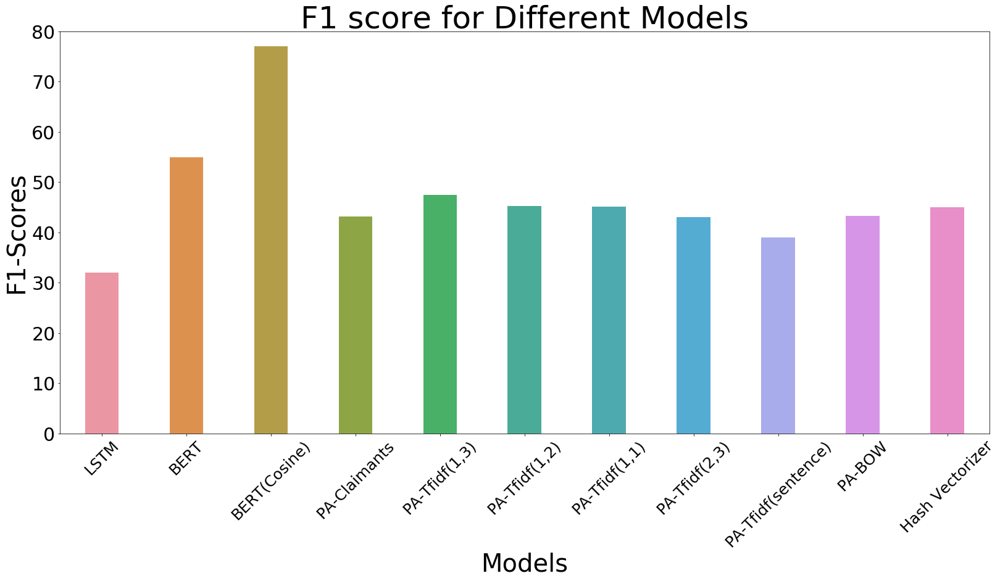

In [0]:
fig, ax = plt.subplots(figsize=(27,12))

sb.barplot(features,scores)
change_width(ax, 0.40)               
plt.xlabel("Models",size=40)
plt.ylabel("F1-Scores",size=40)
plt.xticks(size=25,rotation = 45)
plt.yticks(size=30)
plt.ylim([0, 80])
plt.title("F1 score for Different Models",size=50)


In [0]:
train=[62,76,81.4,62,72.3,65,77.3,74.8,68.2,61.2,70]
test=[54,63,80.9,55,60.1,58,55.2,56.6,53.36,52.8,58]


In [0]:
import pandas as pd
acc=pd.DataFrame({"train":[62,76,81.4,62,72.3,65,77.3,74.8,68.2,61.2,70],"test":[54,63,80.9,55,60.1,58,55.2,56.6,53.36,52.8,58]},
                 index=["LSTM","BERT","BERT(Cosine)","PA-Claimants","PA-Tfidf(1,3)",
                        "PA-Tfidf(1,2)","PA-Tfidf(1,1)","PA-Tfidf(2,3)","PA-Tfidf(sentence)","PA-BOW","Hash Vectorizer"])

In [0]:
acc

,train,test
LSTM,62.0,54.00
BERT,76.0,63.00
BERT(Cosine),81.4,80.90
PA-Claimants,62.0,55.00
"PA-Tfidf(1,3)",72.3,60.10
"PA-Tfidf(1,2)",65.0,58.00
"PA-Tfidf(1,1)",77.3,55.20
"PA-Tfidf(2,3)",74.8,56.60
PA-Tfidf(sentence),68.2,53.36
PA-BOW,61.2,52.80


<Figure size 1440x864 with 0 Axes>

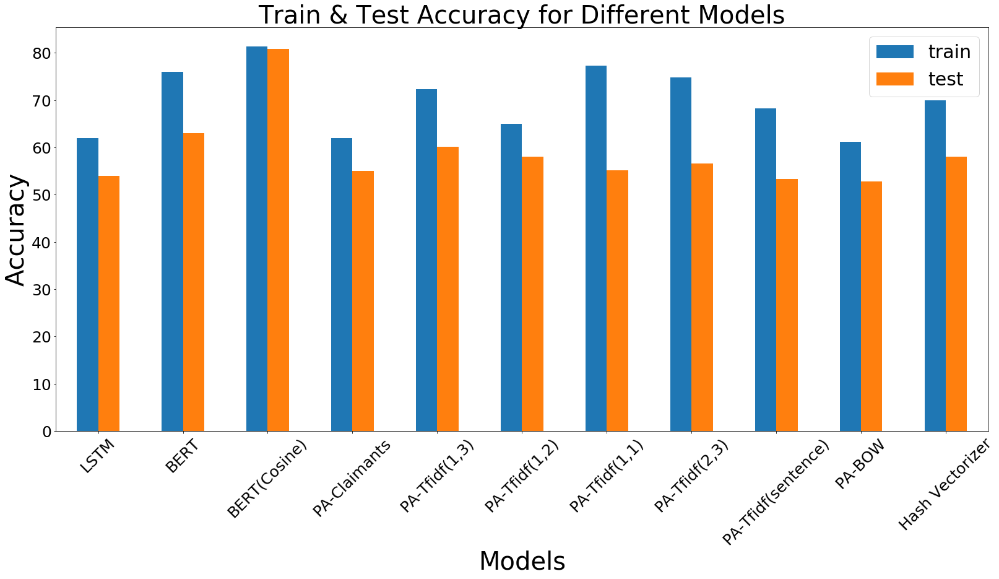

In [0]:
plt.figure(figsize=(20,12))
ax=acc.plot.bar(rot=45,figsize=(27,12),title="Train & Test Accuracy for Different Models",)
ax.set_title("Train & Test Accuracy for Different Models",size=40)
ax.set_xlabel("Models",size=40)
ax.set_ylabel("Accuracy",size=40)

plt.xticks(size=25)
plt.yticks(size=25)
plt.legend(loc="best", prop={'size': 30})

## References

- Leaders Prize: Fact or Fake News? https://leadersprize.truenorthwaterloo.com/en/ [accessed on November 26, 2019)